In [1]:
# 기본 라이브러리
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json

# 그래프 기본 테마 설정
# https://coldbrown.co.kr/2023/07/%ED%8C%8C%EC%9D%B4%EC%8D%AC-%EC%8B%A4%EC%A0%84%ED%8E%B8-08-seaborn-sns-set%EC%9D%84-%ED%86%B5%ED%95%B4-%EC%8A%A4%ED%83%80%EC%9D%BC-%EC%84%A4%EC%A0%95%ED%95%98%EA%B8%B0/
sns.set()

# 그래프 기본 설정
plt.rcParams['font.family'] = 'Malgun Gothic'
# plt.rcParams['font.family'] = 'AppleGothic'
plt.rcParams['figure.figsize'] = 12, 6
plt.rcParams['font.size'] = 14
plt.rcParams['axes.unicode_minus'] = False

# 복잡한 통계 처리를 위한 라이브러리
from scipy import stats

In [2]:
ping=pd.read_csv("Challenger_ping.csv")

In [3]:
nomal_game=ping[~ping['is_replay']] #다시하기 게임들은 날려주고
nomal_ping=nomal_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

In [4]:
nomal_ping=nomal_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

In [5]:
nomal_ping

,win,is_Surrender_aft_25m,is_Early_Surrender,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,False,False,False,0,3,0,4,0,0,0,1,2
1,False,False,False,33,0,0,60,0,9,0,9,1
2,False,False,False,11,15,0,55,1,21,1,17,13
3,False,False,False,0,4,0,10,0,1,0,10,12
4,False,False,False,36,17,0,72,5,20,1,23,36
...,...,...,...,...,...,...,...,...,...,...,...,...
7635,False,False,False,2,1,0,1,0,0,0,2,1
7636,False,False,False,21,4,0,36,2,8,0,8,19
7637,False,False,False,6,0,0,17,0,2,2,10,3
7638,False,False,False,13,3,0,18,0,20,2,10,0


# 목표는 자동화 해서 한방에 끝내기다.

In [208]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pingouin as pg
from scipy.stats import levene
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm
import os
import warnings

# 경고 전체 무시
warnings.filterwarnings('ignore')

# 미리 결과를 저장할 디렉토리 생성
os.makedirs("graph", exist_ok=True)
os.makedirs("corr", exist_ok=True)
os.makedirs("ttest", exist_ok=True)
os.makedirs("logistic", exist_ok=True)

tiers = ['bronze','silver','gold','platinum']
essential_list=['matchId','gameDuration','puuid','win','is_Surrender_aft_25m',
                'is_Early_Surrender','is_replay','teamPosition','championName'
               ]
ping_list_all = ['commandPings', 'getBackPings' , 'holdPings', 'onMyWayPings', 'allInPings', 'assistMePings' ,
             'needVisionPings', 'enemyMissingPings','enemyVisionPings'
            ]

use_list_all= essential_list+ping_list_all
target = 'win'

# 분석 결과 저장용
summary_dict = {}

for tier in tiers:
    #먼저 데이터에 쓸것만 챙겨옵니다.
    print(f'{tier} 시작!',end='\n\n')
    ping=pd.read_csv(f"{tier}_ping.csv")
    nomal_game=ping[~ping['is_replay']] #다시하기 게임들은 날려주고
    nomal_ping=nomal_game[use_list_all]
    nomal_ping['pings'] = nomal_ping['commandPings'] + nomal_ping['getBackPings'] + nomal_ping['holdPings'] + nomal_ping['onMyWayPings'] + nomal_ping['allInPings'] + nomal_ping['assistMePings'] + nomal_ping['needVisionPings'] + nomal_ping['enemyMissingPings'] + nomal_ping['enemyVisionPings']

    #같은 값으로만 채워진 변수가 있으면 이런저런 문제가 발생합니다
    drop_list = []
    ping_list = ping_list_all.copy()
    for ping_ in ping_list:
        if len(nomal_game[ping_].unique()) == 1: 
            drop_list.append(ping_)
            ping_list.pop(ping_list.index(ping_))
    print(f'제거될 단일 값 컬럼 : {drop_list}',end='\n\n')
    nomal_ping.drop(drop_list, axis=1, inplace=True)

    use_list= essential_list+ping_list
    target = 'win'

    
    for use in (ping_list + ['win']):
        #EDA
        sns.histplot(data=nomal_ping, x=use, kde=True)
        plt.savefig(f"graph/{tier}_{use}_hist.png", dpi=300, bbox_inches="tight")
        plt.close()

        #2_val_EDA
        sns.histplot(data=nomal_ping, x="commandPings", hue = 'win', kde=True)
        plt.savefig(f"graph/{tier}_{use}_VS_Win_hist.png", dpi=300, bbox_inches="tight")
        plt.close()
    print(f"{tier} EDA 완료!",end='\n\n')

    #평균 비교 검정 및 상관계수 확인을 위한 전처리
    nomal_test_ping=nomal_ping[ping_list+['pings']]
    temp_list=[]
    for i in nomal_ping['win']: temp_list.append(int(i))
    nomal_test_ping['win'] = temp_list
    
    #상관계수 저장
    corr_ping=nomal_test_ping.corr()
    corr_ping.to_csv(f'corr/{tier}_ping.csv')
    #corr
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_ping, annot=False, cmap="coolwarm")
    plt.savefig(f"graph/{tier}_corr.png", dpi=300, bbox_inches="tight")
    plt.close()

    print(f"{tier} 상관계수 처리 완료!",end='\n\n')
    
    #평균 비교 검정
    ttest_results=[]
    for ping in ping_list:
        if ping not in nomal_test_ping: continue
        #등분산 검정 levene
        stat, p = levene(nomal_test_ping[ping], nomal_test_ping['win'])
        
        correction = p <= 0.05
        win_pings=nomal_test_ping[nomal_test_ping['win'] == 1][ping]
        lose_pings=nomal_test_ping[~(nomal_test_ping['win'] == 1)][ping]
            
        ttest=pg.ttest(win_pings, lose_pings, correction=True)
        ttest['levene_stat'] = stat
        ttest['levene_p'] = p
        ttest['ping_name'] = ping
        ttest_results.append(ttest)        

    ttest_df = pd.concat(ttest_results, ignore_index=True)
    ttest_df.to_csv(f"ttest/{tier}_ttest.csv", index=False)

    print(f"{tier} t-test 완료!",end='\n\n')

    #다중공선성 확인
    X = nomal_test_ping.drop(['win','pings'],axis=1)
    X = add_constant(X)
    vif = pd.DataFrame()
    vif['variable'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif.sort_values(by='VIF',ascending=False)
    vif.to_csv(f'logistic/{tier}_vif.csv', index_label=False)

    print(f"{tier} 다중공선성 확인 완료!",end='\n\n')


    #Logistic_regression
    # 1. X, y 분리
    X = nomal_test_ping.drop(['win','pings'],axis=1)
    X = add_constant(X)
    y = nomal_test_ping['win']
    
    # 2. 모델 적합
    logit_model = sm.Logit(y, X)
    result = logit_model.fit()
    
    # 3. 요약 출력
    summary_df = result.summary2().tables[1]
    summary_df.to_csv(f'logistic/{tier}_logistic_summary.csv', index_label=False)

    print(f"{tier} Logistic_regression 완료!",end='\n\n\n')

print('mission complete!')

bronze 시작!

제거될 단일 값 컬럼 : ['holdPings']

bronze EDA 완료!

bronze 상관계수 처리 완료!

bronze t-test 완료!

bronze 다중공선성 확인 완료!

Optimization terminated successfully.
         Current function value: 0.685903
         Iterations 4
bronze Logistic_regression 완료!


silver 시작!

제거될 단일 값 컬럼 : ['holdPings']

silver EDA 완료!

silver 상관계수 처리 완료!

silver t-test 완료!

silver 다중공선성 확인 완료!

Optimization terminated successfully.
         Current function value: 0.686203
         Iterations 4
silver Logistic_regression 완료!


gold 시작!

제거될 단일 값 컬럼 : ['holdPings']

gold EDA 완료!

gold 상관계수 처리 완료!

gold t-test 완료!

gold 다중공선성 확인 완료!

Optimization terminated successfully.
         Current function value: 0.685743
         Iterations 4
gold Logistic_regression 완료!


platinum 시작!

제거될 단일 값 컬럼 : ['holdPings']

platinum EDA 완료!

platinum 상관계수 처리 완료!

platinum t-test 완료!

platinum 다중공선성 확인 완료!

Optimization terminated successfully.
         Current function value: 0.687263
         Iterations 4
platinum Logistic_regressio

In [194]:
ping_list

['getBackPings',
 'holdPings',
 'onMyWayPings',
 'allInPings',
 'assistMePings',
 'needVisionPings',
 'enemyMissingPings',
 'enemyVisionPings']

<Axes: xlabel='commandPings', ylabel='Count'>

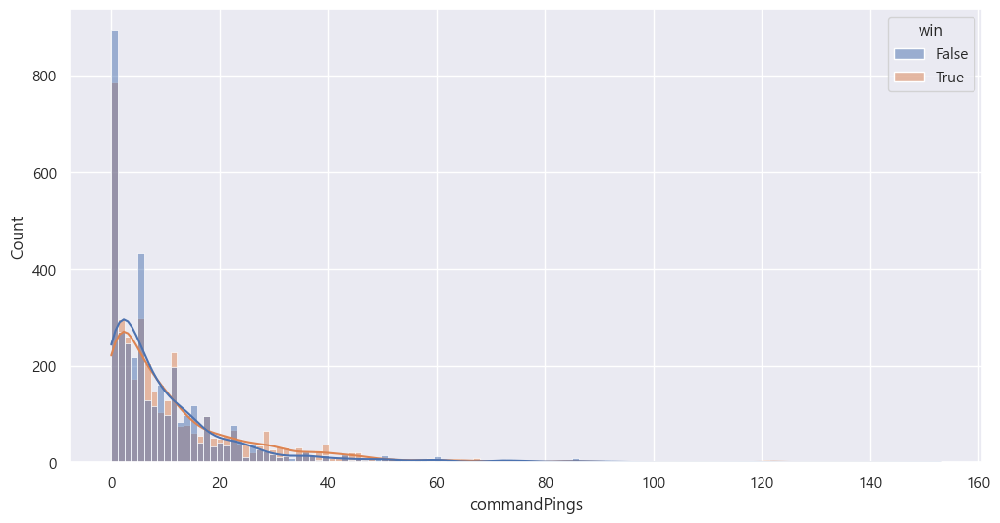

In [139]:
sns.histplot(data=nomal_ping, x="commandPings",hue = 'win' kde=True)

# Challenger

## EDA

### win

In [15]:
nomal_ping['win'].value_counts()

win
True     3821
False    3799
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

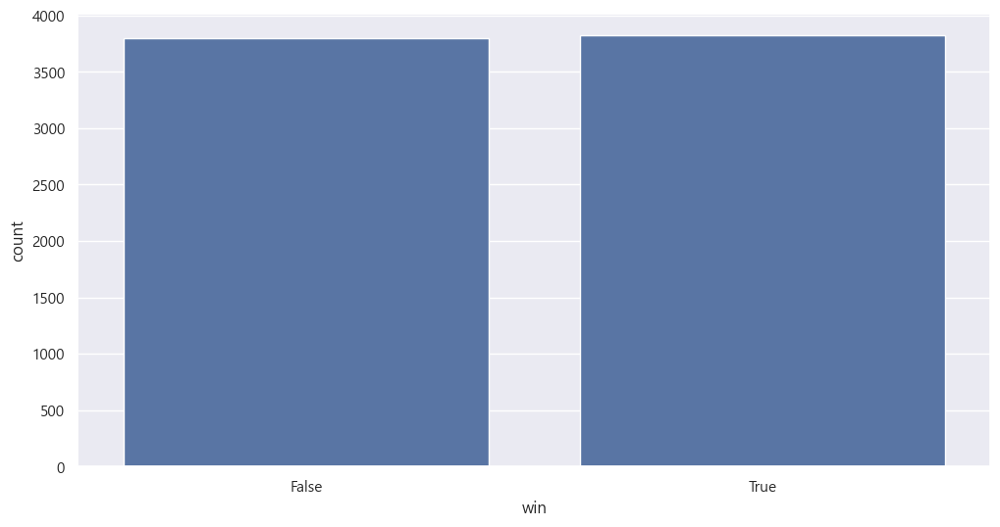

In [29]:
sns.countplot(x=nomal_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [16]:
nomal_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    4050
True     3570
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

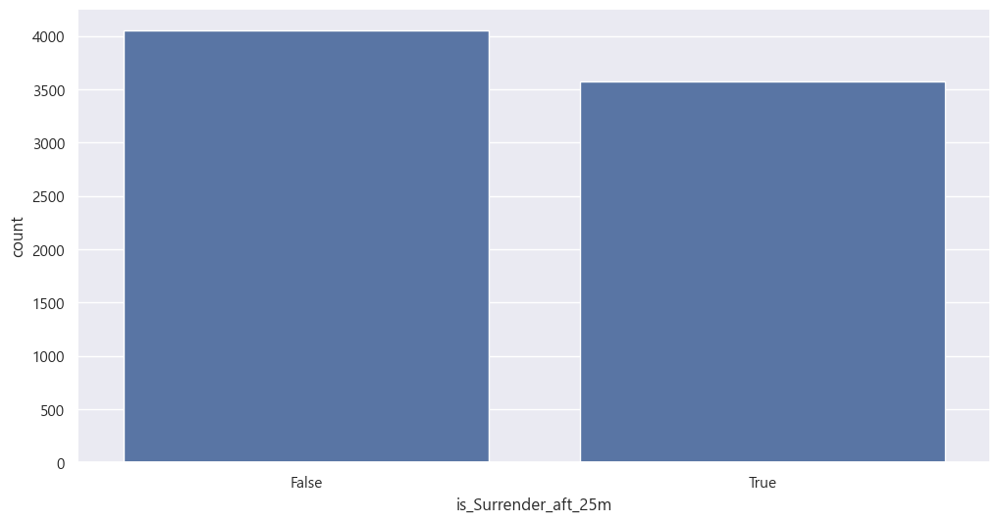

In [31]:
sns.countplot(x=nomal_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [17]:
nomal_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    7620
Name: count, dtype: int64

### 일반 핑

In [18]:
nomal_ping['commandPings'].value_counts()

commandPings
0      1027
1       650
2       568
3       507
4       390
       ... 
95        1
82        1
69        1
100       1
74        1
Name: count, Length: 85, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

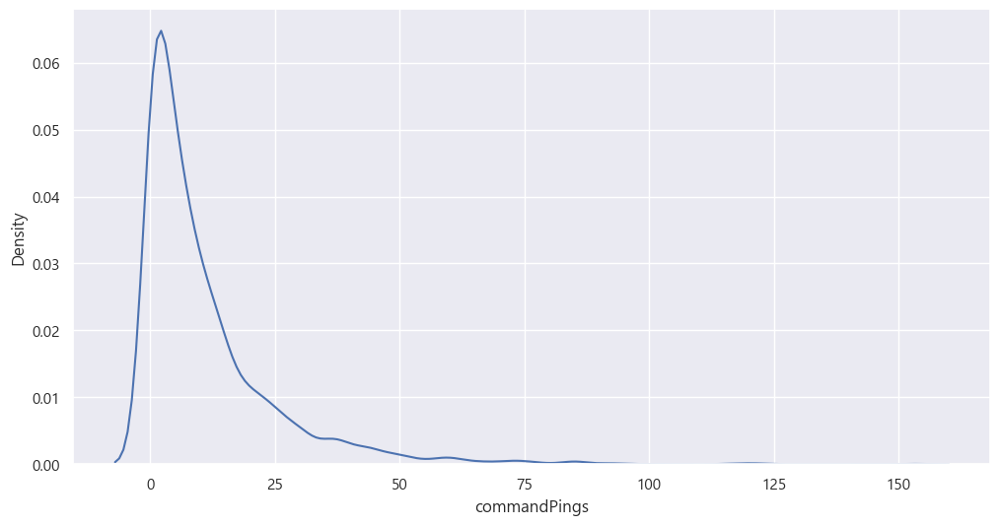

In [32]:
sns.kdeplot(x=nomal_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

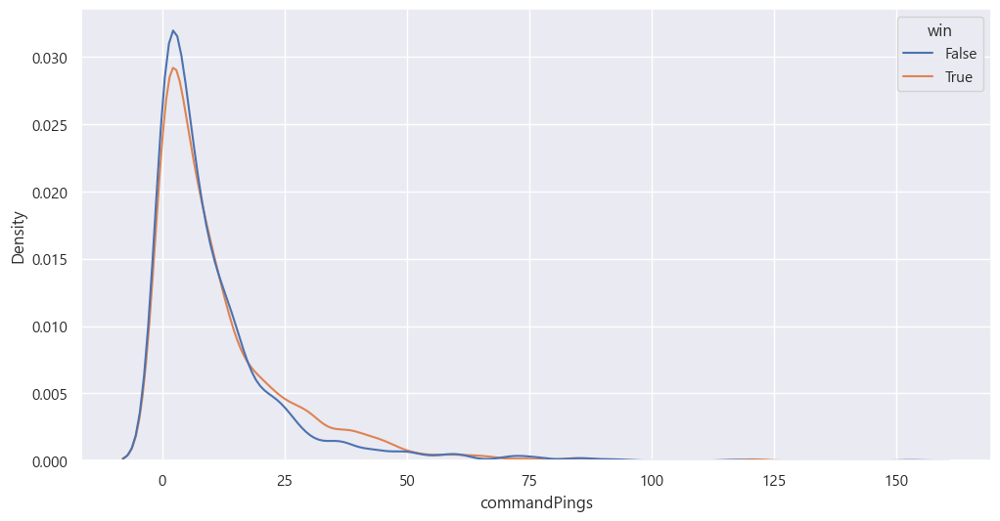

In [41]:
sns.kdeplot(x=nomal_ping['commandPings'],hue=nomal_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [19]:
nomal_ping['getBackPings'].value_counts()

getBackPings
0     2998
1      743
3      518
2      442
4      375
7      278
5      273
6      233
8      209
9      182
11     173
10     120
17      90
12      88
15      82
18      82
13      77
20      76
14      61
16      59
21      53
24      45
25      43
23      42
19      40
26      35
22      28
27      25
28      23
37      22
30      14
29      14
34      13
49       8
32       8
35       7
39       6
52       5
33       5
31       4
59       3
40       3
61       2
60       2
50       2
47       2
53       2
36       2
44       1
38       1
42       1
Name: count, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

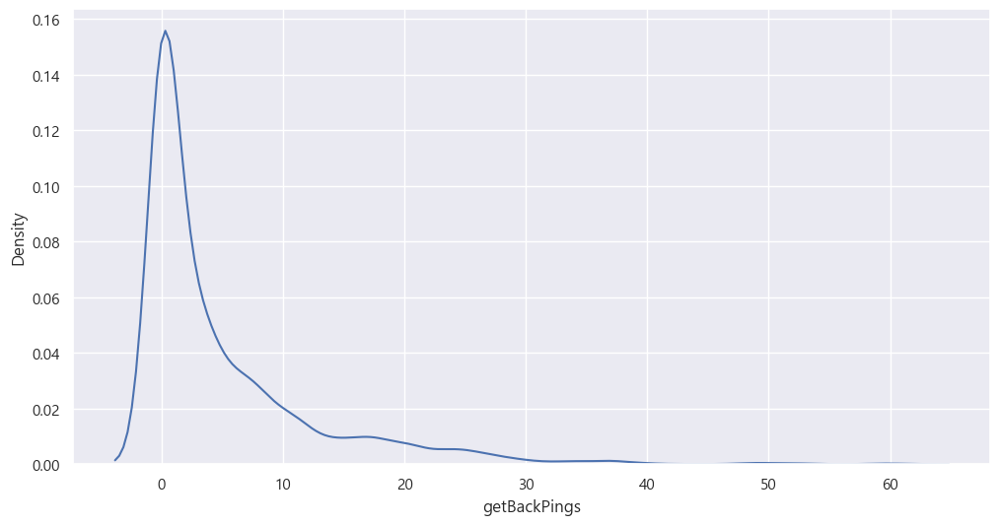

In [33]:
sns.kdeplot(x=nomal_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

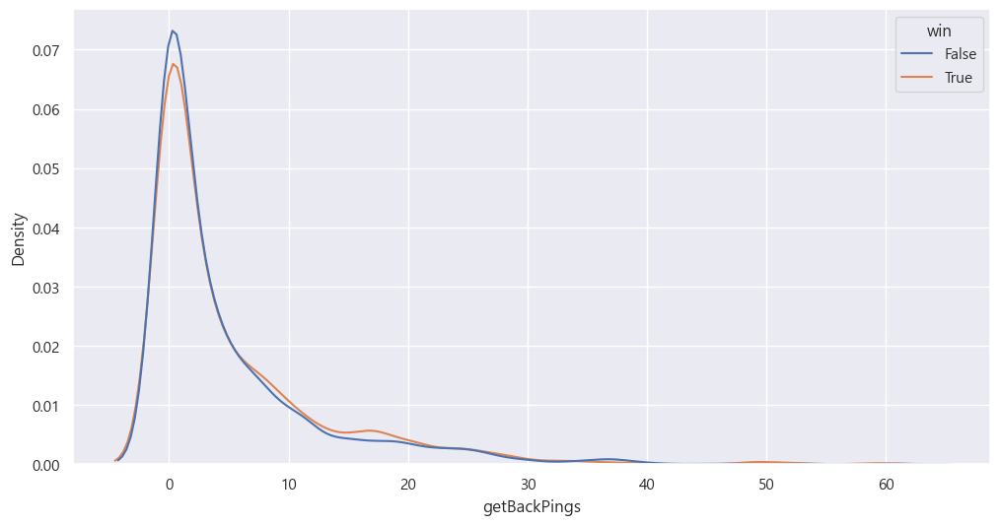

In [42]:
sns.kdeplot(x=nomal_ping['getBackPings'],hue=nomal_ping['win'])

### 압박핑 -> 정작 첼린저급에선 사용된 적이 없음

In [20]:
nomal_ping['holdPings'].value_counts()

holdPings
0    7620
Name: count, dtype: int64

### 가는중 핑

In [21]:
nomal_ping['onMyWayPings'].value_counts()

onMyWayPings
0      1273
1       472
3       313
4       289
2       286
       ... 
151       2
145       2
110       2
198       1
92        1
Name: count, Length: 124, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

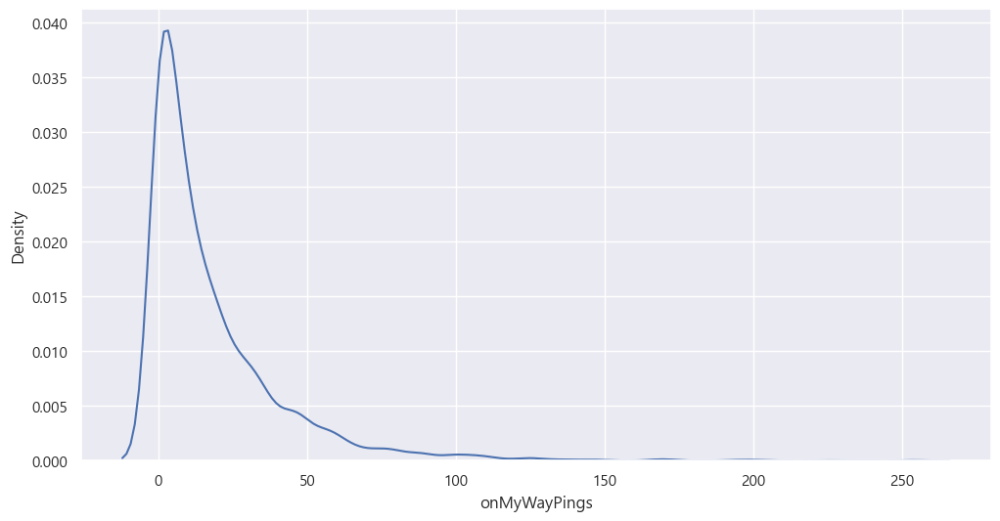

In [34]:
sns.kdeplot(x=nomal_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

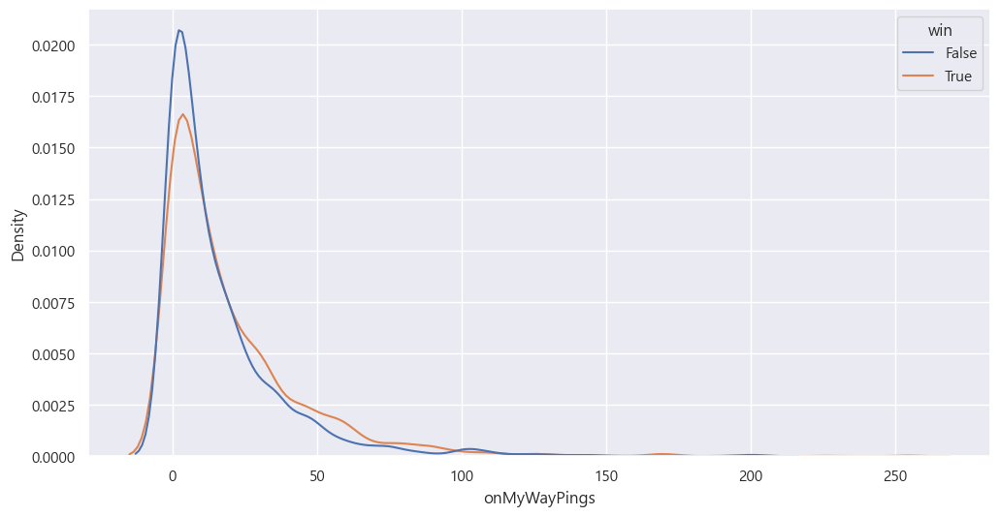

In [43]:
sns.kdeplot(x=nomal_ping['onMyWayPings'],hue=nomal_ping['win'])

### 총공격핑

In [22]:
nomal_ping['allInPings'].value_counts()

allInPings
0     5908
1      857
2      310
3      135
4      118
5       78
6       54
7       39
13      19
11      17
8       17
15      16
9       12
16      11
10      10
18       5
21       5
12       4
17       4
14       1
Name: count, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

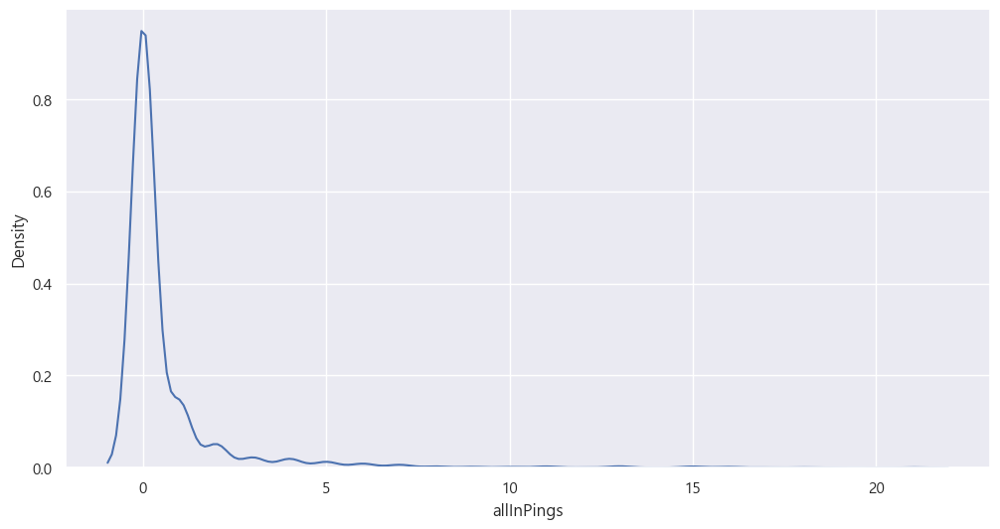

In [35]:
sns.kdeplot(x=nomal_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

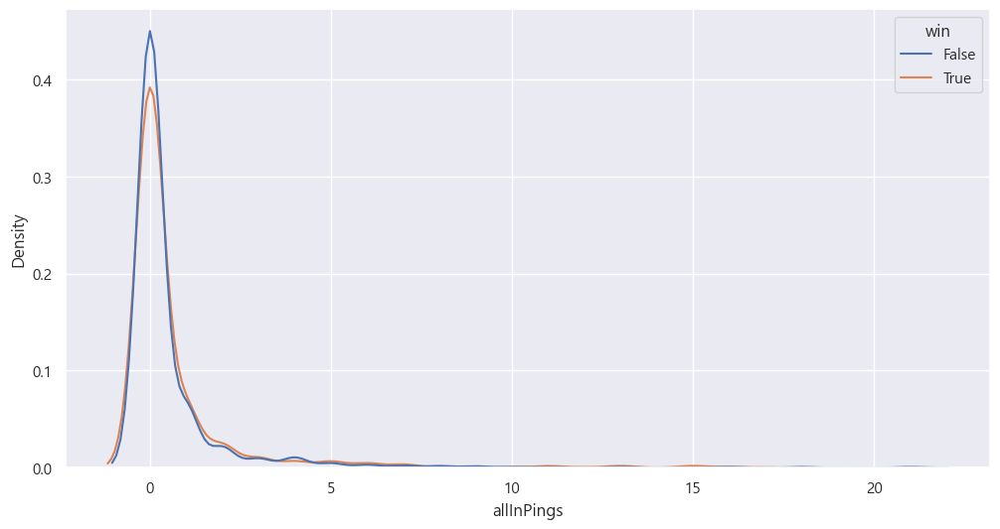

In [44]:
sns.kdeplot(x=nomal_ping['allInPings'],hue=nomal_ping['win'])

### 지원핑

In [23]:
nomal_ping['assistMePings'].value_counts()

assistMePings
0      2995
1       929
2       700
3       578
4       397
5       313
6       209
7       177
8       174
9       147
10      124
14      116
13      103
11       89
15       71
12       58
16       52
21       41
17       35
22       32
20       30
19       28
23       23
18       21
30       21
27       17
25       13
38       13
33       11
37        9
29        8
40        8
89        7
67        7
48        6
53        5
28        5
81        5
36        5
45        5
70        4
46        4
64        3
32        3
68        3
26        3
61        2
94        2
55        2
116       2
39        2
24        1
71        1
51        1
Name: count, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

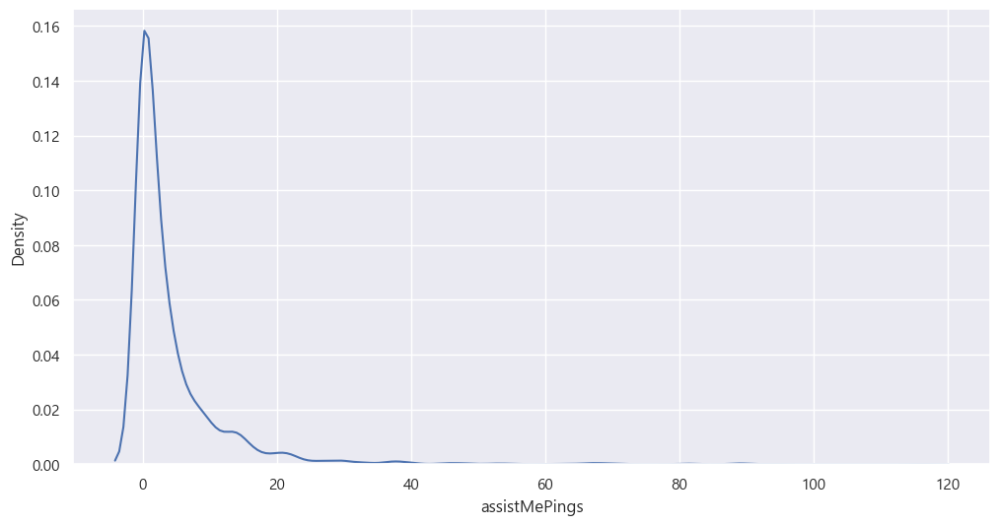

In [36]:
sns.kdeplot(x=nomal_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

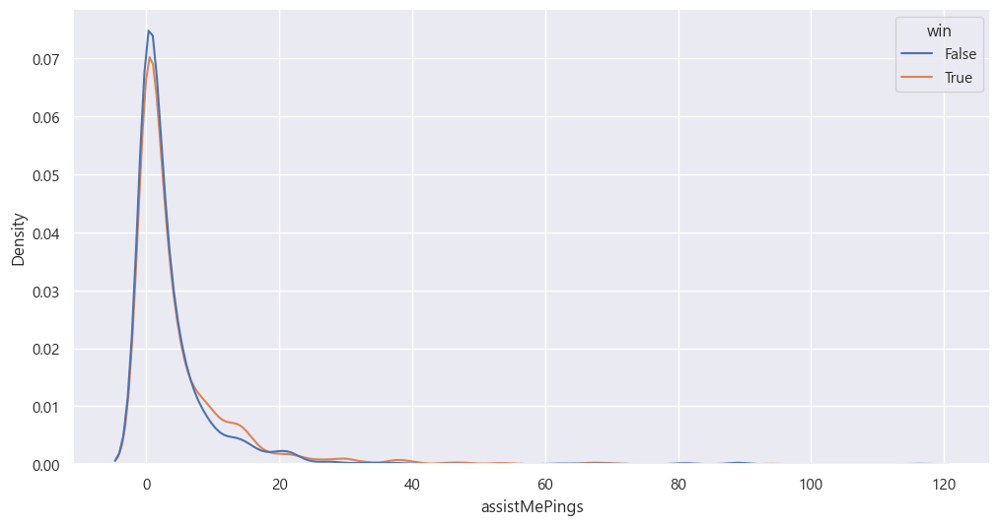

In [45]:
sns.kdeplot(x=nomal_ping['assistMePings'],hue=nomal_ping['win'])

### 시야 필요함 핑

In [24]:
nomal_ping['needVisionPings'].value_counts()

needVisionPings
0     6229
1      886
2      266
3       73
4       48
5       40
6       29
7       21
10      10
9        9
12       6
11       2
13       1
Name: count, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='count'>

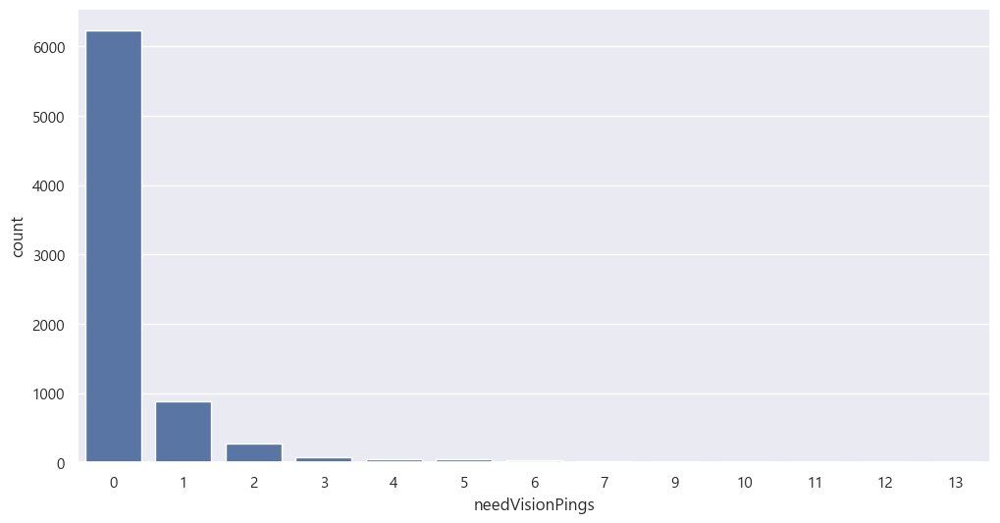

In [38]:
sns.countplot(x=nomal_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='count'>

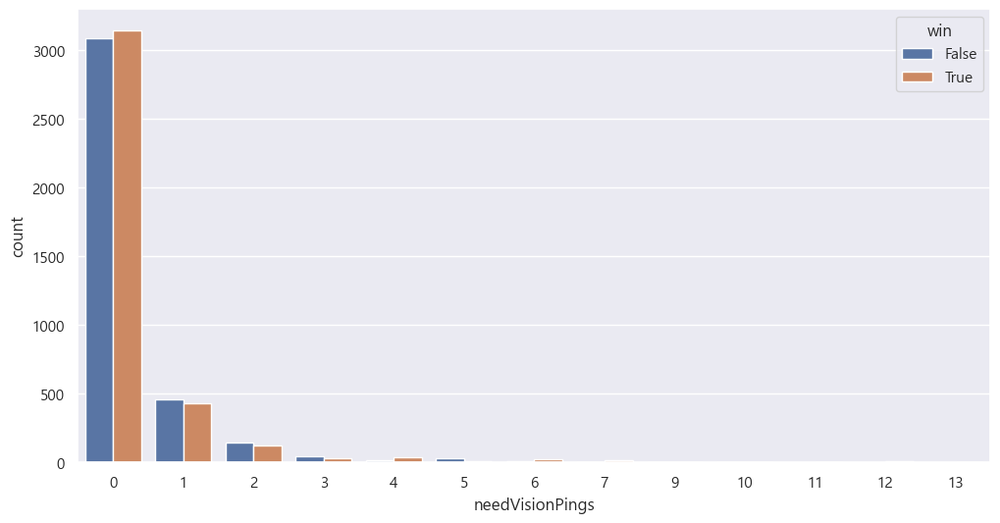

In [46]:
sns.countplot(x=nomal_ping['needVisionPings'],hue=nomal_ping['win'])

### 미아핑

In [25]:
nomal_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0     1421
1      744
2      605
3      513
4      471
6      403
5      346
7      343
9      292
11     251
8      246
10     243
13     179
12     175
17     158
15     155
16     137
14     108
18      96
19      87
23      82
22      67
20      64
21      58
27      45
31      35
24      32
26      32
32      28
30      26
28      25
25      22
42      15
35      14
29      13
33      12
38      11
50       9
40       8
34       8
36       7
45       7
56       6
47       5
37       4
61       3
66       2
48       2
63       2
51       1
54       1
49       1
Name: count, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

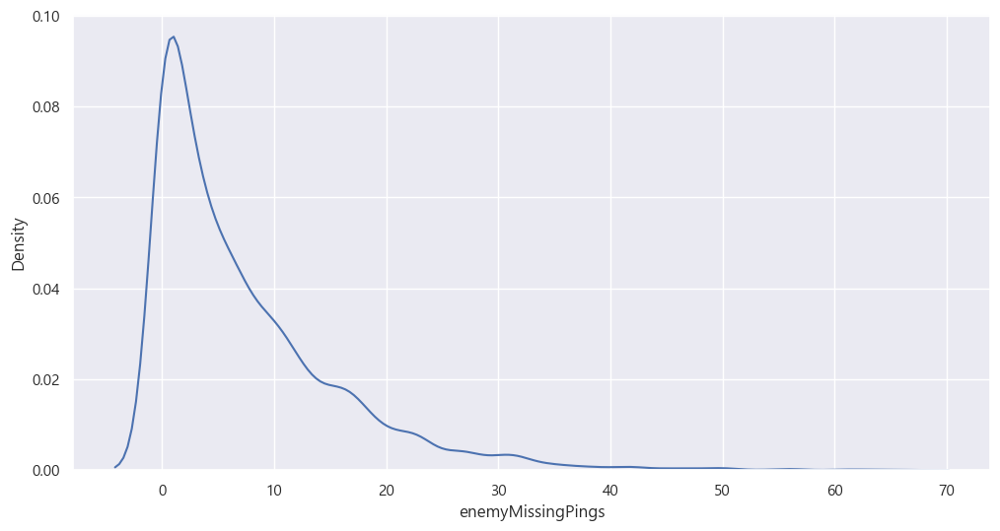

In [39]:
sns.kdeplot(x=nomal_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

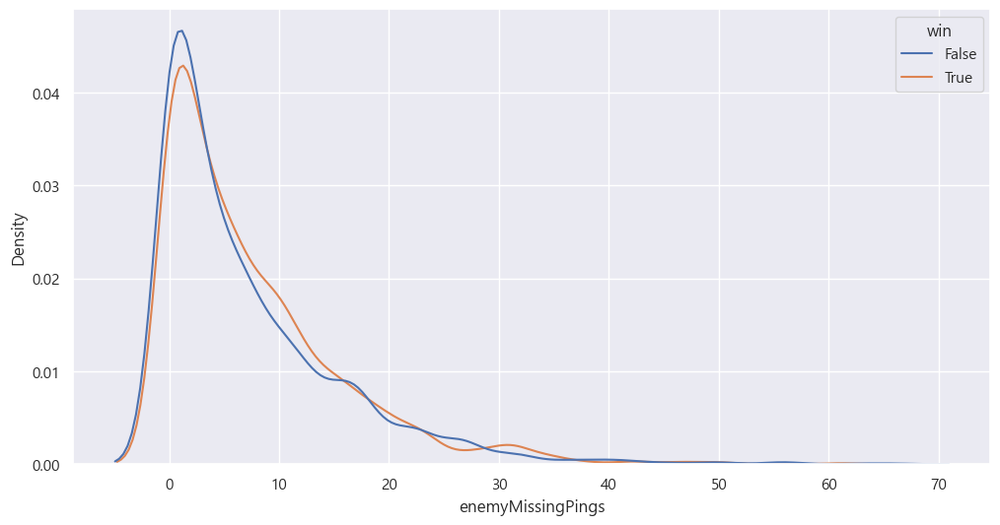

In [47]:
sns.kdeplot(x=nomal_ping['enemyMissingPings'],hue = nomal_ping['win'])

### 적 와드 / 시야핑

In [26]:
nomal_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0     2531
1      825
2      661
3      545
5      412
4      386
6      289
7      252
8      196
9      158
11     154
10     149
13     117
14     108
15     101
12      99
16      82
18      69
19      62
24      45
22      45
17      44
23      42
21      34
26      26
20      25
27      19
25      15
36      14
32      13
42      12
31      11
34      11
29      11
33       9
30       8
43       7
51       6
28       5
38       4
35       4
41       4
47       3
48       2
46       2
44       2
37       1
Name: count, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

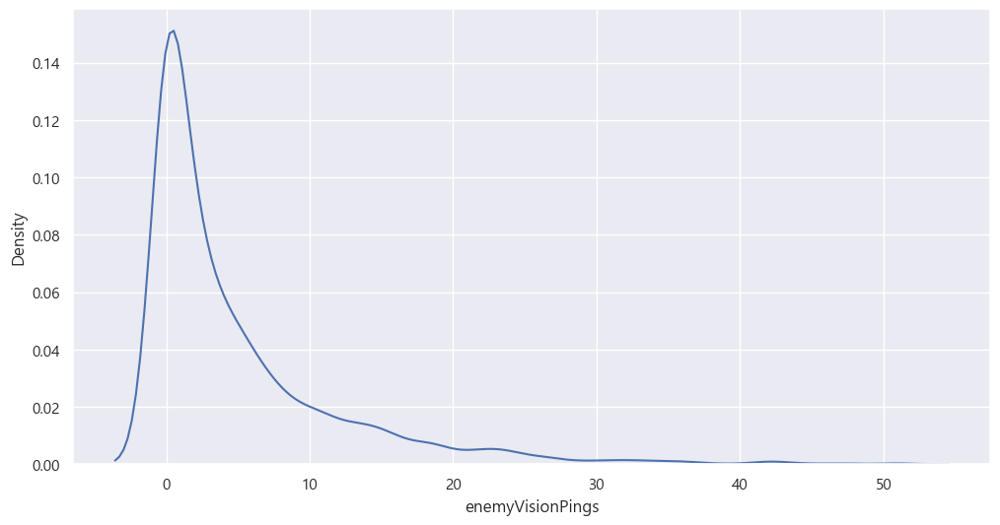

In [40]:
sns.kdeplot(x=nomal_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

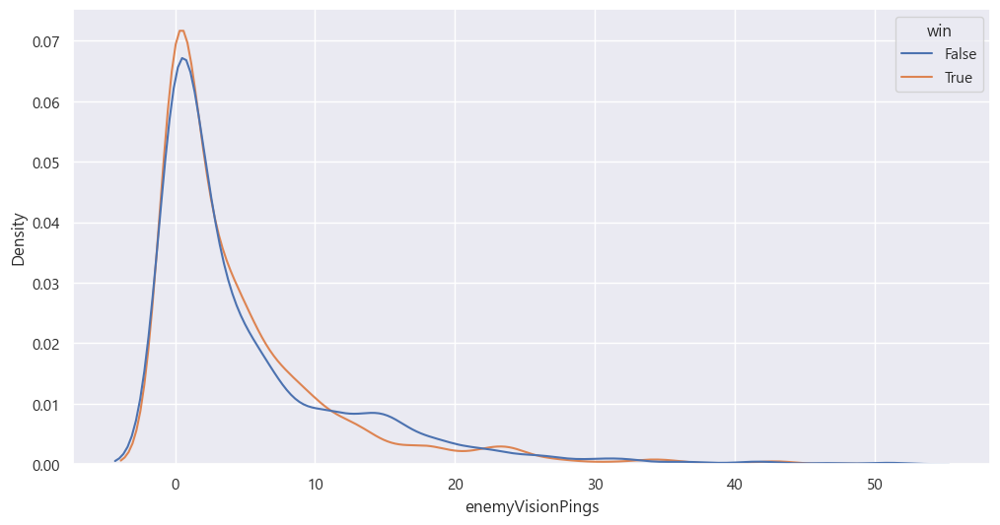

In [48]:
sns.kdeplot(x=nomal_ping['enemyVisionPings'],hue=nomal_ping['win'])

In [27]:
eval('1+1')

2

In [53]:
nomal_ping['win'] = [1 if else 0]

ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [57]:
nomal_ping['win'].to_list()

[False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 Fal

In [58]:
temp_list=[]
for i in temp:
    temp_list.append(int(i))
nomal_ping['win'] = temp_list

In [59]:
nomal_ping['win'] = temp_list

C:\Users\sherm\AppData\Local\Temp\ipykernel_20760\1491921291.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nomal_ping['win'] = temp_list


In [63]:
nomal_ping

,win,is_Surrender_aft_25m,is_Early_Surrender,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,0,False,False,0,3,0,4,0,0,0,1,2
1,0,False,False,33,0,0,60,0,9,0,9,1
2,0,False,False,11,15,0,55,1,21,1,17,13
3,0,False,False,0,4,0,10,0,1,0,10,12
4,0,False,False,36,17,0,72,5,20,1,23,36
...,...,...,...,...,...,...,...,...,...,...,...,...
7635,0,False,False,2,1,0,1,0,0,0,2,1
7636,0,False,False,21,4,0,36,2,8,0,8,19
7637,0,False,False,6,0,0,17,0,2,2,10,3
7638,0,False,False,13,3,0,18,0,20,2,10,0


## 핑과 승패사이의 상관관계를 봐봅시다.

In [35]:
nomal_ping['pings'] = nomal_ping['commandPings'] + nomal_ping['getBackPings'] + nomal_ping['holdPings'] + nomal_ping['onMyWayPings'] + nomal_ping['allInPings'] + nomal_ping['assistMePings'] + nomal_ping['needVisionPings'] + nomal_ping['enemyMissingPings'] + nomal_ping['enemyVisionPings']

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\3157007445.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nomal_ping['pings'] = nomal_ping['commandPings'] + nomal_ping['getBackPings'] + nomal_ping['holdPings'] + nomal_ping['onMyWayPings'] + nomal_ping['allInPings'] + nomal_ping['assistMePings'] + nomal_ping['needVisionPings'] + nomal_ping['enemyMissingPings'] + nomal_ping['enemyVisionPings']


In [36]:
nomal_test_ping=nomal_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

In [8]:
corr_ping=nomal_test_ping.corr()
corr_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
win,1.000000,0.052939,0.030445,0.082391,0.032898,0.048264,0.014181,0.024433,-0.037712
commandPings,0.052939,1.000000,0.371911,0.612112,0.341625,0.468995,0.216932,0.415842,0.283176
getBackPings,0.030445,0.371911,1.000000,0.512833,0.263952,0.396338,0.404666,0.451096,0.380446
onMyWayPings,0.082391,0.612112,0.512833,1.000000,0.369019,0.613817,0.332409,0.456265,0.318634
allInPings,0.032898,0.341625,0.263952,0.369019,1.000000,0.243519,0.242502,0.216792,0.128836
assistMePings,0.048264,0.468995,0.396338,0.613817,0.243519,1.000000,0.315938,0.354829,0.222668
needVisionPings,0.014181,0.216932,0.404666,0.332409,0.242502,0.315938,1.000000,0.291373,0.230767
enemyMissingPings,0.024433,0.415842,0.451096,0.456265,0.216792,0.354829,0.291373,1.000000,0.383403
enemyVisionPings,-0.037712,0.283176,0.380446,0.318634,0.128836,0.222668,0.230767,0.383403,1.000000


In [144]:
type(corr_ping)

pandas.core.frame.DataFrame

<Axes: >

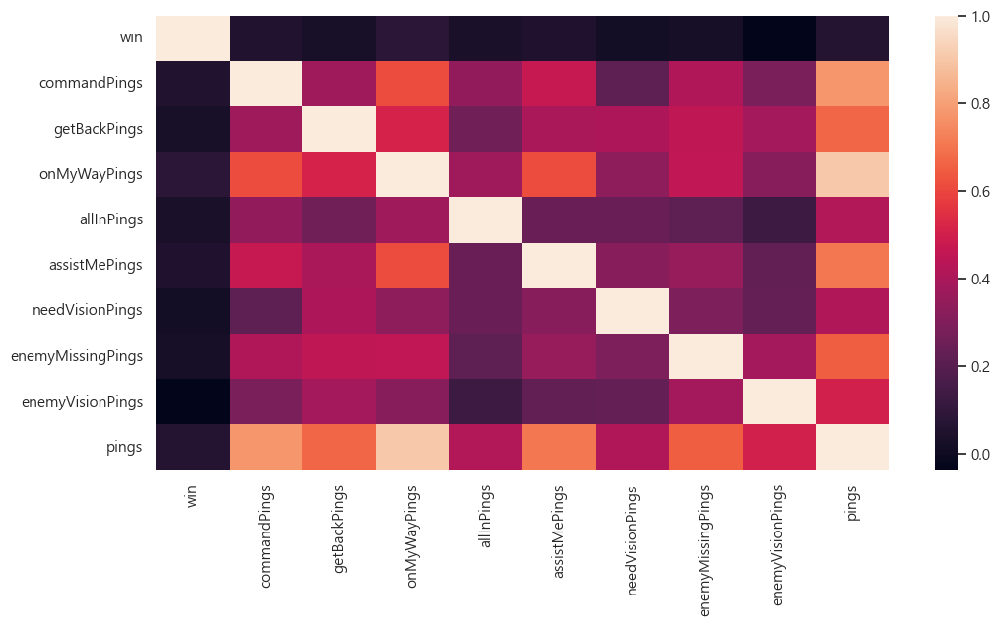

In [10]:
sns.heatmap(corr_ping)

- 봤더니 다른 핑들과는 상관관계가 큰편인데 정작 승패 유무와는 매우 관련이 없는 아이러니한 그림이 그려짐

## 두 분포가 유의미한 차이를 보이는지가 궁금해요

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [79]:
from scipy.stats import levene

stat, p = levene(nomal_test_ping['pings'], nomal_test_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 6098.437, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [13]:
win_pings=nomal_test_ping[nomal_test_ping['win'] == 1]['pings']
lose_pings=nomal_test_ping[~(nomal_test_ping['win'] == 1)]['pings']

In [90]:
from scipy.stats import ttest_ind
t_stat, p_val = ttest_ind(win_pings, lose_pings, equal_var=False)
print(f"T-test result: t = {t_stat:.3f}, p = {p_val:.4f}")

T-test result: t = 5.473, p = 0.0000


- p-value == 0 이므로 귀무가설 기각 승패 간의 핑 갯수는 차이가 있다고 볼 수 있다

In [14]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,5.473425,7593.853502,two-sided,4.555051e-08,"[4.32, 9.15]",0.125382,7.802e+04,0.999777


| 항목              | 설명                     |  해석                                         |
| --------------- | ---------------------- | ---------------------------------------------------- |
| **T**           | t-statistic (검정통계량)    | **5.47** → 평균 차이가 상당히 명확함                            |
| **dof**         | 자유도 (Welch 방식)         | **7593.85** → 큰 표본 기반에서 안정적인 검정                      |
| **alternative** | 대립가설 방향                | `'two-sided'` → 양측 검정                                |
| **p-val**       | p-value                | **4.56e-08** → **귀무가설 기각! → 차이 있음**                  |
| **CI95%**       | 평균 차이의 95% 신뢰구간        | **\[4.32, 9.15]** → 평균 차이가 4.32\~9.15 안에 있음          |
| **cohen-d**     | 효과 크기                  | **0.125** → **작은 효과 크기** (차이는 있지만 작다)                |
| **BF10**        | 베이지안 요인 (Bayes Factor) | **7.8만 이상** → 귀무가설에 비해 대립가설이 **매우 강하게 지지됨**          |
| **power**       | 검정력 (1 - β)            | **0.9997** → **거의 100% 검정력**, 즉 실제 차이를 감지할 확률이 매우 높음 |


In [11]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(nomal_test_ping[ping], nomal_test_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    if p <= 0.05: correction_ = True
    else: correction_ = False
    win_pings=nomal_test_ping[nomal_test_ping['win'] == 1][ping]
    lose_pings=nomal_test_ping[~(nomal_test_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 3596.596, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.627398,7615.265405,two-sided,0.000004,"[0.86, 2.12]",0.106013,1112.577,0.996168



getBackPings
Levene’s test: stat = 3093.860, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.658952,7595.90467,two-sided,0.007855,"[0.12, 0.81]",0.06091,0.878,0.757474



onMyWayPings
Levene’s test: stat = 3840.267, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.218878,7454.460288,two-sided,5.759062e-13,"[2.89, 5.04]",0.165322,4.657e+09,1.0



allInPings
Levene’s test: stat = 37.139, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.873836,7531.185779,two-sided,0.004067,"[0.04, 0.21]",0.065823,1.589,0.819267



assistMePings
Levene’s test: stat = 1506.391, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.217502,7617.889377,two-sided,0.000025,"[0.42, 1.16]",0.096629,183.06,0.987995



needVisionPings
Levene’s test: stat = 129.048, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.238518,7350.010309,two-sided,0.215564,"[-0.02, 0.08]",0.02836,0.056,0.235746



enemyMissingPings
Levene’s test: stat = 5373.636, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.132911,7604.201461,two-sided,0.032964,"[0.03, 0.79]",0.048873,0.25,0.568658



enemyVisionPings
Levene’s test: stat = 3110.234, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-3.292928,7535.261143,two-sided,0.000996,"[-0.85, -0.22]",0.075468,5.761,0.908815


In [168]:
test=pg.ttest(win_pings, lose_pings, correction=True)
test.index=['temp']

In [169]:
test

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
temp,3.339532,77307.748447,two-sided,0.00084,"[0.03, 0.1]",0.024009,2.139,0.916134


In [12]:
temp=pg.ttest(win_pings, lose_pings, correction=True)

In [13]:
temp['T']

T-test   -3.292928
Name: T, dtype: float64

In [15]:
nomal_test_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,False,0,3,4,0,0,0,1,2,10
1,False,33,0,60,0,9,0,9,1,112
2,False,11,15,55,1,21,1,17,13,134
3,False,0,4,10,0,1,0,10,12,37
4,False,36,17,72,5,20,1,23,36,210
...,...,...,...,...,...,...,...,...,...,...
7635,False,2,1,1,0,0,0,2,1,7
7636,False,21,4,36,2,8,0,8,19,98
7637,False,6,0,17,0,2,2,10,3,40
7638,False,13,3,18,0,20,2,10,0,66


## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

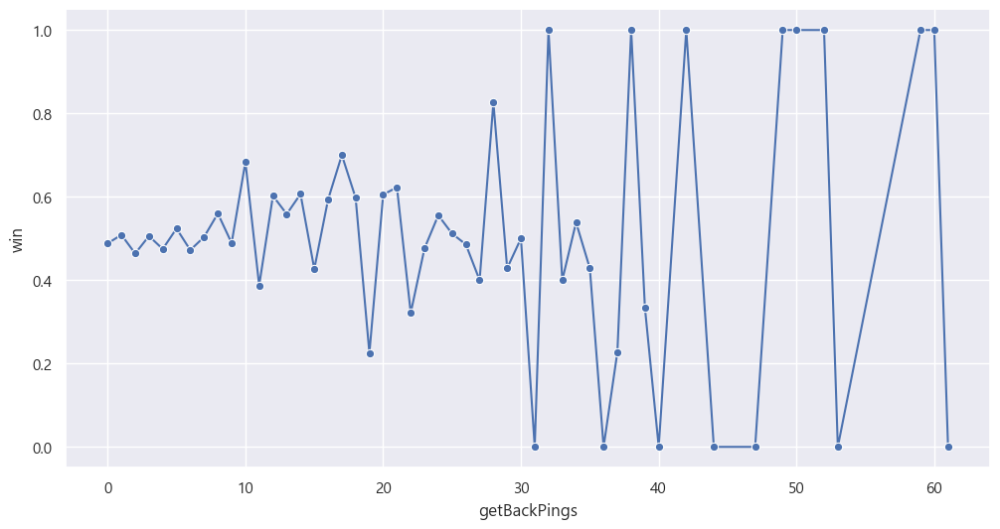

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = nomal_test_ping.groupby('getBackPings')['win'].mean().reset_index()

sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()



<Axes: xlabel='getBackPing_group', ylabel='win'>

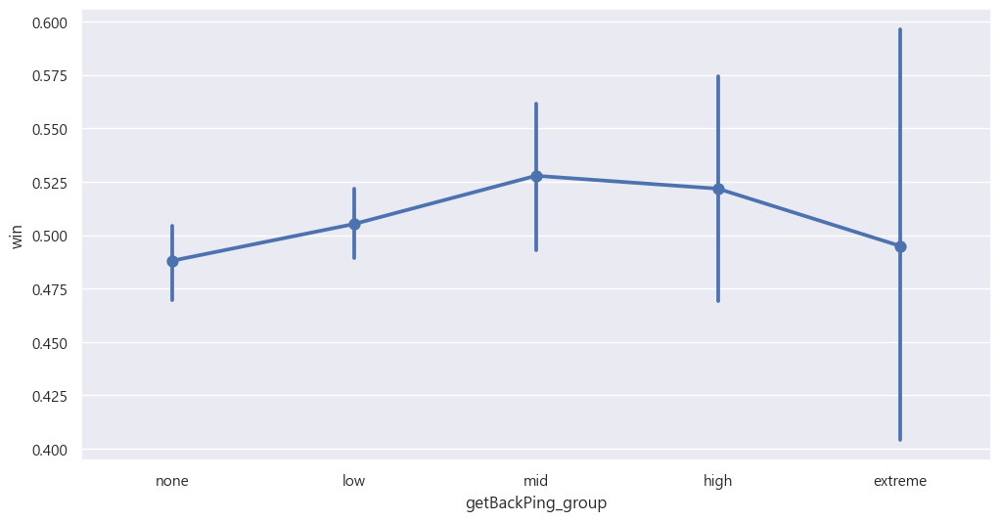

In [54]:
bins = [-1, 0, 10, 20, 30, float('inf')]
labels = ['none', 'low', 'mid', 'high', 'extreme']

nomal_test_ping['getBackPing_group'] = pd.cut(nomal_test_ping['getBackPings'], bins=bins, labels=labels)


sns.pointplot(x='getBackPing_group', y='win', data=nomal_test_ping)

In [38]:
nomal_test_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,False,0,3,4,0,0,0,1,2,10
1,False,33,0,60,0,9,0,9,1,112
2,False,11,15,55,1,21,1,17,13,134
3,False,0,4,10,0,1,0,10,12,37
4,False,36,17,72,5,20,1,23,36,210
...,...,...,...,...,...,...,...,...,...,...
7635,False,2,1,1,0,0,0,2,1,7
7636,False,21,4,36,2,8,0,8,19,98
7637,False,6,0,17,0,2,2,10,3,40
7638,False,13,3,18,0,20,2,10,0,66


In [19]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = nomal_test_ping.drop(['win','pings'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [23]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
3,onMyWayPings,2.371230
0,const,2.125427
1,commandPings,1.743708
5,assistMePings,1.691997
2,getBackPings,1.647088
7,enemyMissingPings,1.497507
6,needVisionPings,1.278261
8,enemyVisionPings,1.271862
4,allInPings,1.214116


In [25]:
import statsmodels.api as sm

# 1. X, y 분리
X = nomal_test_ping.drop(['win','pings'],axis=1)
y = nomal_test_ping['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary2())

Optimization terminated successfully.
         Current function value: 0.687516
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:                 7620
Model:                          Logit   Df Residuals:                     7612
Method:                           MLE   Df Model:                            7
Date:                Mon, 28 Jul 2025   Pseudo R-squ.:                0.008118
Time:                        17:12:33   Log-Likelihood:                -5238.9
converged:                       True   LL-Null:                       -5281.7
Covariance Type:            nonrobust   LLR p-value:                 9.171e-16
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
commandPings          0.0011      0.002      0.500      0.617      -0.003       0.005
getBackP

In [172]:
print(result.summary2().tables[1])

                      Coef.  Std.Err.          z          P>|z|    [0.025  \
commandPings       0.009229  0.001030   8.963593   3.142665e-19  0.007211   
getBackPings      -0.010137  0.001474  -6.879090   6.023600e-12 -0.013025   
onMyWayPings       0.020615  0.000941  21.915607  1.844206e-106  0.018772   
allInPings        -0.006929  0.006358  -1.089820   2.757924e-01 -0.019392   
assistMePings     -0.003918  0.001712  -2.288793   2.209138e-02 -0.007273   
needVisionPings   -0.002574  0.006284  -0.409558   6.821301e-01 -0.014890   
enemyMissingPings -0.023842  0.001263 -18.880258   1.657733e-79 -0.026317   
enemyVisionPings   0.006198  0.002921   2.121698   3.386307e-02  0.000472   

                     0.975]  
commandPings       0.011247  
getBackPings      -0.007249  
onMyWayPings       0.022459  
allInPings         0.005533  
assistMePings     -0.000563  
needVisionPings    0.009743  
enemyMissingPings -0.021367  
enemyVisionPings   0.011923  


- Pseudo R-squ.: 0.008118 -> 설명력 0.8%(설명력 없음)
- LL-Null: -5281.7 / Log-Likelihood:-5238.9 => 개선 정도가 거의 없음
- 유의한 변수는 onMyWayPings / enemyVisionPings 오직 2개 각각 양의 방향으로 음의 방향으로 영향을 주긴함

- 여기서 다시 생각해보면 로그비로 1%면 상당히 큰 숫자인게 다른 요인을 아무것도 고려하지 않고 핑을 찍는 행위만 고려해서 1%의 승률이 올라간다면 이건 상당히 큰 수치일 수도 있음

In [26]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score

X = nomal_test_ping.drop(['win','pings'],axis=1)
y = nomal_test_ping['win']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))
print('ROC AUC:', roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))

              precision    recall  f1-score   support

       False       0.84      0.84      0.84      1171
        True       0.83      0.83      0.83      1115

    accuracy                           0.83      2286
   macro avg       0.83      0.83      0.83      2286
weighted avg       0.83      0.83      0.83      2286

ROC AUC: 0.9381732680281695


In [29]:
import shap

# explainer 생성
explainer = shap.TreeExplainer(model)  # model은 학습된 RandomForestClassifier
shap_values = explainer.shap_values(X)  # X는 학습 또는 테스트 데이터의 feature만

AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

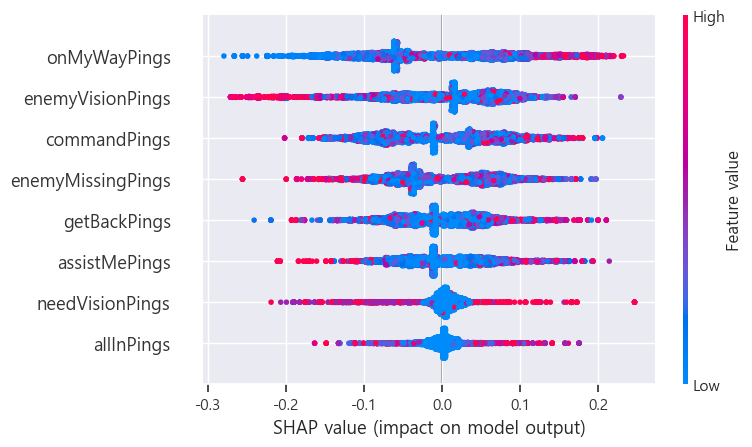

In [41]:
shap.summary_plot(shap_values[:,:,1], X)  # 이진 분류인 경우 클래스 1에 대해 시각화

# 에-플-다

In [17]:
emerald_ping=pd.read_csv('emerald_ping.csv')
platinum_ping=pd.read_csv("platinum_ping.csv")
diamond_ping=pd.read_csv("diamond_ping.csv")

In [18]:
mid_tier_ping = pd.concat([emerald_ping, platinum_ping])
mid_tier_ping = pd.concat([mid_tier_ping, diamond_ping])

In [19]:
mid_tier_ping

,matchId,blue/red,gameDuration,puuid,win,is_Surrender_aft_25m,is_Early_Surrender,is_replay,teamPosition,championName,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,7713876857,True,1702,Sxo5qlnrSRkWDMPZoTS8GM40BnO2xIo7ZAlpiqdFX_a-e4...,False,False,False,False,TOP,Poppy,2,5,0,1,0,0,0,2,0
1,7713876857,True,1702,YoKIZ5D02_GGtWtnLnmannOul4aFkkrtk7WC3IY2ZNTh25...,False,False,False,False,JUNGLE,Nidalee,27,37,0,22,0,2,1,2,2
2,7713876857,True,1702,01iaR4OhACWM-tW-ojrZnB5cQHw6FlHXwx1OylsDL3zs2Z...,False,False,False,False,MIDDLE,Yone,3,5,0,14,0,5,0,7,0
3,7713876857,True,1702,vlehzRySr3MXJtVWIeV5WjViqKxF-Eo1muYRVvwxMdhZhr...,False,False,False,False,BOTTOM,Aphelios,5,4,0,6,1,5,0,4,0
4,7713876857,True,1702,CUHnRxRDHXwUPb94Q_gBJdtSc9QnAFV5ZpZw2RPhrVTAEo...,False,False,False,False,UTILITY,Braum,7,0,0,3,0,2,0,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31815,7720387948,False,1541,YRPVB6XcDilwDTRjfsUd5POILLDEZ6MPNpdIpfMRLB6M5L...,True,False,False,False,TOP,Irelia,9,1,0,3,1,2,0,0,0
31816,7720387948,False,1541,sSrES3rtIqccSPkjwYxFNByAdCUR6VSKRsaTAuxCChPDWF...,True,False,False,False,JUNGLE,Trundle,11,6,0,25,0,9,0,5,1
31817,7720387948,False,1541,8OUJXBmIvIGCfoSh2hbLJ-CMVDizmhyuys4_1NwxBtQ82y...,True,False,False,False,MIDDLE,Azir,3,22,0,21,0,16,1,5,3
31818,7720387948,False,1541,TRG8g8A0TvtW5iON60ypWfl3Tt8HDiSznQGFwXx1hShDKK...,True,False,False,False,BOTTOM,AurelionSol,9,9,0,15,0,2,0,0,1


In [20]:
mid_tier_game=mid_tier_ping[~mid_tier_ping['is_replay']] #다시하기 게임들은 날려주고
mid_tier_ping=mid_tier_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings',
                         'onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

## EDA

### win

In [136]:
low_tier_ping['win'].value_counts()

win
False    156050
True     156050
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

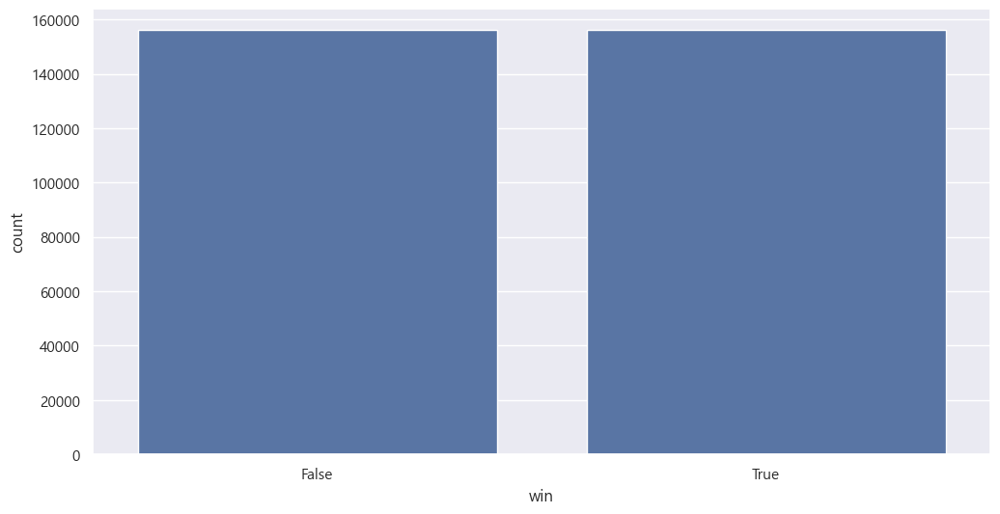

In [137]:
sns.countplot(x=low_tier_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [138]:
low_tier_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    178180
True     133920
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

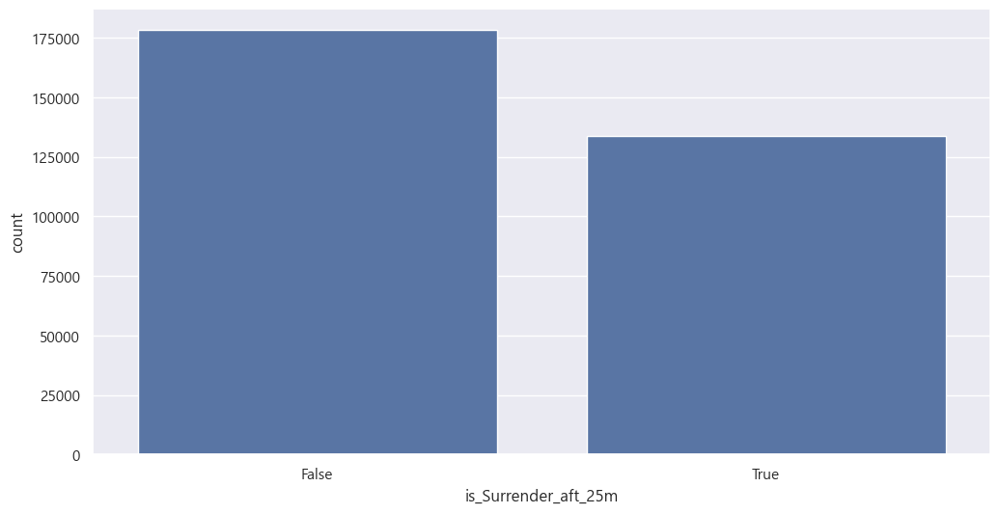

In [139]:
sns.countplot(x=low_tier_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [141]:
low_tier_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    312100
Name: count, dtype: int64

### 일반 핑

In [142]:
low_tier_ping['commandPings'].value_counts()

commandPings
0      76739
1      34329
2      27474
3      23967
4      20018
       ...  
96         1
119        1
143        1
139        1
145        1
Name: count, Length: 127, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

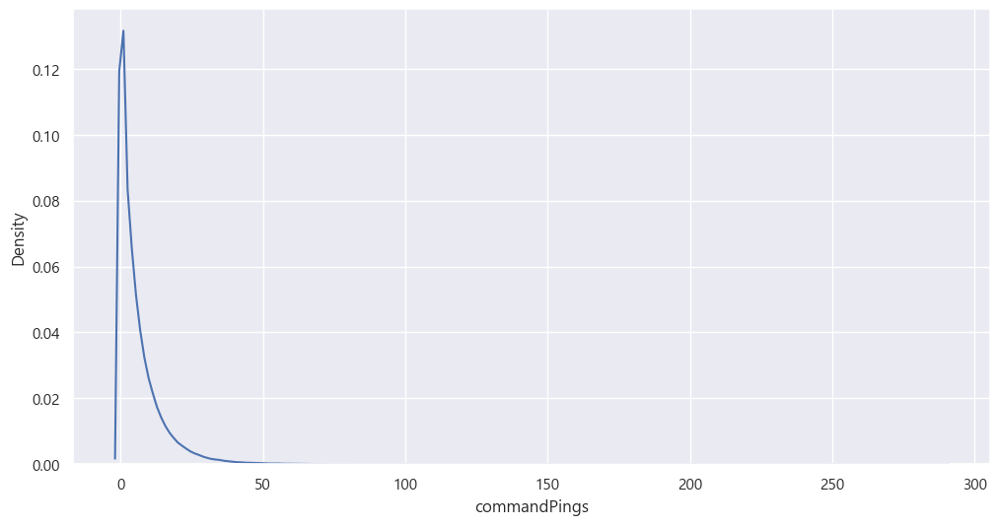

In [143]:
sns.kdeplot(x=low_tier_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

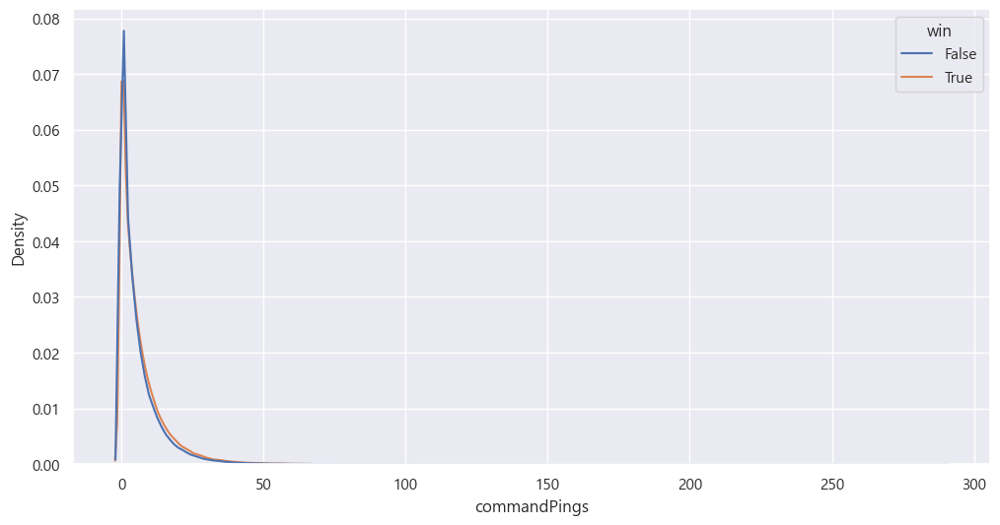

In [144]:
sns.kdeplot(x=low_tier_ping['commandPings'],hue=low_tier_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [146]:
low_tier_ping['getBackPings'].value_counts()

getBackPings
0      146157
1       38332
2       24957
3       18755
4       14840
        ...  
90          1
94          1
109         1
102         1
77          1
Name: count, Length: 95, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

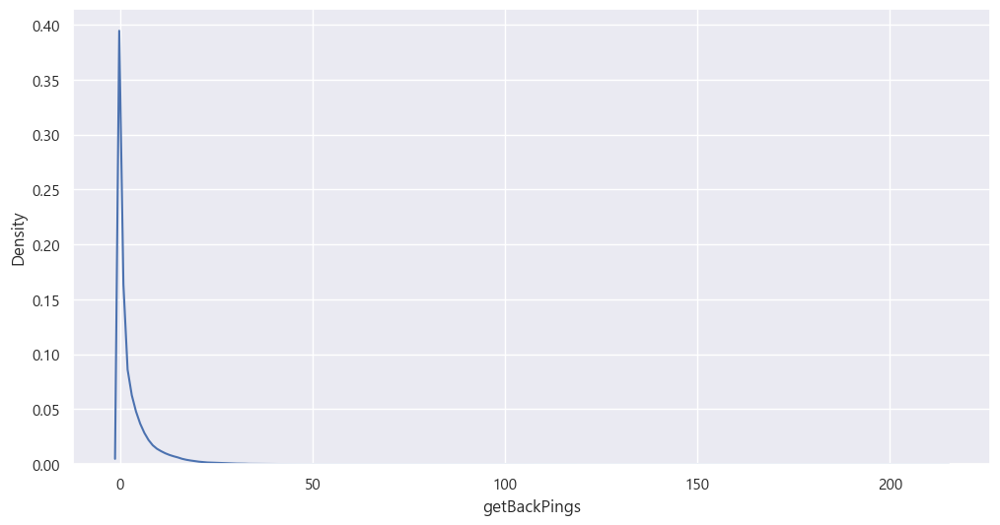

In [145]:
sns.kdeplot(x=low_tier_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

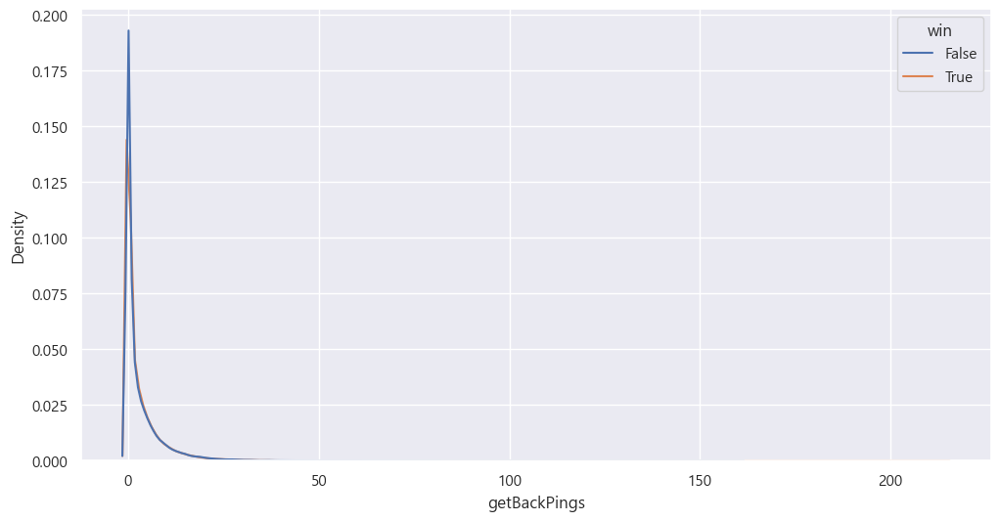

In [147]:
sns.kdeplot(x=low_tier_ping['getBackPings'],hue=low_tier_ping['win'])

### 압박핑 -> 정작 브론즈급에선 사용된 적이 없음

In [148]:
low_tier_ping['holdPings'].value_counts()

holdPings
0    312100
Name: count, dtype: int64

### 가는중 핑

In [149]:
low_tier_ping['onMyWayPings'].value_counts()

onMyWayPings
0      65103
1      33793
2      26623
3      22168
4      18478
       ...  
139        1
138        1
156        1
159        1
164        1
Name: count, Length: 147, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

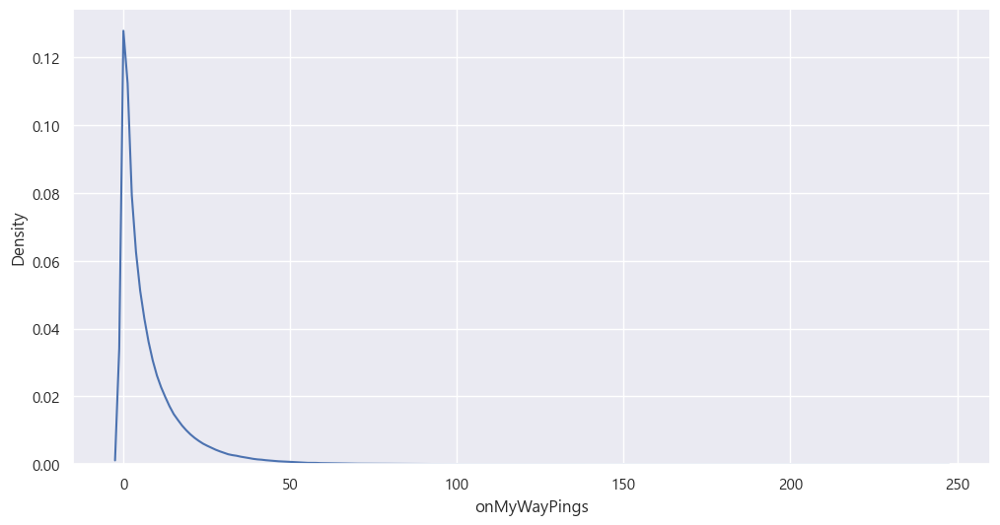

In [150]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

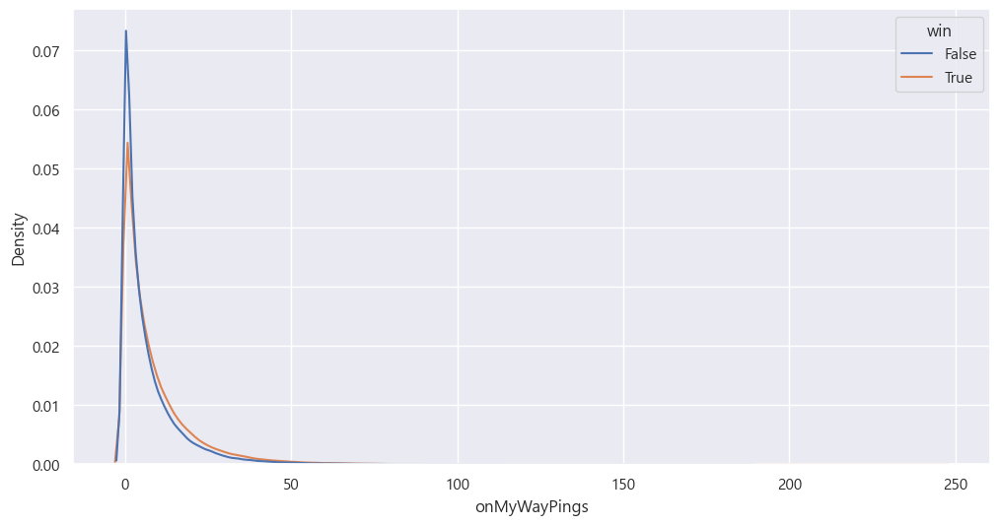

In [151]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'],hue=low_tier_ping['win'])

### 총공격핑

In [152]:
low_tier_ping['allInPings'].value_counts()

allInPings
0      263876
1       30921
2        8718
3        3551
4        1724
5        1042
6         612
7         414
8         262
9         199
10        136
11        107
12        105
14         64
13         62
15         44
16         40
17         36
18         29
19         22
24         20
20         13
21         13
25         10
26          8
22          8
32          7
27          6
23          6
30          5
29          5
28          5
45          3
31          3
40          3
42          2
36          2
34          1
69          1
33          1
65          1
137         1
50          1
48          1
43          1
59          1
53          1
63          1
44          1
41          1
37          1
38          1
58          1
35          1
Name: count, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

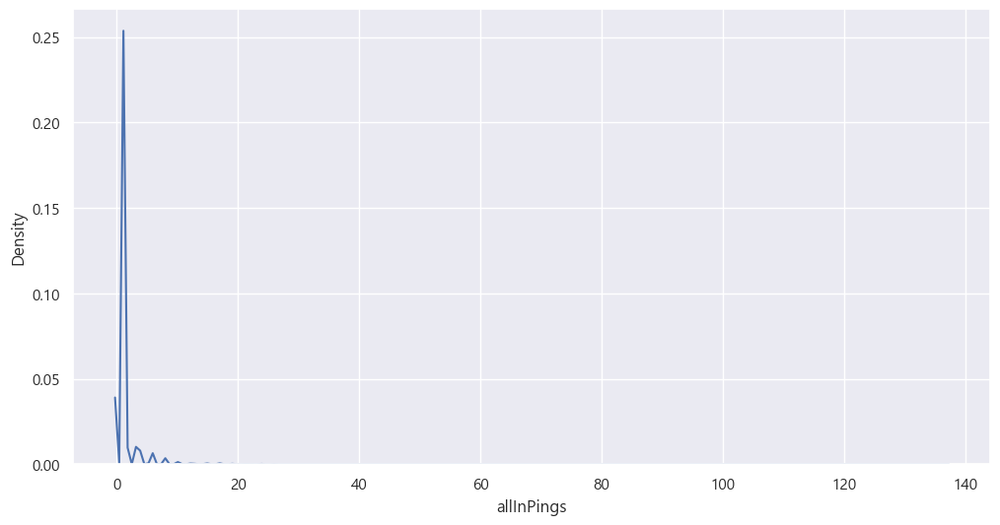

In [153]:
sns.kdeplot(x=low_tier_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

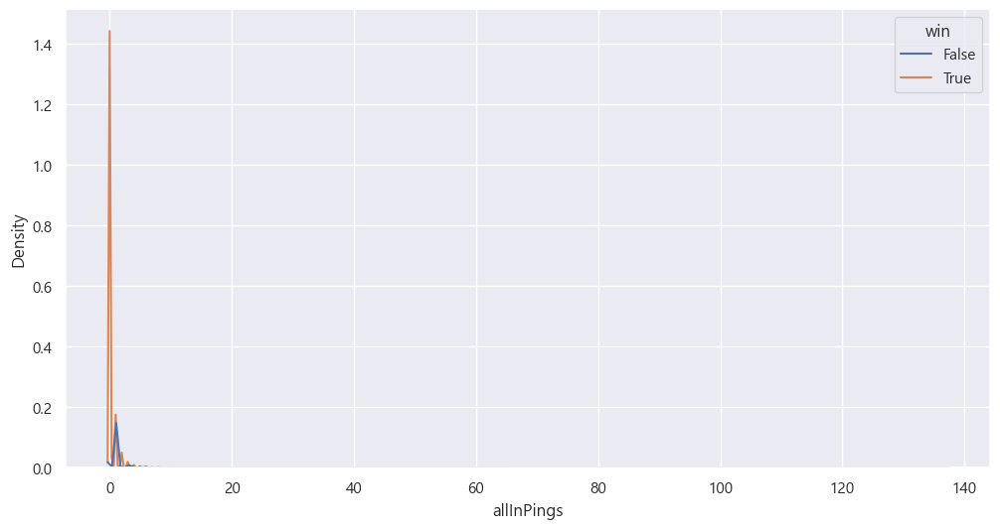

In [154]:
sns.kdeplot(x=low_tier_ping['allInPings'],hue=low_tier_ping['win'])

### 지원핑

In [155]:
low_tier_ping['assistMePings'].value_counts()

assistMePings
0      134381
1       45312
2       30308
3       21357
4       15817
        ...  
80          1
105         1
99          1
77          1
84          1
Name: count, Length: 97, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

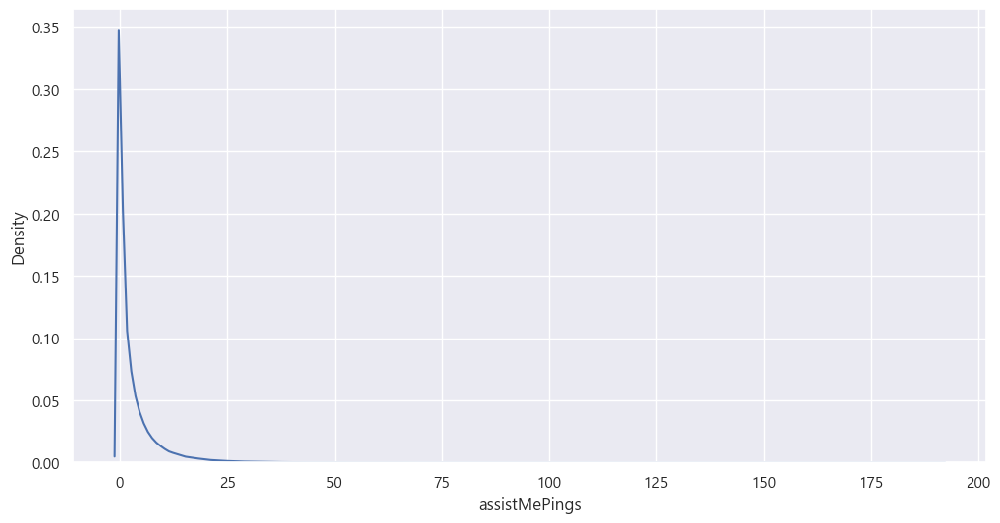

In [156]:
sns.kdeplot(x=low_tier_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

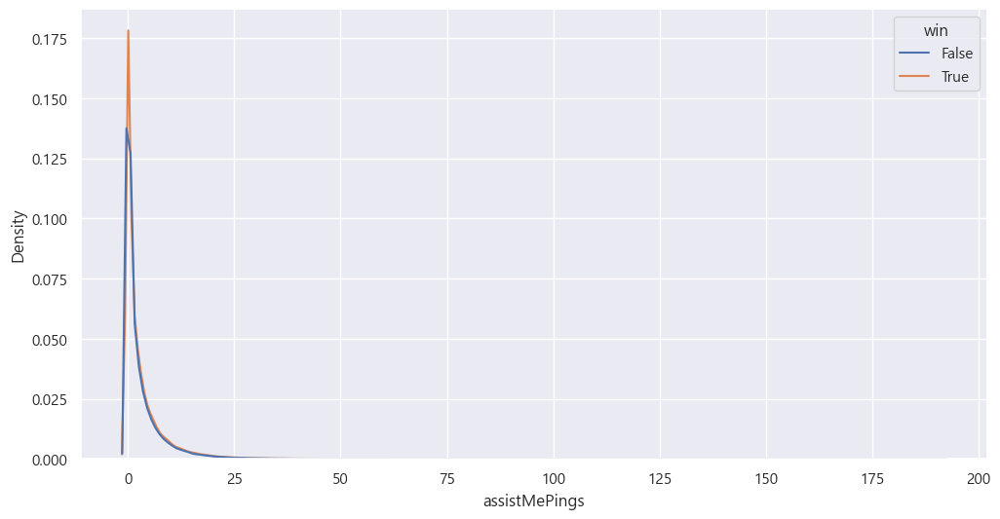

In [157]:
sns.kdeplot(x=low_tier_ping['assistMePings'],hue=low_tier_ping['win'])

### 시야 필요함 핑

In [158]:
low_tier_ping['needVisionPings'].value_counts()

needVisionPings
0      266020
1       30207
2        8250
3        3356
4        1625
5         918
6         565
7         358
8         198
9         152
10        111
11         76
12         52
13         38
14         37
15         27
17         13
16         13
18         12
19         11
20         10
22          8
21          7
24          5
23          5
27          4
26          3
28          2
37          2
30          1
101         1
107         1
61          1
40          1
103         1
48          1
50          1
32          1
59          1
39          1
42          1
29          1
36          1
35          1
Name: count, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='count'>

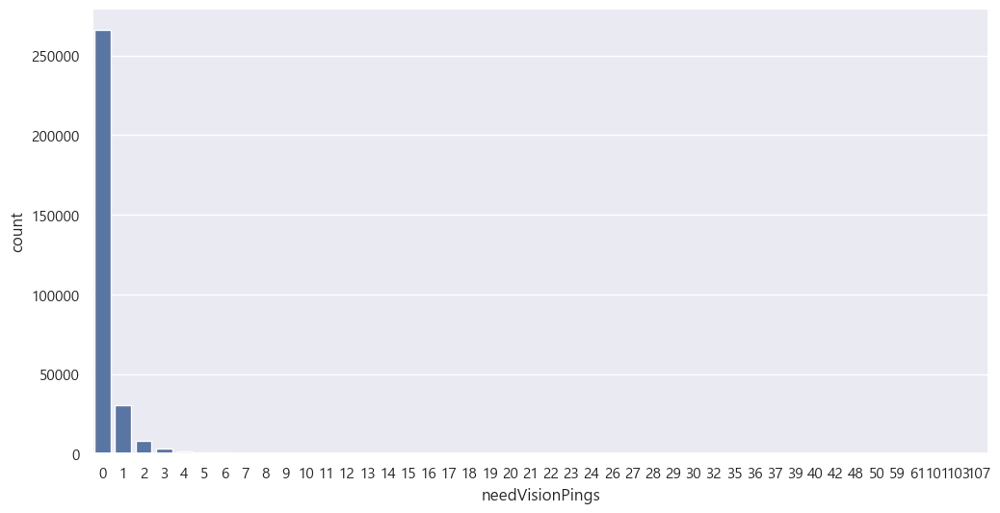

In [159]:
sns.countplot(x=low_tier_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='count'>

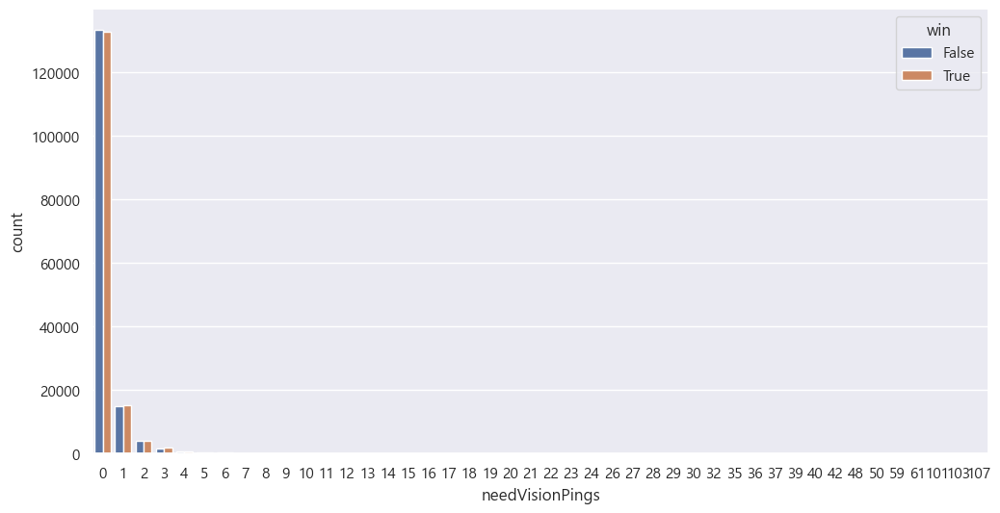

In [160]:
sns.countplot(x=low_tier_ping['needVisionPings'],hue=low_tier_ping['win'])

### 미아핑

In [161]:
low_tier_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0      69092
1      39575
2      33033
3      28744
4      23626
       ...  
122        1
98         1
136        1
97         1
96         1
Name: count, Length: 105, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

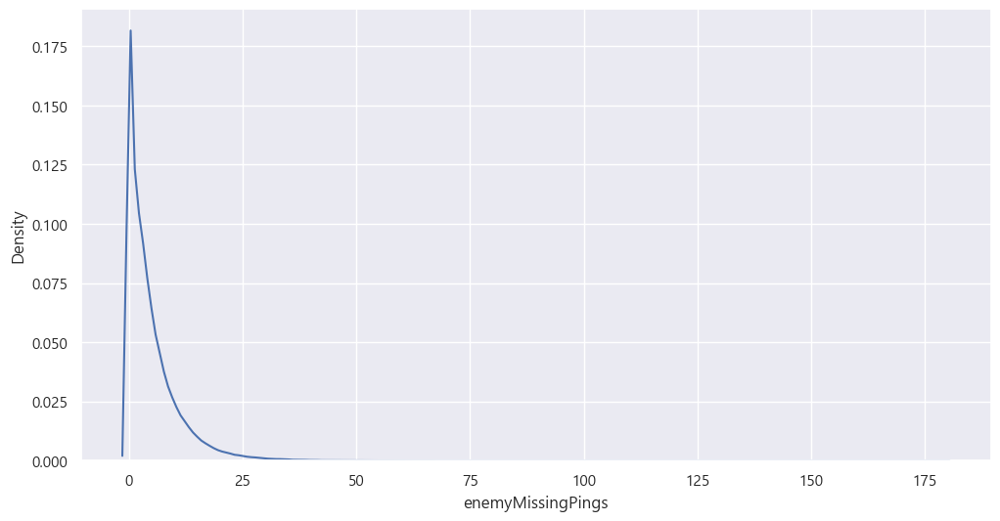

In [162]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

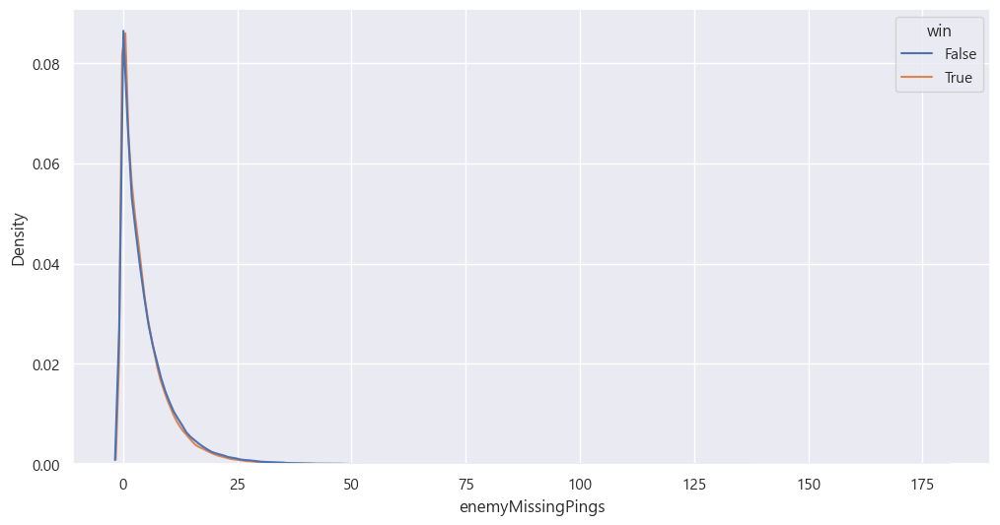

In [163]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'],hue = low_tier_ping['win'])

### 적 와드 / 시야핑

In [164]:
low_tier_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0      183732
1       43133
2       23441
3       15619
4       11058
5        7989
6        6112
7        4678
8        3390
9        2607
10       2137
11       1740
12       1303
13        997
14        799
15        680
16        472
17        413
18        337
19        307
20        203
21        185
22        154
23        109
25         85
24         84
26         64
28         48
27         45
29         33
31         29
32         18
30         17
33         15
34         14
35         11
38          7
36          6
37          5
42          4
46          3
39          3
40          3
64          2
41          2
51          1
156         1
44          1
43          1
60          1
45          1
69          1
Name: count, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

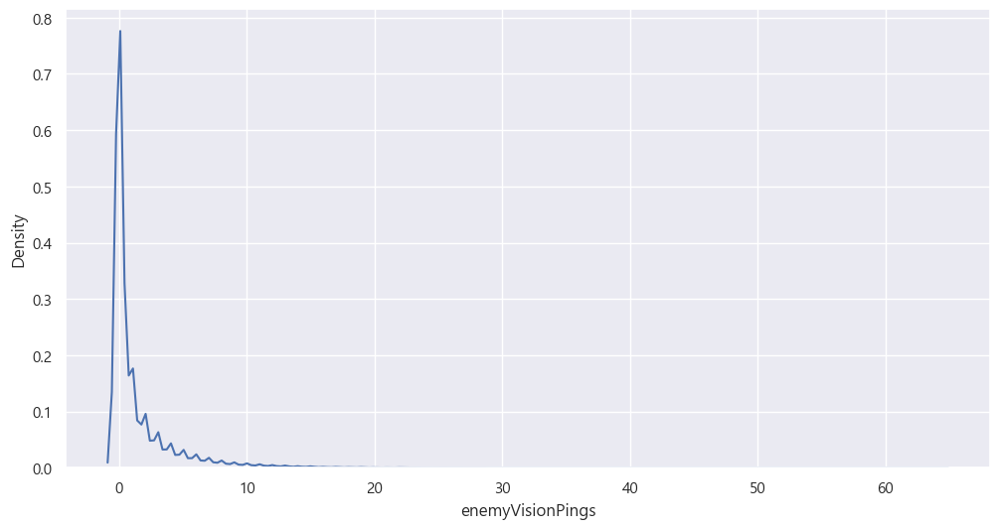

In [48]:
sns.kdeplot(x=bronze_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

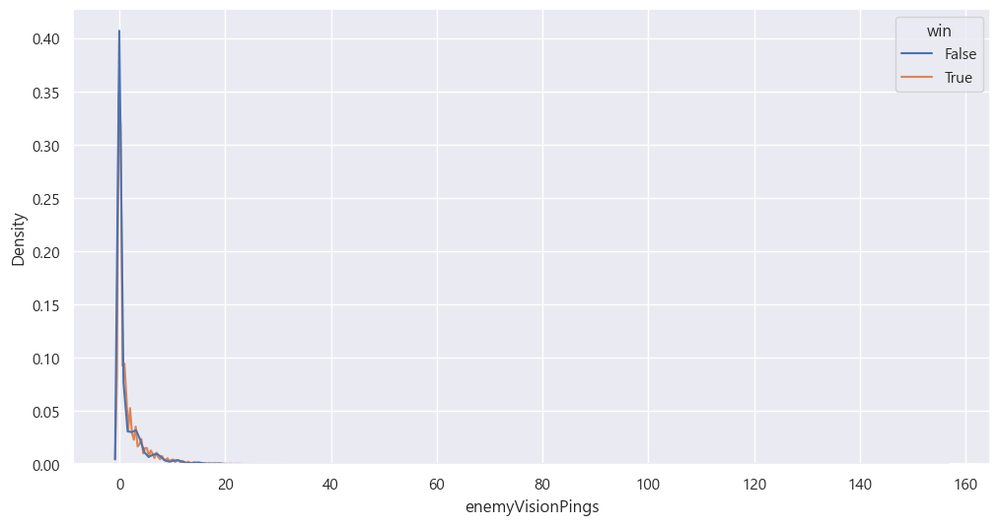

In [165]:
sns.kdeplot(x=low_tier_ping['enemyVisionPings'],hue=low_tier_ping['win'])

## 핑과 승패사이의 상관관계를 봐봅시다.

In [21]:
mid_tier_ping['pings'] = mid_tier_ping['commandPings'] + mid_tier_ping['getBackPings'] + mid_tier_ping['holdPings'] +mid_tier_ping['onMyWayPings'] + mid_tier_ping['allInPings'] + mid_tier_ping['assistMePings'] + mid_tier_ping['needVisionPings'] +mid_tier_ping['enemyMissingPings'] + mid_tier_ping['enemyVisionPings']

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\1010106266.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_tier_ping['pings'] = mid_tier_ping['commandPings'] + mid_tier_ping['getBackPings'] + mid_tier_ping['holdPings'] +mid_tier_ping['onMyWayPings'] + mid_tier_ping['allInPings'] + mid_tier_ping['assistMePings'] + mid_tier_ping['needVisionPings'] +mid_tier_ping['enemyMissingPings'] + mid_tier_ping['enemyVisionPings']


In [22]:
mid_tier_ping=mid_tier_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

In [23]:
mid_tier_ping['win']=mid_tier_ping['win'].astype(int)

In [24]:
corr_ping=mid_tier_ping.corr()
corr_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
win,1.000000,0.048761,0.023448,0.098982,0.024623,0.037650,0.012220,-0.004954,0.009873,0.070022
commandPings,0.048761,1.000000,0.307812,0.431105,0.183261,0.393825,0.151783,0.278312,0.084640,0.700844
getBackPings,0.023448,0.307812,1.000000,0.416961,0.168487,0.391431,0.177968,0.273760,0.170008,0.626244
onMyWayPings,0.098982,0.431105,0.416961,1.000000,0.266288,0.546034,0.214128,0.294164,0.142178,0.830865
allInPings,0.024623,0.183261,0.168487,0.266288,1.000000,0.230317,0.131063,0.129527,0.067610,0.329588
assistMePings,0.037650,0.393825,0.391431,0.546034,0.230317,1.000000,0.253956,0.303569,0.129169,0.698524
needVisionPings,0.012220,0.151783,0.177968,0.214128,0.131063,0.253956,1.000000,0.158265,0.057891,0.294714
enemyMissingPings,-0.004954,0.278312,0.273760,0.294164,0.129527,0.303569,0.158265,1.000000,0.209967,0.560407
enemyVisionPings,0.009873,0.084640,0.170008,0.142178,0.067610,0.129169,0.057891,0.209967,1.000000,0.345624
pings,0.070022,0.700844,0.626244,0.830865,0.329588,0.698524,0.294714,0.560407,0.345624,1.000000


<Axes: >

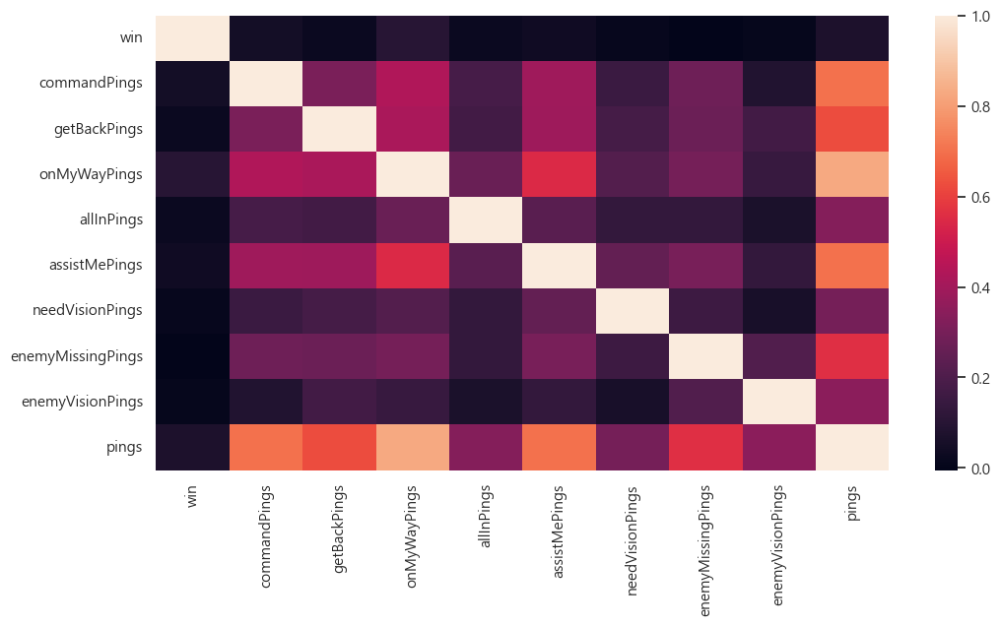

In [25]:
sns.heatmap(corr_ping)

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [535]:
from scipy.stats import levene

stat, p = levene(mid_tier_ping['pings'], mid_tier_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 445333.667, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [536]:
win_pings=mid_tier_ping[mid_tier_ping['win'] == 1]['pings']
lose_pings=mid_tier_ping[~(mid_tier_ping['win'] == 1)]['pings']

In [537]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,55.971231,600706.976956,two-sided,0.0,"[4.26, 4.57]",0.14386,inf,1.0


In [538]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(mid_tier_ping[ping], mid_tier_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    correction_ = p <= 0.05
    win_pings=mid_tier_ping[mid_tier_ping['win'] == 1][ping]
    lose_pings=mid_tier_ping[~(mid_tier_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 315525.878, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,37.842078,603919.747695,two-sided,0.0,"[0.87, 0.97]",0.097264,1.116e+308,1.0



getBackPings
Levene’s test: stat = 191392.924, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,20.293654,604293.61302,two-sided,1.569898e-91,"[0.28, 0.34]",0.05216,7.214e+86,1.0



onMyWayPings
Levene’s test: stat = 304216.429, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,78.905455,591518.210656,two-sided,0.0,"[2.56, 2.69]",0.202807,inf,1.0



allInPings
Levene’s test: stat = 5838.936, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,19.757668,596326.947842,two-sided,7.348422e-87,"[0.07, 0.08]",0.050782,1.584e+82,NaN



assistMePings
Levene’s test: stat = 139027.784, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,29.695714,600315.210766,two-sided,1.206287e-193,"[0.37, 0.42]",0.076326,6.406e+188,NaN



needVisionPings
Levene’s test: stat = 34783.321, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,9.873931,602761.452743,two-sided,5.422342e-23,"[0.02, 0.03]",0.025379,4.275e+18,1.0



enemyMissingPings
Levene’s test: stat = 276700.721, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.044663,603308.248714,two-sided,0.040889,"[-0.06, -0.0]",0.005255,0.023,0.533779



enemyVisionPings
Levene’s test: stat = 160926.083, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.912108,605484.862764,two-sided,2.534888e-15,"[0.07, 0.12]",0.020336,1.135e+11,1.0


## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

### 선형성 확보를 위한 다시 전처리....

#### commandPings

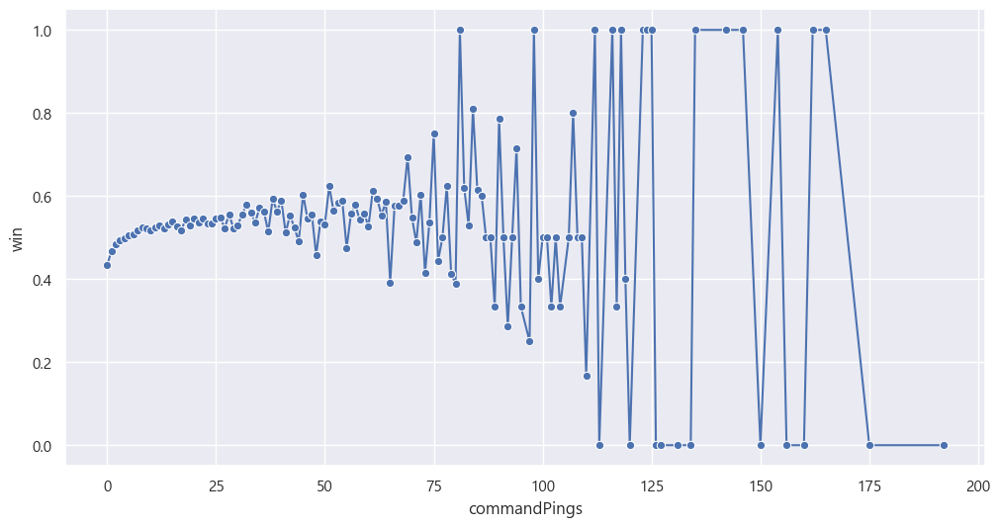

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('commandPings')['win'].mean().reset_index()

sns.lineplot(x='commandPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


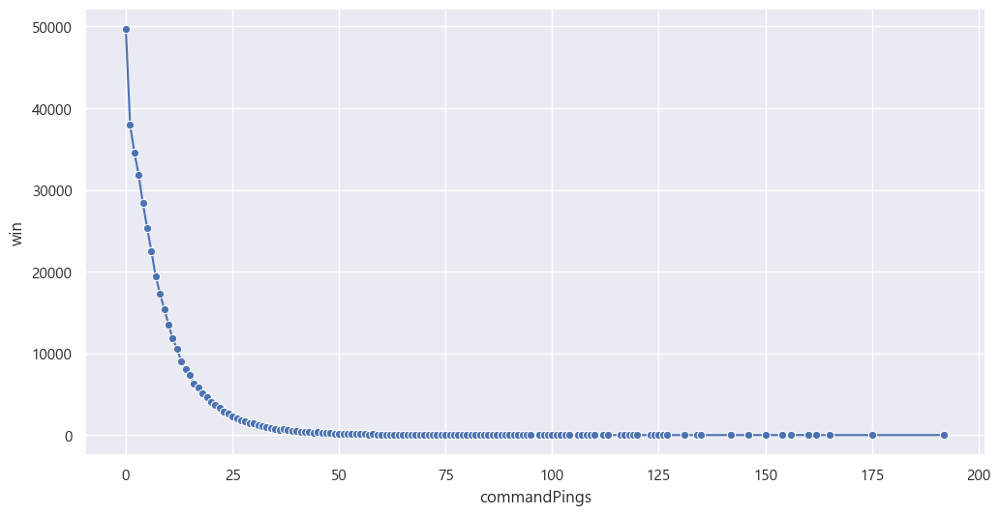

In [27]:
grouped=mid_tier_ping.groupby('commandPings')['win'].count().reset_index()
sns.lineplot(x='commandPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='commandPings_group', ylabel='win'>

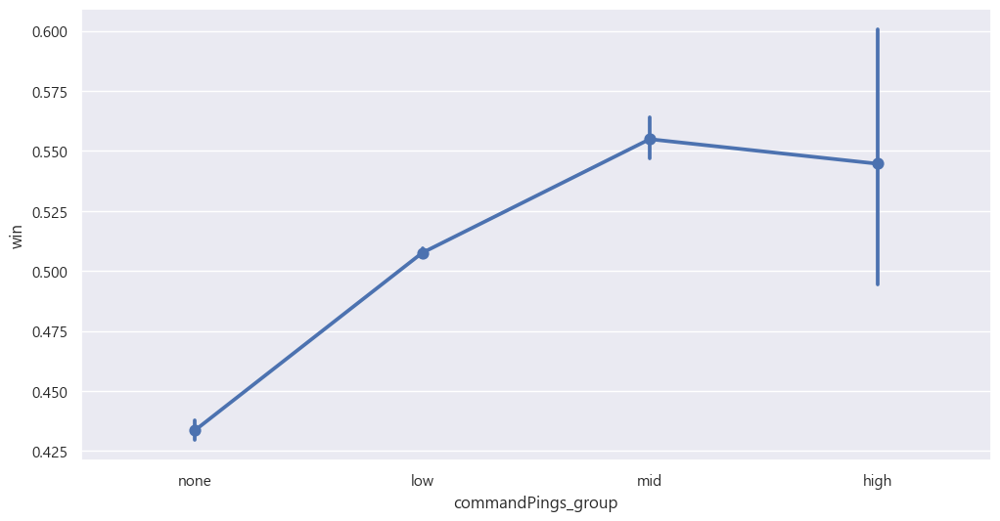

In [102]:
bins = [-1, 0, 30, 75, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['commandPings_group'] = pd.cut(mid_tier_ping['commandPings'], bins=bins, labels=labels)


sns.pointplot(x='commandPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='commandPings_group', ylabel='count'>

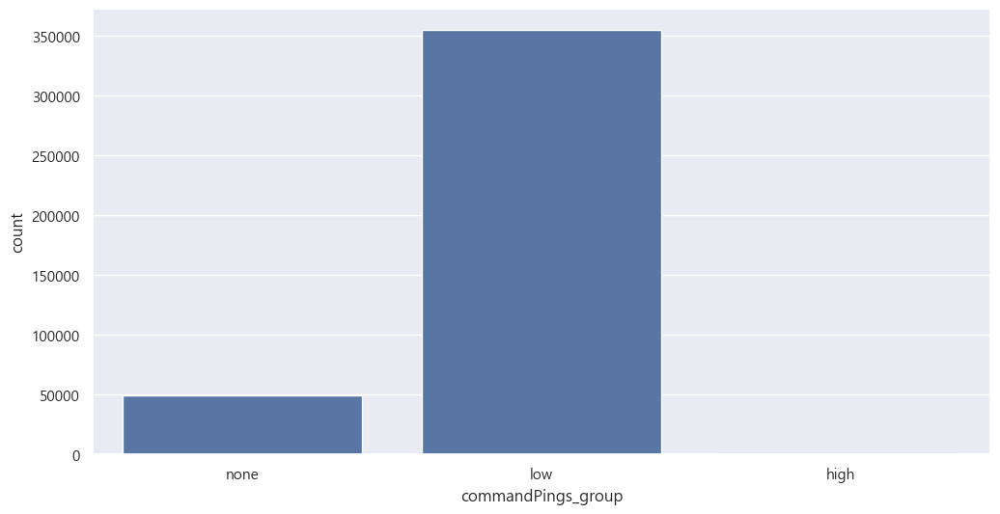

In [29]:
sns.countplot(x='commandPings_group', data=mid_tier_ping)

#### getBackPings

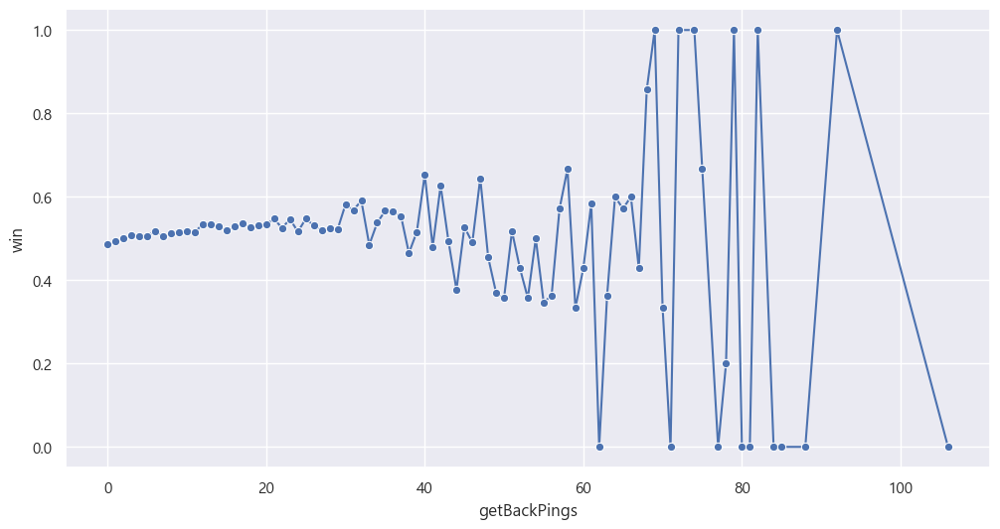

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('getBackPings')['win'].mean().reset_index()

sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


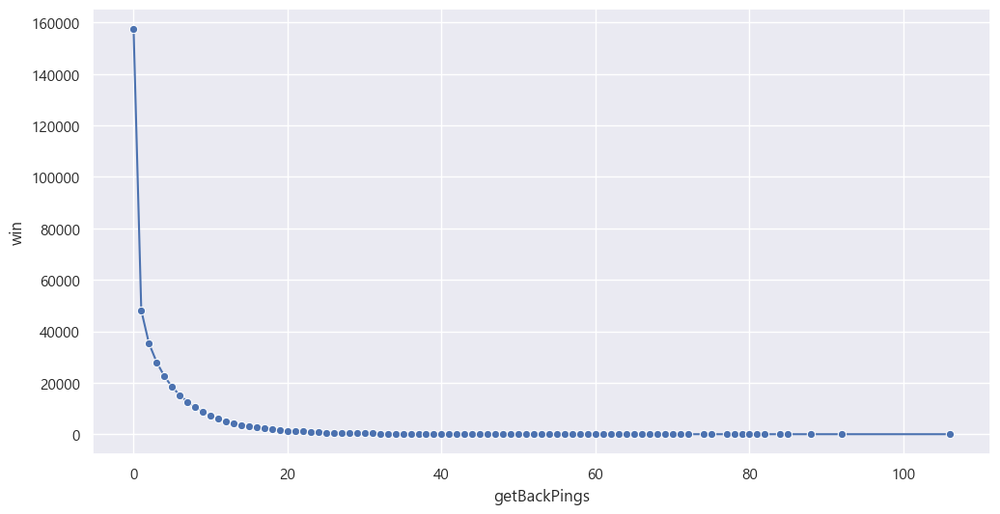

In [31]:
grouped=mid_tier_ping.groupby('getBackPings')['win'].count().reset_index()
sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='getBackPings_group', ylabel='win'>

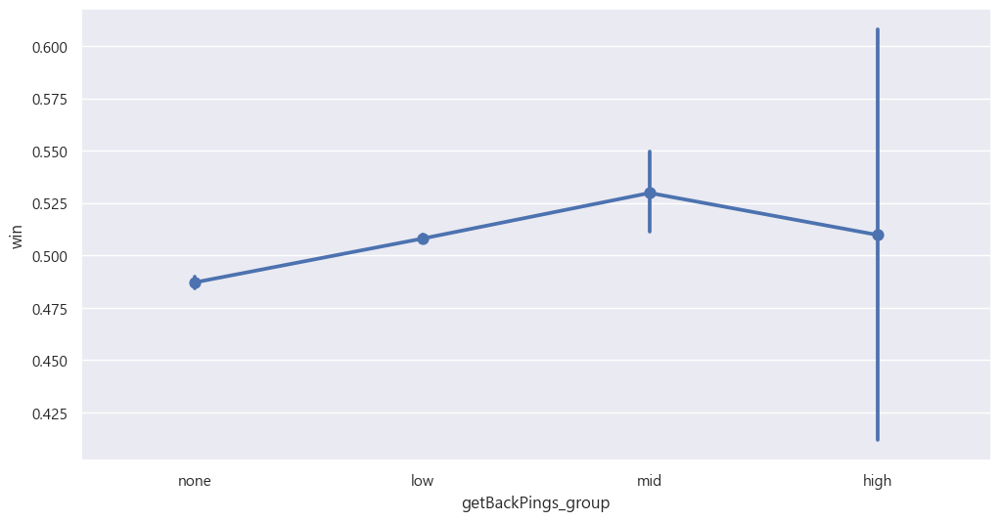

In [119]:
bins = [-1, 0, 30, 60, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['getBackPings_group'] = pd.cut(mid_tier_ping['getBackPings'], bins=bins, labels=labels)


sns.pointplot(x='getBackPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='getBackPings_group', ylabel='count'>

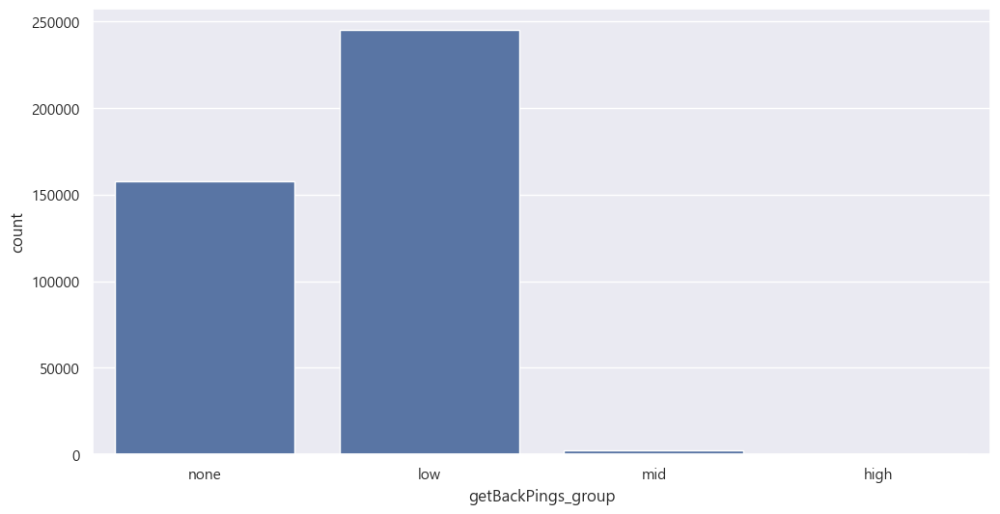

In [120]:
sns.countplot(x='getBackPings_group', data=mid_tier_ping)

#### onMyWayPings

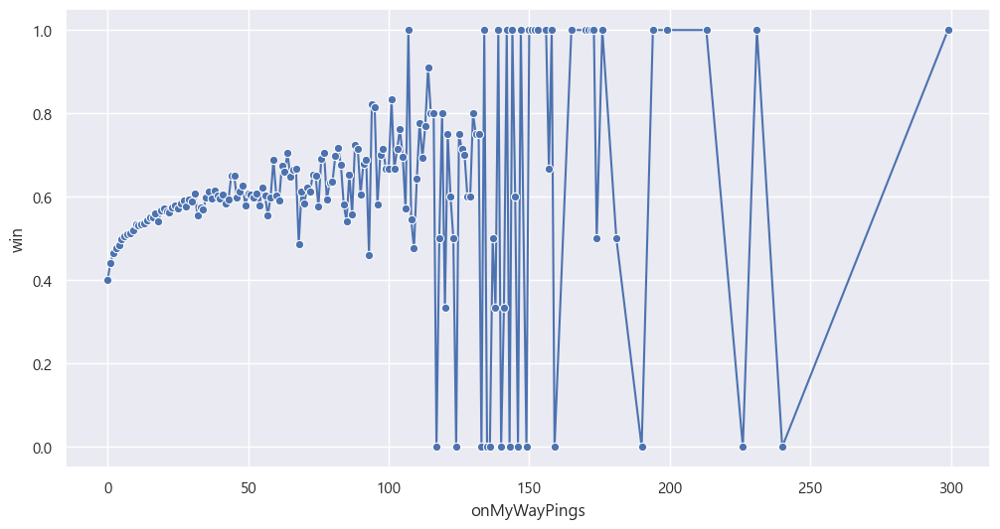

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('onMyWayPings')['win'].mean().reset_index()

sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


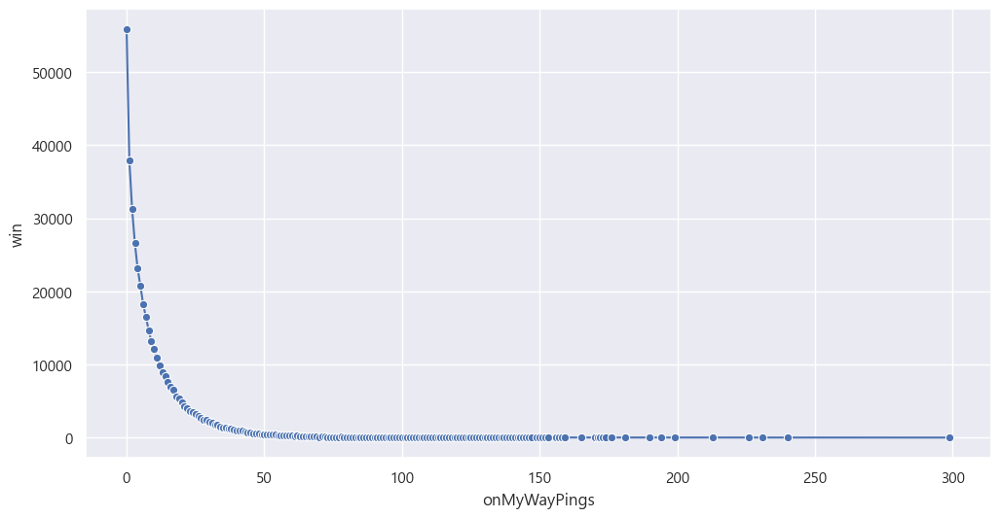

In [36]:
grouped=mid_tier_ping.groupby('onMyWayPings')['win'].count().reset_index()
sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='onMyWayPings_group', ylabel='win'>

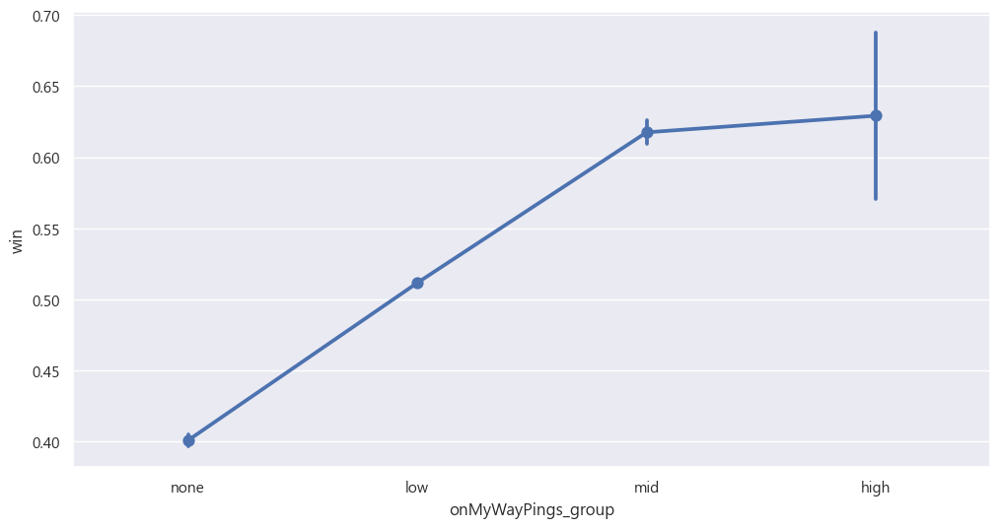

In [40]:
bins = [-1, 0, 40, 110, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['onMyWayPings_group'] = pd.cut(mid_tier_ping['onMyWayPings'], bins=bins, labels=labels)


sns.pointplot(x='onMyWayPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='onMyWayPings_group', ylabel='count'>

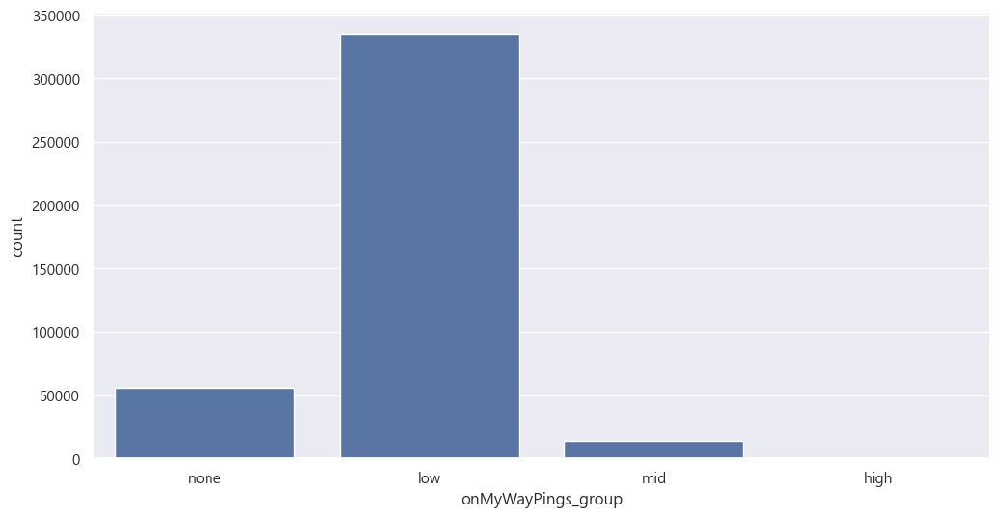

In [41]:
sns.countplot(x='onMyWayPings_group', data=mid_tier_ping)

#### assistMePings

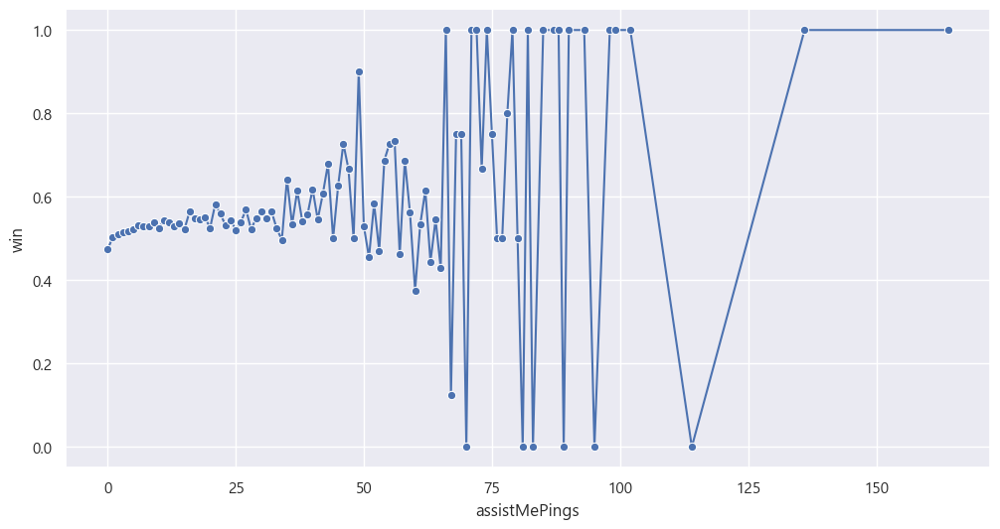

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('assistMePings')['win'].mean().reset_index()

sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


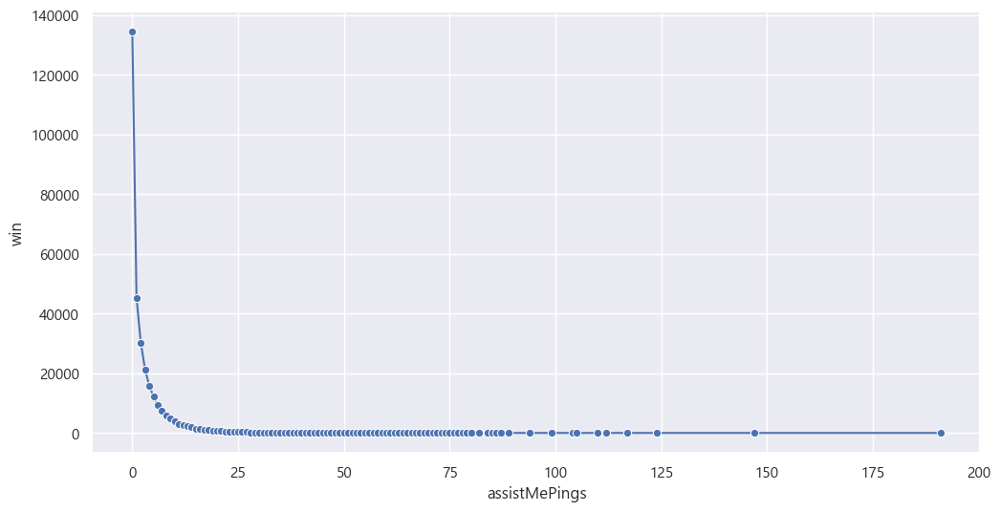

In [197]:
grouped=low_tier_ping.groupby('assistMePings')['win'].count().reset_index()
sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='assistMePings_group', ylabel='win'>

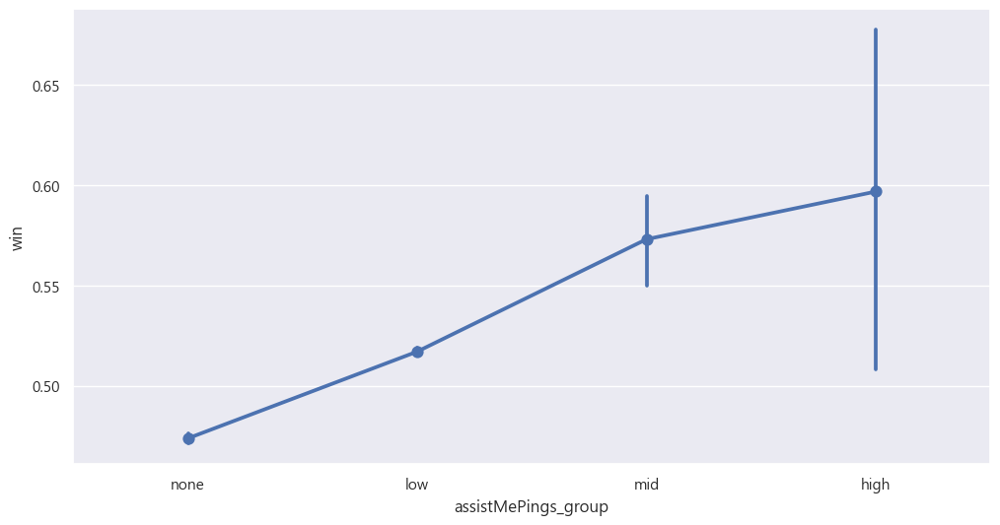

In [44]:
bins = [-1, 0, 30, 60, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['assistMePings_group'] = pd.cut(mid_tier_ping['assistMePings'], bins=bins, labels=labels)


sns.pointplot(x='assistMePings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='assistMePings_group', ylabel='count'>

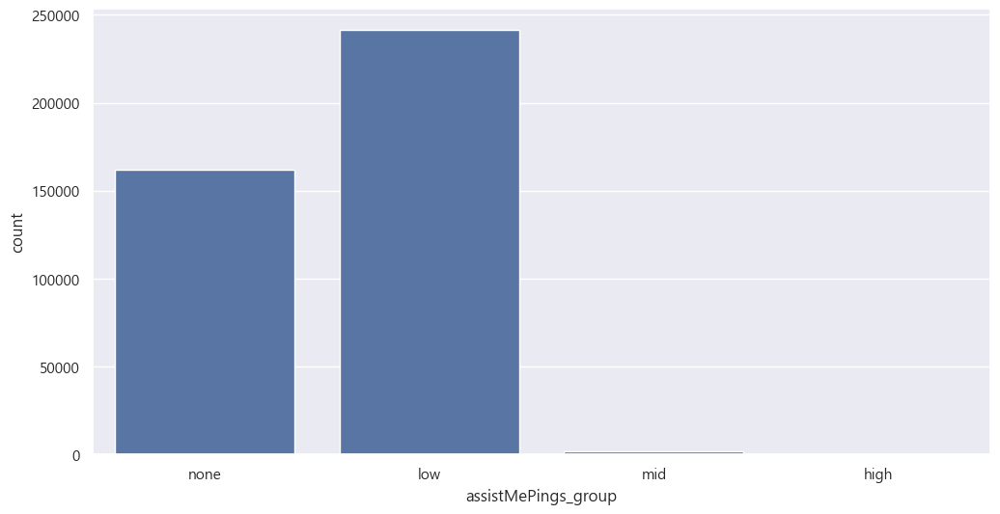

In [45]:
sns.countplot(x='assistMePings_group', data=mid_tier_ping)

#### enemyMissingPings

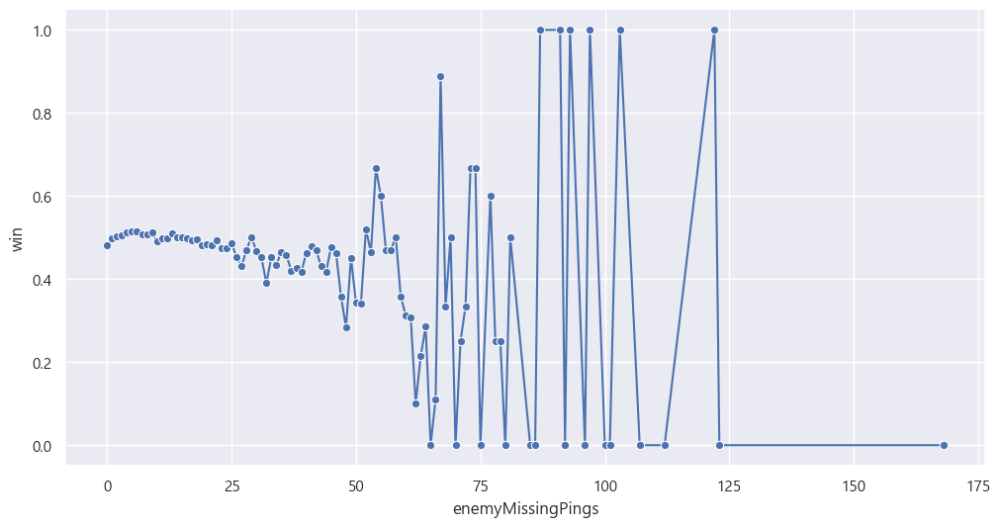

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('enemyMissingPings')['win'].mean().reset_index()

sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


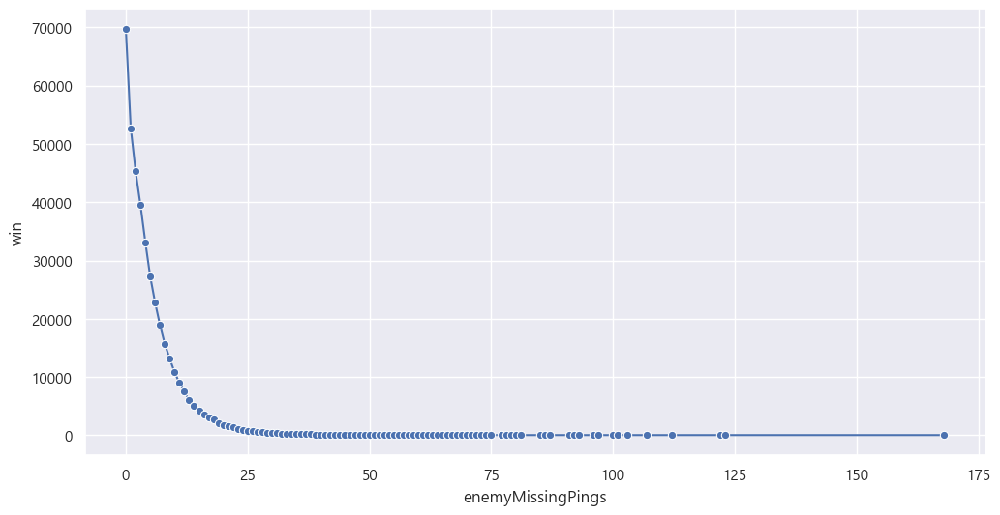

In [47]:
grouped=mid_tier_ping.groupby('enemyMissingPings')['win'].count().reset_index()
sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='win'>

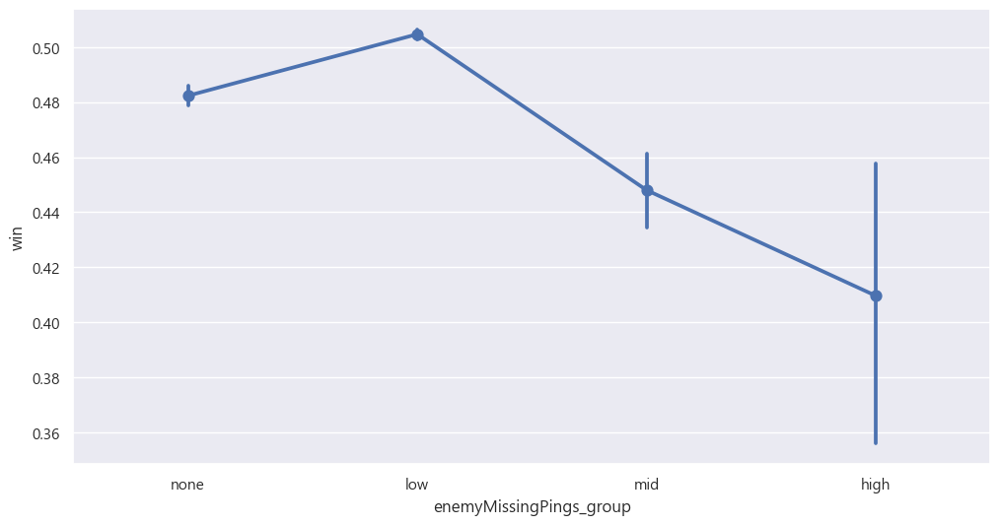

In [52]:
bins = [-1, 0, 25, 50, float('inf')]
labels = ['none', 'low','mid', 'high']

mid_tier_ping['enemyMissingPings_group'] = pd.cut(mid_tier_ping['enemyMissingPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyMissingPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='enemyMissingPings_group', ylabel='count'>

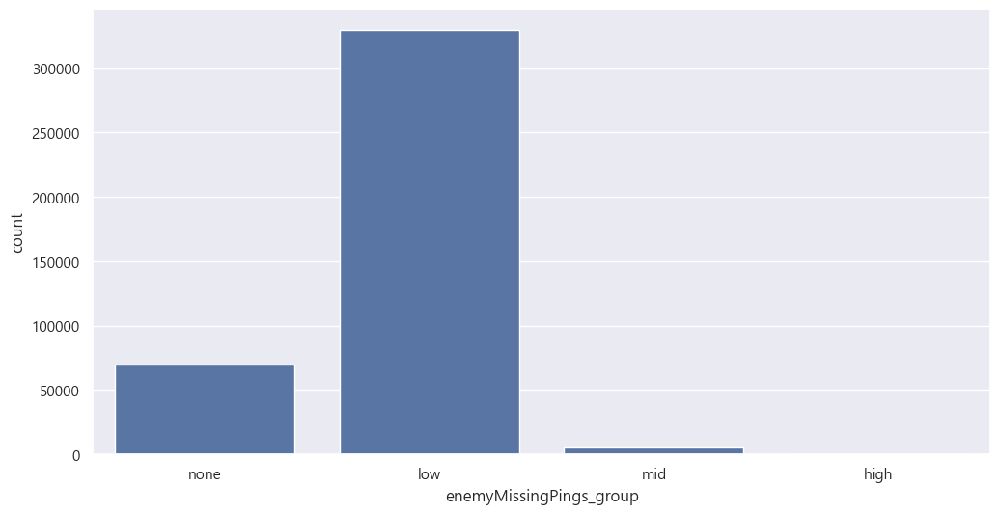

In [49]:
sns.countplot(x='enemyMissingPings_group', data=mid_tier_ping)

#### enemyVisionPings

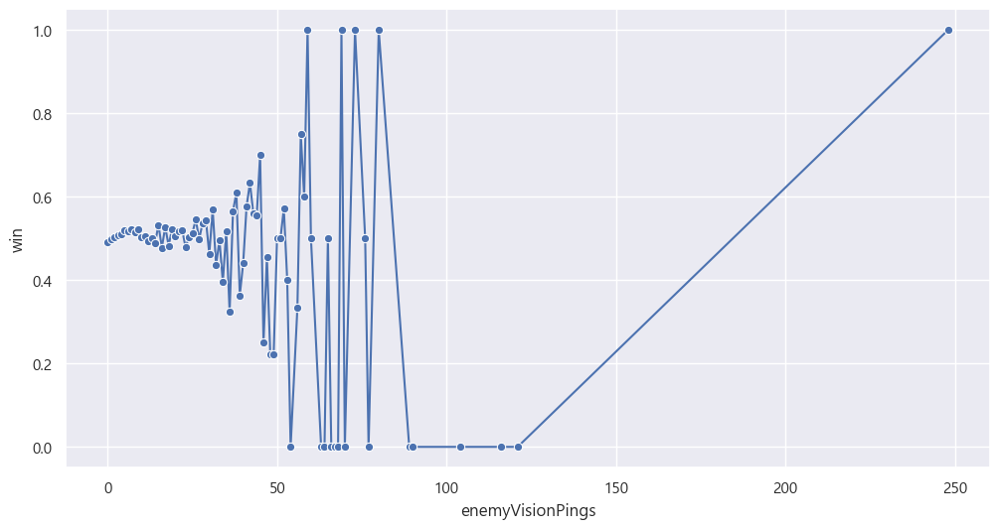

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('enemyVisionPings')['win'].mean().reset_index()

sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


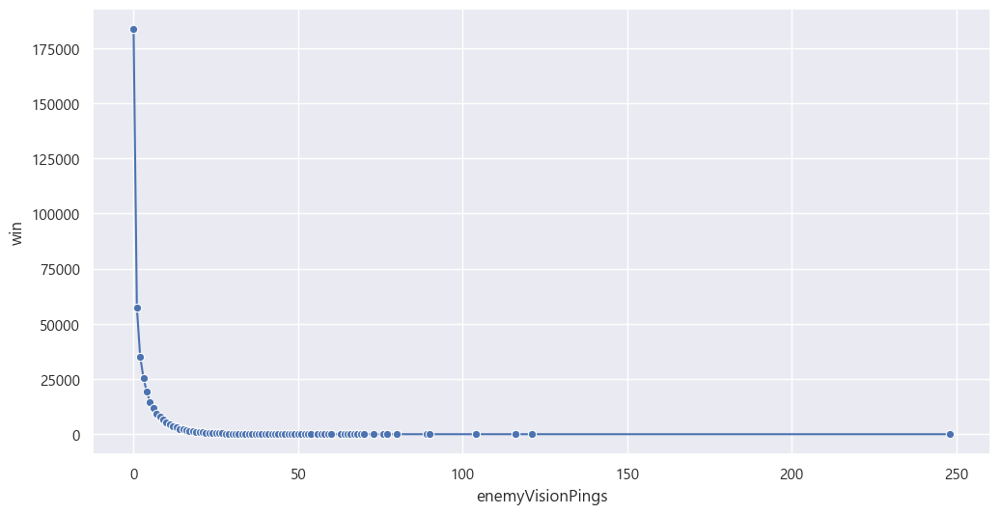

In [54]:
grouped=mid_tier_ping.groupby('enemyVisionPings')['win'].count().reset_index()
sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='win'>

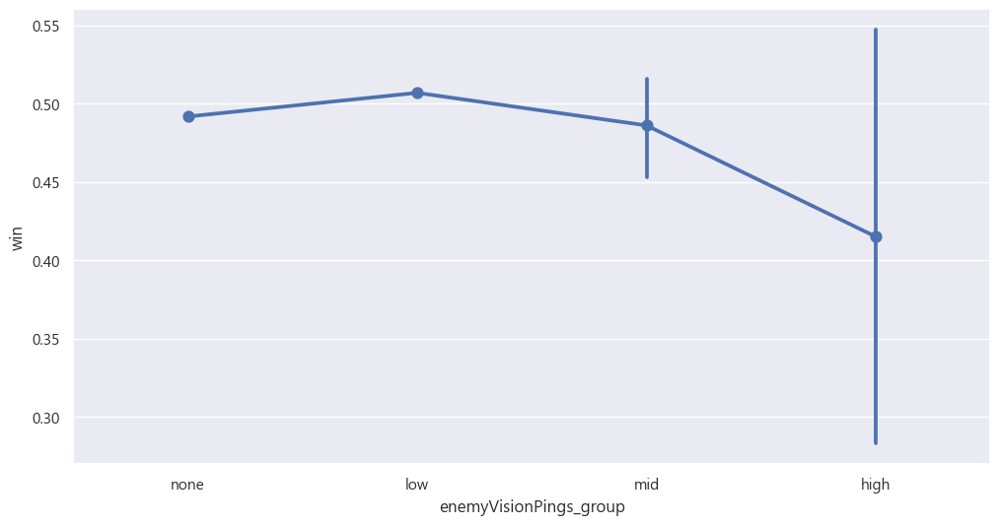

In [111]:
bins = [-1, 0, 30, 50, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['enemyVisionPings_group'] = pd.cut(mid_tier_ping['enemyVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyVisionPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='enemyVisionPings_group', ylabel='count'>

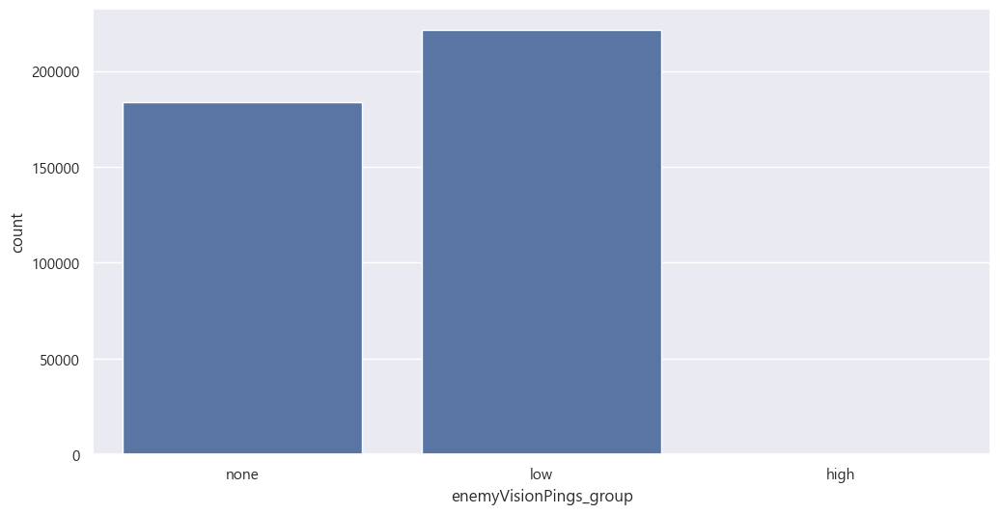

In [57]:
sns.countplot(x='enemyVisionPings_group', data=mid_tier_ping)

#### needVisionPings(drop)

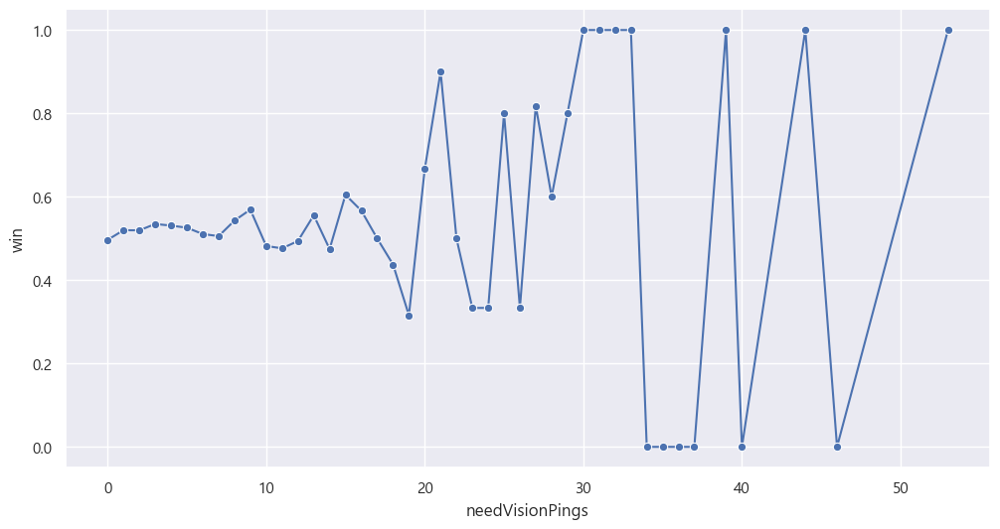

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('needVisionPings')['win'].mean().reset_index()

sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


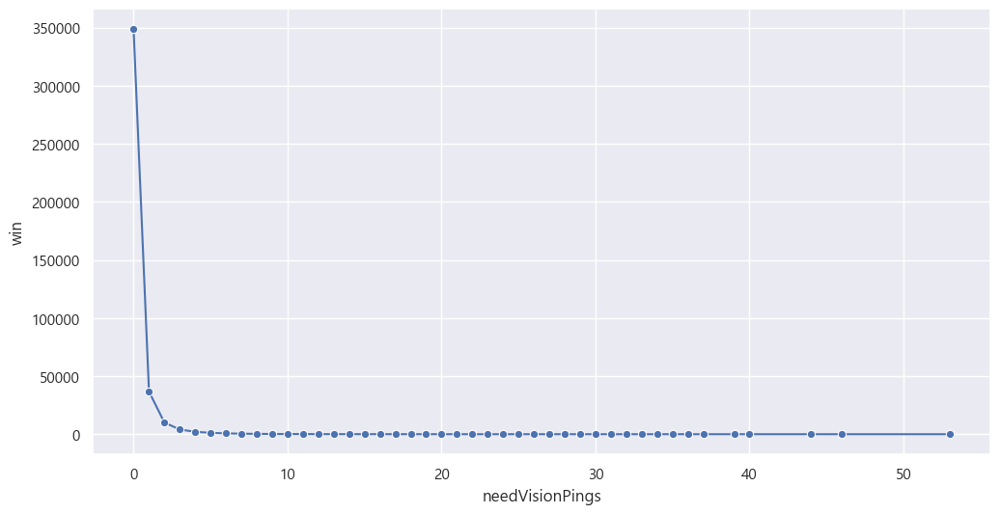

In [59]:
grouped=mid_tier_ping.groupby('needVisionPings')['win'].count().reset_index()
sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='needVisionPings_group', ylabel='win'>

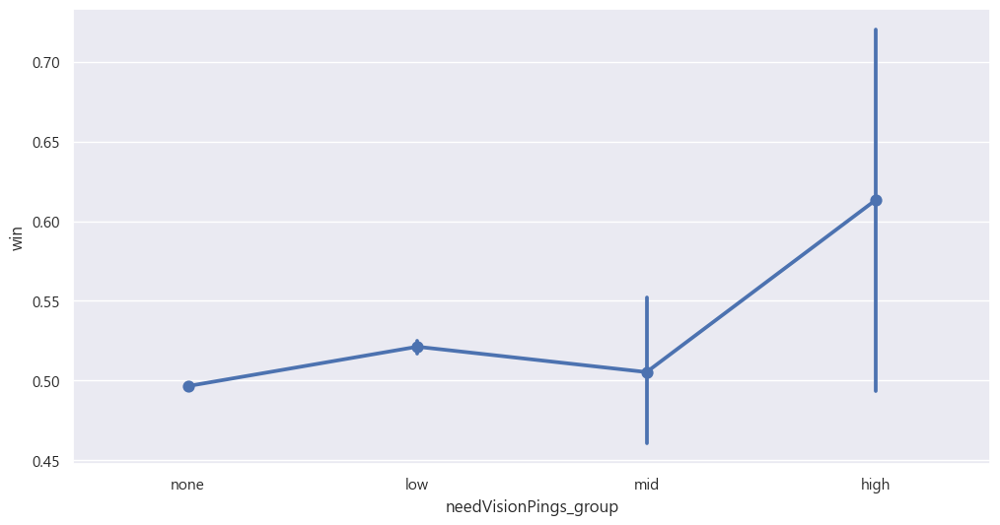

In [61]:
bins = [-1, 0, 10, 20, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['needVisionPings_group'] = pd.cut(mid_tier_ping['needVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='needVisionPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='needVisionPings_group', ylabel='count'>

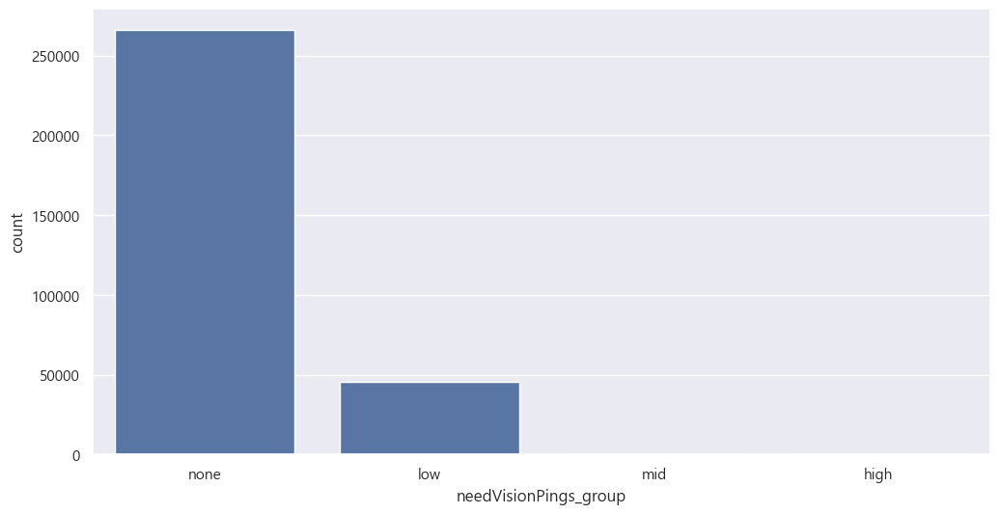

In [215]:
sns.countplot(x='needVisionPings_group', data=low_tier_ping)

#### allInPings(drop)

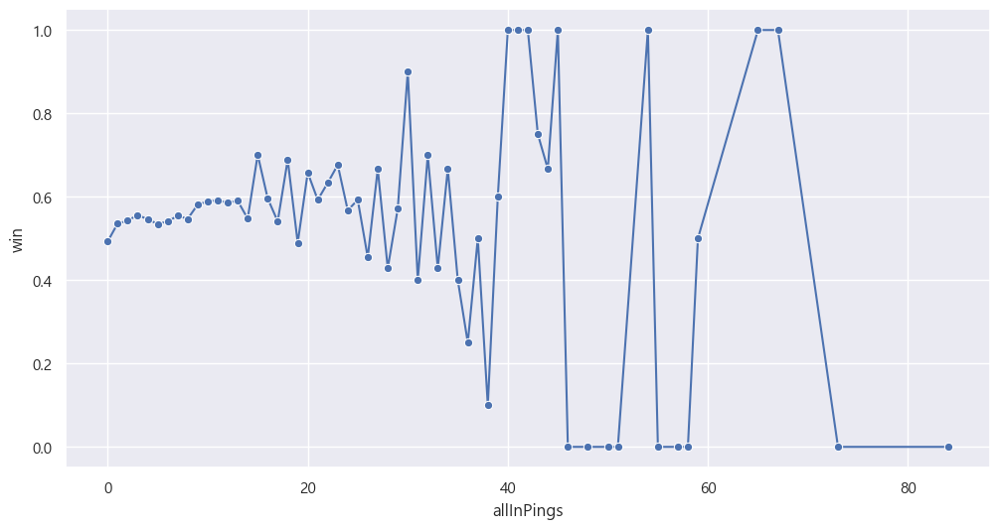

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = mid_tier_ping.groupby('allInPings')['win'].mean().reset_index()

sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


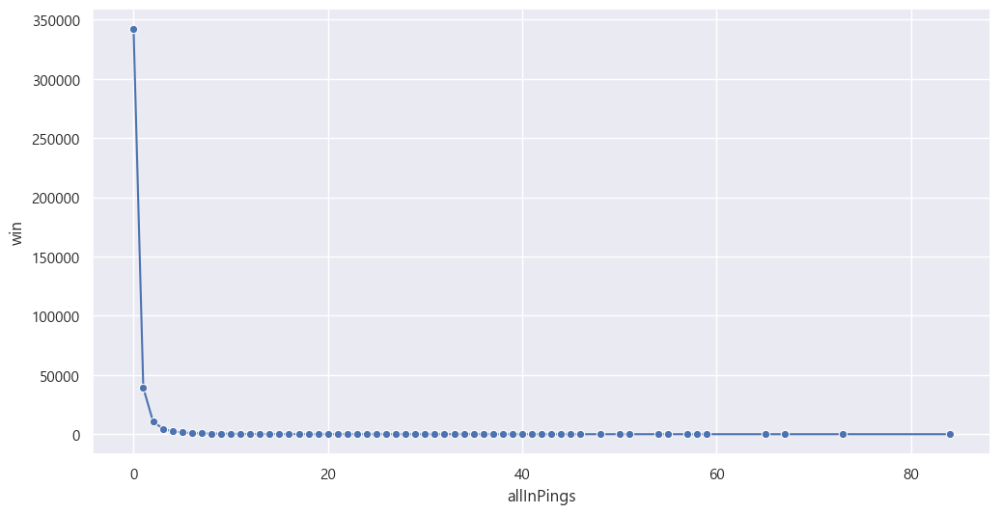

In [66]:
grouped=mid_tier_ping.groupby('allInPings')['win'].count().reset_index()
sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='allInPings_group', ylabel='win'>

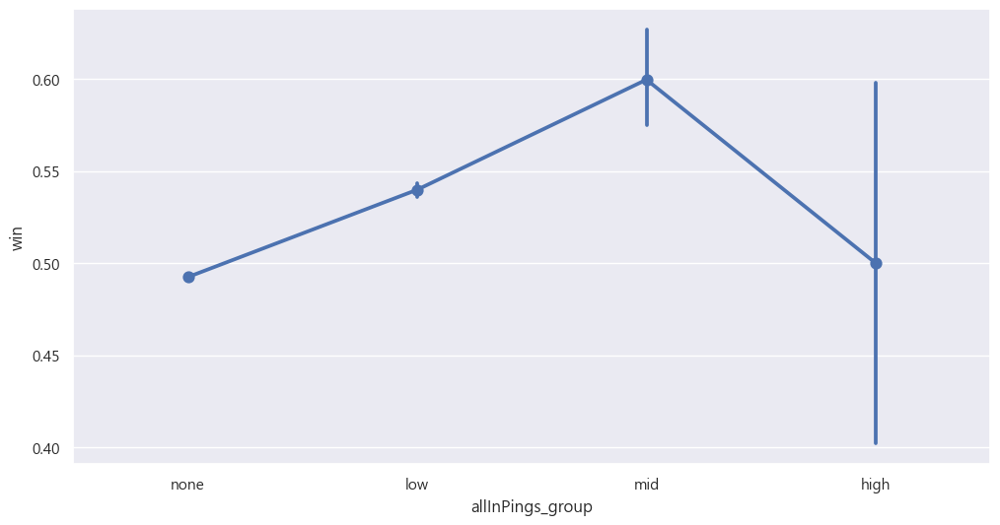

In [68]:
bins = [-1, 0, 10, 30, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['allInPings_group'] = pd.cut(mid_tier_ping['allInPings'], bins=bins, labels=labels)


sns.pointplot(x='allInPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='allInPings_group', ylabel='count'>

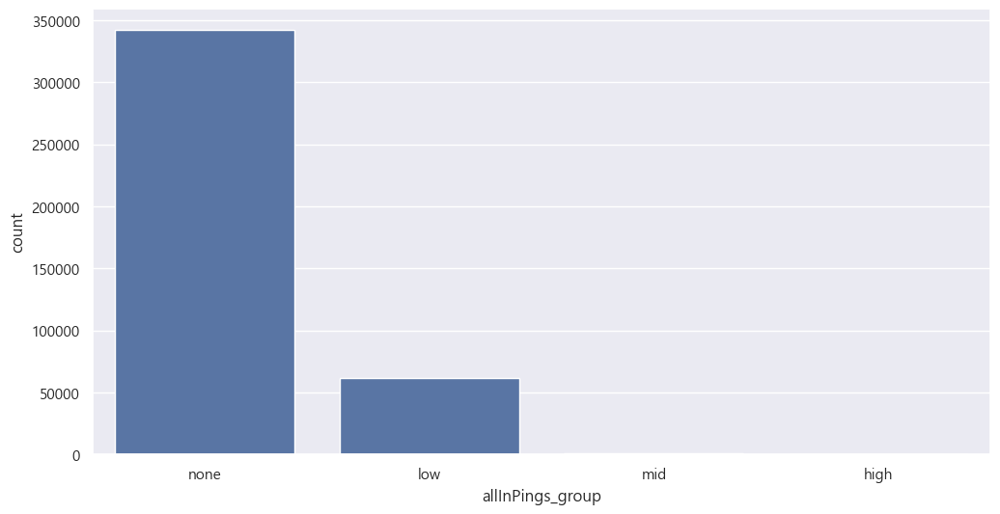

In [69]:
sns.countplot(x='allInPings_group', data=mid_tier_ping)

### 다시 모델 돌릴 시간

In [121]:
col_list=['commandPings_group', 'getBackPings_group','onMyWayPings_group','assistMePings_group',
          'enemyMissingPings_group', 'enemyVisionPings_group'
         ]
mid_tier_ping_log = pd.get_dummies(mid_tier_ping, columns=col_list, drop_first=True)
mid_tier_ping_result=mid_tier_ping_log.drop(['commandPings', 'getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings','pings','needVisionPings_group', 'allInPings_group'],axis=1)


In [122]:
mid_tier_ping_result

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high,onMyWayPings_group_low,onMyWayPings_group_mid,onMyWayPings_group_high,assistMePings_group_low,assistMePings_group_mid,assistMePings_group_high,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_low,enemyVisionPings_group_mid,enemyVisionPings_group_high
0,0,True,False,False,True,False,False,True,False,False,False,False,False,True,False,False,False,False,False
1,0,True,False,False,False,True,False,True,False,False,True,False,False,True,False,False,True,False,False
2,0,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False
3,0,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False
4,0,True,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31815,1,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False
31816,1,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False
31817,1,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False,True,False,False
31818,1,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False,False


In [123]:
change=mid_tier_ping_result.columns.to_list()
for col in change:
    mid_tier_ping_result[col] = mid_tier_ping_result[col].astype(int)

In [124]:
mid_tier_ping_result.describe()

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high,onMyWayPings_group_low,onMyWayPings_group_mid,onMyWayPings_group_high,assistMePings_group_low,assistMePings_group_mid,assistMePings_group_high,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_low,enemyVisionPings_group_mid,enemyVisionPings_group_high
count,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000
mean,0.500000,0.844835,0.031643,0.000884,0.604729,0.006213,0.000252,0.827397,0.034080,0.000593,0.595841,0.004465,0.000306,0.813889,0.013086,0.000874,0.544178,0.002312,0.000131
std,0.500001,0.362062,0.175047,0.029721,0.488909,0.078580,0.015869,0.377904,0.181435,0.024338,0.490729,0.066671,0.017497,0.389197,0.113644,0.029554,0.498045,0.048023,0.011440
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [125]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = mid_tier_ping_result.drop(['win'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [126]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
0,const,15.442029
8,onMyWayPings_group_mid,1.399325
7,onMyWayPings_group_low,1.395078
2,commandPings_group_mid,1.329738
1,commandPings_group_low,1.312225
10,assistMePings_group_low,1.176635
13,enemyMissingPings_group_low,1.143343
14,enemyMissingPings_group_mid,1.106685
4,getBackPings_group_low,1.083095
11,assistMePings_group_mid,1.081217


In [127]:
import statsmodels.api as sm

# 1. X, y 분리
X = mid_tier_ping_result.drop(['win'],axis=1)
y = mid_tier_ping_result['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.690761
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:               404930
Model:                          Logit   Df Residuals:                   404912
Method:                           MLE   Df Model:                           17
Date:                Thu, 31 Jul 2025   Pseudo R-squ.:                0.003443
Time:                        09:25:54   Log-Likelihood:            -2.7971e+05
converged:                       True   LL-Null:                   -2.8068e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
commandPings_group_low          -0.0335      0.009     -3.925      0.000

# 그럼 분당 핑수는 어떤 영향을 줄까요?(에-플-다)

In [149]:
emerald_ping=pd.read_csv('emerald_ping.csv')
platinum_ping=pd.read_csv("platinum_ping.csv")
diamond_ping=pd.read_csv("diamond_ping.csv")
mid_tier_ping = pd.concat([emerald_ping, platinum_ping])
mid_tier_ping = pd.concat([mid_tier_ping, diamond_ping])

In [150]:
mid_tier_ping[mid_tier_ping['is_replay'] == False]

,matchId,blue/red,gameDuration,puuid,win,is_Surrender_aft_25m,is_Early_Surrender,is_replay,teamPosition,championName,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,7713876857,True,1702,Sxo5qlnrSRkWDMPZoTS8GM40BnO2xIo7ZAlpiqdFX_a-e4...,False,False,False,False,TOP,Poppy,2,5,0,1,0,0,0,2,0
1,7713876857,True,1702,YoKIZ5D02_GGtWtnLnmannOul4aFkkrtk7WC3IY2ZNTh25...,False,False,False,False,JUNGLE,Nidalee,27,37,0,22,0,2,1,2,2
2,7713876857,True,1702,01iaR4OhACWM-tW-ojrZnB5cQHw6FlHXwx1OylsDL3zs2Z...,False,False,False,False,MIDDLE,Yone,3,5,0,14,0,5,0,7,0
3,7713876857,True,1702,vlehzRySr3MXJtVWIeV5WjViqKxF-Eo1muYRVvwxMdhZhr...,False,False,False,False,BOTTOM,Aphelios,5,4,0,6,1,5,0,4,0
4,7713876857,True,1702,CUHnRxRDHXwUPb94Q_gBJdtSc9QnAFV5ZpZw2RPhrVTAEo...,False,False,False,False,UTILITY,Braum,7,0,0,3,0,2,0,8,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31815,7720387948,False,1541,YRPVB6XcDilwDTRjfsUd5POILLDEZ6MPNpdIpfMRLB6M5L...,True,False,False,False,TOP,Irelia,9,1,0,3,1,2,0,0,0
31816,7720387948,False,1541,sSrES3rtIqccSPkjwYxFNByAdCUR6VSKRsaTAuxCChPDWF...,True,False,False,False,JUNGLE,Trundle,11,6,0,25,0,9,0,5,1
31817,7720387948,False,1541,8OUJXBmIvIGCfoSh2hbLJ-CMVDizmhyuys4_1NwxBtQ82y...,True,False,False,False,MIDDLE,Azir,3,22,0,21,0,16,1,5,3
31818,7720387948,False,1541,TRG8g8A0TvtW5iON60ypWfl3Tt8HDiSznQGFwXx1hShDKK...,True,False,False,False,BOTTOM,AurelionSol,9,9,0,15,0,2,0,0,1


In [151]:
mid_tier_ping['gameDuration_minute']=round(mid_tier_ping['gameDuration']/60)
temp=mid_tier_ping['gameDuration_minute']

In [152]:
mid_tier_game=mid_tier_ping[mid_tier_ping['is_replay'] == False] #다시하기 게임들은 날려주고
ping_list=['commandPings','getBackPings','holdPings','onMyWayPings','allInPings','assistMePings','needVisionPings',
           'enemyMissingPings','enemyVisionPings']

for ping in ping_list:
    mid_tier_game[ping] = mid_tier_game[ping] / mid_tier_game['gameDuration_minute']
mid_tier_ping=mid_tier_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings',
                         'onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\2917943371.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_tier_game[ping] = mid_tier_game[ping] / mid_tier_game['gameDuration_minute']


In [153]:
mid_tier_ping

,win,is_Surrender_aft_25m,is_Early_Surrender,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,False,False,False,0.071429,0.178571,0.0,0.035714,0.000000,0.000000,0.000000,0.071429,0.000000
1,False,False,False,0.964286,1.321429,0.0,0.785714,0.000000,0.071429,0.035714,0.071429,0.071429
2,False,False,False,0.107143,0.178571,0.0,0.500000,0.000000,0.178571,0.000000,0.250000,0.000000
3,False,False,False,0.178571,0.142857,0.0,0.214286,0.035714,0.178571,0.000000,0.142857,0.000000
4,False,False,False,0.250000,0.000000,0.0,0.107143,0.000000,0.071429,0.000000,0.285714,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
31815,True,False,False,0.346154,0.038462,0.0,0.115385,0.038462,0.076923,0.000000,0.000000,0.000000
31816,True,False,False,0.423077,0.230769,0.0,0.961538,0.000000,0.346154,0.000000,0.192308,0.038462
31817,True,False,False,0.115385,0.846154,0.0,0.807692,0.000000,0.615385,0.038462,0.192308,0.115385
31818,True,False,False,0.346154,0.346154,0.0,0.576923,0.000000,0.076923,0.000000,0.000000,0.038462


## EDA

### win

In [267]:
low_tier_ping['win'].value_counts()

win
False    117005
True     117005
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

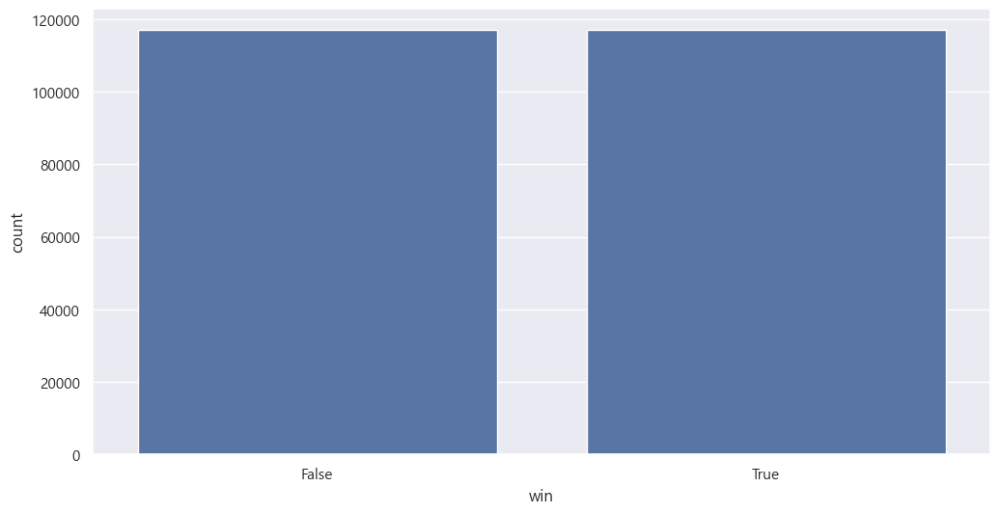

In [269]:
sns.countplot(x=low_tier_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [270]:
low_tier_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    132930
True     101080
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

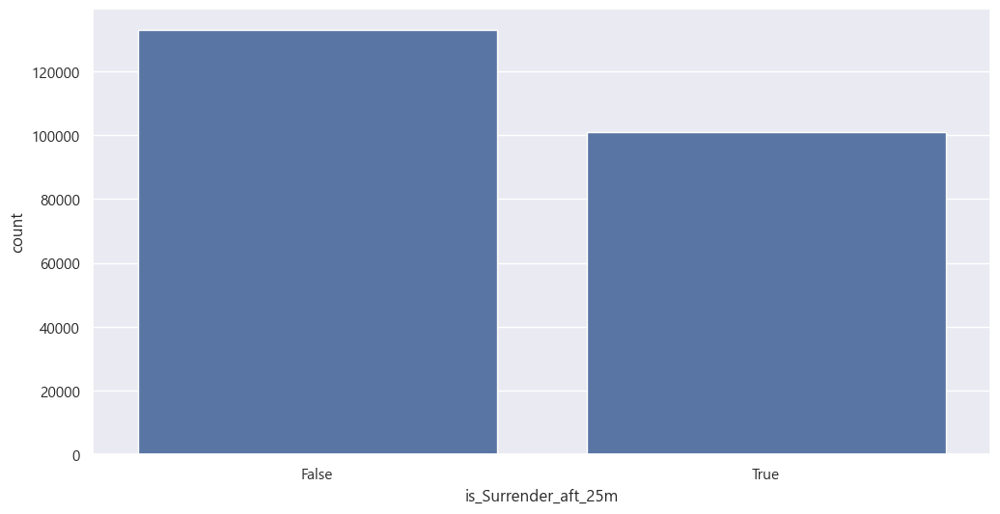

In [271]:
sns.countplot(x=low_tier_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [272]:
low_tier_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    234010
Name: count, dtype: int64

### 일반 핑

In [273]:
low_tier_ping['commandPings'].value_counts()

commandPings
0.000000    59932
0.125000     2989
0.250000     2918
0.200000     2836
0.062500     2626
            ...  
1.871795        1
1.731707        1
1.473684        1
2.480000        1
1.063830        1
Name: count, Length: 1676, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

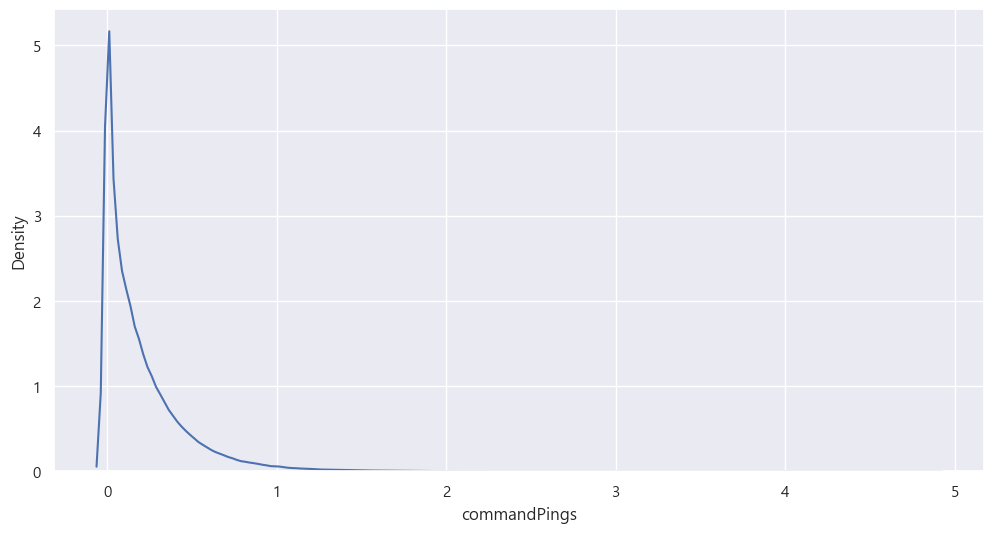

In [274]:
sns.kdeplot(x=low_tier_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

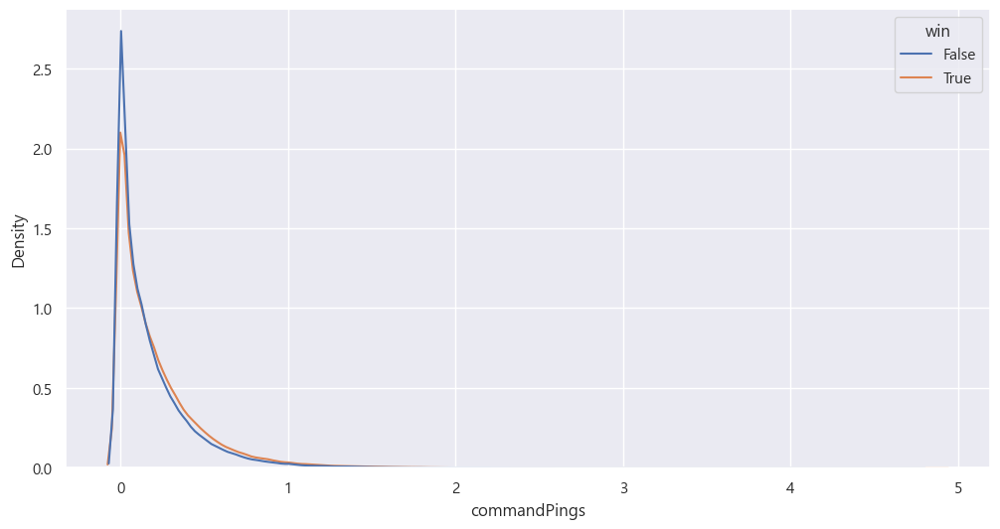

In [275]:
sns.kdeplot(x=low_tier_ping['commandPings'],hue=low_tier_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [276]:
low_tier_ping['getBackPings'].value_counts()

getBackPings
0.000000    110403
0.062500      2516
0.125000      2241
0.066667      2133
0.034483      1889
             ...  
1.552632         1
1.918919         1
1.275000         1
0.471698         1
1.423077         1
Name: count, Length: 1249, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

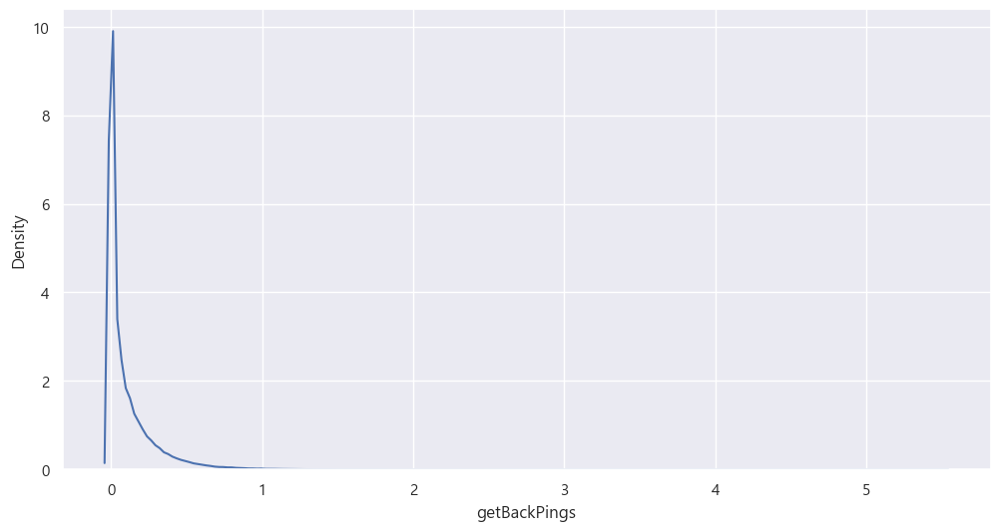

In [277]:
sns.kdeplot(x=low_tier_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

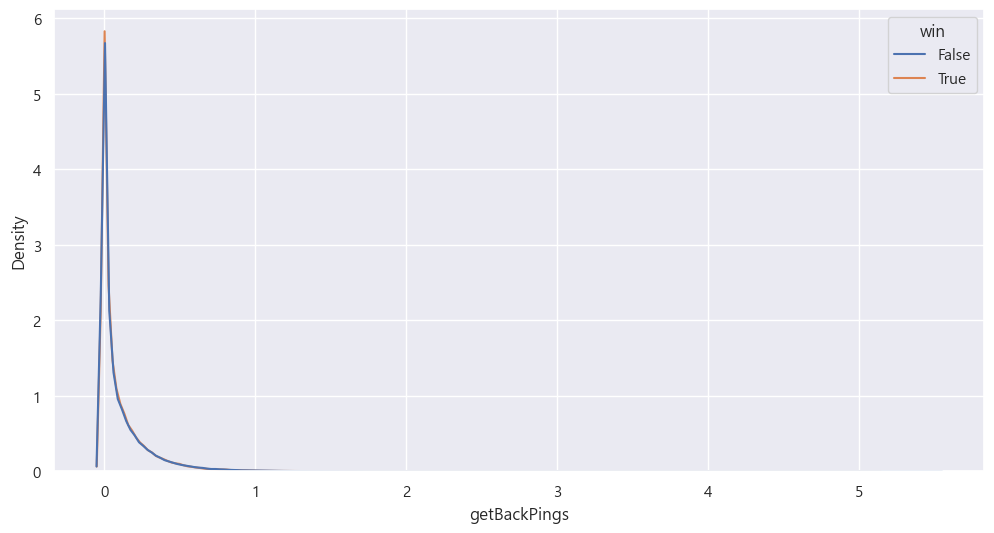

In [278]:
sns.kdeplot(x=low_tier_ping['getBackPings'],hue=low_tier_ping['win'])

### 압박핑 -> 정작 브론즈급에선 사용된 적이 없음

In [279]:
low_tier_ping['holdPings'].value_counts()

holdPings
0.0    234010
Name: count, dtype: int64

### 가는중 핑

In [280]:
low_tier_ping['onMyWayPings'].value_counts()

onMyWayPings
0.000000    49844
0.250000     2844
0.125000     2796
0.200000     2621
0.062500     2614
            ...  
2.923077        1
2.302326        1
2.279070        1
2.148148        1
2.862069        1
Name: count, Length: 2037, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

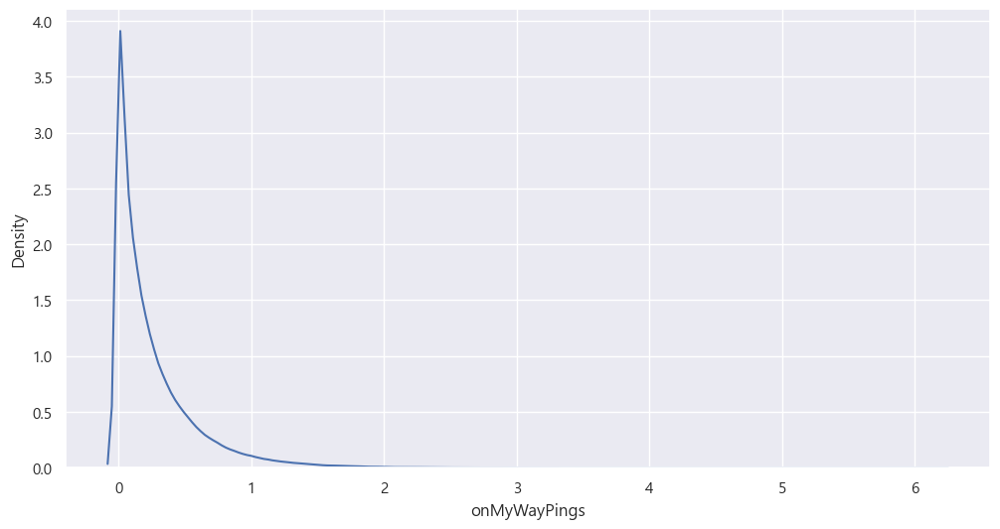

In [281]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

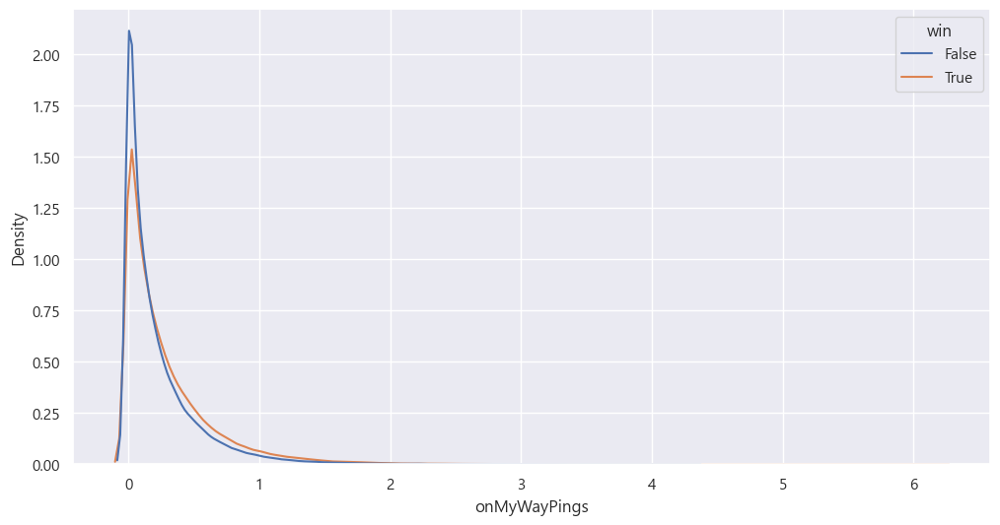

In [282]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'],hue=low_tier_ping['win'])

### 총공격핑

In [283]:
low_tier_ping['allInPings'].value_counts()

allInPings
0.000000    197710
0.033333      1516
0.034483      1502
0.035714      1472
0.032258      1447
             ...  
0.405405         1
0.821429         1
1.105263         1
1.260870         1
0.875000         1
Name: count, Length: 509, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

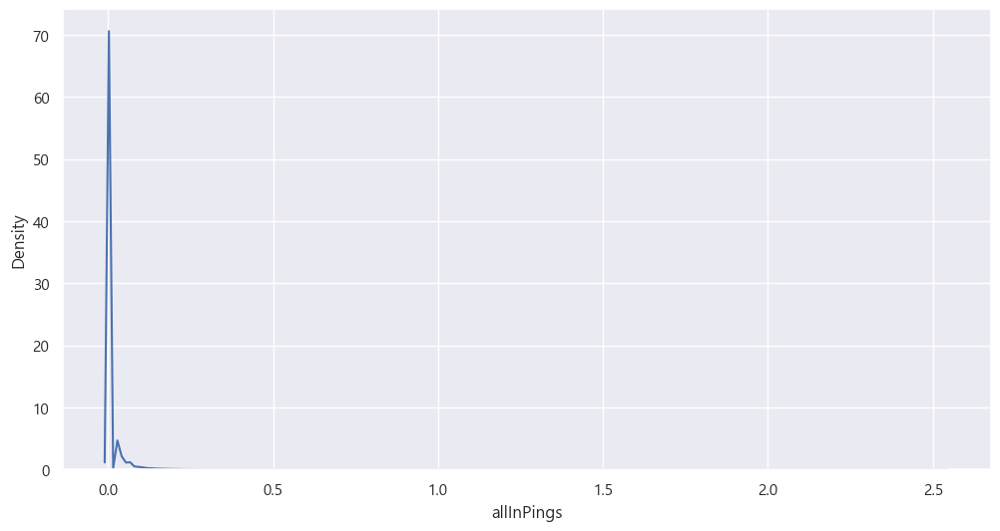

In [284]:
sns.kdeplot(x=low_tier_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

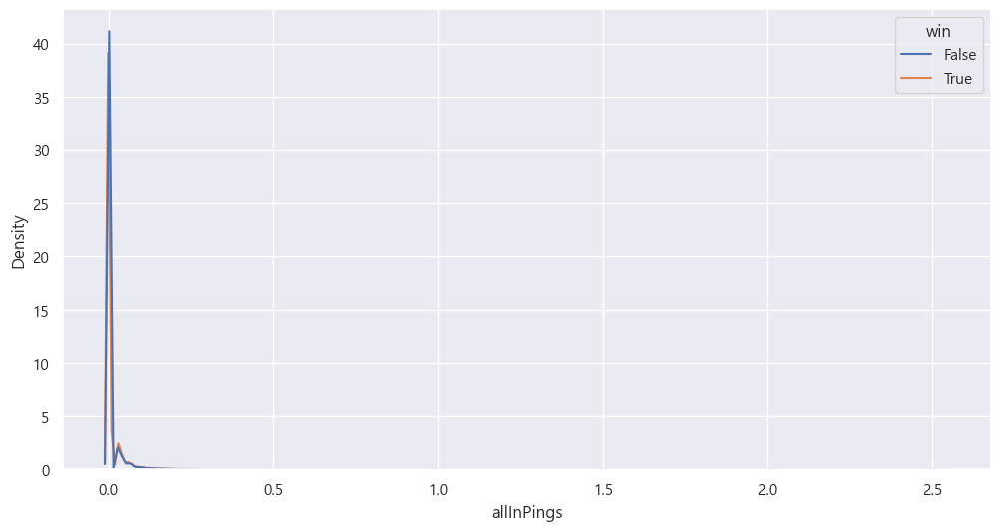

In [285]:
sns.kdeplot(x=low_tier_ping['allInPings'],hue=low_tier_ping['win'])

### 지원핑

In [286]:
low_tier_ping['assistMePings'].value_counts()

assistMePings
0.000000    101583
0.062500      2815
0.066667      2505
0.125000      2266
0.034483      2229
             ...  
1.295455         1
0.196429         1
0.660714         1
1.236842         1
1.894737         1
Name: count, Length: 1248, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

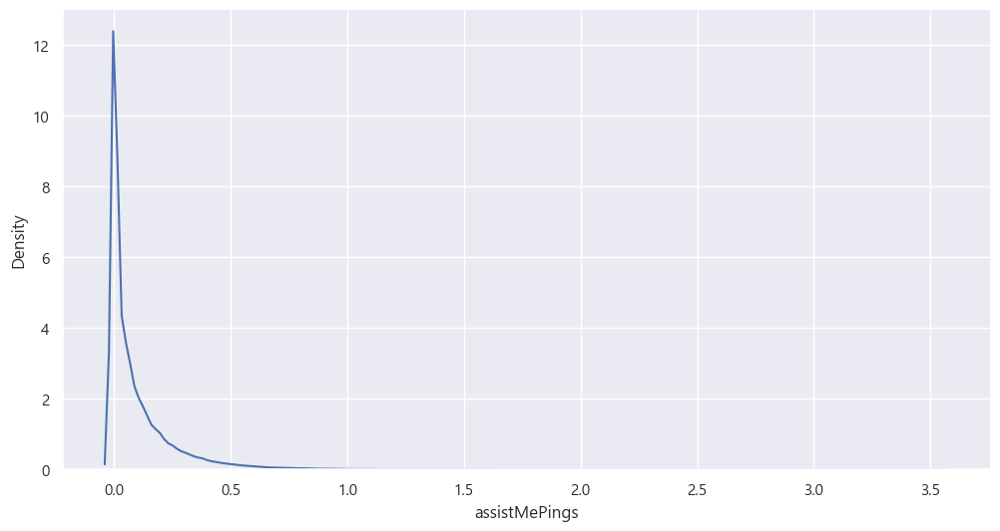

In [287]:
sns.kdeplot(x=low_tier_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

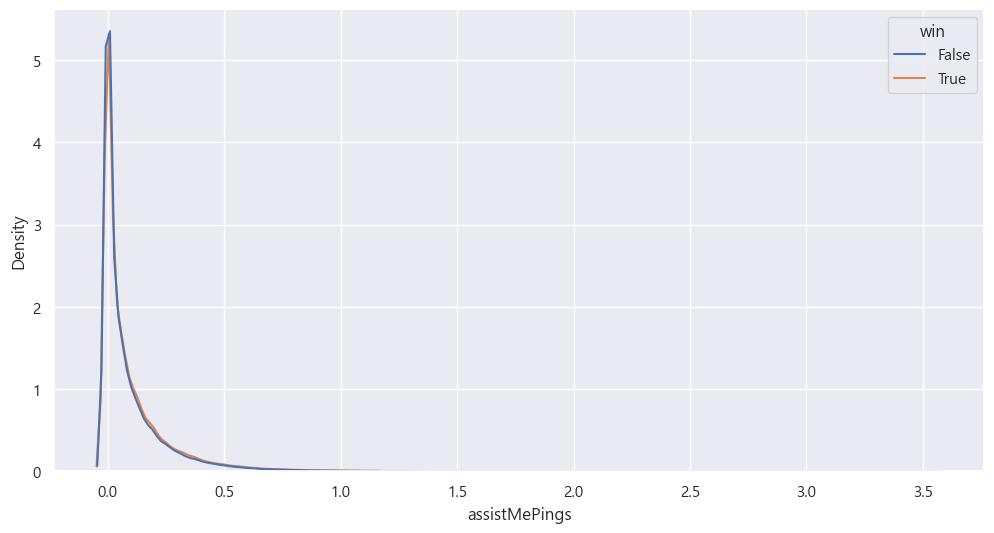

In [288]:
sns.kdeplot(x=low_tier_ping['assistMePings'],hue=low_tier_ping['win'])

### 시야 필요함 핑

In [289]:
low_tier_ping['needVisionPings'].value_counts()

needVisionPings
0.000000    199146
0.033333      1477
0.034483      1460
0.035714      1408
0.032258      1354
             ...  
0.379310         1
0.513514         1
0.317073         1
0.419355         1
0.434783         1
Name: count, Length: 415, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='Density'>

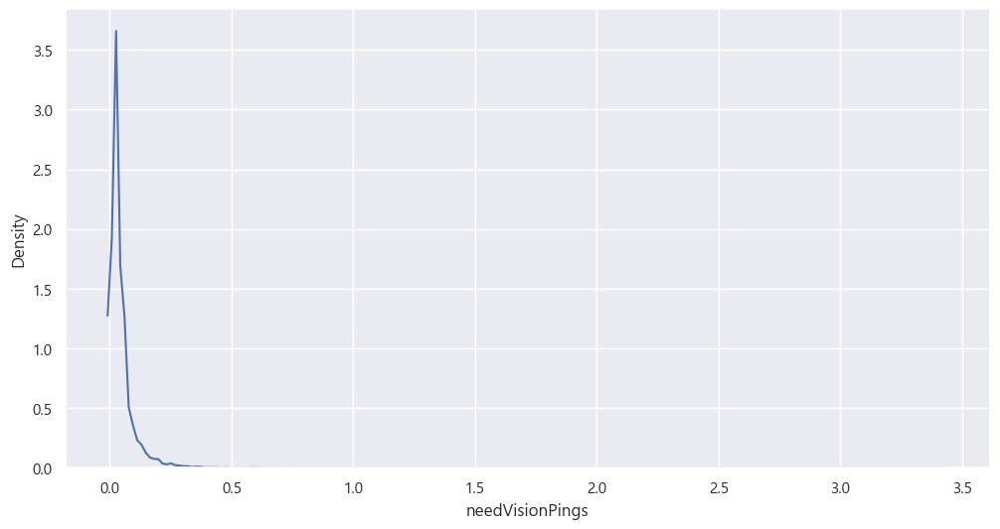

In [292]:
sns.kdeplot(x=low_tier_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='Density'>

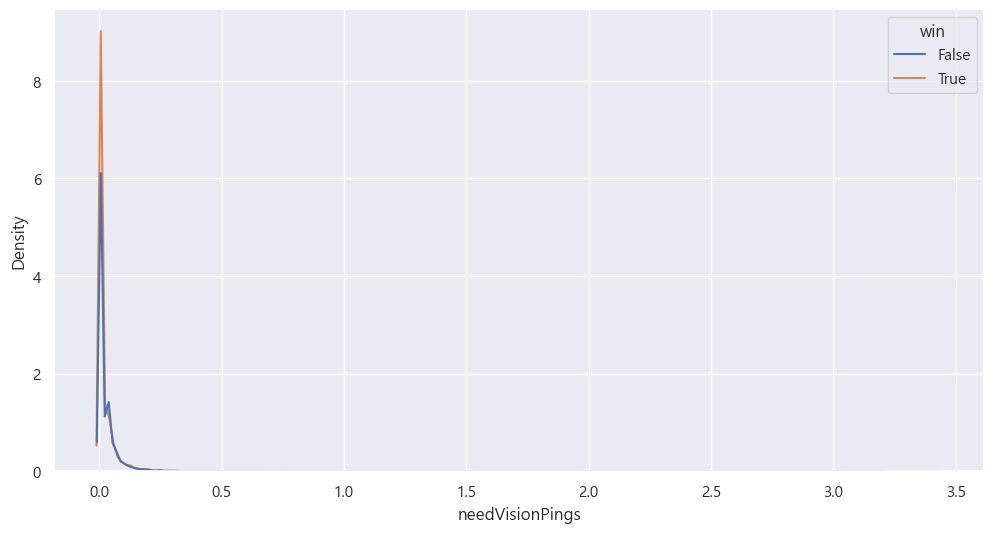

In [295]:
sns.kdeplot(x=low_tier_ping['needVisionPings'],hue=low_tier_ping['win'])

### 미아핑

In [296]:
low_tier_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0.000000    52577
0.125000     3241
0.250000     3192
0.200000     3027
0.062500     2985
            ...  
0.192982        1
1.212121        1
1.818182        1
1.878788        1
2.303030        1
Name: count, Length: 1376, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

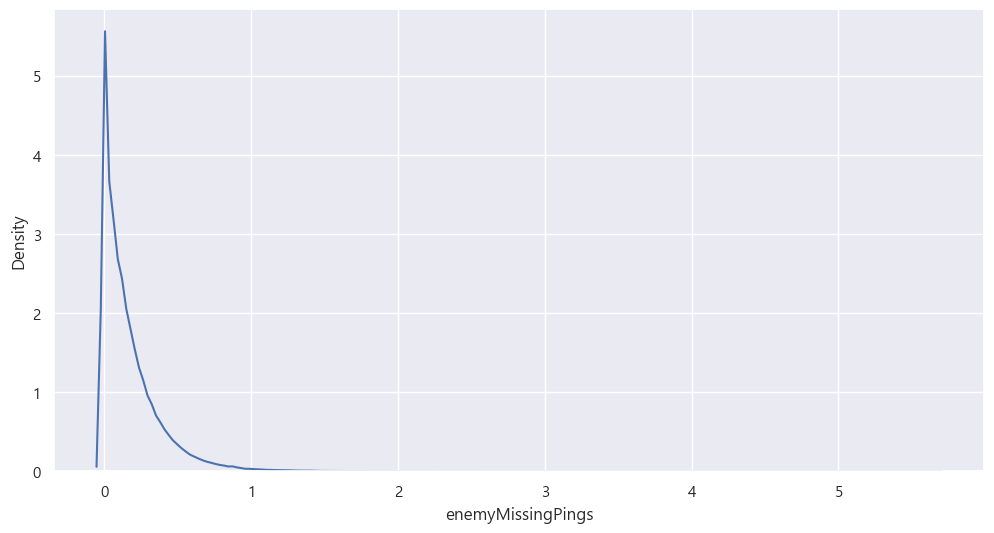

In [297]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

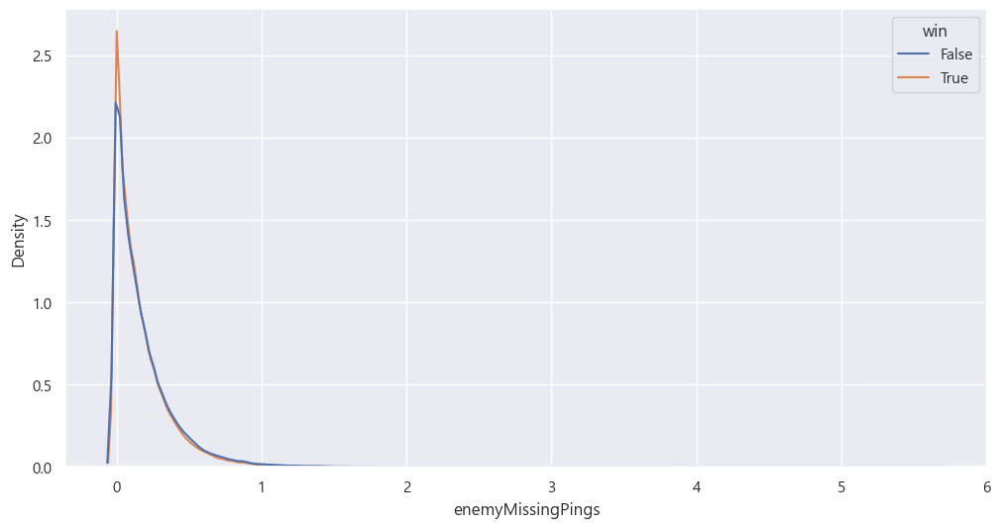

In [298]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'],hue = low_tier_ping['win'])

### 적 와드 / 시야핑

In [299]:
low_tier_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0.000000    139202
0.062500      2348
0.066667      2075
0.033333      2037
0.034483      2035
             ...  
0.770833         1
0.288462         1
0.469388         1
0.780488         1
0.087719         1
Name: count, Length: 759, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

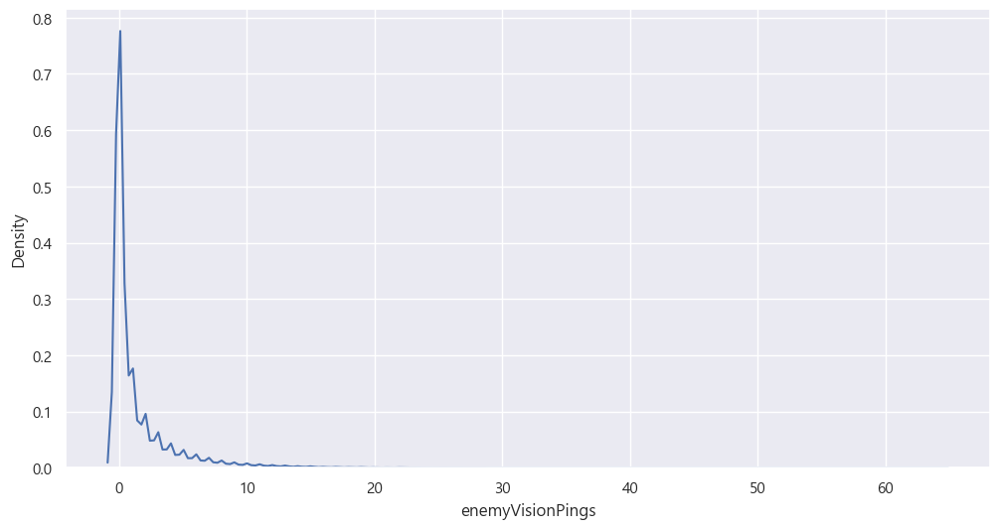

In [300]:
sns.kdeplot(x=bronze_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

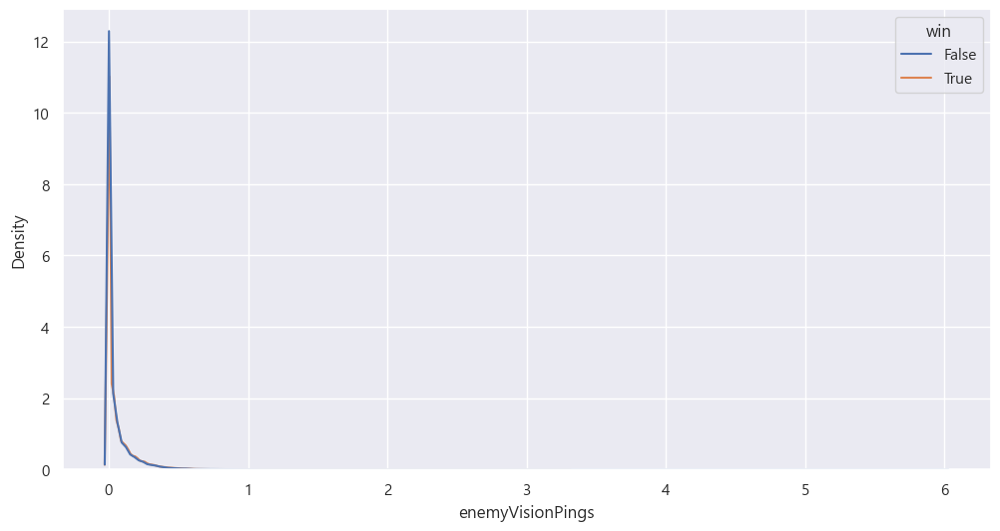

In [301]:
sns.kdeplot(x=low_tier_ping['enemyVisionPings'],hue=low_tier_ping['win'])

## 핑과 승패사이의 상관관계를 봐봅시다.

In [155]:
mid_tier_ping['pings'] = mid_tier_ping['commandPings'] + mid_tier_ping['getBackPings'] + mid_tier_ping['holdPings'] +mid_tier_ping['onMyWayPings'] + mid_tier_ping['allInPings'] + mid_tier_ping['assistMePings'] + mid_tier_ping['needVisionPings'] +mid_tier_ping['enemyMissingPings'] + mid_tier_ping['enemyVisionPings']
mid_tier_ping=mid_tier_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\1932186277.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mid_tier_ping['pings'] = mid_tier_ping['commandPings'] + mid_tier_ping['getBackPings'] + mid_tier_ping['holdPings'] +mid_tier_ping['onMyWayPings'] + mid_tier_ping['allInPings'] + mid_tier_ping['assistMePings'] + mid_tier_ping['needVisionPings'] +mid_tier_ping['enemyMissingPings'] + mid_tier_ping['enemyVisionPings']


In [156]:
mid_tier_ping['win']=mid_tier_ping['win'].astype(int)

In [323]:
mid_tier_ping_ready

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high+,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high+,onMyWayPings_group_low,onMyWayPings_group_mid,onMyWayPings_group_high,assistMePings_group_low,assistMePings_group_mid+,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_low,enemyVisionPings_group_mid+,needVisionPings_group_use,allInPings_group_use
0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1,0,1,0,0,0,1,0,1,0,0,1,0,1,0,0,1,0,1,0
2,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0
3,0,1,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,1
4,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31815,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1
31816,1,1,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,0,0
31817,1,1,0,0,1,0,0,1,0,0,1,0,1,0,0,1,0,1,0
31818,1,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0


In [324]:
corr_ping=mid_tier_ping.corr()
corr_ping

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high+,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high+,onMyWayPings_group_low,onMyWayPings_group_mid,onMyWayPings_group_high,assistMePings_group_low,assistMePings_group_mid+,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_low,enemyVisionPings_group_mid+,needVisionPings_group_use,allInPings_group_use
win,1.000000,0.034466,0.019337,0.009813,0.019307,0.008032,0.000565,0.068141,0.029405,0.015006,0.041700,0.007967,0.018292,-0.008373,-0.008343,0.014981,-0.000346,0.017081,0.035186
commandPings_group_low,0.034466,1.000000,-0.417887,-0.103294,0.076446,-0.016217,-0.014459,0.169588,-0.025702,-0.026466,0.123208,-0.037279,0.090948,-0.017822,-0.007889,-0.003128,-0.003721,0.026642,0.030093
commandPings_group_mid,0.019337,-0.417887,1.000000,-0.007968,0.034001,0.063042,0.037684,0.024357,0.087178,0.053239,0.080495,0.090318,0.029216,0.061275,0.015099,0.008514,0.017869,0.081639,0.101949
commandPings_group_high+,0.009813,-0.103294,-0.007968,1.000000,0.009639,0.026450,0.033284,-0.016617,0.059784,0.084299,0.013316,0.074861,-0.000490,0.036840,0.023661,0.005973,0.022868,0.030482,0.038858
getBackPings_group_low,0.019307,0.076446,0.034001,0.009639,1.000000,-0.091028,-0.037870,0.166202,0.020289,0.005964,0.178376,0.007129,0.122458,0.015979,0.001676,0.100849,0.008644,0.089369,0.093193
getBackPings_group_mid,0.008032,-0.016217,0.063042,0.026450,-0.091028,1.000000,-0.002252,0.000130,0.072899,0.057552,0.034230,0.089884,0.012958,0.035590,0.013367,0.026184,0.006317,0.055543,0.056147
getBackPings_group_high+,0.000565,-0.014459,0.037684,0.033284,-0.037870,-0.002252,1.000000,-0.007547,0.041149,0.055081,0.007065,0.092889,-0.000031,0.035332,0.019144,0.011275,0.002465,0.028994,0.030362
onMyWayPings_group_low,0.068141,0.169588,0.024357,-0.016617,0.166202,0.000130,-0.007547,1.000000,-0.214165,-0.096728,0.272953,-0.023082,0.153308,0.009929,-0.000030,0.079446,0.005111,0.086538,0.104870
onMyWayPings_group_mid,0.029405,-0.025702,0.087178,0.059784,0.020289,0.072899,0.041149,-0.214165,1.000000,-0.003582,0.047431,0.115099,0.016224,0.033256,0.013234,0.020223,0.013177,0.072168,0.096345
onMyWayPings_group_high,0.015006,-0.026466,0.053239,0.084299,0.005964,0.057552,0.055081,-0.096728,-0.003582,1.000000,0.012270,0.135141,0.004755,0.031760,0.005200,0.010091,0.009781,0.031804,0.053908


<Axes: >

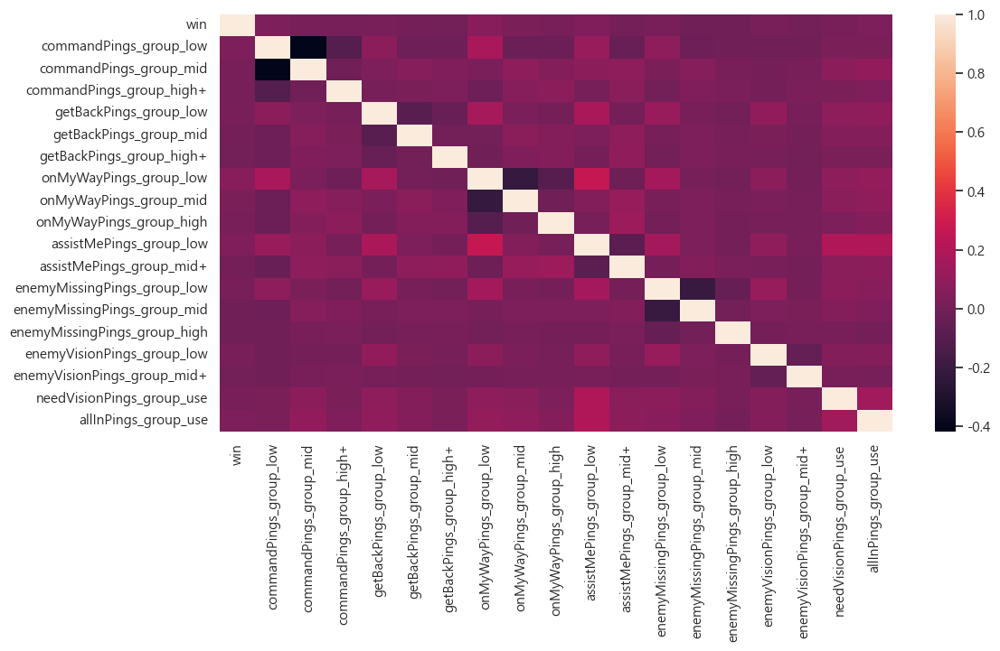

In [325]:
sns.heatmap(corr_ping)

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [161]:
from scipy.stats import levene

stat, p = levene(mid_tier_ping['pings'], mid_tier_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 28127.296, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [162]:
win_pings=mid_tier_ping[mid_tier_ping['win'] == 1]['pings']
lose_pings=mid_tier_ping[~(mid_tier_ping['win'] == 1)]['pings']

In [163]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,53.167706,400828.02231,two-sided,0.0,"[0.16, 0.17]",0.167104,inf,1.0


In [167]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(mid_tier_ping[ping], mid_tier_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    correction_ = p <= 0.05
    win_pings=mid_tier_ping[mid_tier_ping['win'] == 1][ping]
    lose_pings=mid_tier_ping[~(mid_tier_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 575776.909, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,36.359796,403342.298503,two-sided,5.431856e-289,"[0.03, 0.04]",0.114278,1.406e+284,1.0



getBackPings
Levene’s test: stat = 1918487.483, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,18.389012,403915.800735,two-sided,1.727511e-75,"[0.01, 0.01]",0.057796,8.833e+70,NaN



onMyWayPings
Levene’s test: stat = 144055.238, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,71.683341,392099.730332,two-sided,0.0,"[0.09, 0.1]",0.225298,inf,1.0



allInPings
Levene’s test: stat = 40108988.788, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,16.201684,399948.064114,two-sided,5.124021e-59,"[0.0, 0.0]",0.050921,3.383e+54,NaN



assistMePings
Levene’s test: stat = 2821886.997, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,24.520155,402892.350407,two-sided,1.127619e-132,"[0.01, 0.01]",0.077066,1.012e+128,NaN



needVisionPings
Levene’s test: stat = 82069396.726, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.212006,404217.289222,two-sided,2.181549e-16,"[0.0, 0.0]",0.02581,1.555e+12,NaN



enemyMissingPings
Levene’s test: stat = 1600298.196, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.469656,403520.382615,two-sided,0.638601,"[-0.0, 0.0]",0.001476,0.004,0.075629



enemyVisionPings
Levene’s test: stat = 3110522.082, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.398945,404927.903038,two-sided,1.375343e-13,"[0.0, 0.0]",0.023255,2.73e+09,1.0


In [165]:
low_tier_ping

NameError: name 'low_tier_ping' is not defined

## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

### 선형성 확보를 위한 다시 전처리....

#### commandPings

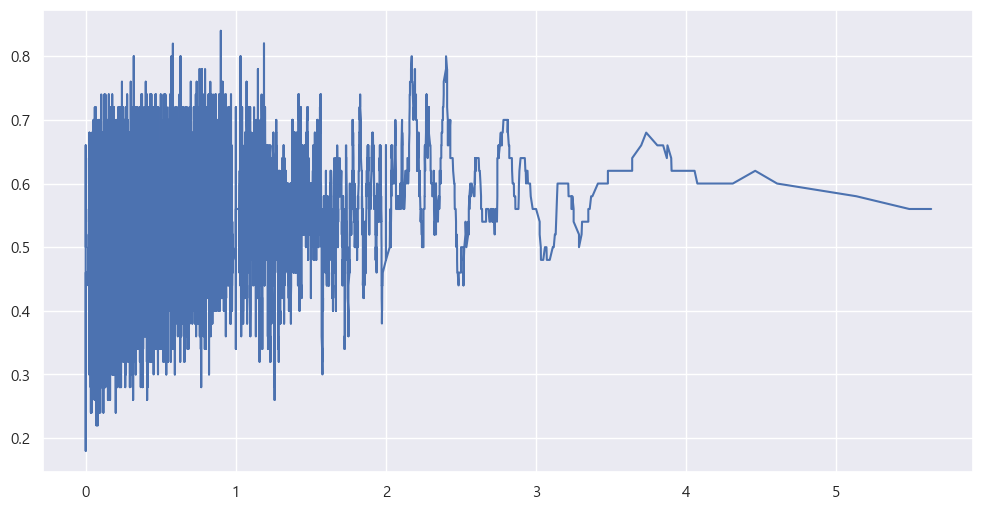

In [168]:
df_sorted = mid_tier_ping.sort_values('commandPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=50, min_periods=10).mean()
plt.plot(df_sorted['commandPings'], df_sorted['rolling_win'])

In [475]:
df_sorted['commandPings']

78       0.000000
88       0.000000
14140    0.000000
14113    0.000000
14114    0.000000
           ...   
9807     4.580645
5542     4.628571
3472     4.628571
683      4.730769
879      4.862069
Name: commandPings, Length: 234010, dtype: float64

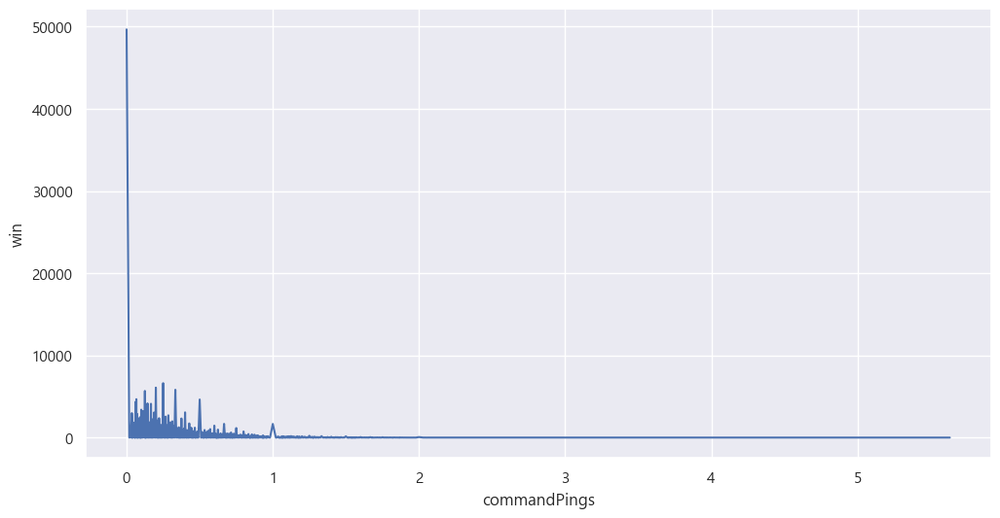

In [251]:
grouped=mid_tier_ping.groupby('commandPings')['win'].count().reset_index()
sns.lineplot(x='commandPings', y='win', data=grouped)
plt.grid(True)
plt.show()


<Axes: xlabel='commandPings_group', ylabel='win'>

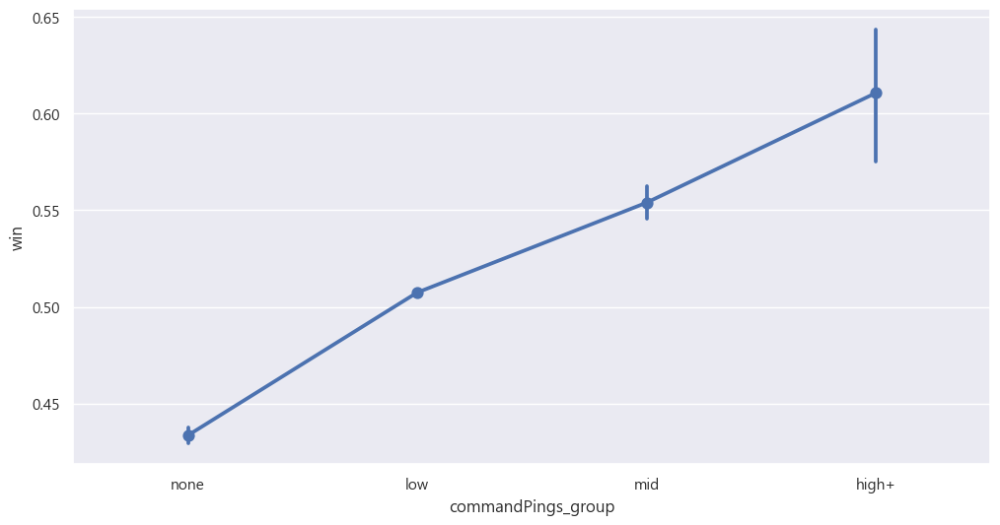

In [252]:
bins = [-1, 0, 1, 2, float('inf')]
labels = ['none', 'low', 'mid','high+']

mid_tier_ping['commandPings_group'] = pd.cut(mid_tier_ping['commandPings'], bins=bins, labels=labels)


sns.pointplot(x='commandPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='commandPings_group', ylabel='count'>

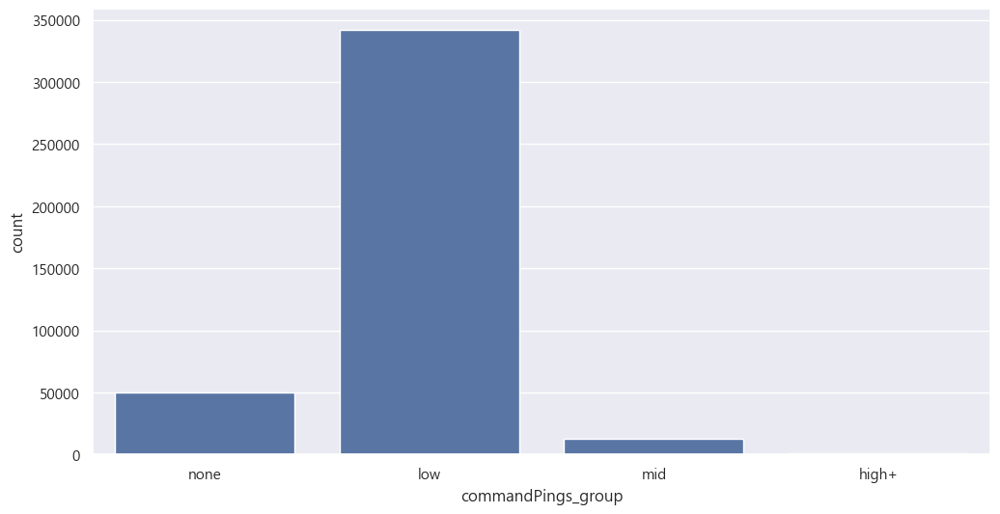

In [253]:
sns.countplot(x='commandPings_group', data=mid_tier_ping)

In [255]:
mid_tier_ping.groupby('commandPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\3923118962.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('commandPings_group')['win'].count()


commandPings_group
none      49660
low      341828
mid       12646
high+       796
Name: win, dtype: int64

#### getBackPings

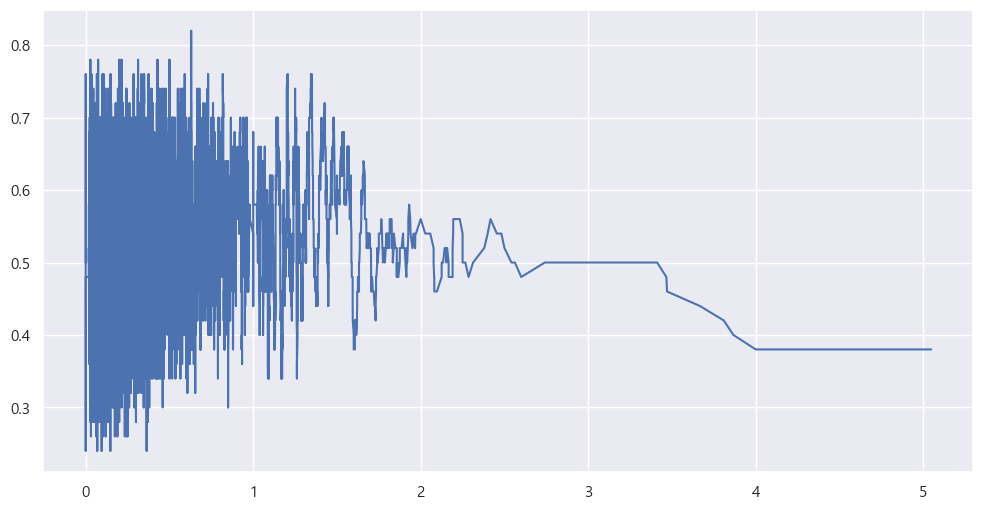

In [172]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('getBackPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=50, min_periods=10).mean()
plt.plot(df_sorted['getBackPings'], df_sorted['rolling_win'])

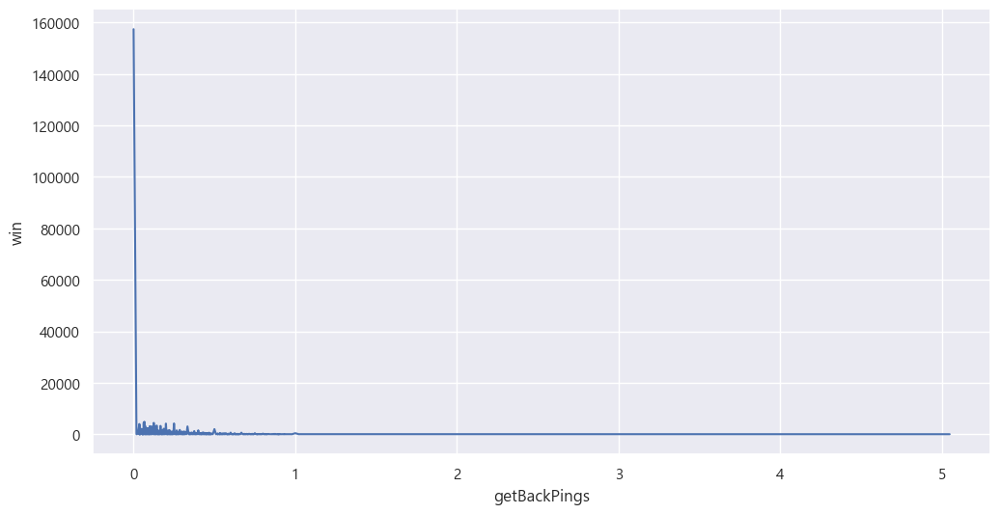

In [257]:
grouped=mid_tier_ping.groupby('getBackPings')['win'].count().reset_index()
sns.lineplot(x='getBackPings', y='win', data=grouped)
plt.grid(True)
plt.show()


<Axes: xlabel='getBackPings_group', ylabel='win'>

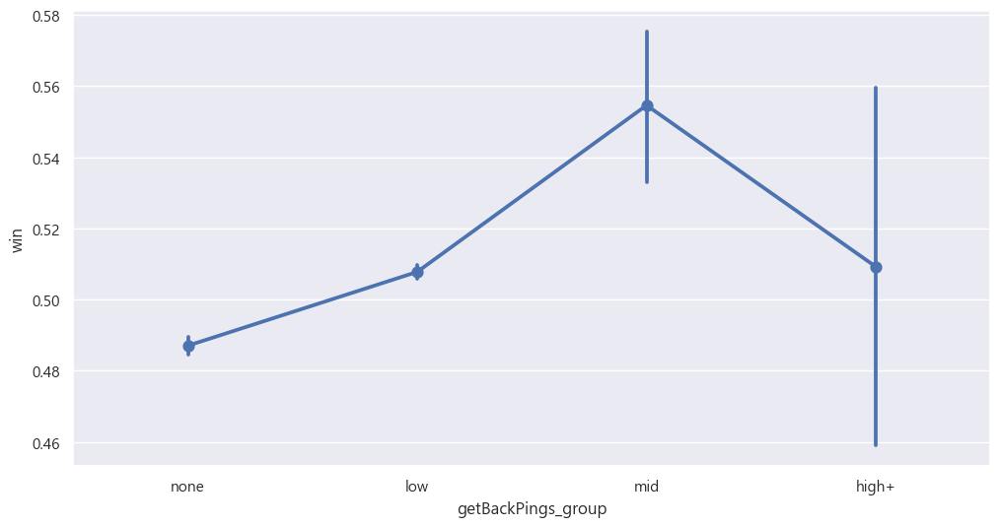

In [312]:
bins = [-1, 0, 1, 1.5, float('inf')]
labels = ['none', 'low', 'mid', 'high+']

mid_tier_ping['getBackPings_group'] = pd.cut(mid_tier_ping['getBackPings'], bins=bins, labels=labels)


sns.pointplot(x='getBackPings_group', y='win', data=mid_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\654601172.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()


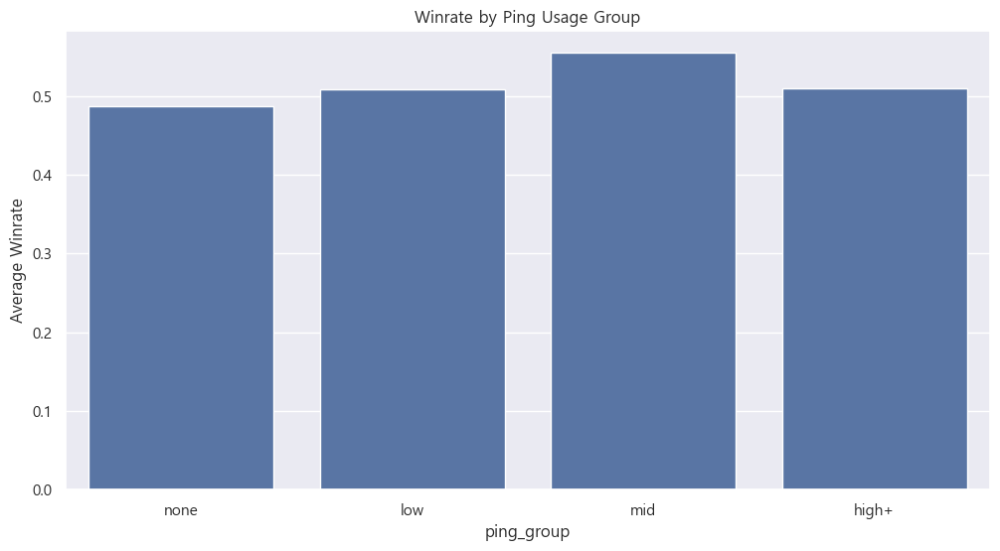

In [311]:
bins = [-1, 0, 1, 1.5, float('inf')]
labels = ['none', 'low', 'mid', 'high+']

mid_tier_ping['ping_group'] = pd.cut(mid_tier_ping['getBackPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='getBackPings_group', ylabel='count'>

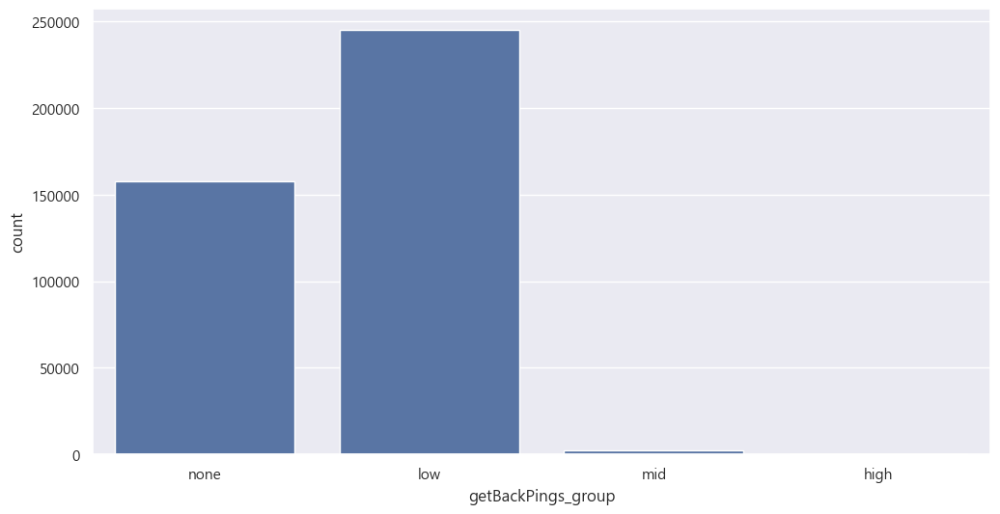

In [267]:
sns.countplot(x='getBackPings_group', data=mid_tier_ping)

In [310]:
mid_tier_ping.groupby('getBackPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\148667271.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('getBackPings_group')['win'].count()


getBackPings_group
none     157439
low      244932
mid        2180
high+       379
Name: win, dtype: int64

#### onMyWayPings

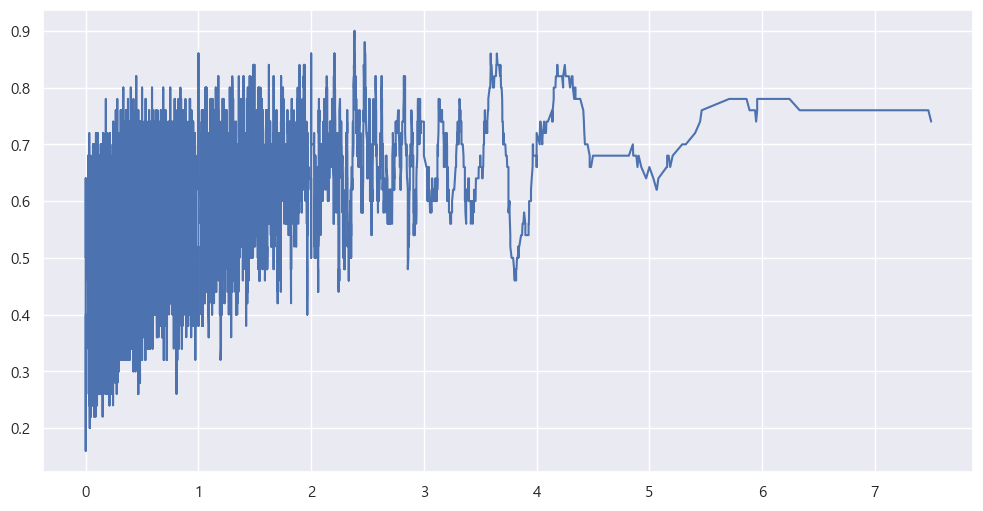

In [180]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('onMyWayPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=50, min_periods=10).mean()
plt.plot(df_sorted['onMyWayPings'], df_sorted['rolling_win'])

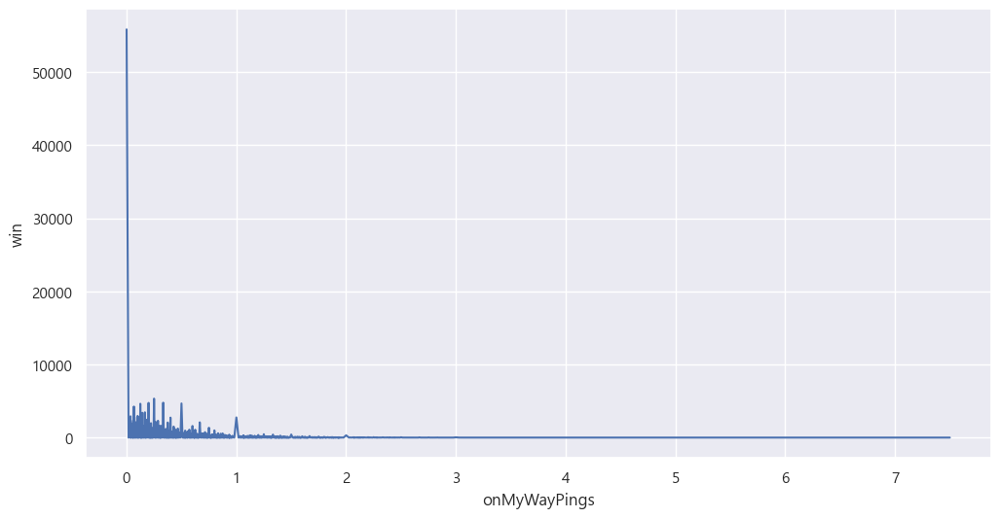

In [269]:
grouped=mid_tier_ping.groupby('onMyWayPings')['win'].count().reset_index()
sns.lineplot(x='onMyWayPings', y='win', data=grouped)
plt.grid(True)
plt.show()


<Axes: xlabel='onMyWayPings_group', ylabel='win'>

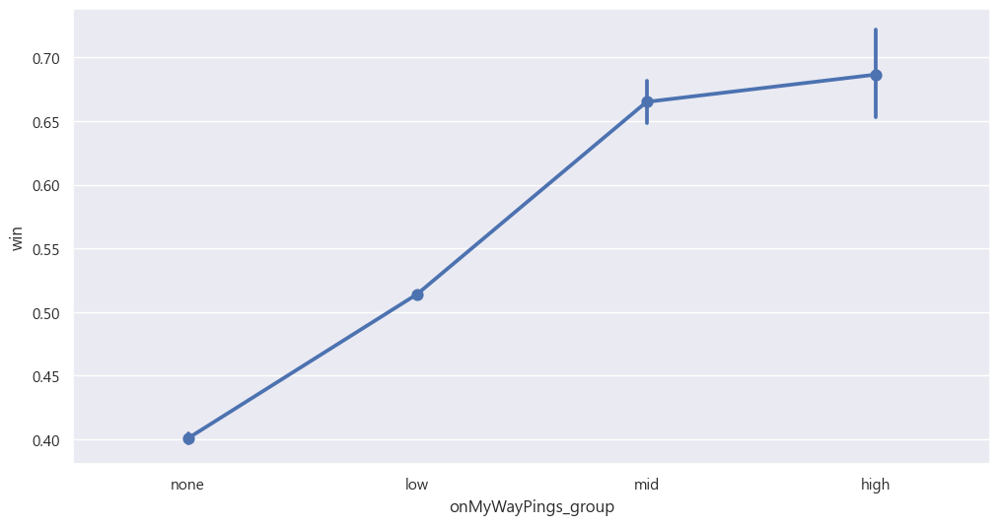

In [183]:
bins = [-1, 0, 2, 3, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['onMyWayPings_group'] = pd.cut(mid_tier_ping['onMyWayPings'], bins=bins, labels=labels)


sns.pointplot(x='onMyWayPings_group', y='win', data=mid_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\2754497597.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()


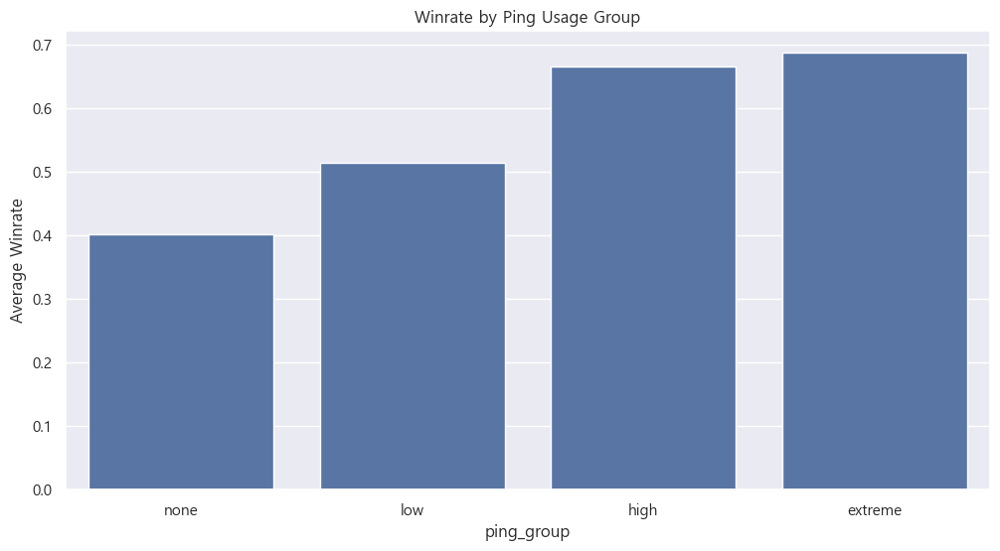

In [185]:
bins = [-1, 0, 2, 3, float('inf')]
labels = ['none', 'low', 'high', 'extreme']

mid_tier_ping['ping_group'] = pd.cut(mid_tier_ping['onMyWayPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='onMyWayPings_group', ylabel='count'>

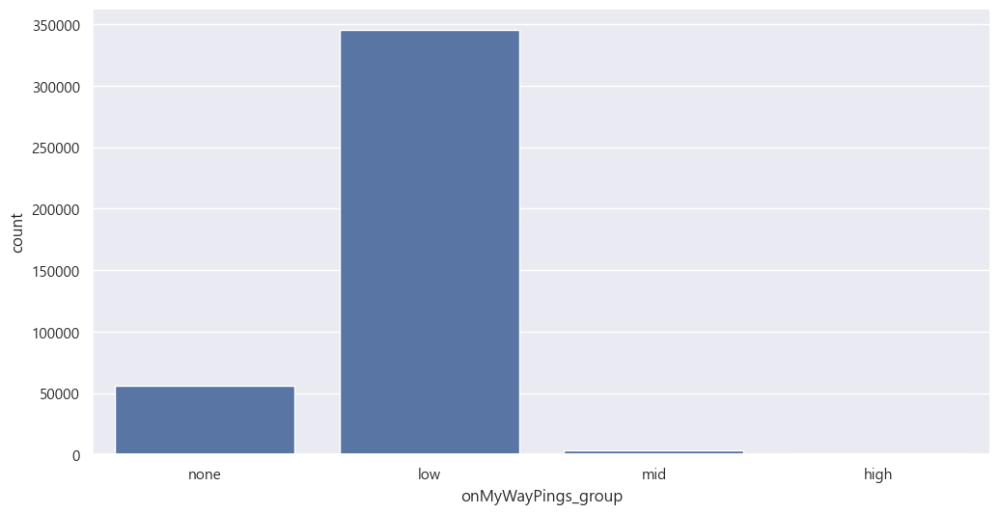

In [186]:
sns.countplot(x='onMyWayPings_group', data=mid_tier_ping)

In [270]:
mid_tier_ping.groupby('onMyWayPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\3766380191.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('onMyWayPings_group')['win'].count()


onMyWayPings_group
none     55852
low     345238
mid       3186
high       654
Name: win, dtype: int64

#### assistMePings

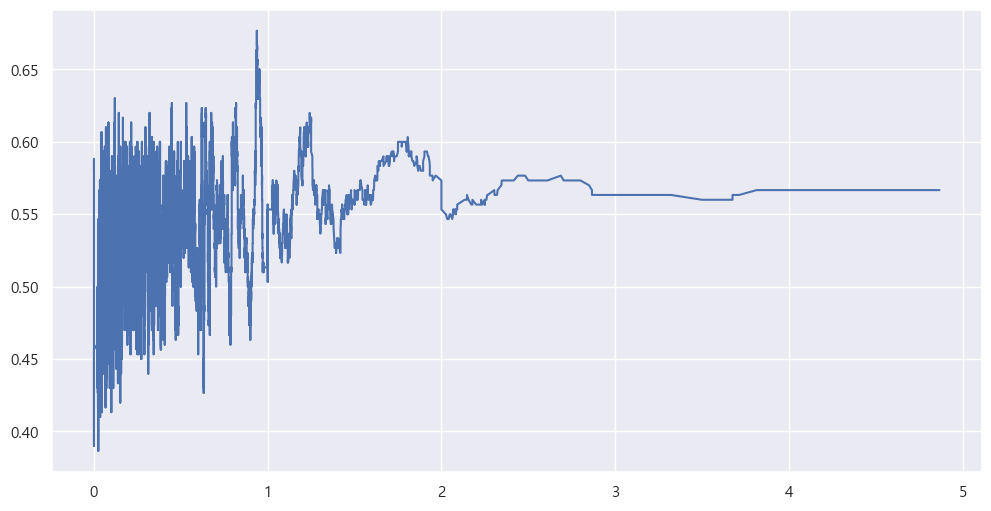

In [187]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('assistMePings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=300, min_periods=50).mean()
plt.plot(df_sorted['assistMePings'], df_sorted['rolling_win'])

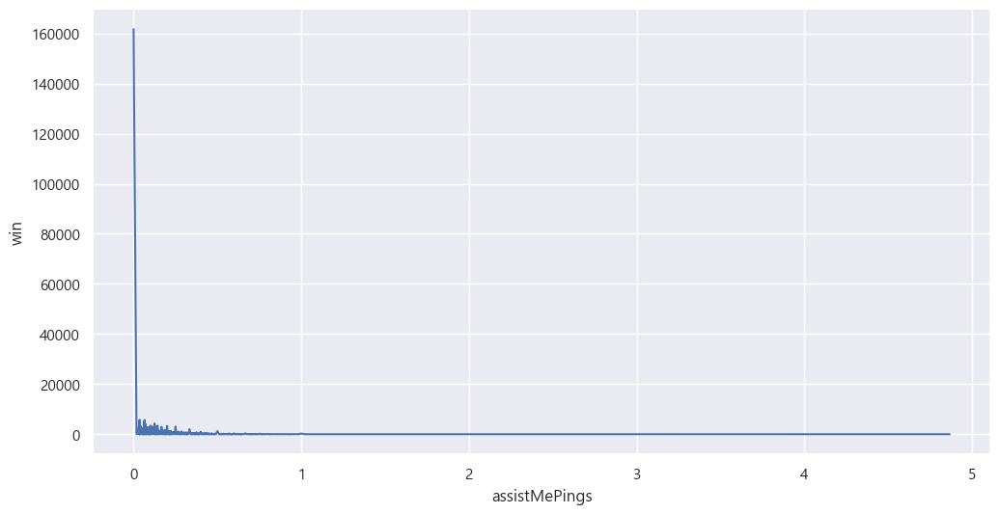

In [189]:
grouped=mid_tier_ping.groupby('assistMePings')['win'].count().reset_index()
sns.lineplot(x='assistMePings', y='win', data=grouped)
plt.grid(True)
plt.show()

<Axes: xlabel='assistMePings_group', ylabel='win'>

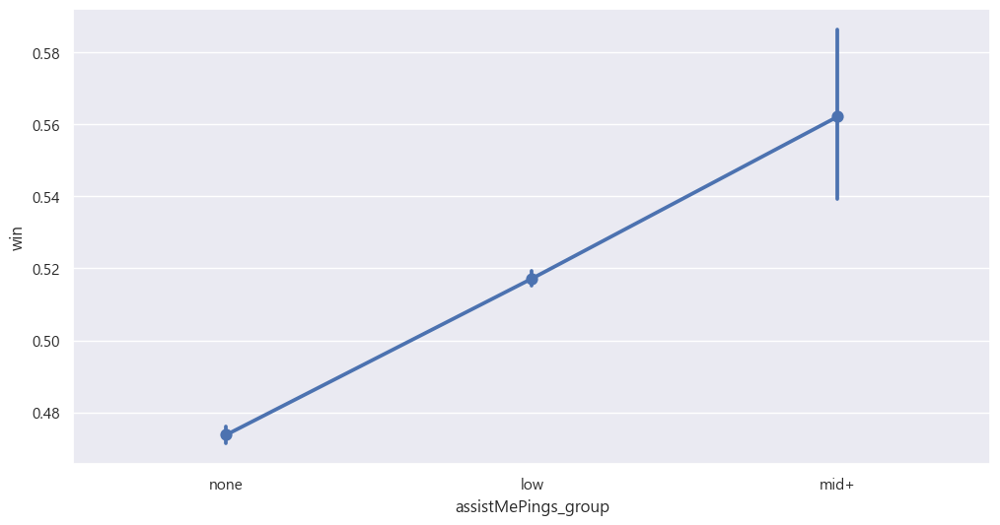

In [277]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'low', 'mid+']

mid_tier_ping['assistMePings_group'] = pd.cut(mid_tier_ping['assistMePings'], bins=bins, labels=labels)


sns.pointplot(x='assistMePings_group', y='win', data=mid_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\259843958.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()


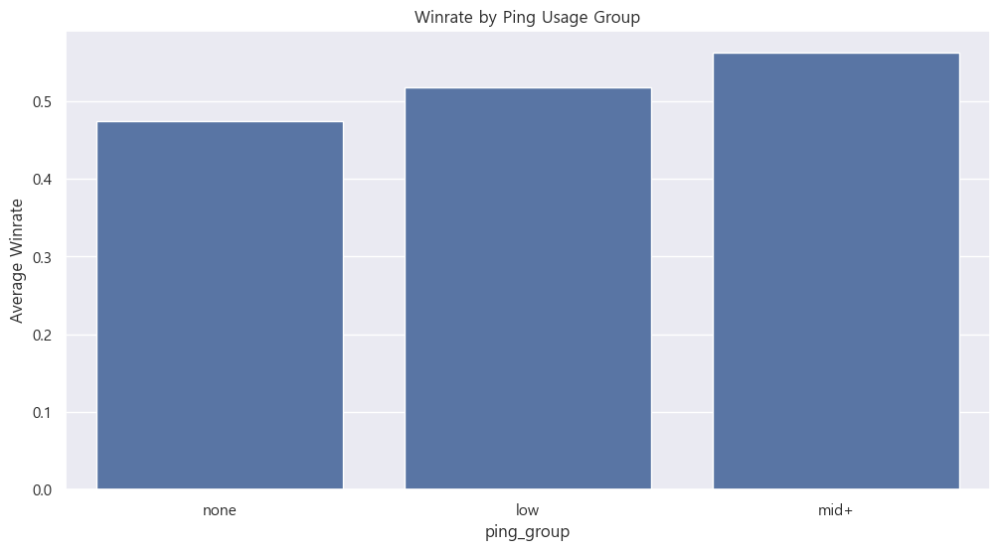

In [278]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'low', 'mid+']

mid_tier_ping['ping_group'] = pd.cut(mid_tier_ping['assistMePings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='assistMePings_group', ylabel='count'>

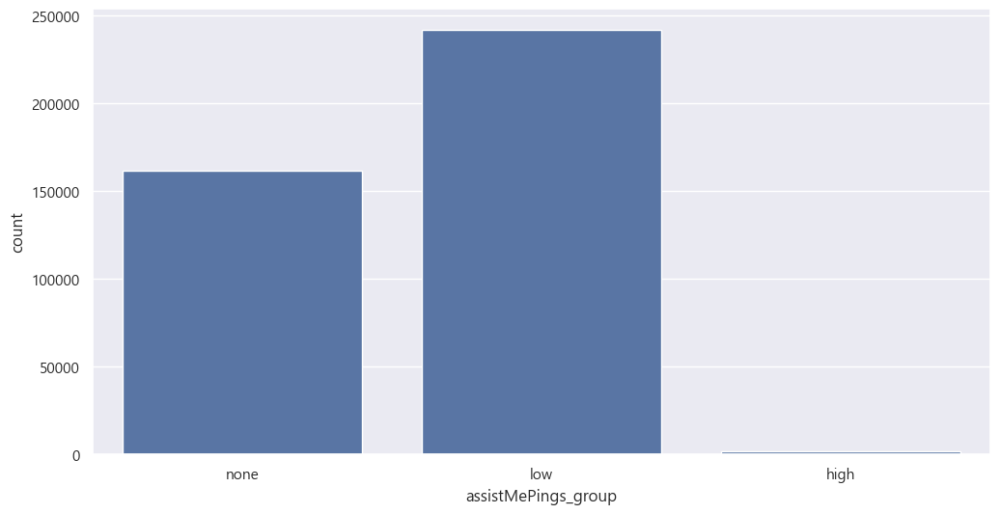

In [273]:
sns.countplot(x='assistMePings_group', data=mid_tier_ping)

In [280]:
mid_tier_ping.groupby('assistMePings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\738131732.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('assistMePings_group')['win'].count()


assistMePings_group
none    161724
low     241548
mid+      1658
Name: win, dtype: int64

#### enemyMissingPings

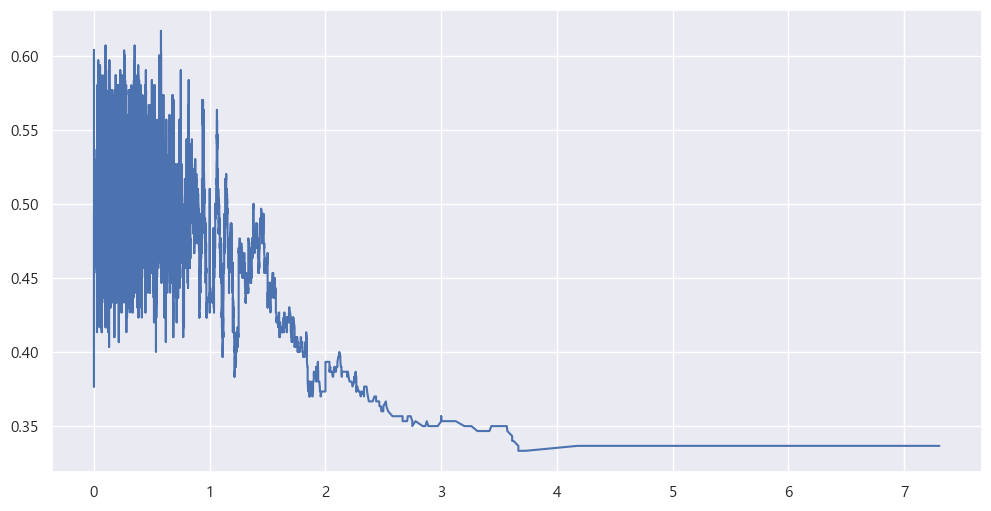

In [197]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('enemyMissingPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=300, min_periods=50).mean()
plt.plot(df_sorted['enemyMissingPings'], df_sorted['rolling_win'])

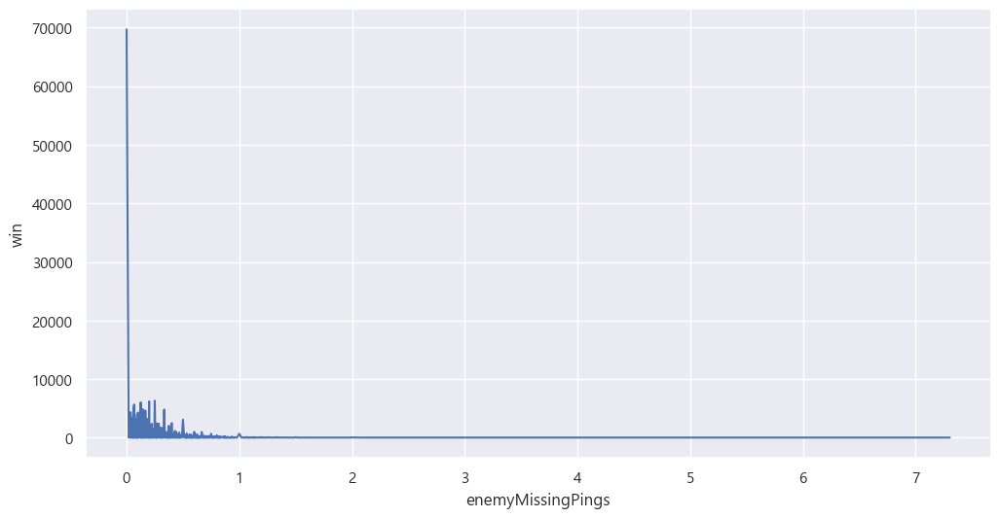

In [199]:
grouped=mid_tier_ping.groupby('enemyMissingPings')['win'].count().reset_index()
sns.lineplot(x='enemyMissingPings', y='win', data=grouped)
plt.grid(True)
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='win'>

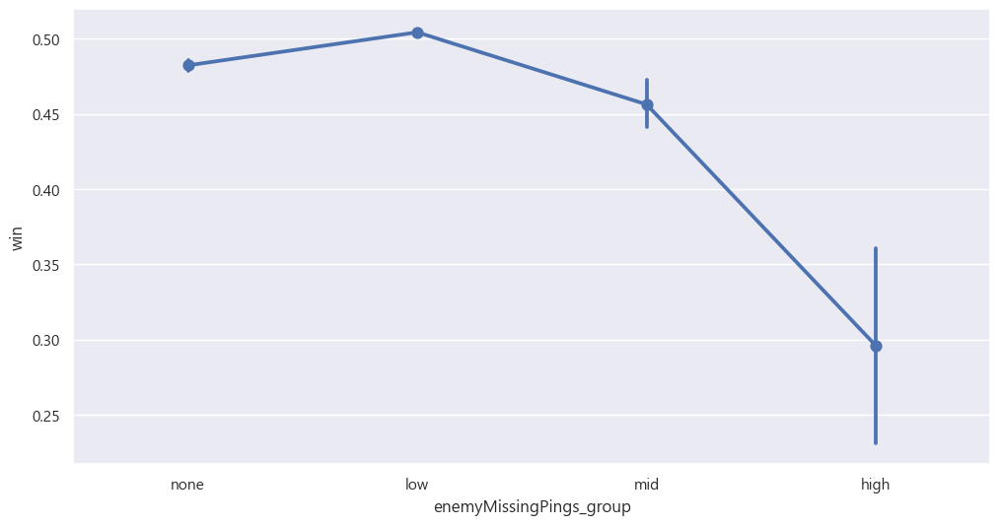

In [202]:
bins = [-1, 0, 1, 2, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['enemyMissingPings_group'] = pd.cut(mid_tier_ping['enemyMissingPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyMissingPings_group', y='win', data=mid_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\3247684310.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()


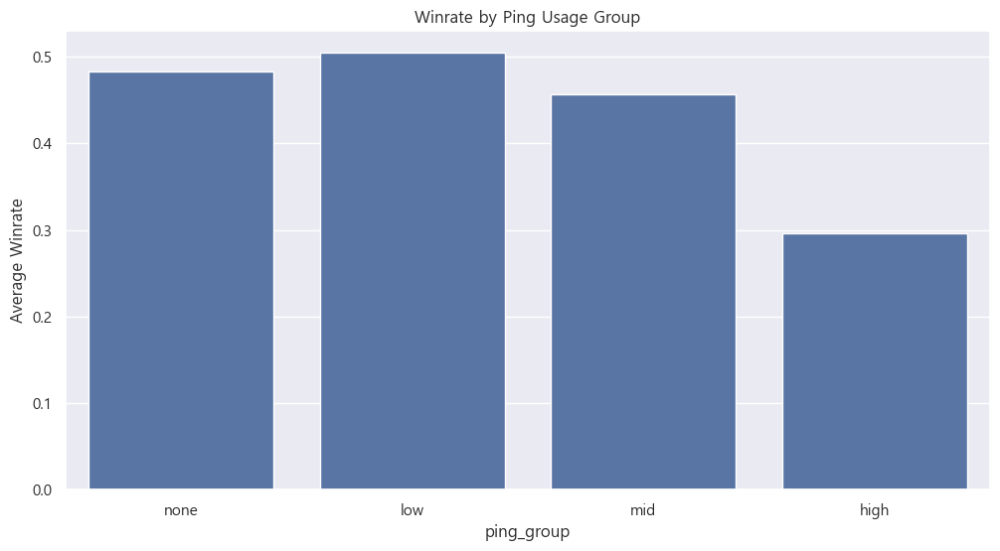

In [203]:
bins = [-1, 0, 1, 2, float('inf')]
labels = ['none', 'low', 'mid', 'high']

mid_tier_ping['ping_group'] = pd.cut(mid_tier_ping['enemyMissingPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='count'>

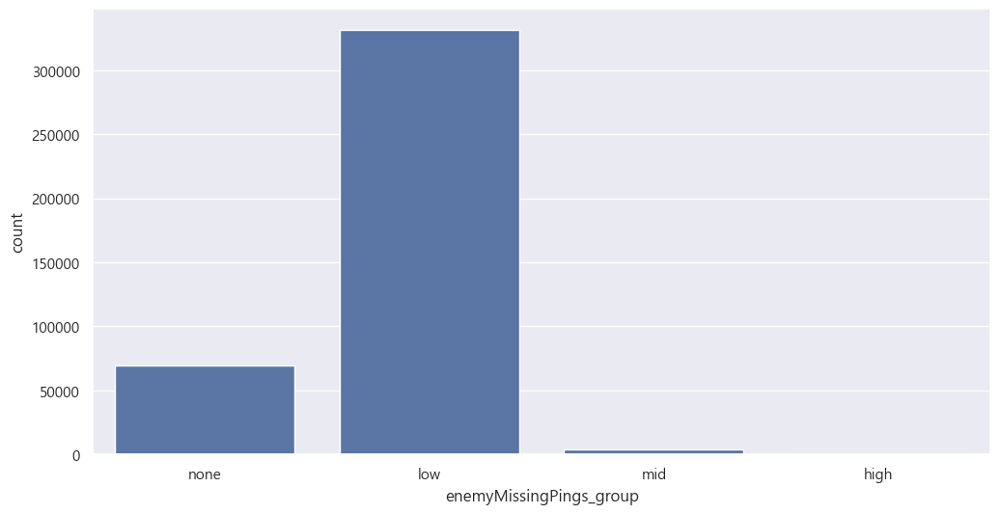

In [204]:
sns.countplot(x='enemyMissingPings_group', data=mid_tier_ping)

In [281]:
mid_tier_ping.groupby('enemyMissingPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\1270106915.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('enemyMissingPings_group')['win'].count()


enemyMissingPings_group
none     69709
low     331366
mid       3686
high       169
Name: win, dtype: int64

#### enemyVisionPings

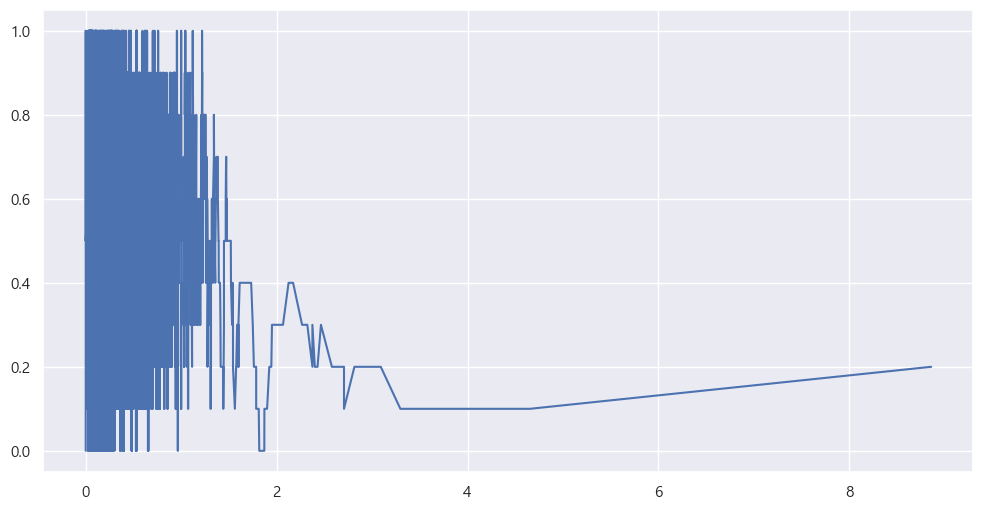

In [212]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('enemyVisionPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=10, min_periods=1).mean()
plt.plot(df_sorted['enemyVisionPings'], df_sorted['rolling_win'])

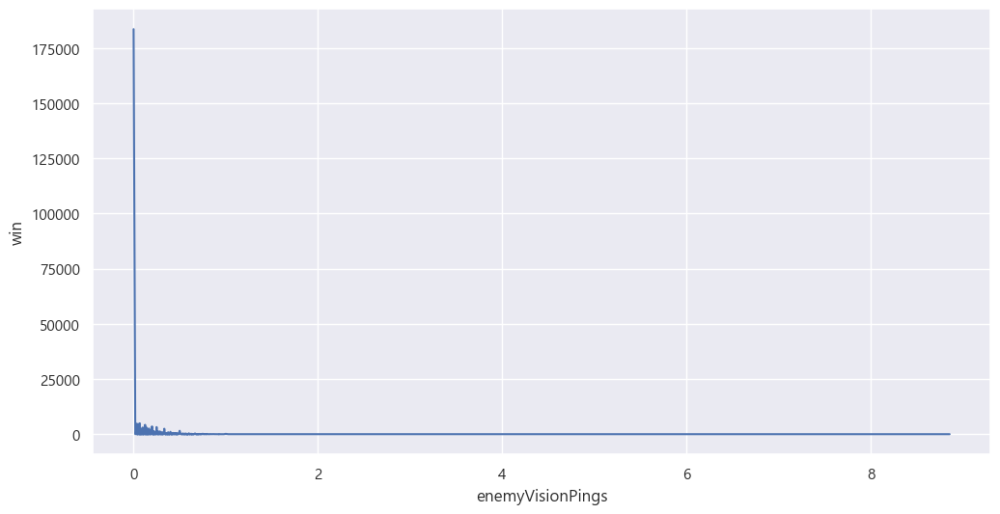

In [207]:
grouped=mid_tier_ping.groupby('enemyVisionPings')['win'].count().reset_index()
sns.lineplot(x='enemyVisionPings', y='win', data=grouped)
plt.grid(True)
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='win'>

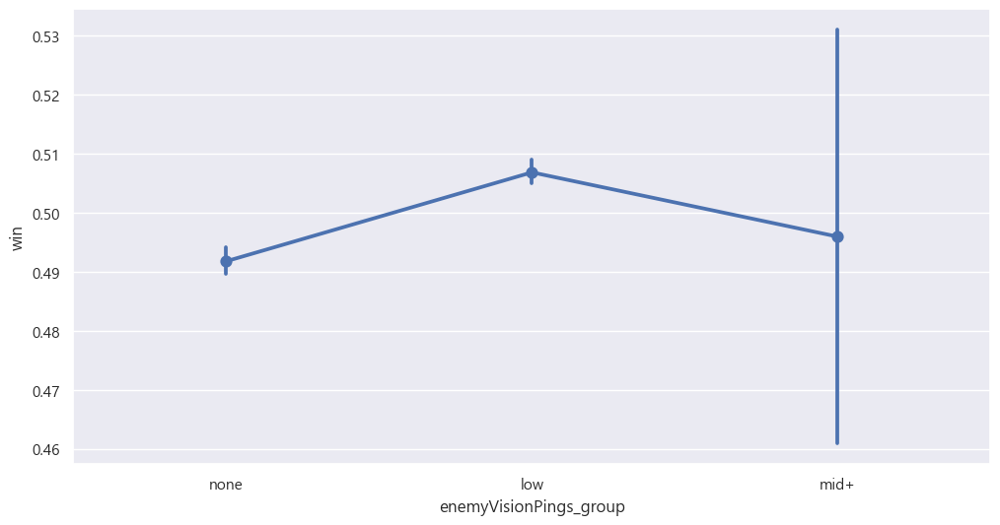

In [289]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'low','mid+']

mid_tier_ping['enemyVisionPings_group'] = pd.cut(mid_tier_ping['enemyVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyVisionPings_group', y='win', data=mid_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\3098873881.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()


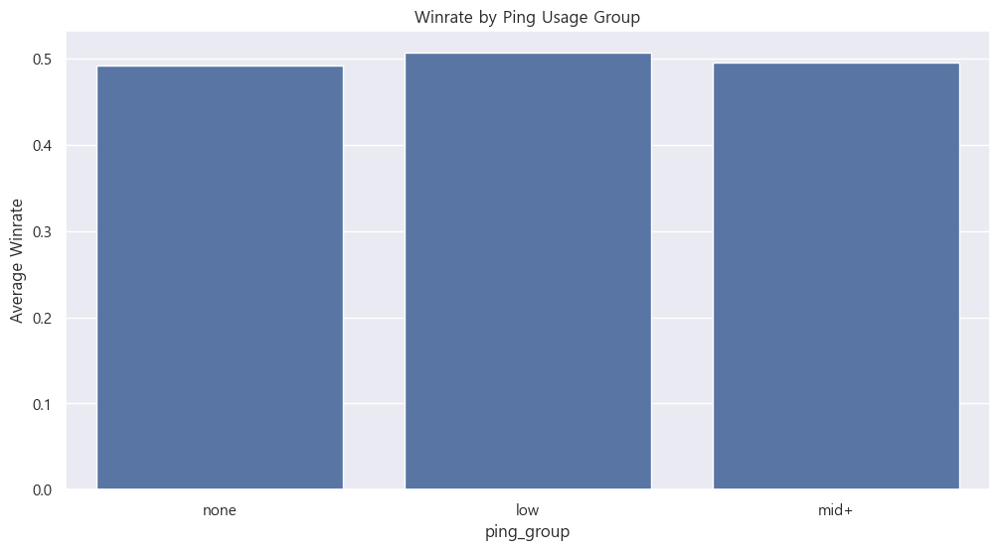

In [290]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'low','mid+']

mid_tier_ping['ping_group'] = pd.cut(mid_tier_ping['enemyVisionPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = mid_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='count'>

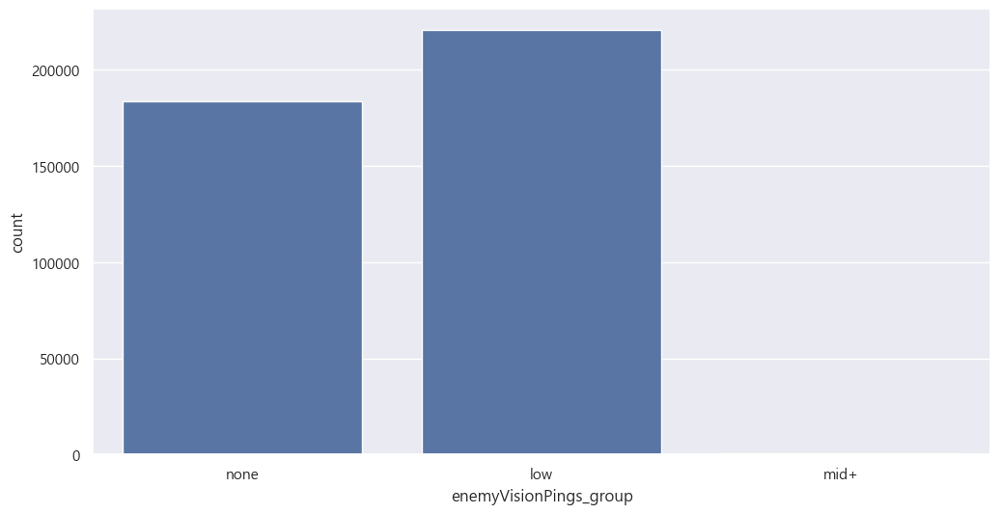

In [291]:
sns.countplot(x='enemyVisionPings_group', data=mid_tier_ping)

In [292]:
mid_tier_ping.groupby('enemyVisionPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\2445231316.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('enemyVisionPings_group')['win'].count()


enemyVisionPings_group
none    183587
low     220601
mid+       742
Name: win, dtype: int64

#### needVisionPings

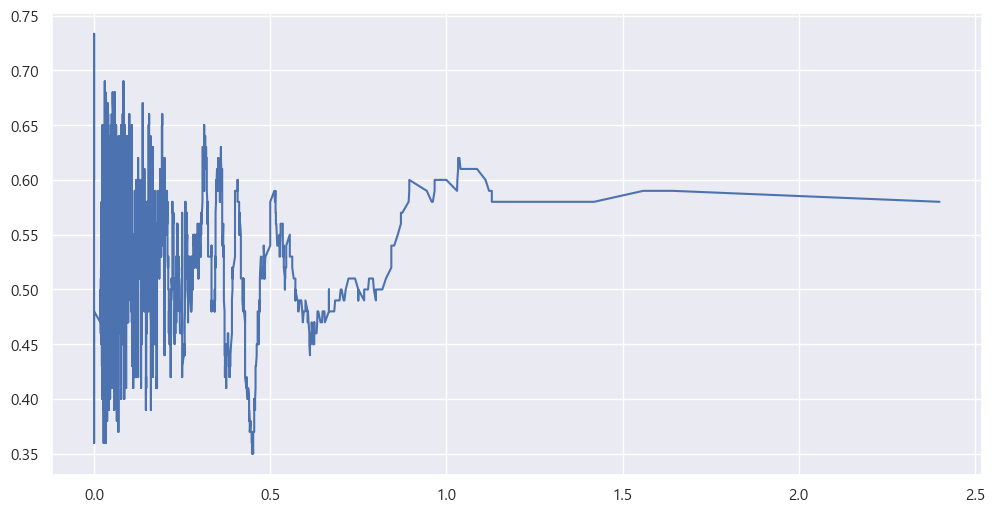

In [293]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('needVisionPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=100, min_periods=10).mean()
plt.plot(df_sorted['needVisionPings'], df_sorted['rolling_win'])

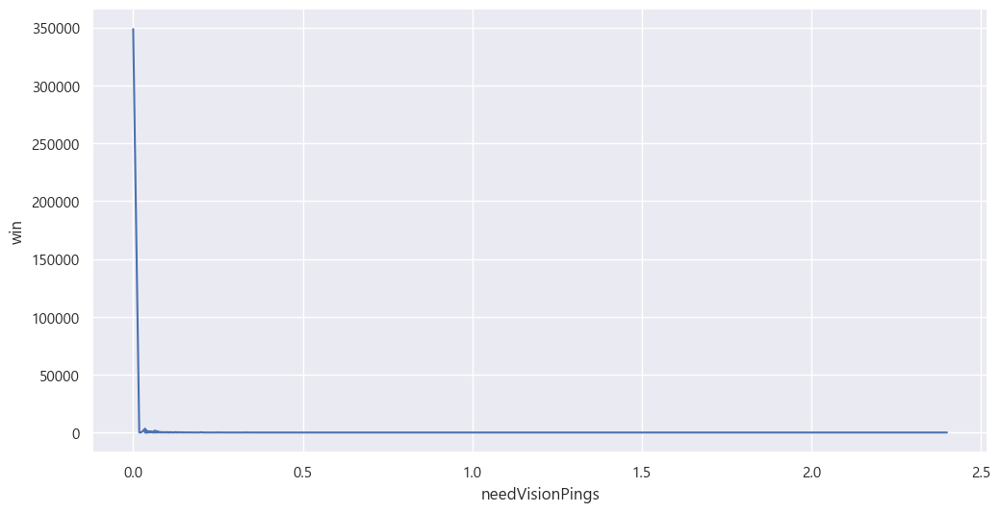

In [294]:
grouped=mid_tier_ping.groupby('needVisionPings')['win'].count().reset_index()
sns.lineplot(x='needVisionPings', y='win', data=grouped)
plt.grid(True)
plt.show()

<Axes: xlabel='needVisionPings_group', ylabel='win'>

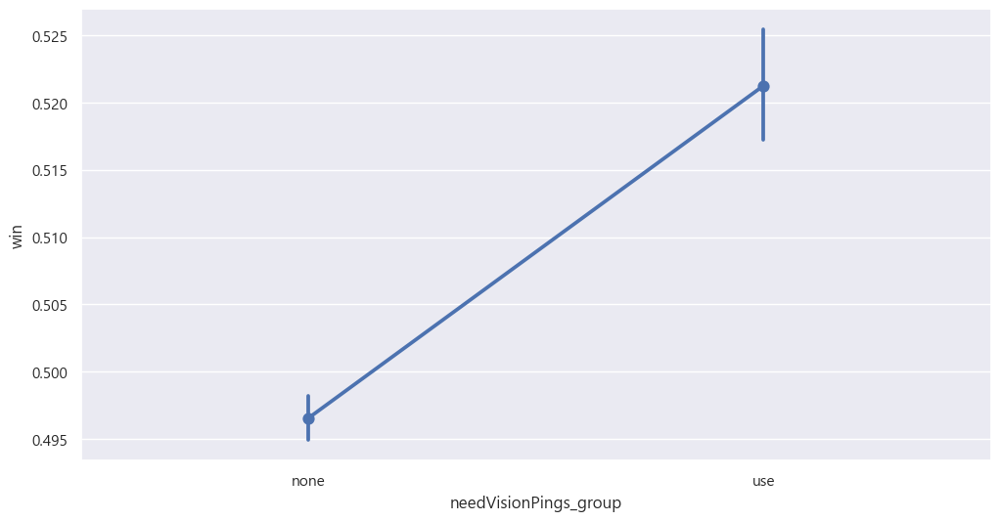

In [295]:
bins = [-1, 0, float('inf')]
labels = ['none', 'use']

mid_tier_ping['needVisionPings_group'] = pd.cut(mid_tier_ping['needVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='needVisionPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='needVisionPings_group', ylabel='count'>

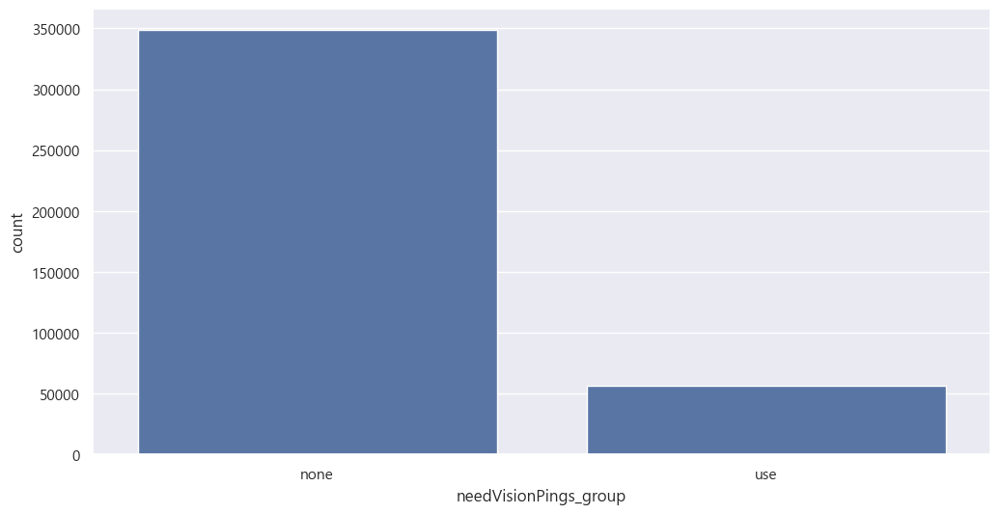

In [224]:
sns.countplot(x='needVisionPings_group', data=mid_tier_ping)

In [296]:
mid_tier_ping.groupby('needVisionPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\1736578724.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('needVisionPings_group')['win'].count()


needVisionPings_group
none    348580
use      56350
Name: win, dtype: int64

#### allInPings(drop)

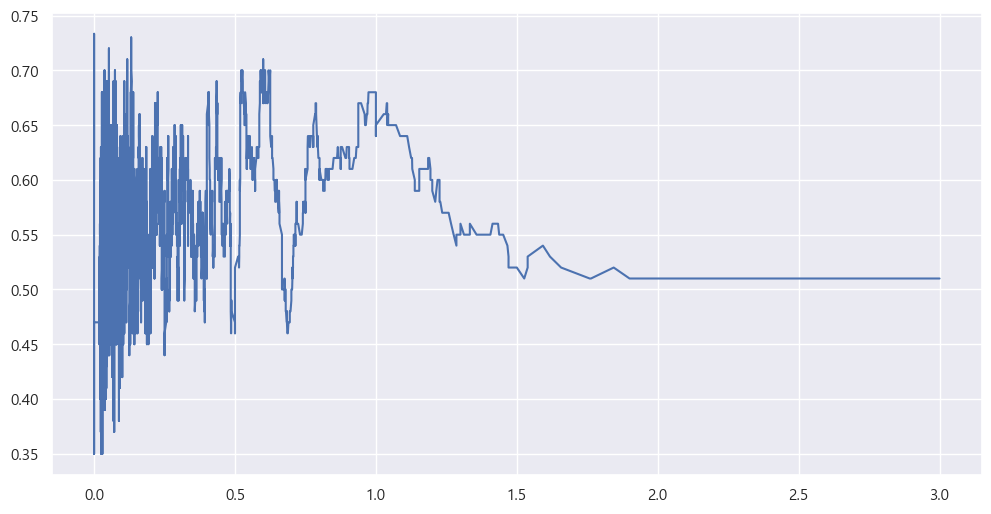

In [225]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = mid_tier_ping.sort_values('allInPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=100, min_periods=10).mean()
plt.plot(df_sorted['allInPings'], df_sorted['rolling_win'])

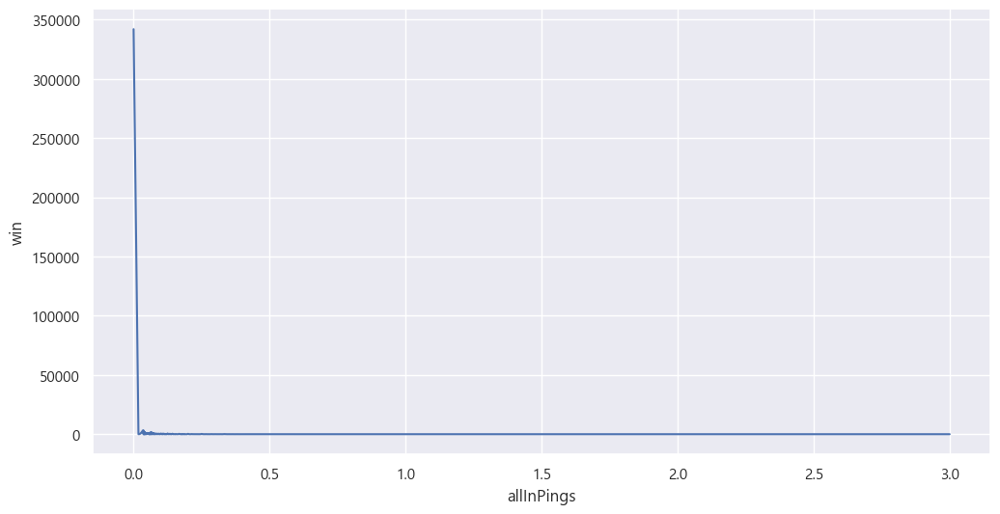

In [226]:
grouped=mid_tier_ping.groupby('allInPings')['win'].count().reset_index()
sns.lineplot(x='allInPings', y='win', data=grouped)
plt.grid(True)
plt.show()


<Axes: xlabel='allInPings_group', ylabel='win'>

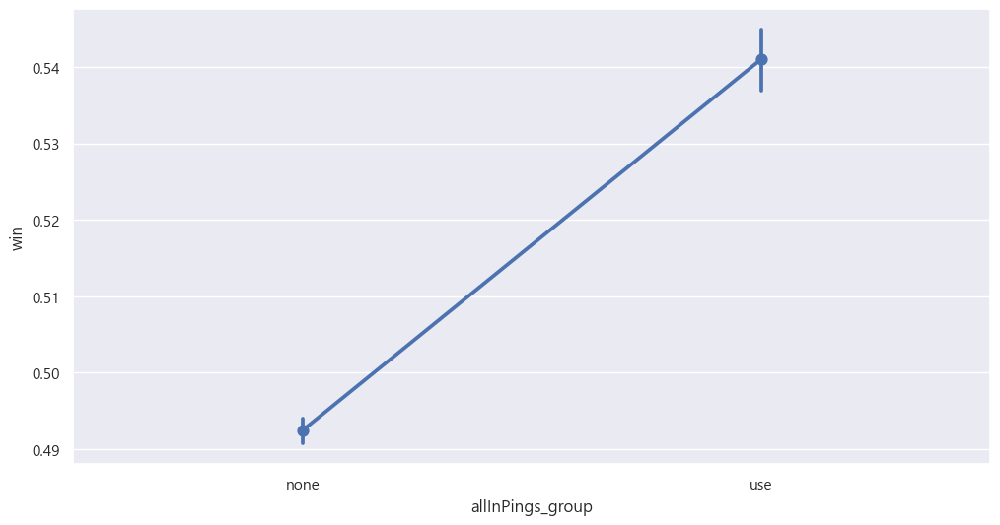

In [227]:
bins = [-1, 0, float('inf')]
labels = ['none', 'use']

mid_tier_ping['allInPings_group'] = pd.cut(mid_tier_ping['allInPings'], bins=bins, labels=labels)


sns.pointplot(x='allInPings_group', y='win', data=mid_tier_ping)

<Axes: xlabel='allInPings_group', ylabel='count'>

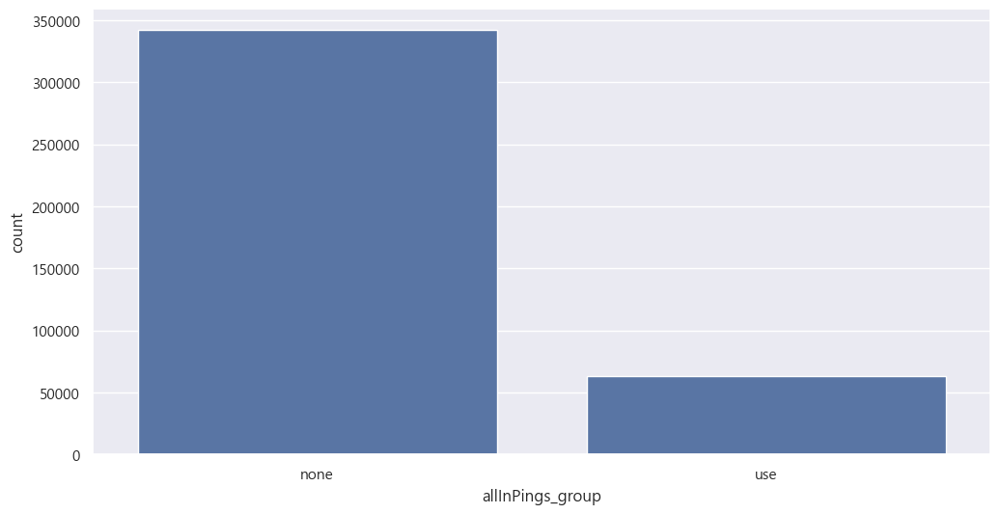

In [228]:
sns.countplot(x='allInPings_group', data=mid_tier_ping)

In [297]:
mid_tier_ping.groupby('allInPings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_4940\32977372.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mid_tier_ping.groupby('allInPings_group')['win'].count()


allInPings_group
none    342058
use      62872
Name: win, dtype: int64

### 다시 모델 돌릴 시간

In [313]:
col_list=['commandPings_group', 'getBackPings_group','onMyWayPings_group','assistMePings_group',
           'enemyMissingPings_group', 'enemyVisionPings_group','needVisionPings_group','allInPings_group'
         ]
mid_tier_ping_log = pd.get_dummies(mid_tier_ping, columns=col_list, drop_first=True)
mid_tier_ping_ready=mid_tier_ping_log.drop(['commandPings', 'getBackPings','onMyWayPings','allInPings','assistMePings',
                                      'needVisionPings','enemyMissingPings','enemyVisionPings','pings','ping_group'
                                      ],axis=1)

In [314]:
mid_tier_ping_ready

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high+,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high+,onMyWayPings_group_low,onMyWayPings_group_mid,onMyWayPings_group_high,assistMePings_group_low,assistMePings_group_mid+,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_low,enemyVisionPings_group_mid+,needVisionPings_group_use,allInPings_group_use
0,0,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False,False
1,0,True,False,False,False,True,False,True,False,False,True,False,True,False,False,True,False,True,False
2,0,True,False,False,True,False,False,True,False,False,True,False,True,False,False,False,False,False,False
3,0,True,False,False,True,False,False,True,False,False,True,False,True,False,False,False,False,False,True
4,0,True,False,False,False,False,False,True,False,False,True,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31815,1,True,False,False,True,False,False,True,False,False,True,False,False,False,False,False,False,False,True
31816,1,True,False,False,True,False,False,True,False,False,True,False,True,False,False,True,False,False,False
31817,1,True,False,False,True,False,False,True,False,False,True,False,True,False,False,True,False,True,False
31818,1,True,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False


In [315]:
change=mid_tier_ping_ready.columns.to_list()
for col in change:
    mid_tier_ping_ready[col] = mid_tier_ping_ready[col].astype(int)

In [316]:
mid_tier_ping_ready.describe()

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high+,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high+,onMyWayPings_group_low,onMyWayPings_group_mid,onMyWayPings_group_high,assistMePings_group_low,assistMePings_group_mid+,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_low,enemyVisionPings_group_mid+,needVisionPings_group_use,allInPings_group_use
count,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000,404930.000000
mean,0.500000,0.844166,0.031230,0.001966,0.604875,0.005384,0.000936,0.852587,0.007868,0.001615,0.596518,0.004095,0.818329,0.009103,0.000417,0.544788,0.001832,0.139160,0.155266
std,0.500001,0.362699,0.173939,0.044293,0.488878,0.073176,0.030579,0.354518,0.088352,0.040156,0.490596,0.063857,0.385574,0.094974,0.020425,0.497991,0.042768,0.346114,0.362159
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [332]:
import pandas as pd
from scipy.stats import chi2_contingency

# 예: getBackPings_group과 win 간 교차표
table = pd.crosstab(mid_tier_ping_ready['getBackPings_group_mid'], mid_tier_ping_ready['win'])

# 카이제곱 검정
chi2, p, dof, expected = chi2_contingency(table)

print(f'Chi-squared test: p-value = {p:.4f}')


Chi-squared test: p-value = 0.0000


In [335]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency

def cramers_v(confusion_matrix):
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min(k - 1, r - 1))

# 예시
conf_mat = pd.crosstab(mid_tier_ping_ready['onMyWayPings_group_low'], mid_tier_ping_ready['win'])
v = cramers_v(conf_mat)
print(f"Cramér's V: {v:.4f}")


Cramér's V: 0.0681


In [317]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = mid_tier_ping_ready.drop(['win'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [318]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
0,const,15.449479
1,commandPings_group_low,1.318792
2,commandPings_group_mid,1.297932
7,onMyWayPings_group_low,1.232840
10,assistMePings_group_low,1.215868
12,enemyMissingPings_group_low,1.124418
8,onMyWayPings_group_mid,1.110796
18,allInPings_group_use,1.089297
4,getBackPings_group_low,1.086314
11,assistMePings_group_mid+,1.077180


In [319]:
import statsmodels.api as sm

# 1. X, y 분리
X = mid_tier_ping_ready.drop(['win'],axis=1)
y = mid_tier_ping_ready['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.690912
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:               404930
Model:                          Logit   Df Residuals:                   404912
Method:                           MLE   Df Model:                           17
Date:                Thu, 31 Jul 2025   Pseudo R-squ.:                0.003225
Time:                        11:05:53   Log-Likelihood:            -2.7977e+05
converged:                       True   LL-Null:                   -2.8068e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
commandPings_group_low          -0.0361      0.009     -4.226      0.000

In [350]:
temp=result.summary2().tables[1]
temp['Coef_abs']=abs(temp['Coef.'])
temp.sort_values('Coef_abs',ascending=False)[['Coef.']]

,Coef.
enemyMissingPings_group_high,-1.151857
onMyWayPings_group_high,0.860696
onMyWayPings_group_mid,0.784133
enemyMissingPings_group_mid,-0.430892
commandPings_group_high+,0.271347
onMyWayPings_group_low,0.208691
getBackPings_group_high+,-0.186534
enemyMissingPings_group_low,-0.163412
allInPings_group_use,0.110701
commandPings_group_mid,0.095705


# 아브실골

In [232]:
iron_ping=pd.read_csv('iron_ping.csv')
bronze_ping=pd.read_csv("bronze_ping.csv")
silver_ping=pd.read_csv("silver_ping.csv")
gold_ping=pd.read_csv("gold_ping.csv")

In [233]:
low_tier_ping = pd.concat([iron_ping, bronze_ping])
low_tier_ping = pd.concat([low_tier_ping, silver_ping])
low_tier_ping = pd.concat([low_tier_ping, gold_ping])

In [234]:
low_tier_ping

,matchId,blue/red,gameDuration,puuid,win,is_Surrender_aft_25m,is_Early_Surrender,is_replay,teamPosition,championName,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,7577041970,True,2048,XlgZmsWE39cQZn_OsGiIwBLVpxDJVmDqatmCQ3zgU11l0J...,False,True,False,False,TOP,Volibear,0,3,0,22,0,1,0,4,4
1,7577041970,True,2048,zztH5dfHbYVkI1aEIYikq90F8eb7elqPHaPb_ZHVMROp9q...,False,True,False,False,JUNGLE,Naafiri,0,38,0,15,0,3,0,5,0
2,7577041970,True,2048,Ix4xwfUhn11ryGAYvrXT6aZ6kg1cN1Oi1DV3updGCUvuwD...,False,True,False,False,MIDDLE,Zed,14,0,0,9,0,2,0,1,0
3,7577041970,True,2048,UBmWp5kqqCswKrcAs3n8OjPrer8HOE0_DjHdJsDOuEW1RL...,False,True,False,False,BOTTOM,Samira,0,0,0,0,0,0,0,10,5
4,7577041970,True,2048,t8jDmIu7sm5bnAsL80d84lcPOoE6jCqf6mIQ0hy3PGWdoc...,False,True,False,False,UTILITY,Swain,4,0,0,0,0,1,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,7537039673,False,1689,2q8LvoTJLcjQJDPt1z-FGxlNdyQsWeC3uKX33sbfmnrvwH...,False,False,False,False,TOP,Swain,2,0,0,2,1,1,0,1,0
19996,7537039673,False,1689,yNE_Um4QMt8UlYxPf5YjllpZRVxRgK2PYt3kX1J3J545Ys...,False,False,False,False,JUNGLE,Talon,6,13,0,7,1,6,2,5,4
19997,7537039673,False,1689,fBjPB_Xf3CyqbTMAQZO9MB-GZvv09Y9vIJysnCteN7Ul5F...,False,False,False,False,MIDDLE,Yasuo,15,1,0,9,0,0,0,5,0
19998,7537039673,False,1689,XJvgRb9Aw8AfPjMcg5-8hyLbd7tIlCsKZQ52uQdgoJsUMK...,False,False,False,False,BOTTOM,Jinx,3,0,0,2,0,3,0,0,0


In [472]:
low_tier_game=low_tier_ping[~low_tier_ping['is_replay']] #다시하기 게임들은 날려주고
low_tier_ping=low_tier_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings',
                         'onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

KeyError: 'is_replay'

## EDA

### win

In [136]:
low_tier_ping['win'].value_counts()

win
False    156050
True     156050
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

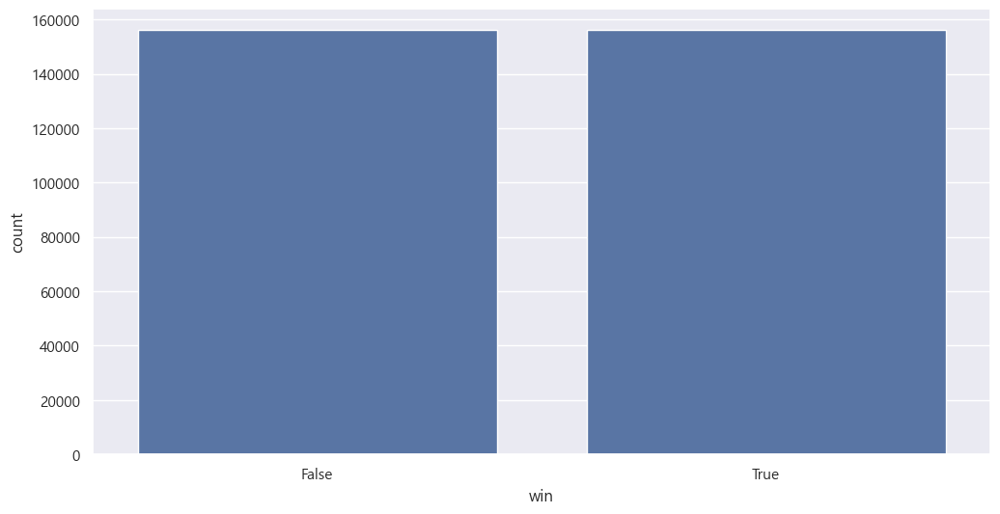

In [137]:
sns.countplot(x=low_tier_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [138]:
low_tier_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    178180
True     133920
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

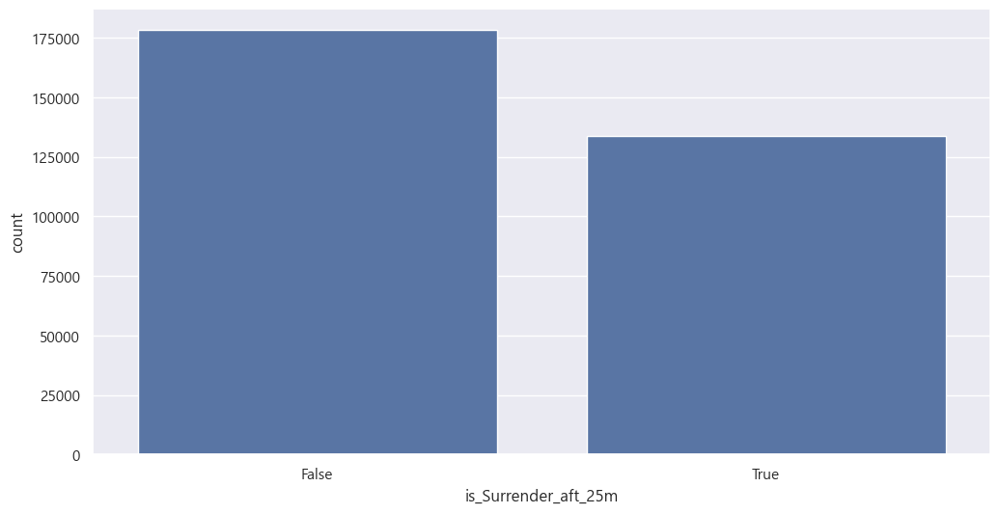

In [139]:
sns.countplot(x=low_tier_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [141]:
low_tier_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    312100
Name: count, dtype: int64

### 일반 핑

In [142]:
low_tier_ping['commandPings'].value_counts()

commandPings
0      76739
1      34329
2      27474
3      23967
4      20018
       ...  
96         1
119        1
143        1
139        1
145        1
Name: count, Length: 127, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

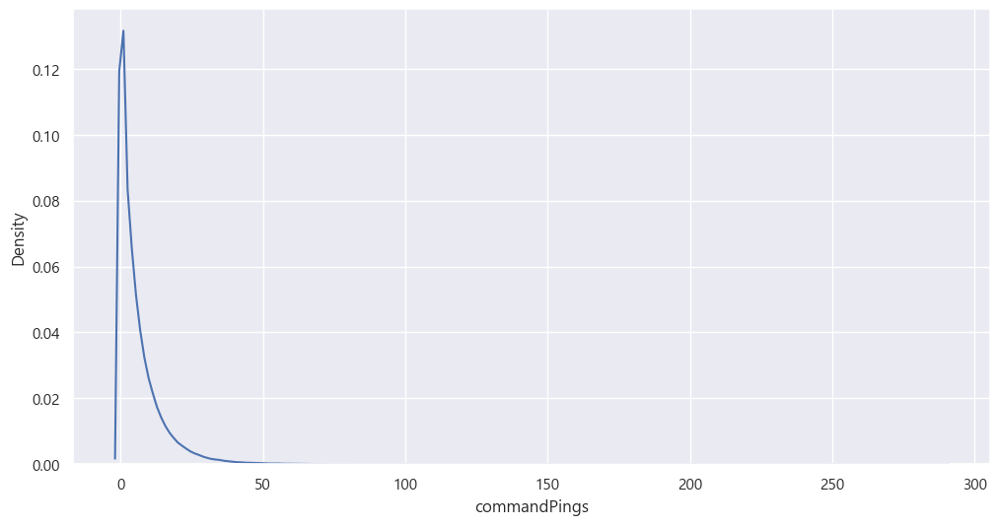

In [143]:
sns.kdeplot(x=low_tier_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

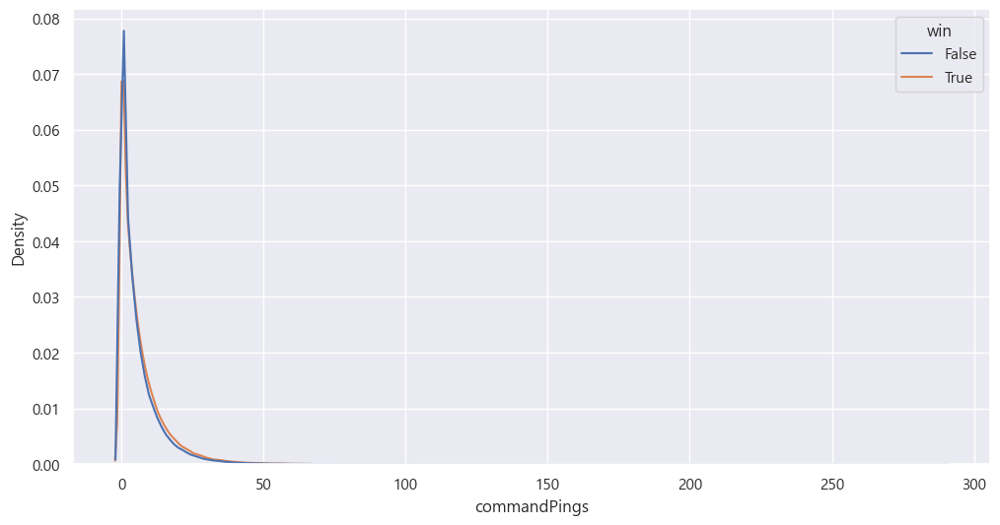

In [144]:
sns.kdeplot(x=low_tier_ping['commandPings'],hue=low_tier_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [146]:
low_tier_ping['getBackPings'].value_counts()

getBackPings
0      146157
1       38332
2       24957
3       18755
4       14840
        ...  
90          1
94          1
109         1
102         1
77          1
Name: count, Length: 95, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

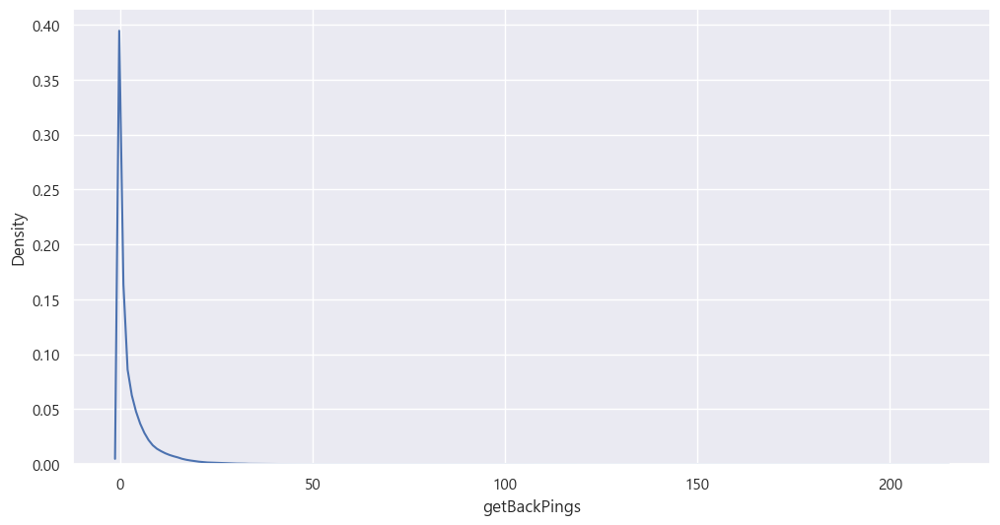

In [145]:
sns.kdeplot(x=low_tier_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

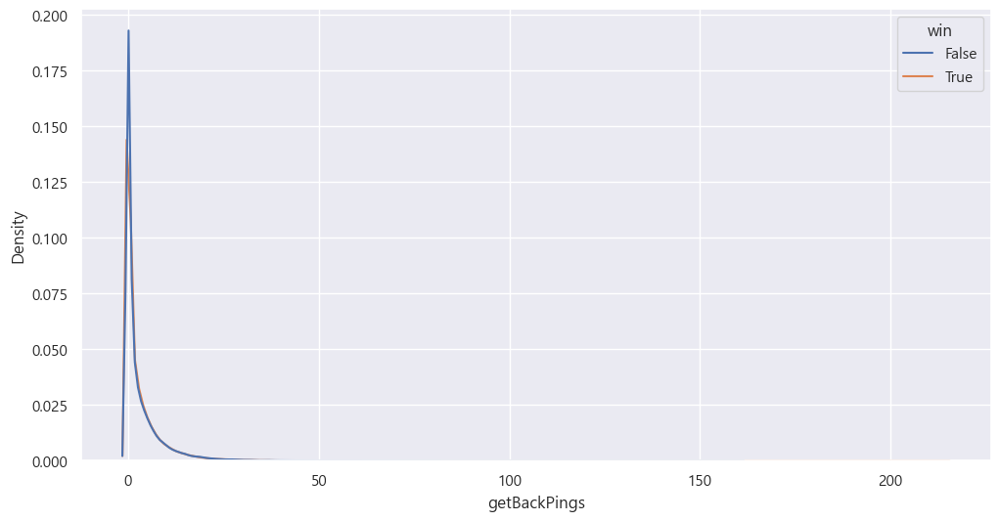

In [147]:
sns.kdeplot(x=low_tier_ping['getBackPings'],hue=low_tier_ping['win'])

### 압박핑 -> 정작 브론즈급에선 사용된 적이 없음

In [148]:
low_tier_ping['holdPings'].value_counts()

holdPings
0    312100
Name: count, dtype: int64

### 가는중 핑

In [149]:
low_tier_ping['onMyWayPings'].value_counts()

onMyWayPings
0      65103
1      33793
2      26623
3      22168
4      18478
       ...  
139        1
138        1
156        1
159        1
164        1
Name: count, Length: 147, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

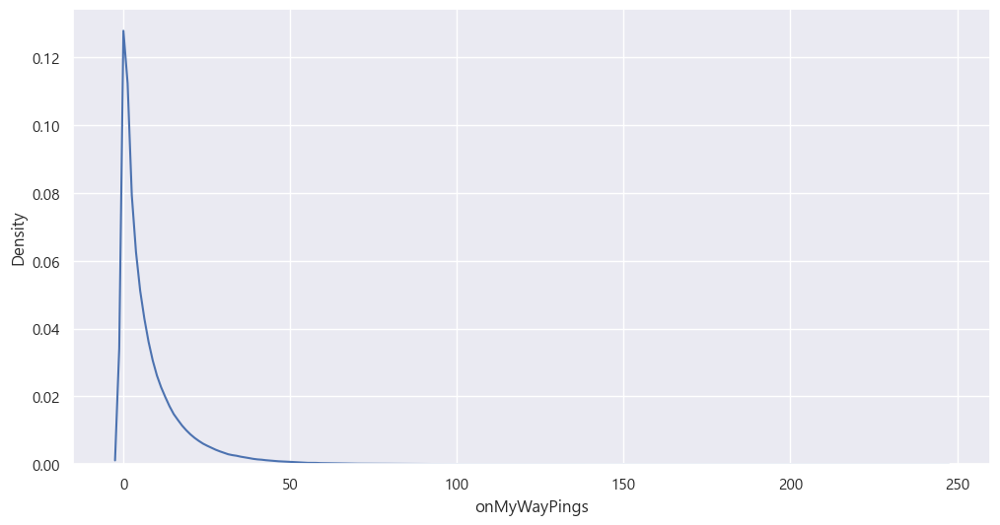

In [150]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

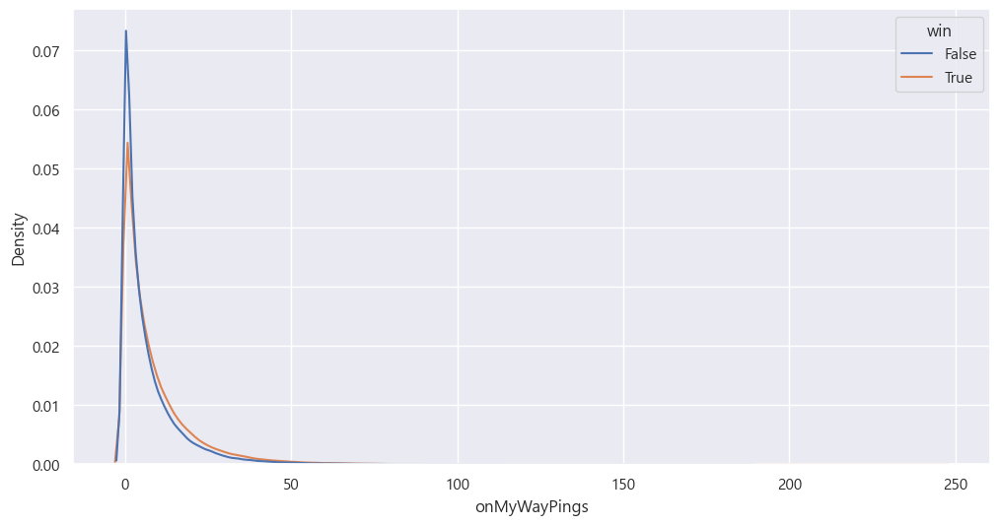

In [151]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'],hue=low_tier_ping['win'])

### 총공격핑

In [152]:
low_tier_ping['allInPings'].value_counts()

allInPings
0      263876
1       30921
2        8718
3        3551
4        1724
5        1042
6         612
7         414
8         262
9         199
10        136
11        107
12        105
14         64
13         62
15         44
16         40
17         36
18         29
19         22
24         20
20         13
21         13
25         10
26          8
22          8
32          7
27          6
23          6
30          5
29          5
28          5
45          3
31          3
40          3
42          2
36          2
34          1
69          1
33          1
65          1
137         1
50          1
48          1
43          1
59          1
53          1
63          1
44          1
41          1
37          1
38          1
58          1
35          1
Name: count, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

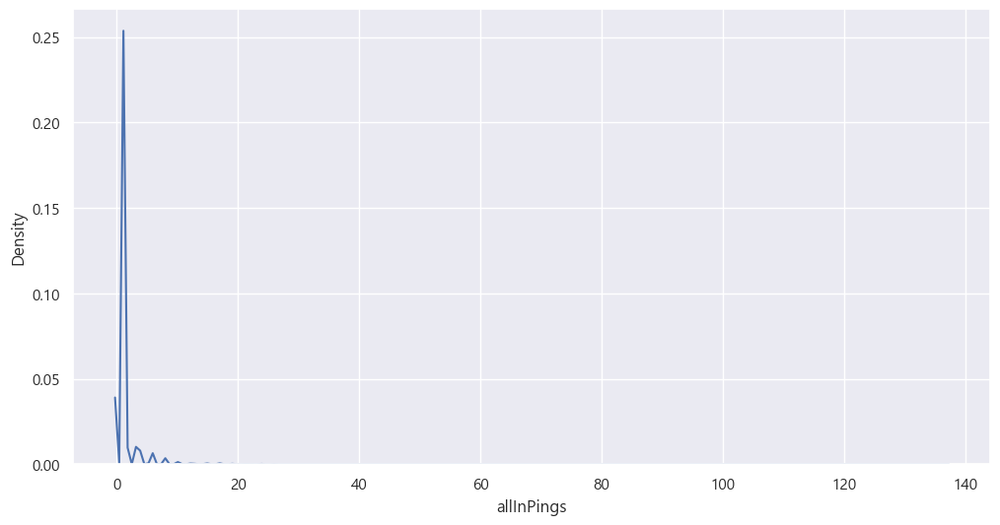

In [153]:
sns.kdeplot(x=low_tier_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

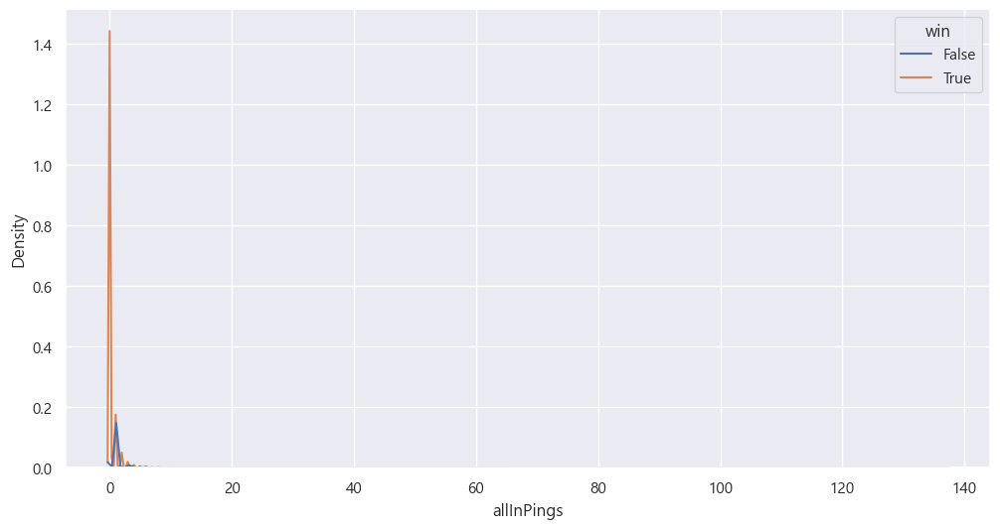

In [154]:
sns.kdeplot(x=low_tier_ping['allInPings'],hue=low_tier_ping['win'])

### 지원핑

In [155]:
low_tier_ping['assistMePings'].value_counts()

assistMePings
0      134381
1       45312
2       30308
3       21357
4       15817
        ...  
80          1
105         1
99          1
77          1
84          1
Name: count, Length: 97, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

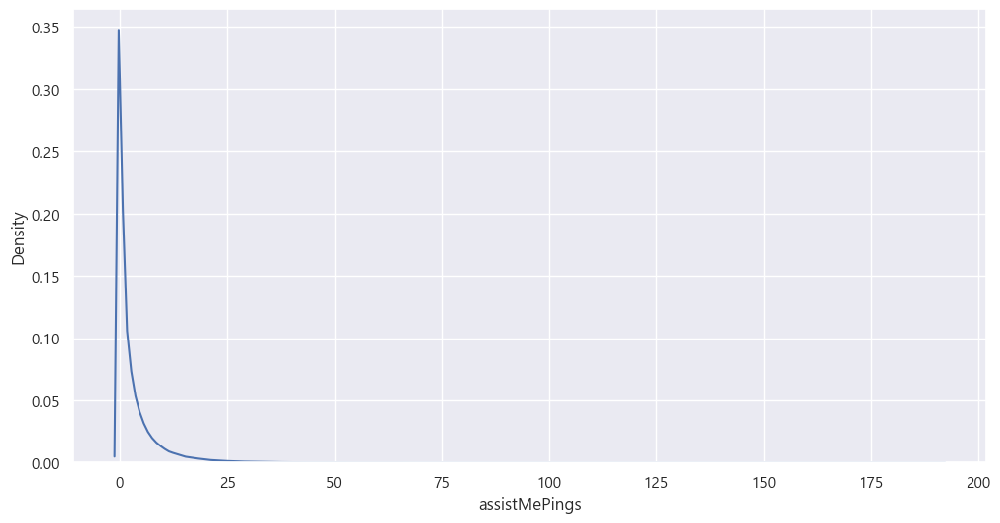

In [156]:
sns.kdeplot(x=low_tier_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

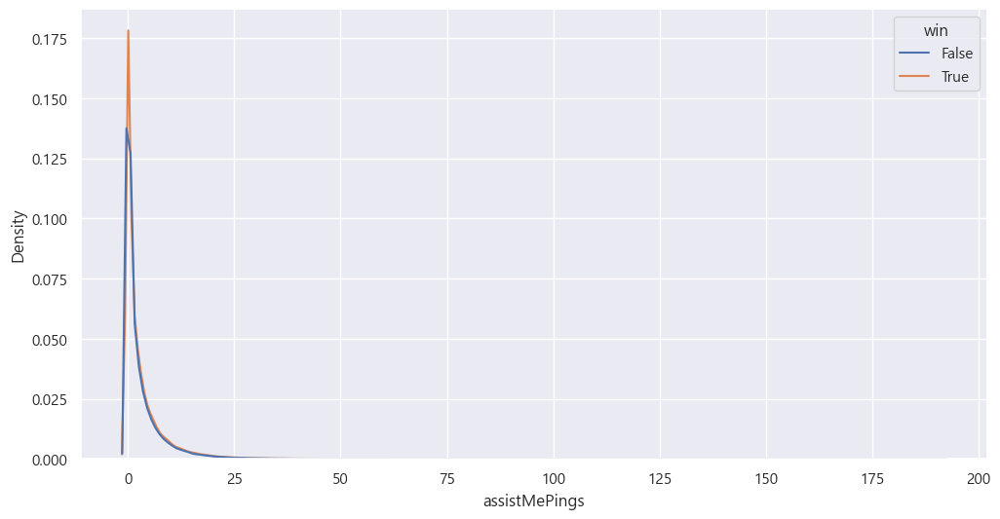

In [157]:
sns.kdeplot(x=low_tier_ping['assistMePings'],hue=low_tier_ping['win'])

### 시야 필요함 핑

In [158]:
low_tier_ping['needVisionPings'].value_counts()

needVisionPings
0      266020
1       30207
2        8250
3        3356
4        1625
5         918
6         565
7         358
8         198
9         152
10        111
11         76
12         52
13         38
14         37
15         27
17         13
16         13
18         12
19         11
20         10
22          8
21          7
24          5
23          5
27          4
26          3
28          2
37          2
30          1
101         1
107         1
61          1
40          1
103         1
48          1
50          1
32          1
59          1
39          1
42          1
29          1
36          1
35          1
Name: count, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='count'>

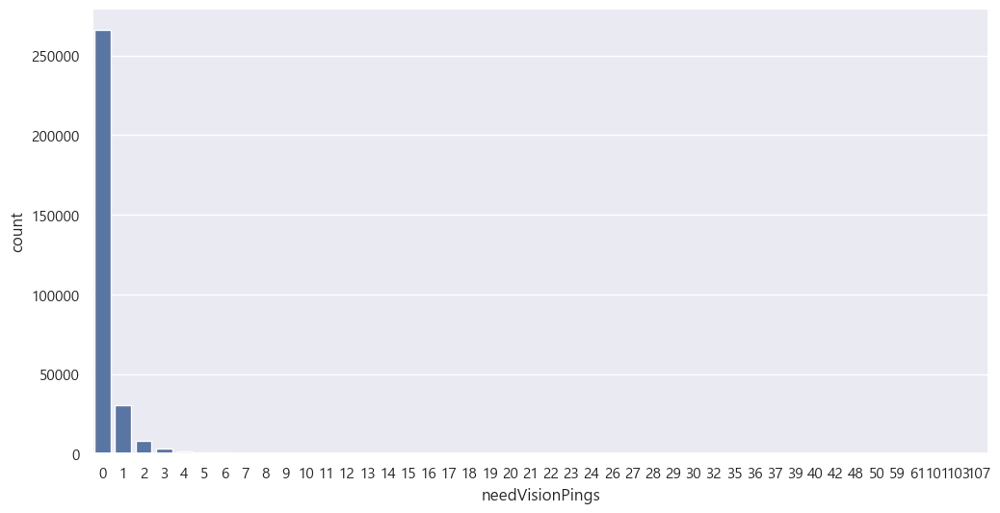

In [159]:
sns.countplot(x=low_tier_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='count'>

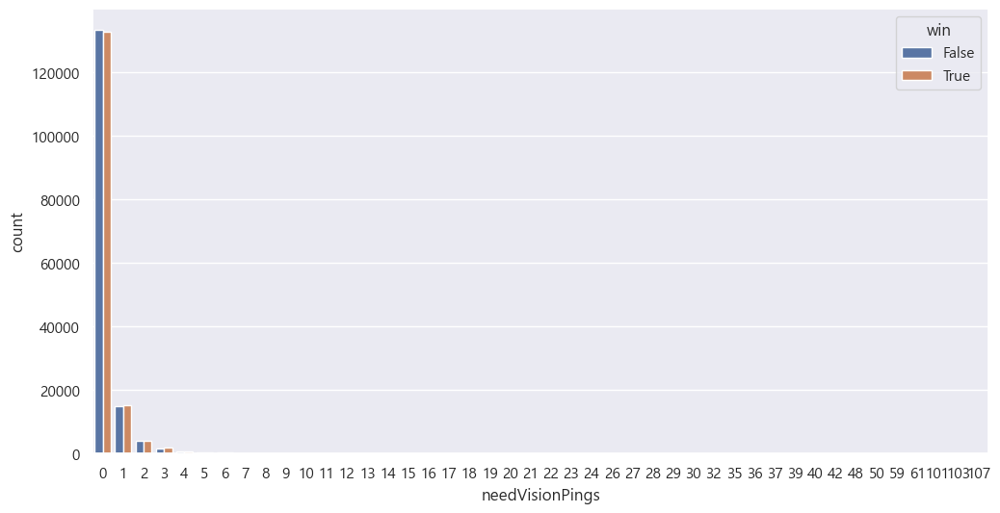

In [160]:
sns.countplot(x=low_tier_ping['needVisionPings'],hue=low_tier_ping['win'])

### 미아핑

In [161]:
low_tier_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0      69092
1      39575
2      33033
3      28744
4      23626
       ...  
122        1
98         1
136        1
97         1
96         1
Name: count, Length: 105, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

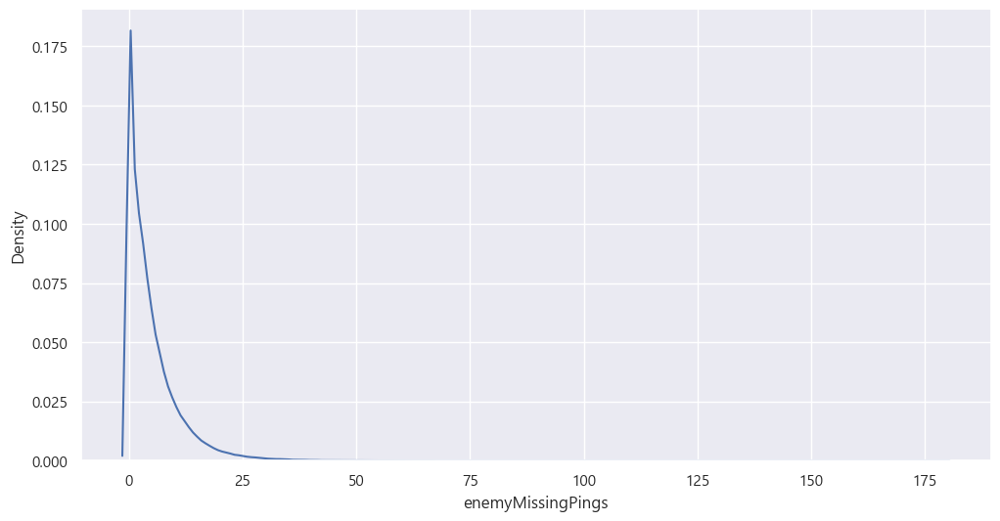

In [162]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

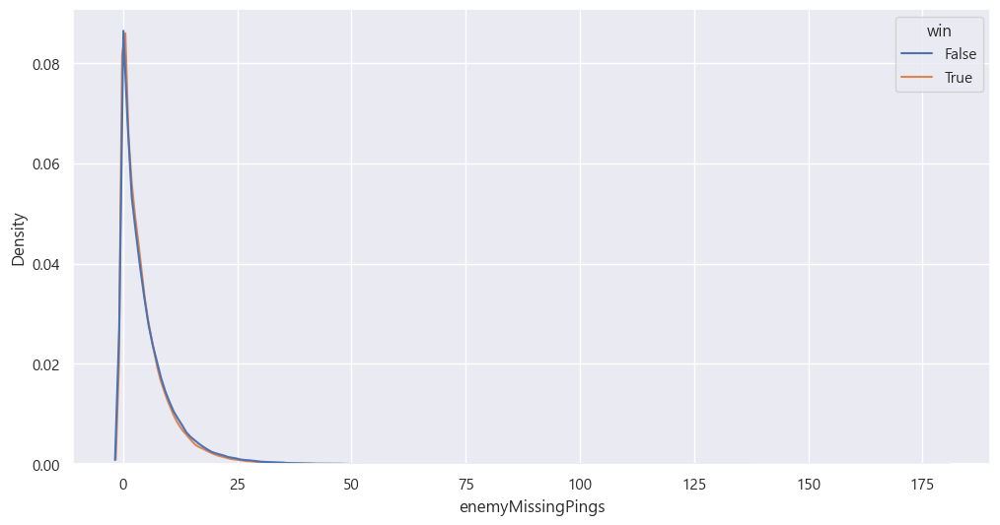

In [163]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'],hue = low_tier_ping['win'])

### 적 와드 / 시야핑

In [164]:
low_tier_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0      183732
1       43133
2       23441
3       15619
4       11058
5        7989
6        6112
7        4678
8        3390
9        2607
10       2137
11       1740
12       1303
13        997
14        799
15        680
16        472
17        413
18        337
19        307
20        203
21        185
22        154
23        109
25         85
24         84
26         64
28         48
27         45
29         33
31         29
32         18
30         17
33         15
34         14
35         11
38          7
36          6
37          5
42          4
46          3
39          3
40          3
64          2
41          2
51          1
156         1
44          1
43          1
60          1
45          1
69          1
Name: count, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

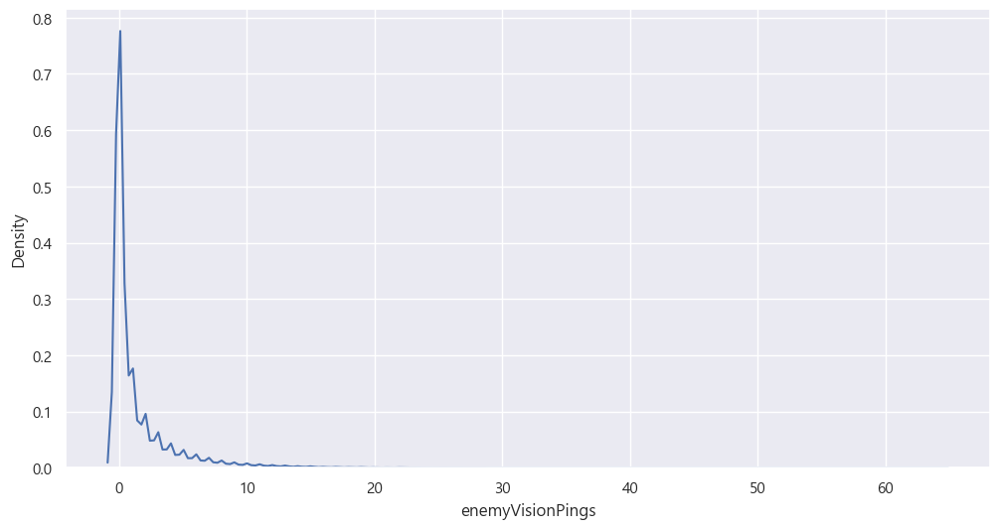

In [48]:
sns.kdeplot(x=bronze_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

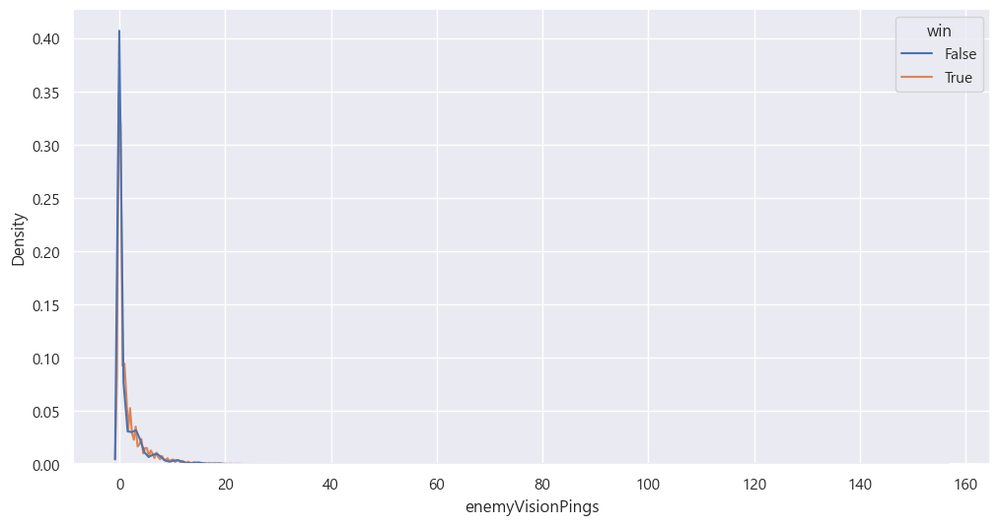

In [165]:
sns.kdeplot(x=low_tier_ping['enemyVisionPings'],hue=low_tier_ping['win'])

## 핑과 승패사이의 상관관계를 봐봅시다.

In [167]:
low_tier_ping['pings'] = low_tier_ping['commandPings'] + low_tier_ping['getBackPings'] + low_tier_ping['holdPings'] +low_tier_ping['onMyWayPings'] + low_tier_ping['allInPings'] + low_tier_ping['assistMePings'] + low_tier_ping['needVisionPings'] +low_tier_ping['enemyMissingPings'] + low_tier_ping['enemyVisionPings']

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\66699153.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_tier_ping['pings'] = low_tier_ping['commandPings'] + low_tier_ping['getBackPings'] + low_tier_ping['holdPings'] +low_tier_ping['onMyWayPings'] + low_tier_ping['allInPings'] + low_tier_ping['assistMePings'] + low_tier_ping['needVisionPings'] +low_tier_ping['enemyMissingPings'] + low_tier_ping['enemyVisionPings']


In [168]:
low_tier_ping=low_tier_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

In [172]:
low_tier_ping['win']=low_tier_ping['win'].astype(int)

In [173]:
corr_ping=low_tier_ping.corr()
corr_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
win,1.000000,0.058013,-0.001292,0.088618,0.018790,0.028498,0.004423,-0.031429,0.011156,0.054779
commandPings,0.058013,1.000000,0.275038,0.399049,0.176815,0.348471,0.156374,0.247529,0.099811,0.692129
getBackPings,-0.001292,0.275038,1.000000,0.336211,0.140236,0.324543,0.156404,0.246934,0.133589,0.585177
onMyWayPings,0.088618,0.399049,0.336211,1.000000,0.245629,0.487546,0.185096,0.266496,0.121509,0.797342
allInPings,0.018790,0.176815,0.140236,0.245629,1.000000,0.264756,0.149041,0.116614,0.041684,0.323507
assistMePings,0.028498,0.348471,0.324543,0.487546,0.264756,1.000000,0.246520,0.280035,0.107670,0.677653
needVisionPings,0.004423,0.156374,0.156404,0.185096,0.149041,0.246520,1.000000,0.171508,0.058766,0.301192
enemyMissingPings,-0.031429,0.247529,0.246934,0.266496,0.116614,0.280035,0.171508,1.000000,0.195420,0.568038
enemyVisionPings,0.011156,0.099811,0.133589,0.121509,0.041684,0.107670,0.058766,0.195420,1.000000,0.302857
pings,0.054779,0.692129,0.585177,0.797342,0.323507,0.677653,0.301192,0.568038,0.302857,1.000000


<Axes: >

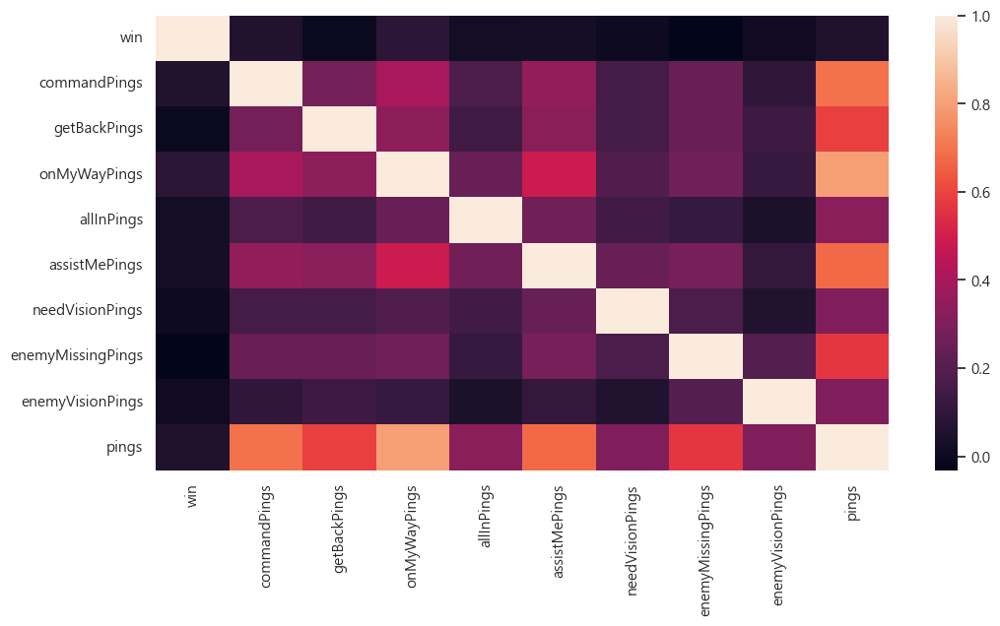

In [174]:
sns.heatmap(corr_ping)

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [176]:
from scipy.stats import levene

stat, p = levene(low_tier_ping['pings'], low_tier_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 211797.869, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [177]:
win_pings=low_tier_ping[low_tier_ping['win'] == 1]['pings']
lose_pings=low_tier_ping[~(low_tier_ping['win'] == 1)]['pings']

In [178]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,30.64854,310846.251329,two-sided,5.619854e-206,"[2.64, 3.0]",0.109722,1.836e+201,1.0


In [179]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(low_tier_ping[ping], low_tier_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    correction_ = p <= 0.05
    win_pings=low_tier_ping[low_tier_ping['win'] == 1][ping]
    lose_pings=low_tier_ping[~(low_tier_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 130279.083, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,32.464324,310526.719685,two-sided,8.314886e-231,"[0.89, 1.01]",0.116222,1.171e+226,1.0



getBackPings
Levene’s test: stat = 76424.044, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.721839,311855.531112,two-sided,0.470394,"[-0.05, 0.02]",0.002584,0.005,0.111496



onMyWayPings
Levene’s test: stat = 134517.115, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,49.702641,305979.90308,two-sided,0.0,"[1.78, 1.93]",0.177935,inf,1.0



allInPings
Levene’s test: stat = 8496.373, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,10.498854,309912.522971,two-sided,8.831193e-26,"[0.04, 0.05]",0.037586,3.438e+21,NaN



assistMePings
Levene’s test: stat = 71643.647, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,15.927178,310574.219639,two-sided,4.324577e-57,"[0.26, 0.33]",0.057019,4.637e+52,NaN



needVisionPings
Levene’s test: stat = 16193.922, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,2.471168,307497.266409,two-sided,0.013468,"[0.0, 0.02]",0.008847,0.086,0.695398



enemyMissingPings
Levene’s test: stat = 142988.444, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-17.566905,309380.202671,two-sided,4.771552e-69,"[-0.43, -0.34]",0.06289,3.81e+64,1.0



enemyVisionPings
Levene’s test: stat = 35556.490, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.232865,312046.691036,two-sided,4.585617e-10,"[0.05, 0.09]",0.022314,1.1e+06,0.99999


In [180]:
low_tier_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,0,0,3,22,0,1,0,4,4,34
1,0,0,38,15,0,3,0,5,0,61
2,0,14,0,9,0,2,0,1,0,26
3,0,0,0,0,0,0,0,10,5,15
4,0,4,0,0,0,1,0,1,2,8
...,...,...,...,...,...,...,...,...,...,...
19995,0,2,0,2,1,1,0,1,0,7
19996,0,6,13,7,1,6,2,5,4,44
19997,0,15,1,9,0,0,0,5,0,30
19998,0,3,0,2,0,3,0,0,0,8


## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

### 선형성 확보를 위한 다시 전처리....

#### commandPings

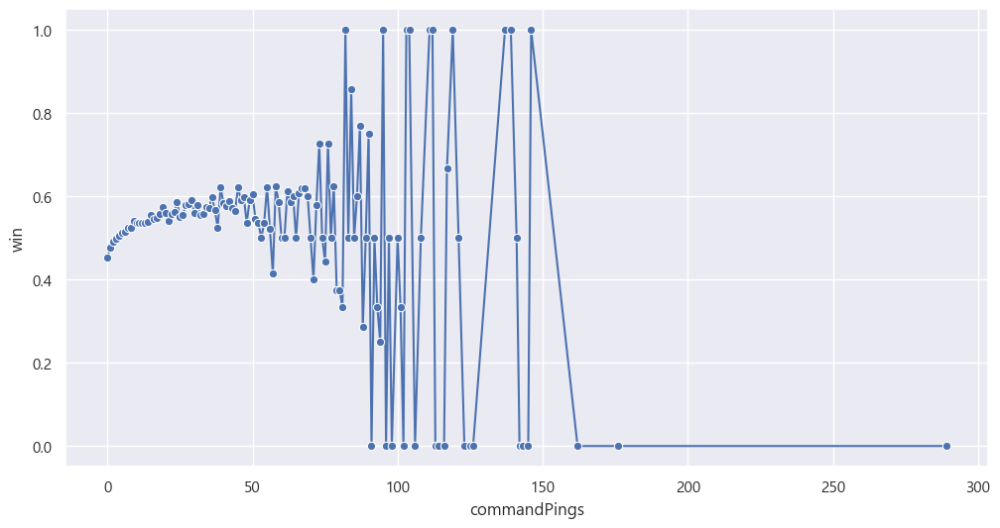

In [181]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('commandPings')['win'].mean().reset_index()

sns.lineplot(x='commandPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


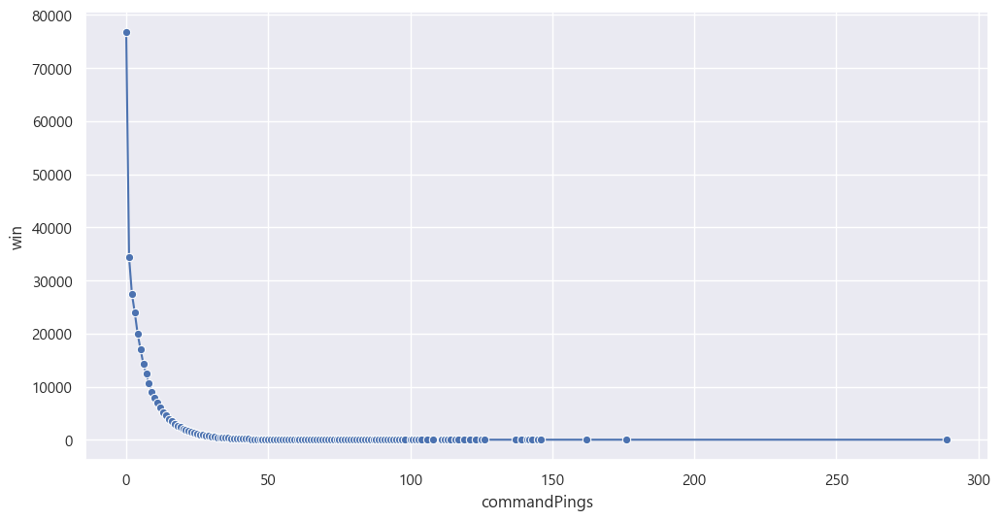

In [183]:
grouped=low_tier_ping.groupby('commandPings')['win'].count().reset_index()
sns.lineplot(x='commandPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='commandPings_group', ylabel='win'>

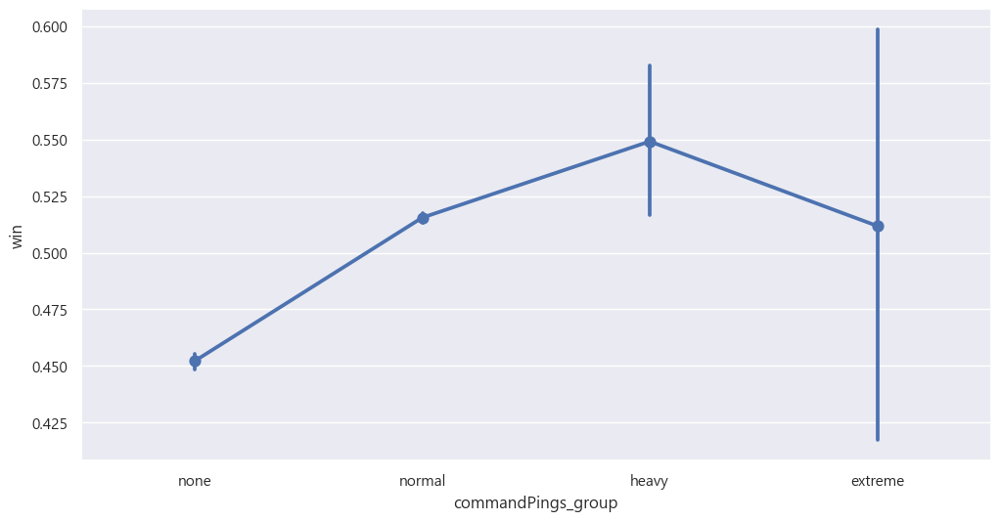

In [186]:
bins = [-1, 0, 50, 80, float('inf')]
labels = ['none', 'normal', 'heavy', 'extreme']

low_tier_ping['commandPings_group'] = pd.cut(low_tier_ping['commandPings'], bins=bins, labels=labels)


sns.pointplot(x='commandPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='commandPings_group', ylabel='count'>

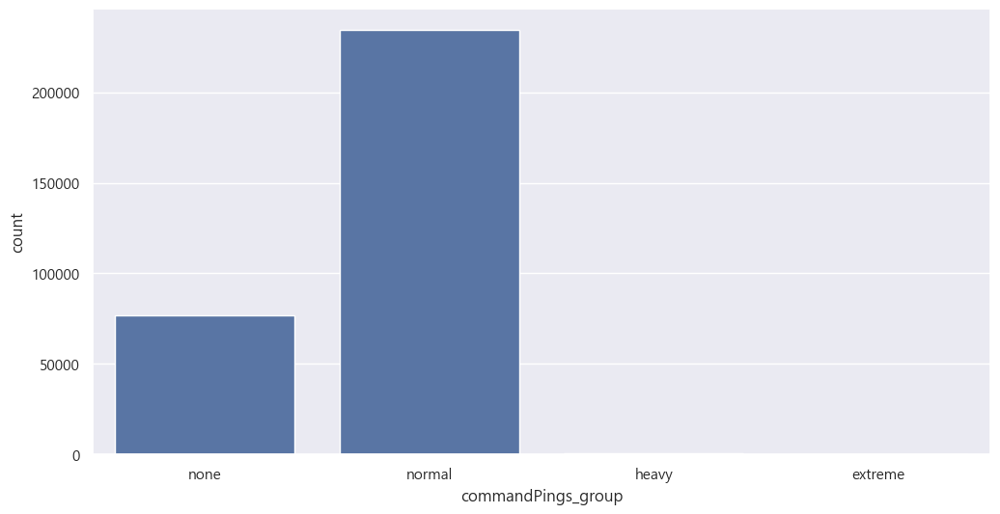

In [187]:
sns.countplot(x='commandPings_group', data=low_tier_ping)

#### getBackPings

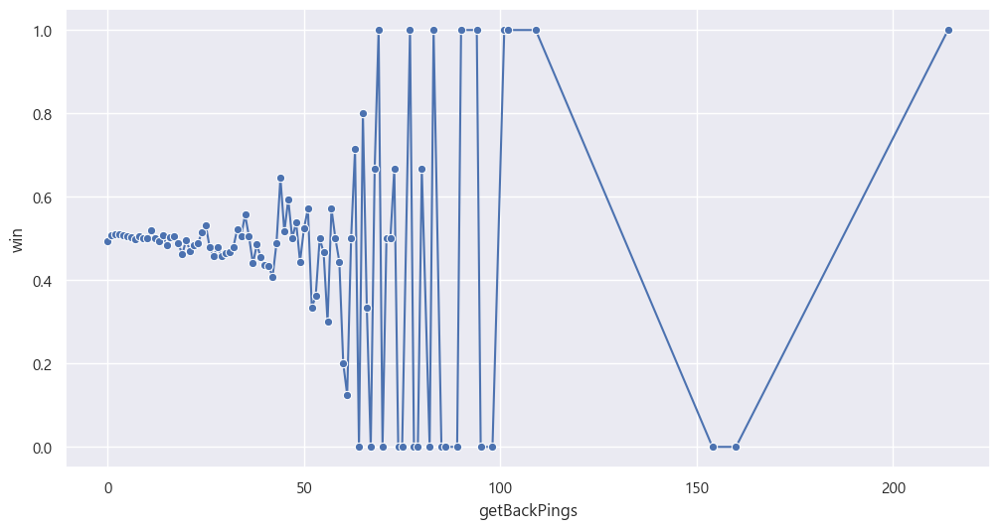

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('getBackPings')['win'].mean().reset_index()

sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


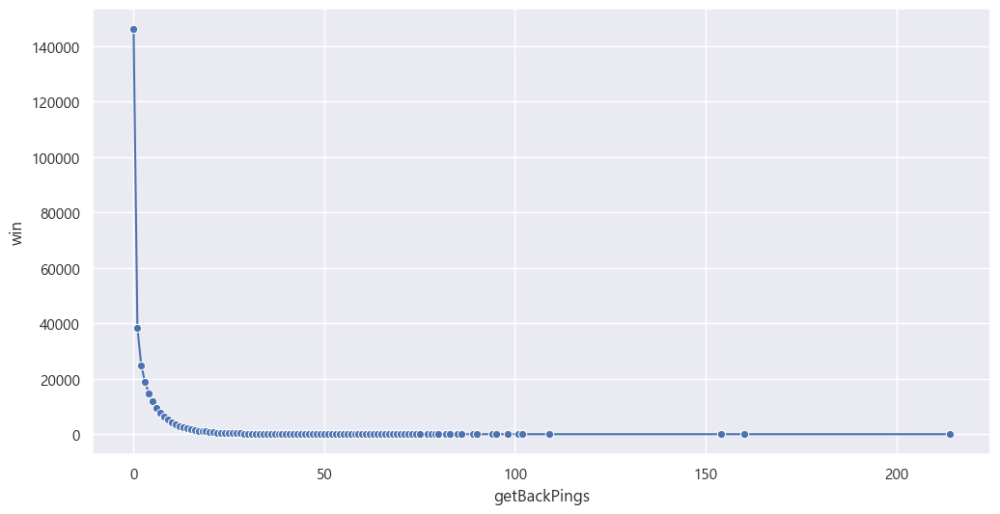

In [189]:
grouped=low_tier_ping.groupby('getBackPings')['win'].count().reset_index()
sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='getBackPings_group', ylabel='win'>

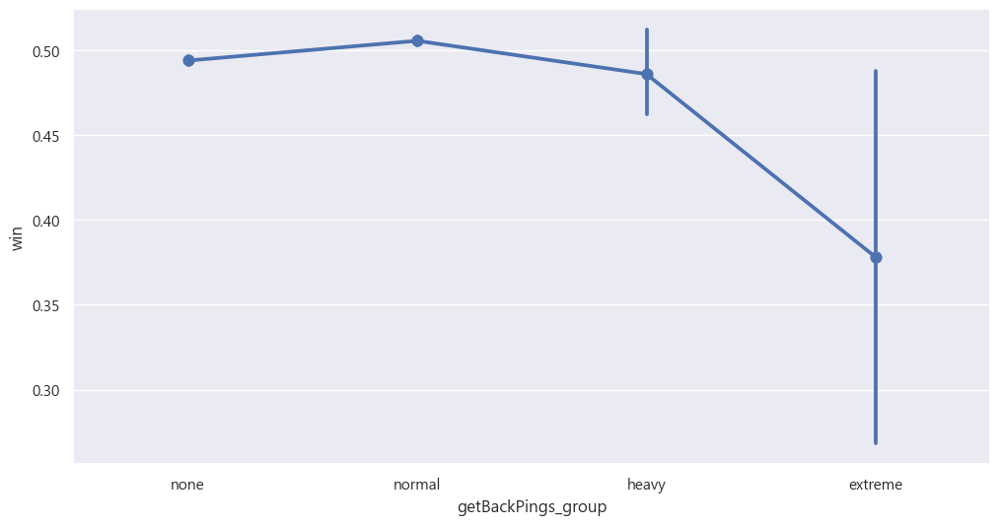

In [190]:
bins = [-1, 0, 30, 60, float('inf')]
labels = ['none', 'normal', 'heavy', 'extreme']

low_tier_ping['getBackPings_group'] = pd.cut(low_tier_ping['getBackPings'], bins=bins, labels=labels)


sns.pointplot(x='getBackPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='getBackPings_group', ylabel='count'>

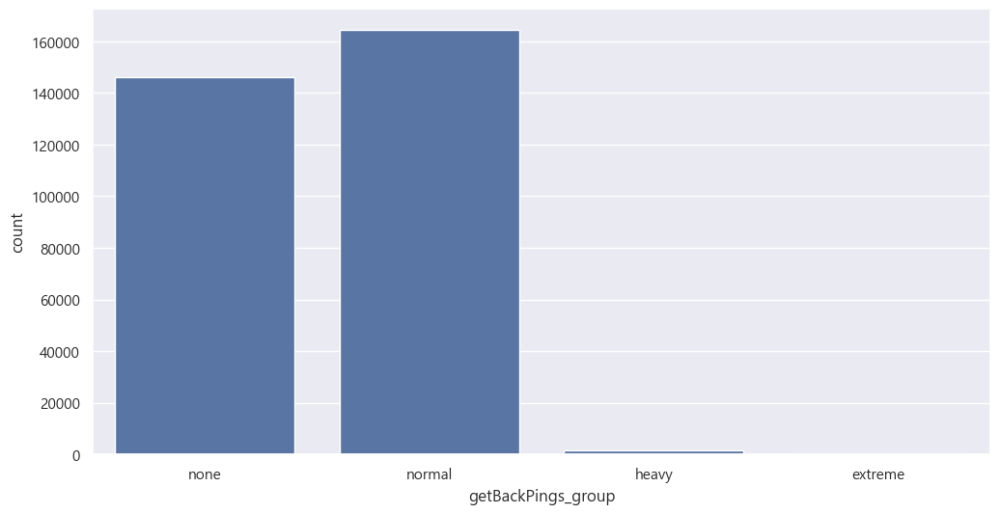

In [191]:
sns.countplot(x='getBackPings_group', data=low_tier_ping)

#### onMyWayPings

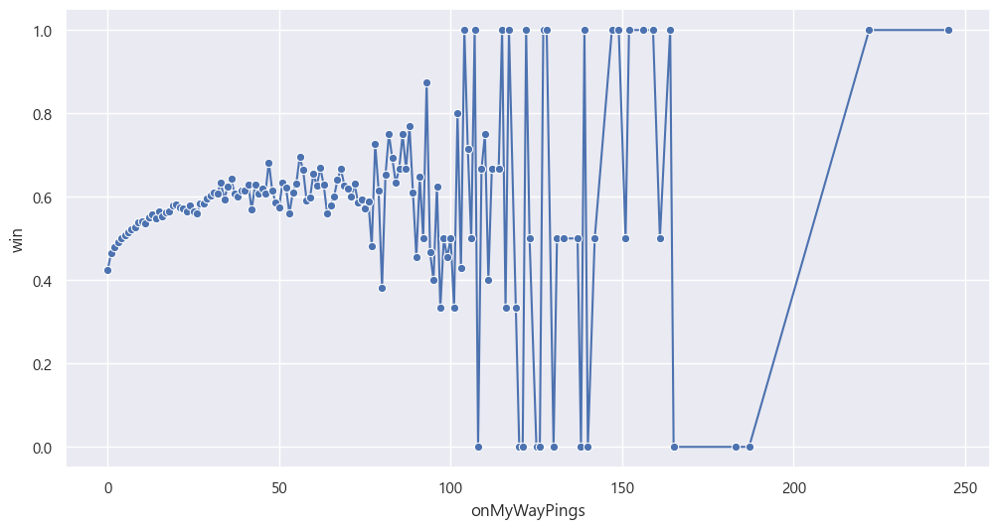

In [192]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('onMyWayPings')['win'].mean().reset_index()

sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


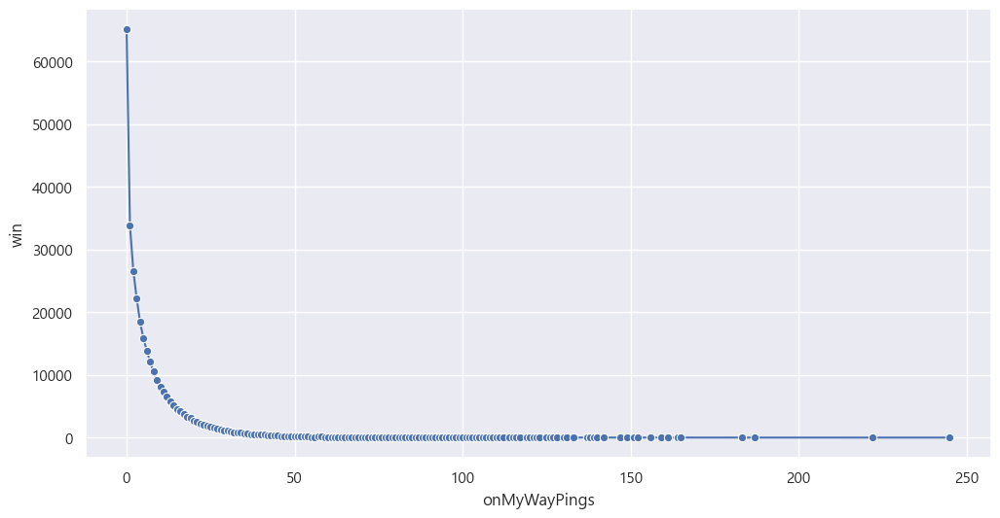

In [193]:
grouped=low_tier_ping.groupby('onMyWayPings')['win'].count().reset_index()
sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='onMyWayPings_group', ylabel='win'>

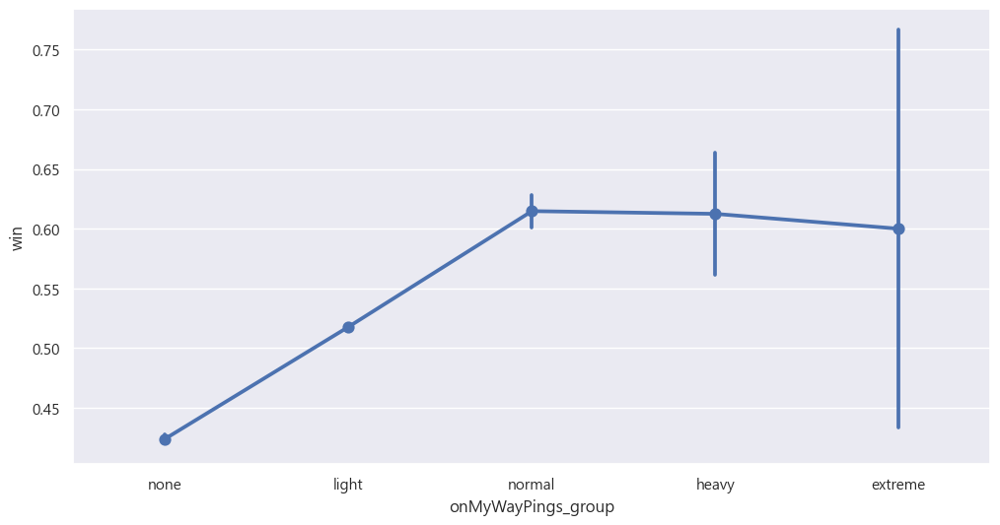

In [194]:
bins = [-1, 0, 40, 80, 130, float('inf')]
labels = ['none', 'light', 'normal', 'heavy', 'extreme']

low_tier_ping['onMyWayPings_group'] = pd.cut(low_tier_ping['onMyWayPings'], bins=bins, labels=labels)


sns.pointplot(x='onMyWayPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='onMyWayPings_group', ylabel='count'>

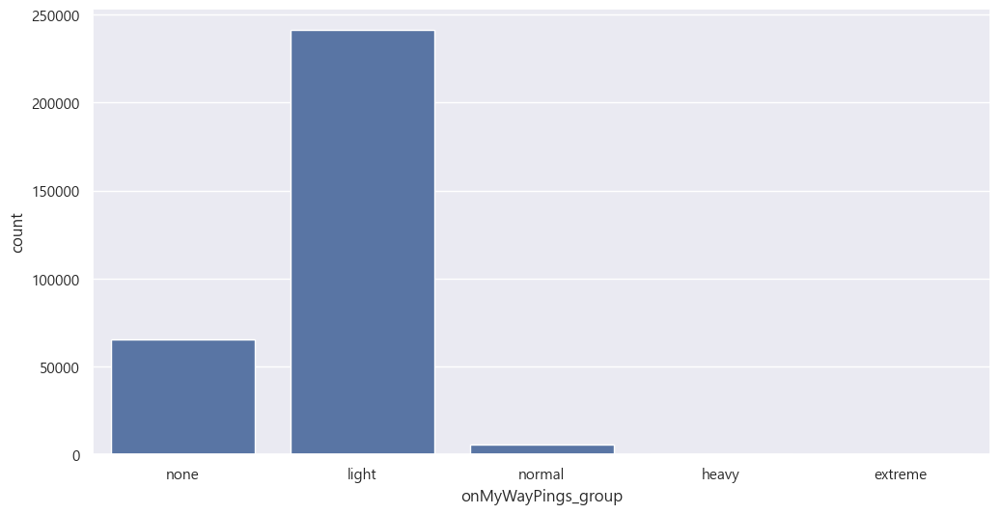

In [195]:
sns.countplot(x='onMyWayPings_group', data=low_tier_ping)

#### assistMePings

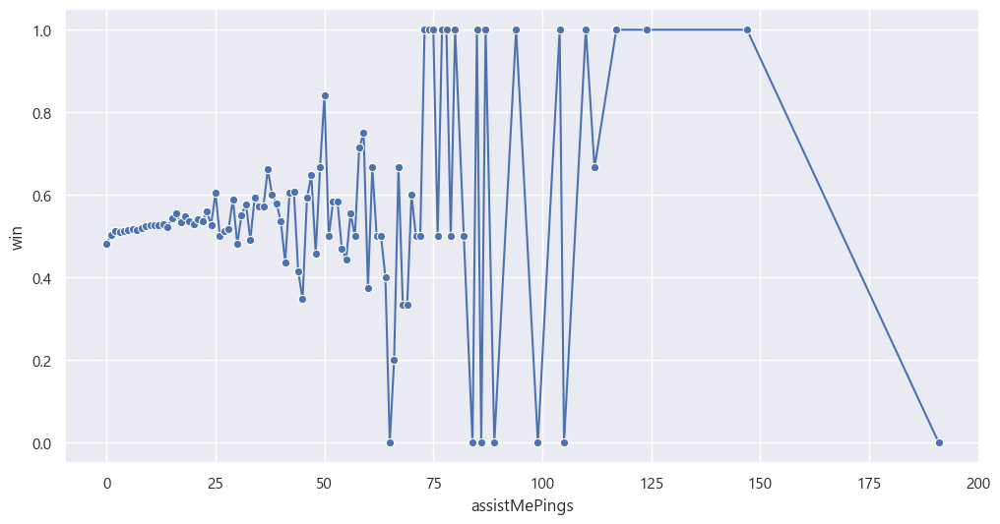

In [196]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('assistMePings')['win'].mean().reset_index()

sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


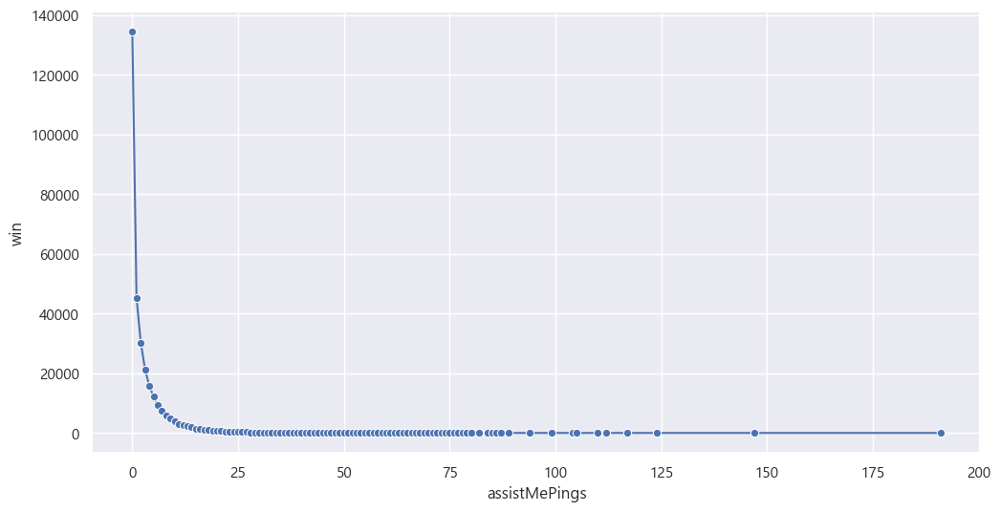

In [197]:
grouped=low_tier_ping.groupby('assistMePings')['win'].count().reset_index()
sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='assistMePings_group', ylabel='win'>

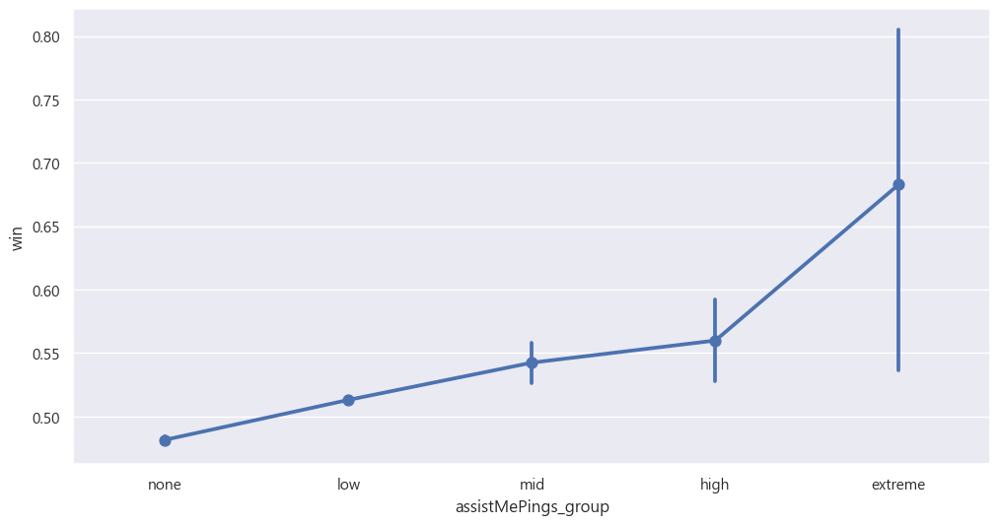

In [199]:
bins = [-1, 0, 20, 35, 70, float('inf')]
labels = ['none', 'low', 'mid', 'high', 'extreme']

low_tier_ping['assistMePings_group'] = pd.cut(low_tier_ping['assistMePings'], bins=bins, labels=labels)


sns.pointplot(x='assistMePings_group', y='win', data=low_tier_ping)

<Axes: xlabel='assistMePings_group', ylabel='count'>

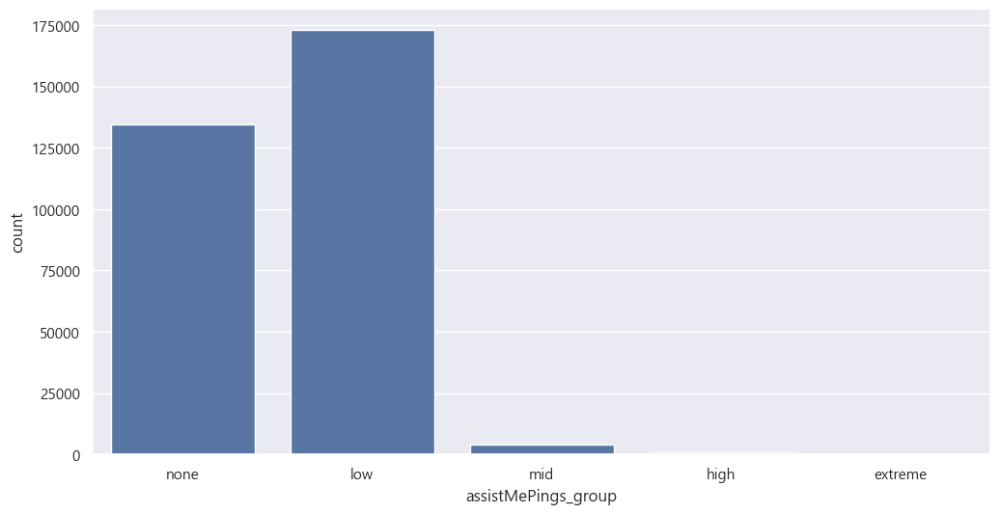

In [200]:
sns.countplot(x='assistMePings_group', data=low_tier_ping)

#### enemyMissingPings

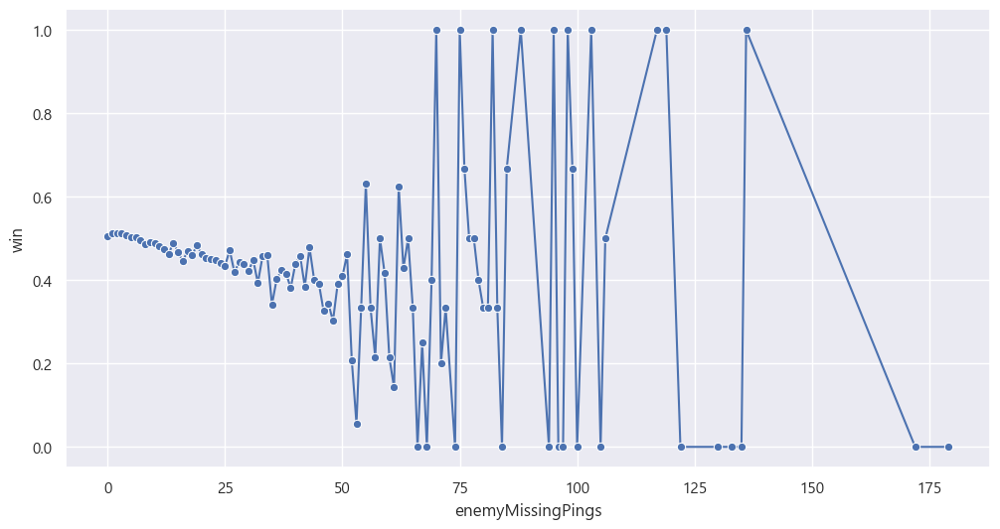

In [202]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('enemyMissingPings')['win'].mean().reset_index()

sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


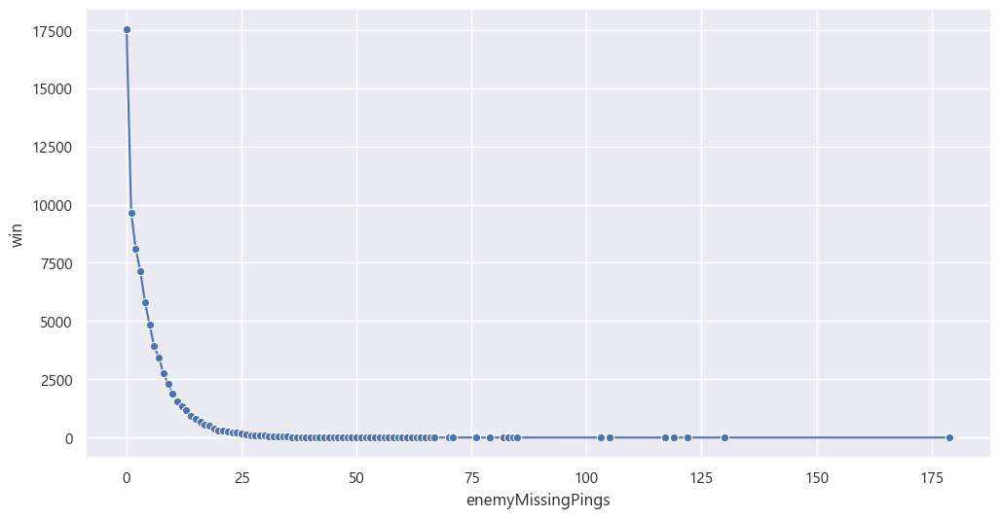

In [93]:
grouped=bronze_test_ping.groupby('enemyMissingPings')['win'].count().reset_index()
sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='win'>

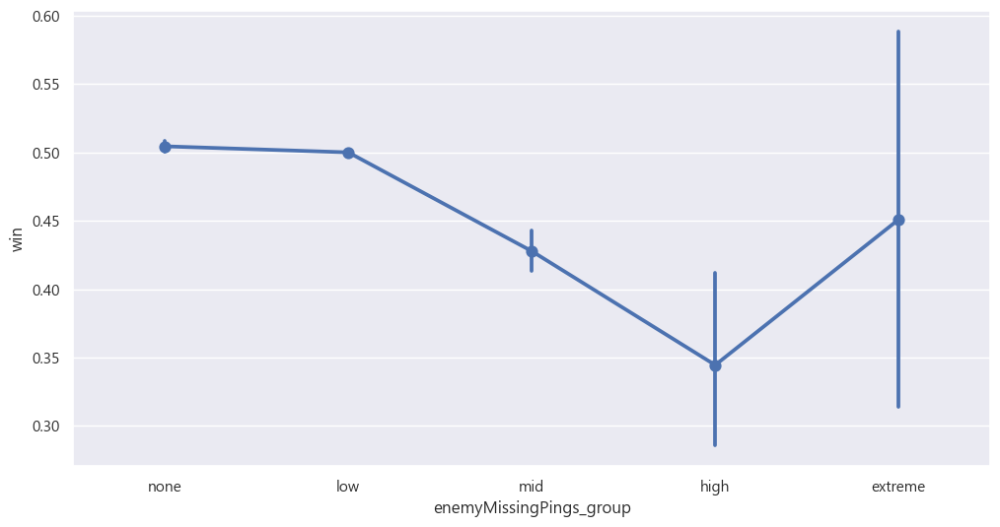

In [205]:
bins = [-1, 0, 25, 50, 75, float('inf')]
labels = ['none', 'low','mid', 'high', 'extreme']

low_tier_ping['enemyMissingPings_group'] = pd.cut(low_tier_ping['enemyMissingPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyMissingPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='enemyMissingPings_group', ylabel='count'>

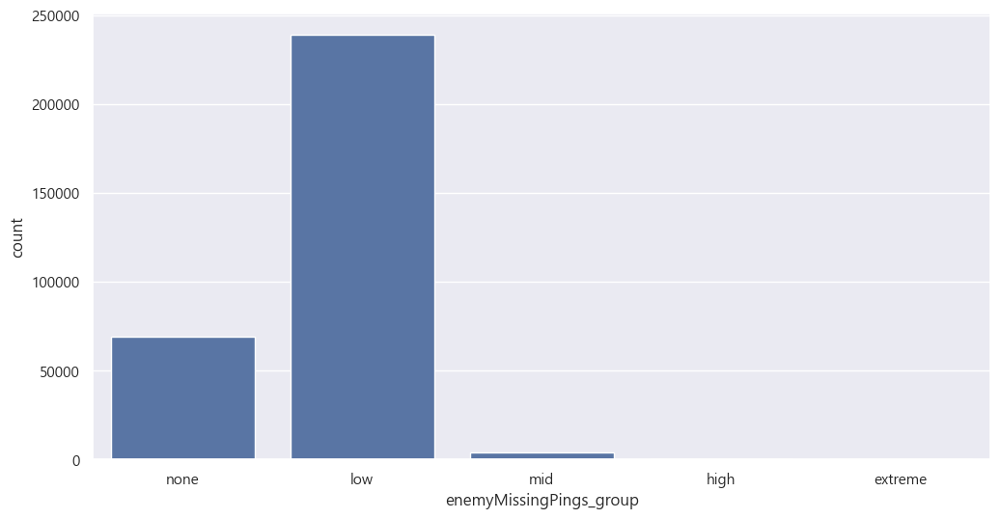

In [206]:
sns.countplot(x='enemyMissingPings_group', data=low_tier_ping)

#### enemyVisionPings

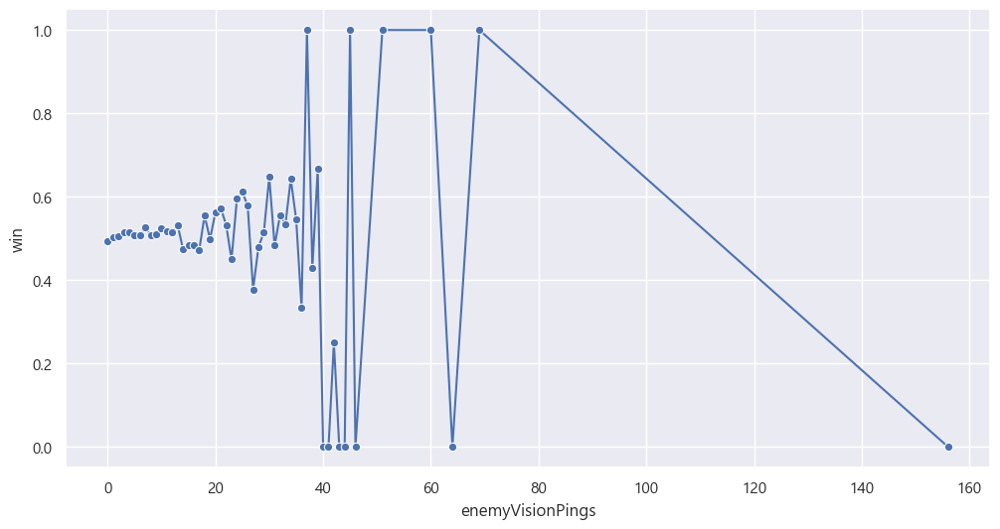

In [207]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('enemyVisionPings')['win'].mean().reset_index()

sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


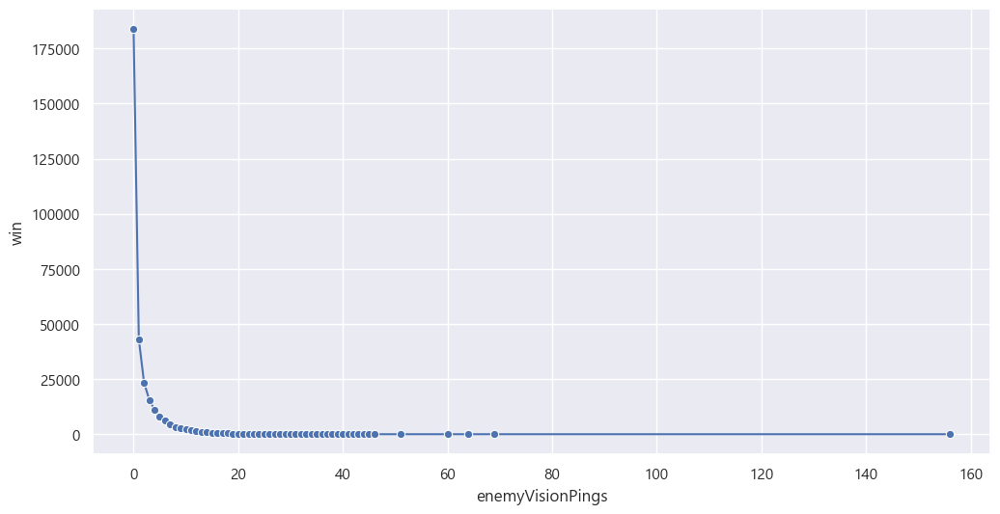

In [208]:
grouped=low_tier_ping.groupby('enemyVisionPings')['win'].count().reset_index()
sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='win'>

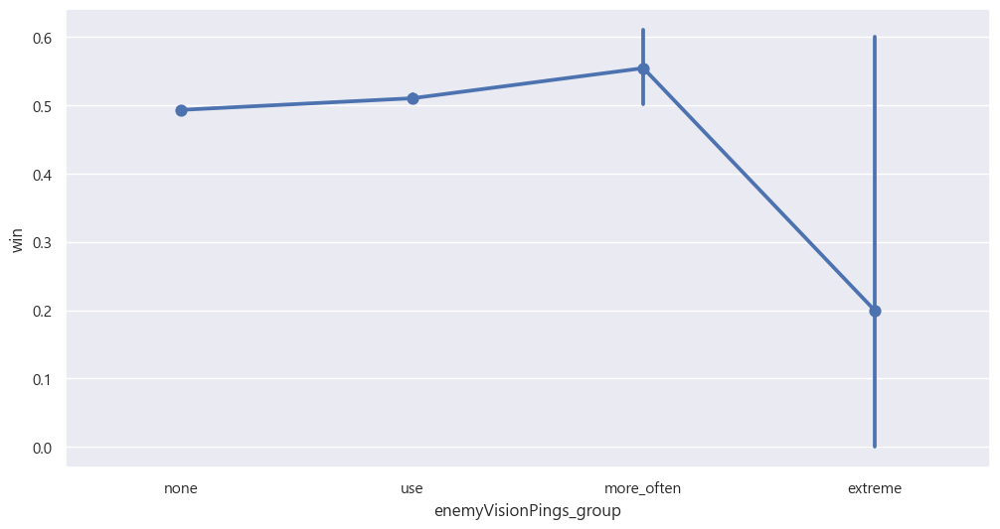

In [210]:
bins = [-1, 0, 17, 40, float('inf')]
labels = ['none', 'use', 'more_often', 'extreme']

low_tier_ping['enemyVisionPings_group'] = pd.cut(low_tier_ping['enemyVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyVisionPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='enemyVisionPings_group', ylabel='count'>

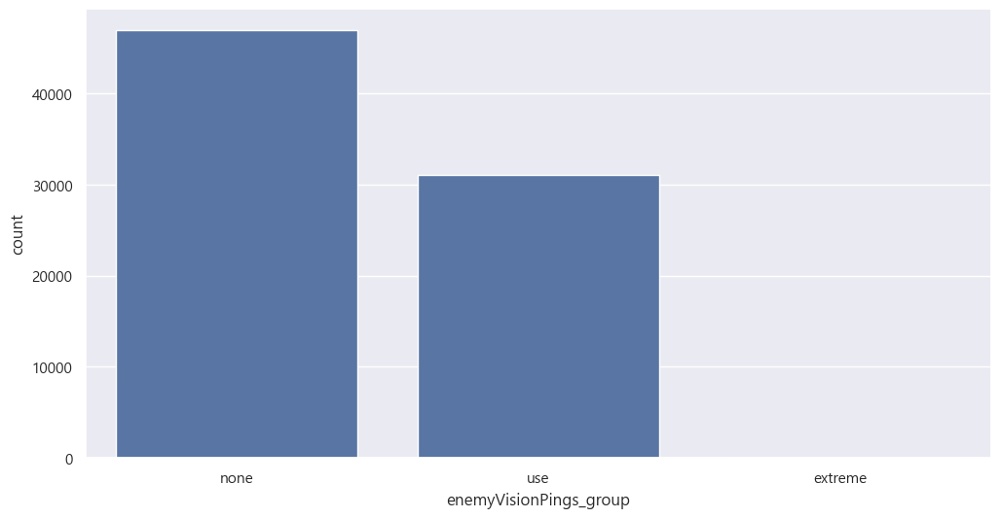

In [99]:
sns.countplot(x='enemyVisionPings_group', data=low_tier_ping)

#### needVisionPings(drop)

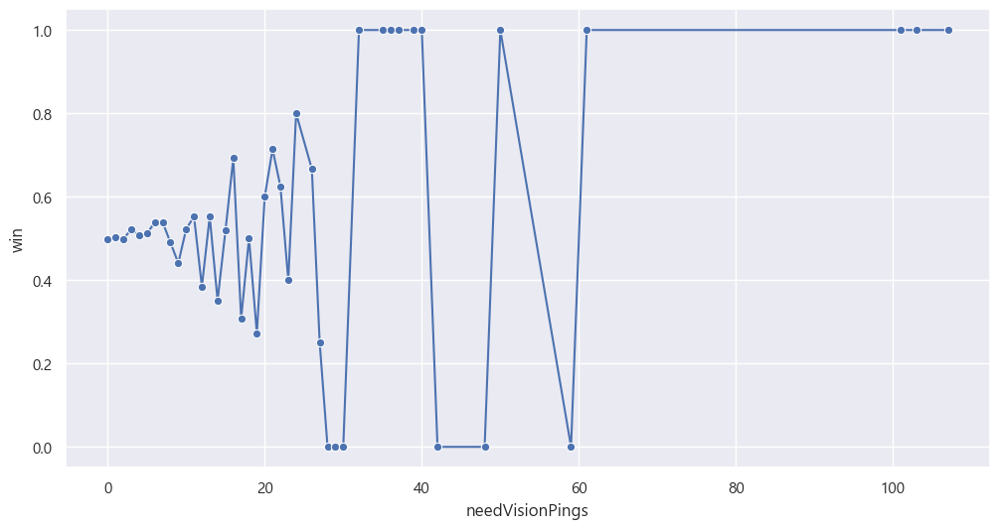

In [211]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('needVisionPings')['win'].mean().reset_index()

sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


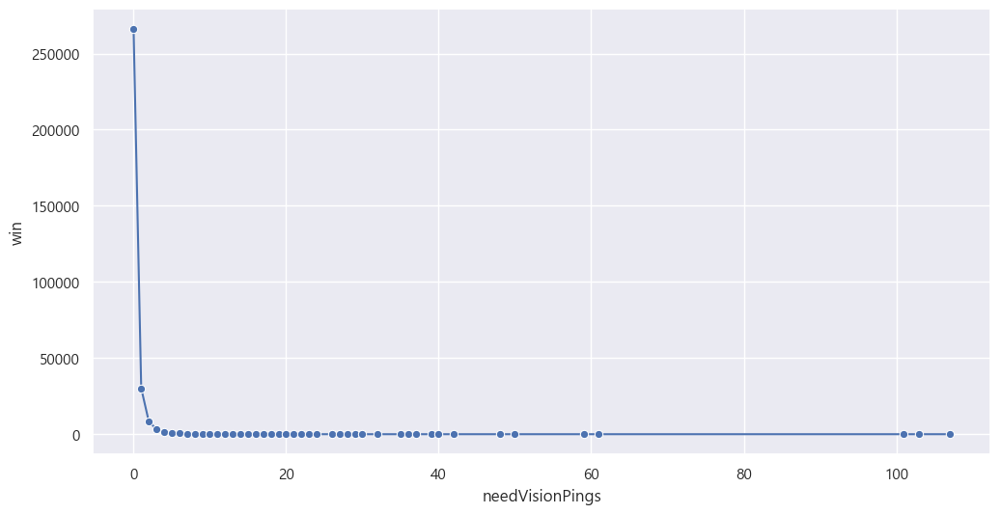

In [212]:
grouped=low_tier_ping.groupby('needVisionPings')['win'].count().reset_index()
sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='needVisionPings_group', ylabel='win'>

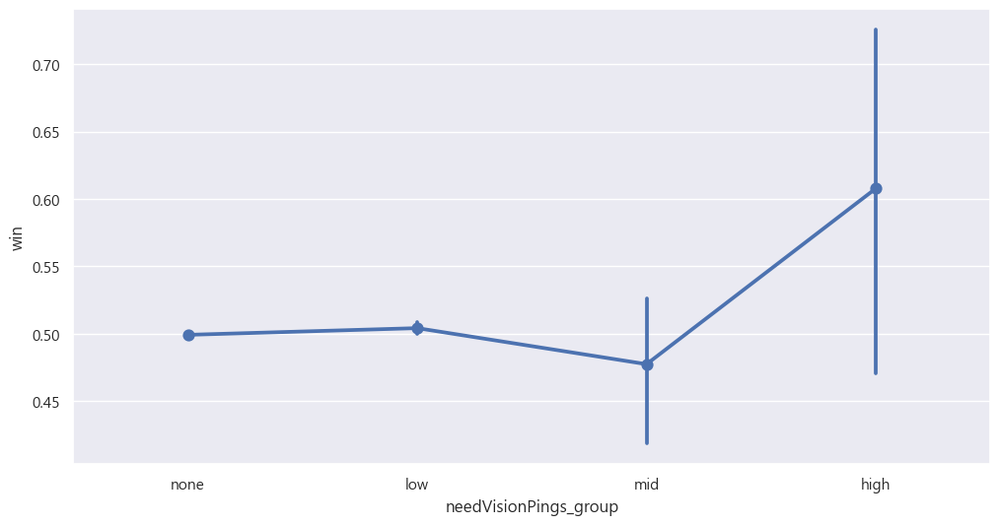

In [222]:
bins = [-1, 0, 10, 20, float('inf')]
labels = ['none', 'low', 'mid', 'high']

low_tier_ping['needVisionPings_group'] = pd.cut(low_tier_ping['needVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='needVisionPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='needVisionPings_group', ylabel='count'>

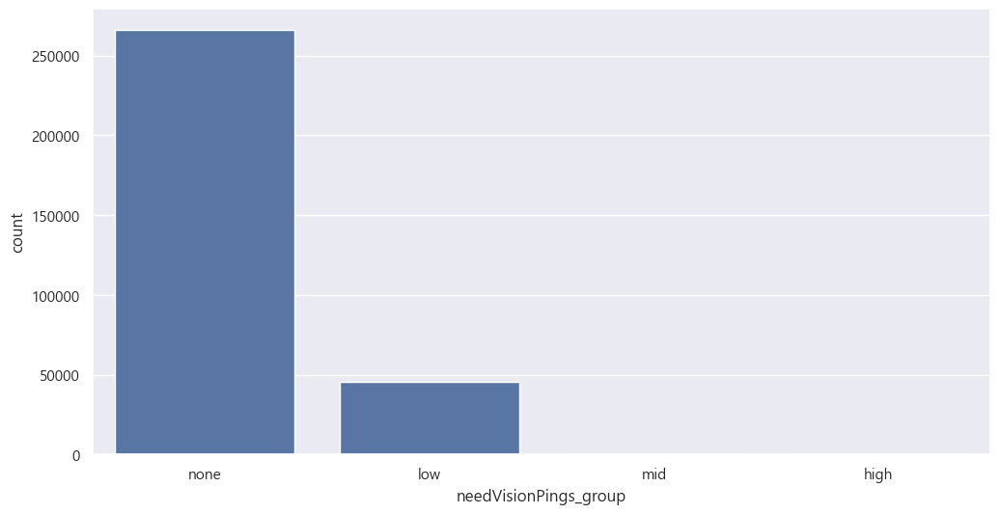

In [215]:
sns.countplot(x='needVisionPings_group', data=low_tier_ping)

#### allInPings(drop)

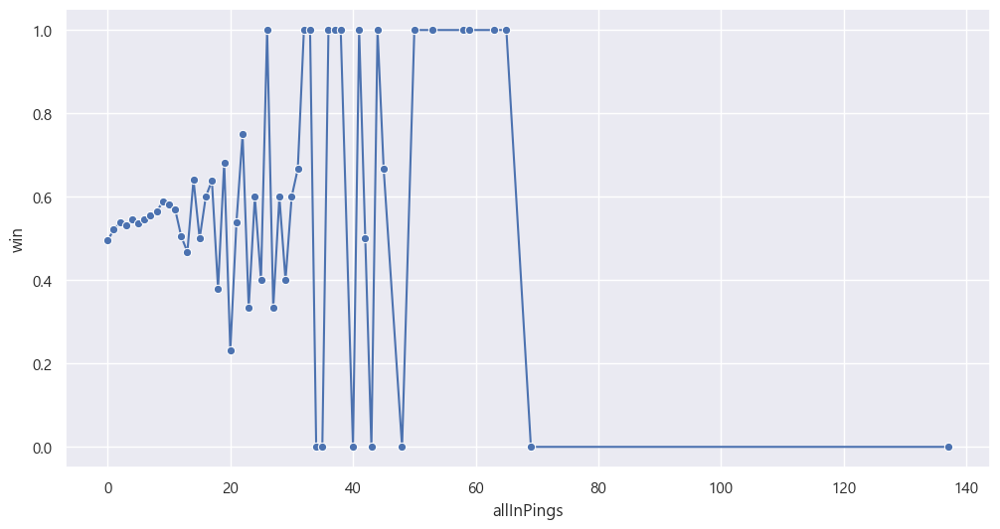

In [216]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = low_tier_ping.groupby('allInPings')['win'].mean().reset_index()

sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


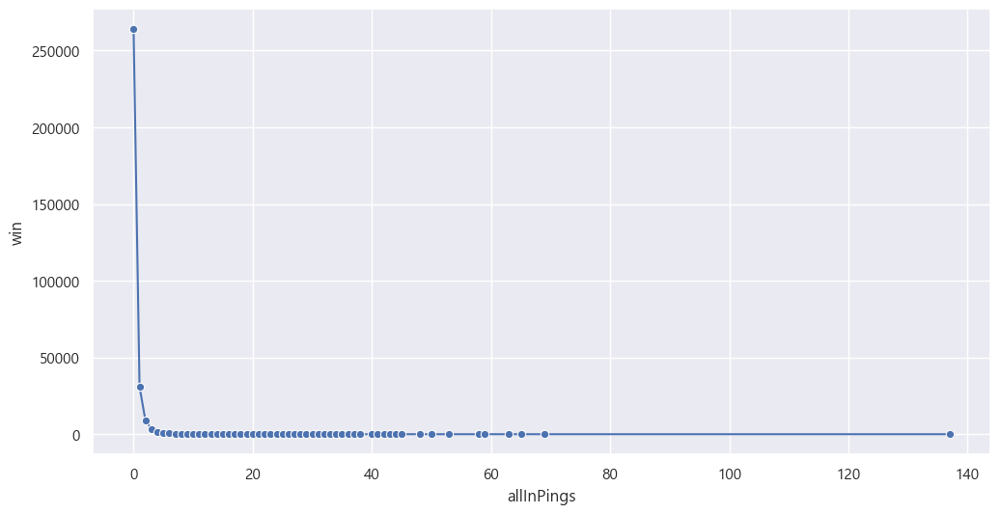

In [217]:
grouped=low_tier_ping.groupby('allInPings')['win'].count().reset_index()
sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='allInPings_group', ylabel='win'>

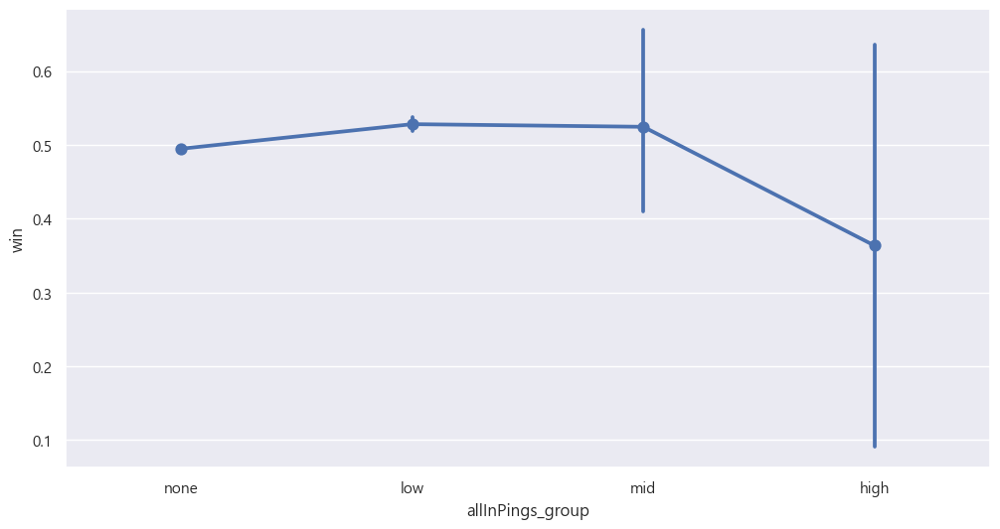

In [220]:
bins = [-1, 0, 10, 30, float('inf')]
labels = ['none', 'low', 'mid', 'high']

low_tier_ping['allInPings_group'] = pd.cut(low_tier_ping['allInPings'], bins=bins, labels=labels)


sns.pointplot(x='allInPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='allInPings_group', ylabel='count'>

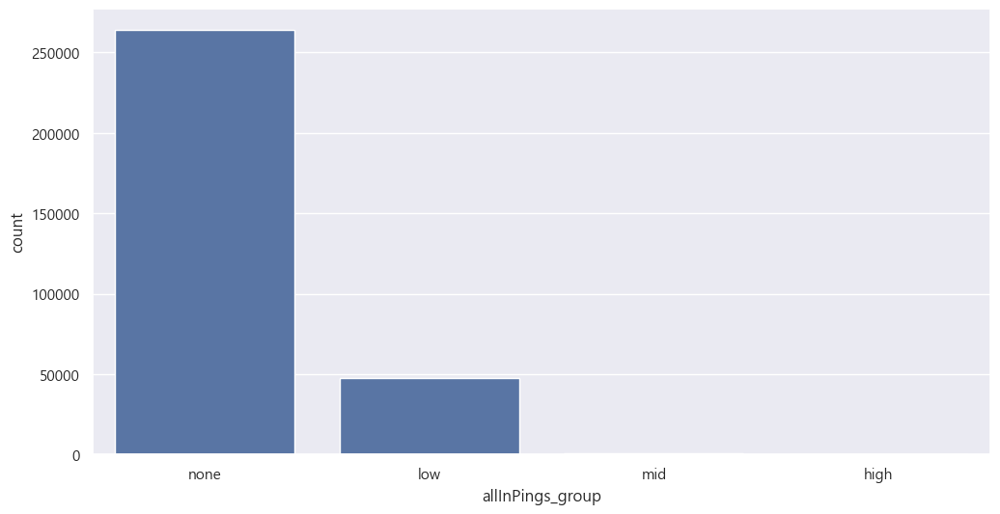

In [221]:
sns.countplot(x='allInPings_group', data=low_tier_ping)

### 다시 모델 돌릴 시간

In [225]:
col_list=['commandPings_group', 'getBackPings_group','onMyWayPings_group','allInPings_group','assistMePings_group',
          'needVisionPings_group', 'enemyMissingPings_group', 'enemyVisionPings_group'
         ]
low_tier_ping_log = pd.get_dummies(low_tier_ping, columns=col_list, drop_first=True)
low_tier_ping=low_tier_ping_log.drop(['commandPings', 'getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings','pings'],axis=1)

In [226]:
change=low_tier_ping.columns.to_list()
for col in change:
    low_tier_ping[col] = low_tier_ping[col].astype(int)

In [227]:
low_tier_ping.describe()

,win,commandPings_group_normal,commandPings_group_heavy,commandPings_group_extreme,getBackPings_group_normal,getBackPings_group_heavy,getBackPings_group_extreme,onMyWayPings_group_light,onMyWayPings_group_normal,onMyWayPings_group_heavy,...,needVisionPings_group_low,needVisionPings_group_mid,needVisionPings_group_high,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyMissingPings_group_extreme,enemyVisionPings_group_use,enemyVisionPings_group_more_often,enemyVisionPings_group_extreme
count,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,...,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000,312100.000000
mean,0.500000,0.750743,0.002970,0.000407,0.526524,0.004912,0.000263,0.772884,0.017241,0.001182,...,0.146556,0.000926,0.000163,0.765136,0.012560,0.000763,0.000163,0.405537,0.005710,0.000058
std,0.500001,0.432583,0.054419,0.020168,0.499297,0.069913,0.016207,0.418969,0.130169,0.034365,...,0.353663,0.030416,0.012782,0.423914,0.111366,0.027604,0.012782,0.490996,0.075347,0.007594
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [228]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = low_tier_ping.drop(['win'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [229]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
0,const,8.960586
7,onMyWayPings_group_light,1.288306
14,assistMePings_group_low,1.259015
8,onMyWayPings_group_normal,1.181876
21,enemyMissingPings_group_low,1.151332
15,assistMePings_group_mid,1.108936
11,allInPings_group_low,1.092446
1,commandPings_group_normal,1.091716
22,enemyMissingPings_group_mid,1.089383
18,needVisionPings_group_low,1.085305


In [230]:
import statsmodels.api as sm

# 1. X, y 분리
X = low_tier_ping.drop(['win'],axis=1)
y = low_tier_ping['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.689884
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:               312100
Model:                          Logit   Df Residuals:                   312073
Method:                           MLE   Df Model:                           26
Date:                Wed, 30 Jul 2025   Pseudo R-squ.:                0.004708
Time:                        13:41:44   Log-Likelihood:            -2.1531e+05
converged:                       True   LL-Null:                   -2.1633e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
commandPings_group_normal             0.0818      0.008     10

# 그럼 분당 핑수는 어떤 영향을 줄까요?(아브실골)

In [419]:
low_tier_ping = pd.concat([iron_ping, bronze_ping])
low_tier_ping = pd.concat([low_tier_ping, silver_ping])
low_tier_ping = pd.concat([low_tier_ping, gold_ping])

In [420]:
low_tier_ping[low_tier_ping['is_replay'] == False]

,matchId,blue/red,gameDuration,puuid,win,is_Surrender_aft_25m,is_Early_Surrender,is_replay,teamPosition,championName,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,7.577042e+09,True,2048.0,XlgZmsWE39cQZn_OsGiIwBLVpxDJVmDqatmCQ3zgU11l0J...,False,True,False,False,TOP,Volibear,0,3,0,22,0,1,0,4,4
1,7.577042e+09,True,2048.0,zztH5dfHbYVkI1aEIYikq90F8eb7elqPHaPb_ZHVMROp9q...,False,True,False,False,JUNGLE,Naafiri,0,38,0,15,0,3,0,5,0
2,7.577042e+09,True,2048.0,Ix4xwfUhn11ryGAYvrXT6aZ6kg1cN1Oi1DV3updGCUvuwD...,False,True,False,False,MIDDLE,Zed,14,0,0,9,0,2,0,1,0
3,7.577042e+09,True,2048.0,UBmWp5kqqCswKrcAs3n8OjPrer8HOE0_DjHdJsDOuEW1RL...,False,True,False,False,BOTTOM,Samira,0,0,0,0,0,0,0,10,5
4,7.577042e+09,True,2048.0,t8jDmIu7sm5bnAsL80d84lcPOoE6jCqf6mIQ0hy3PGWdoc...,False,True,False,False,UTILITY,Swain,4,0,0,0,0,1,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,7.537040e+09,False,1689.0,2q8LvoTJLcjQJDPt1z-FGxlNdyQsWeC3uKX33sbfmnrvwH...,False,False,False,False,TOP,Swain,2,0,0,2,1,1,0,1,0
19996,7.537040e+09,False,1689.0,yNE_Um4QMt8UlYxPf5YjllpZRVxRgK2PYt3kX1J3J545Ys...,False,False,False,False,JUNGLE,Talon,6,13,0,7,1,6,2,5,4
19997,7.537040e+09,False,1689.0,fBjPB_Xf3CyqbTMAQZO9MB-GZvv09Y9vIJysnCteN7Ul5F...,False,False,False,False,MIDDLE,Yasuo,15,1,0,9,0,0,0,5,0
19998,7.537040e+09,False,1689.0,XJvgRb9Aw8AfPjMcg5-8hyLbd7tIlCsKZQ52uQdgoJsUMK...,False,False,False,False,BOTTOM,Jinx,3,0,0,2,0,3,0,0,0


In [421]:
low_tier_ping['gameDuration_minute']=round(low_tier_ping['gameDuration']/60)

In [422]:
low_tier_game=low_tier_ping[low_tier_ping['is_replay'] == False] #다시하기 게임들은 날려주고
ping_list=['commandPings','getBackPings','holdPings','onMyWayPings','allInPings','assistMePings','needVisionPings',
           'enemyMissingPings','enemyVisionPings']

for ping in ping_list:
    low_tier_game[ping] = low_tier_game[ping] / low_tier_game['gameDuration_minute']
low_tier_ping=low_tier_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings',
                         'onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\3401281768.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_tier_game[ping] = low_tier_game[ping] / low_tier_game['gameDuration_minute']


In [423]:
low_tier_ping

,win,is_Surrender_aft_25m,is_Early_Surrender,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,False,True,False,0.000000,0.088235,0.0,0.647059,0.000000,0.029412,0.000000,0.117647,0.117647
1,False,True,False,0.000000,1.117647,0.0,0.441176,0.000000,0.088235,0.000000,0.147059,0.000000
2,False,True,False,0.411765,0.000000,0.0,0.264706,0.000000,0.058824,0.000000,0.029412,0.000000
3,False,True,False,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.294118,0.147059
4,False,True,False,0.117647,0.000000,0.0,0.000000,0.000000,0.029412,0.000000,0.029412,0.058824
...,...,...,...,...,...,...,...,...,...,...,...,...
19995,False,False,False,0.071429,0.000000,0.0,0.071429,0.035714,0.035714,0.000000,0.035714,0.000000
19996,False,False,False,0.214286,0.464286,0.0,0.250000,0.035714,0.214286,0.071429,0.178571,0.142857
19997,False,False,False,0.535714,0.035714,0.0,0.321429,0.000000,0.000000,0.000000,0.178571,0.000000
19998,False,False,False,0.107143,0.000000,0.0,0.071429,0.000000,0.107143,0.000000,0.000000,0.000000


## EDA

### win

In [267]:
low_tier_ping['win'].value_counts()

win
False    117005
True     117005
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

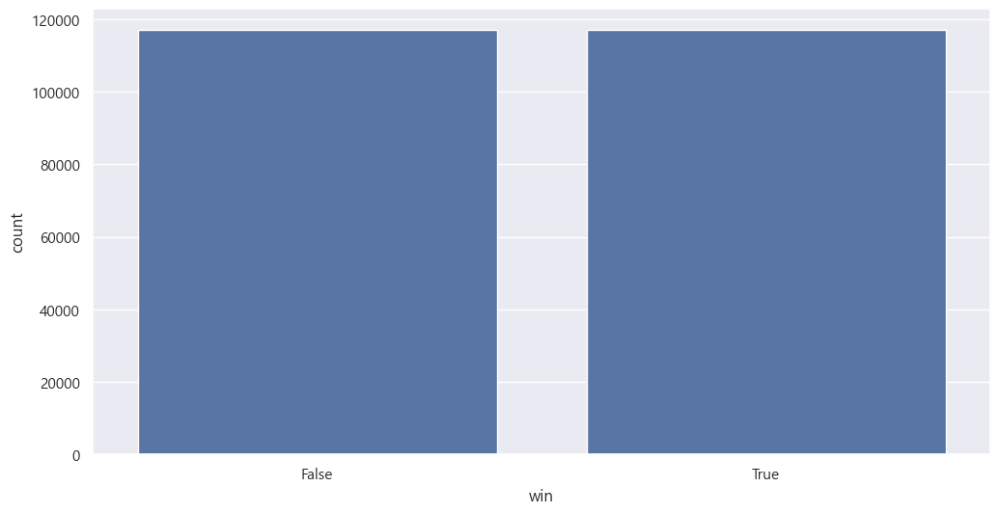

In [269]:
sns.countplot(x=low_tier_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [270]:
low_tier_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    132930
True     101080
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

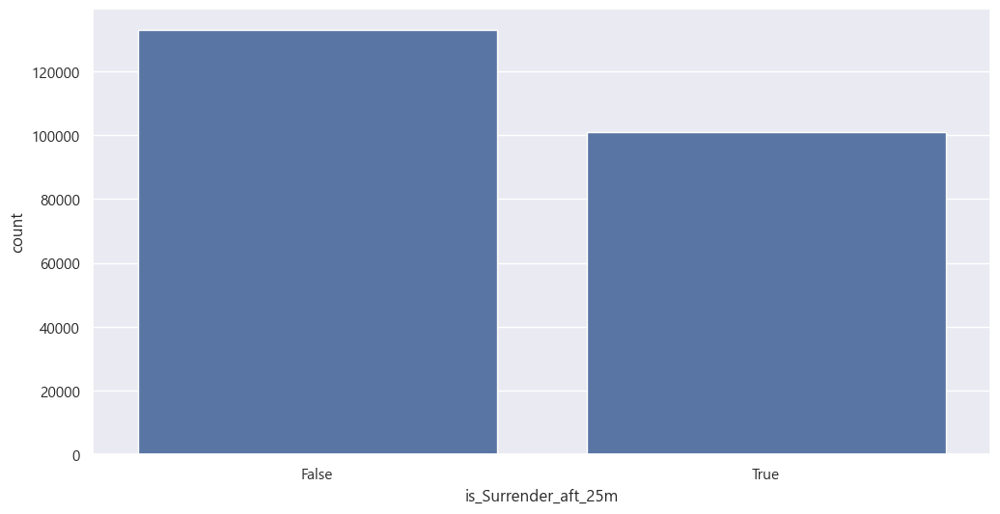

In [271]:
sns.countplot(x=low_tier_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [272]:
low_tier_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    234010
Name: count, dtype: int64

### 일반 핑

In [273]:
low_tier_ping['commandPings'].value_counts()

commandPings
0.000000    59932
0.125000     2989
0.250000     2918
0.200000     2836
0.062500     2626
            ...  
1.871795        1
1.731707        1
1.473684        1
2.480000        1
1.063830        1
Name: count, Length: 1676, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

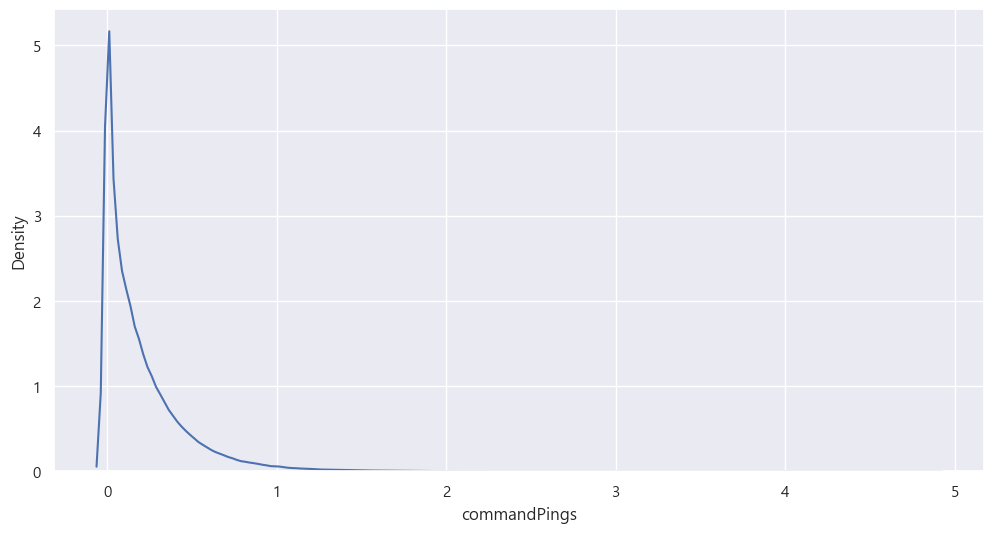

In [274]:
sns.kdeplot(x=low_tier_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

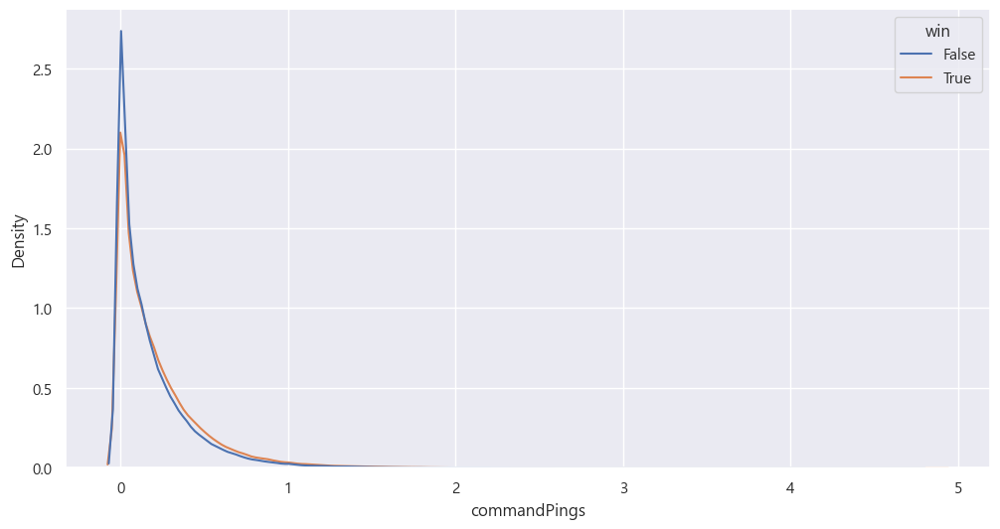

In [275]:
sns.kdeplot(x=low_tier_ping['commandPings'],hue=low_tier_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [276]:
low_tier_ping['getBackPings'].value_counts()

getBackPings
0.000000    110403
0.062500      2516
0.125000      2241
0.066667      2133
0.034483      1889
             ...  
1.552632         1
1.918919         1
1.275000         1
0.471698         1
1.423077         1
Name: count, Length: 1249, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

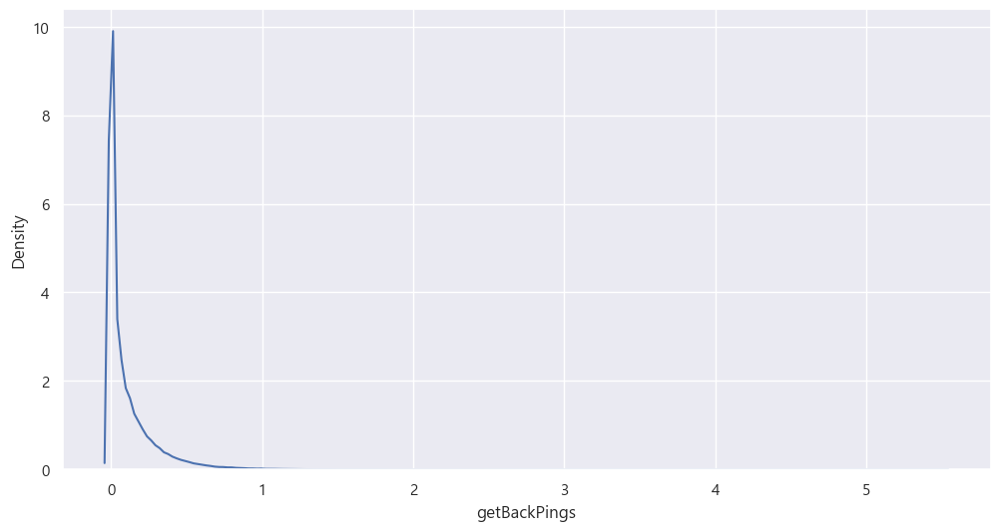

In [277]:
sns.kdeplot(x=low_tier_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

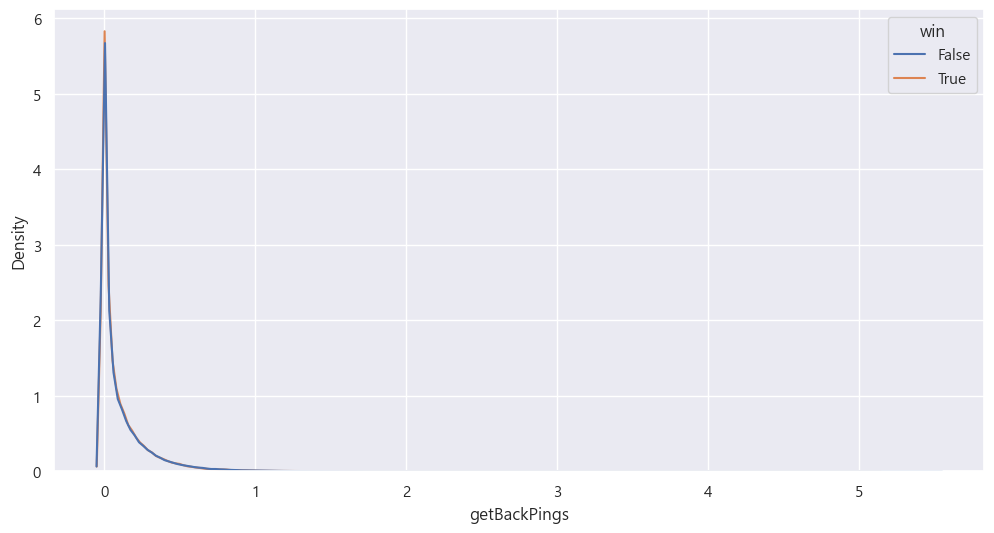

In [278]:
sns.kdeplot(x=low_tier_ping['getBackPings'],hue=low_tier_ping['win'])

### 압박핑 -> 정작 브론즈급에선 사용된 적이 없음

In [279]:
low_tier_ping['holdPings'].value_counts()

holdPings
0.0    234010
Name: count, dtype: int64

### 가는중 핑

In [280]:
low_tier_ping['onMyWayPings'].value_counts()

onMyWayPings
0.000000    49844
0.250000     2844
0.125000     2796
0.200000     2621
0.062500     2614
            ...  
2.923077        1
2.302326        1
2.279070        1
2.148148        1
2.862069        1
Name: count, Length: 2037, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

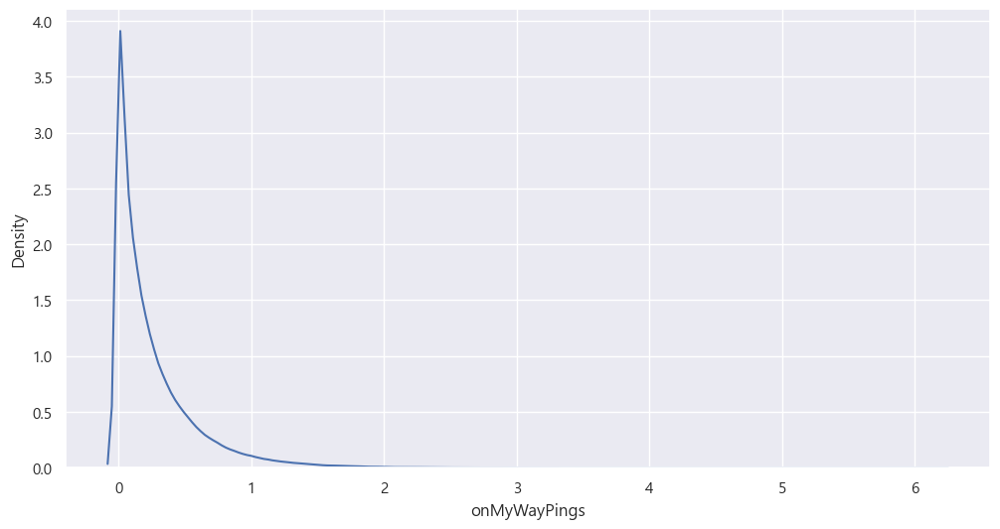

In [281]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

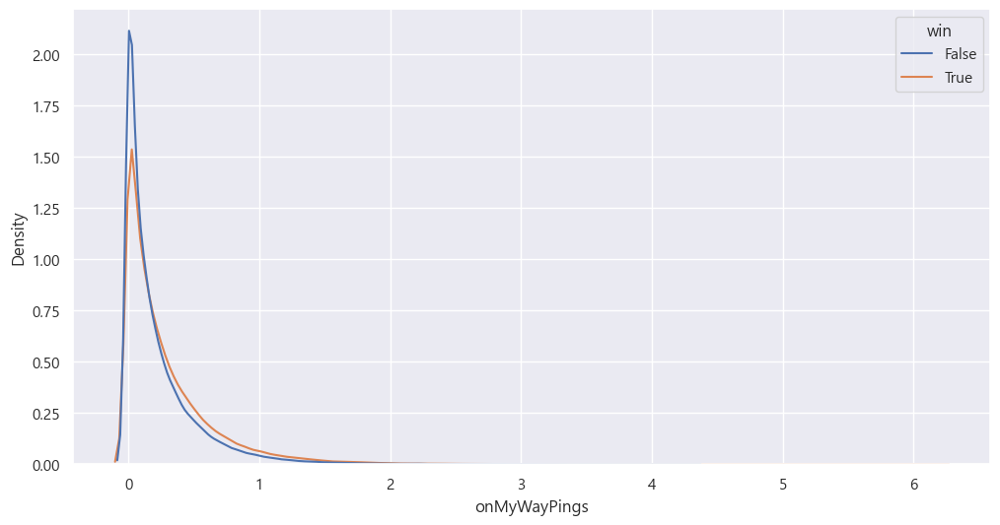

In [282]:
sns.kdeplot(x=low_tier_ping['onMyWayPings'],hue=low_tier_ping['win'])

### 총공격핑

In [283]:
low_tier_ping['allInPings'].value_counts()

allInPings
0.000000    197710
0.033333      1516
0.034483      1502
0.035714      1472
0.032258      1447
             ...  
0.405405         1
0.821429         1
1.105263         1
1.260870         1
0.875000         1
Name: count, Length: 509, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

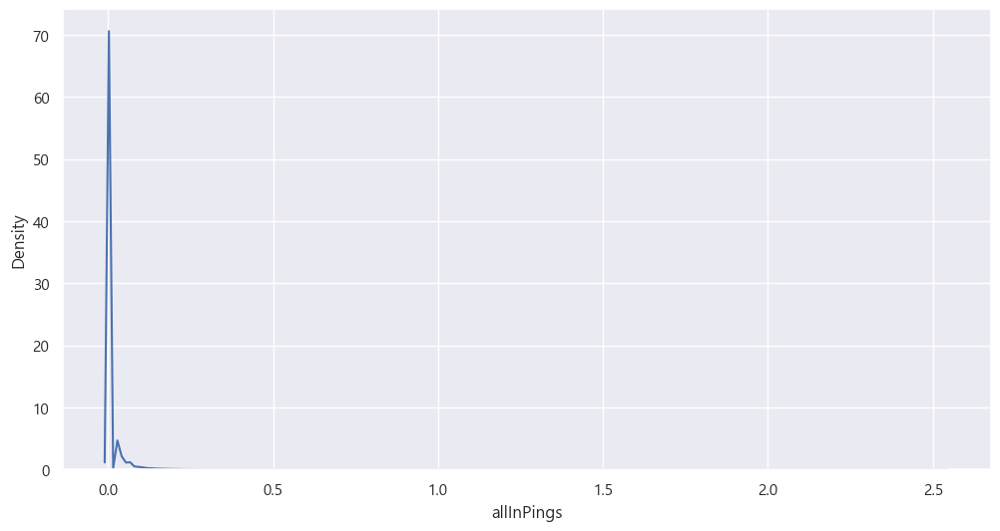

In [284]:
sns.kdeplot(x=low_tier_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

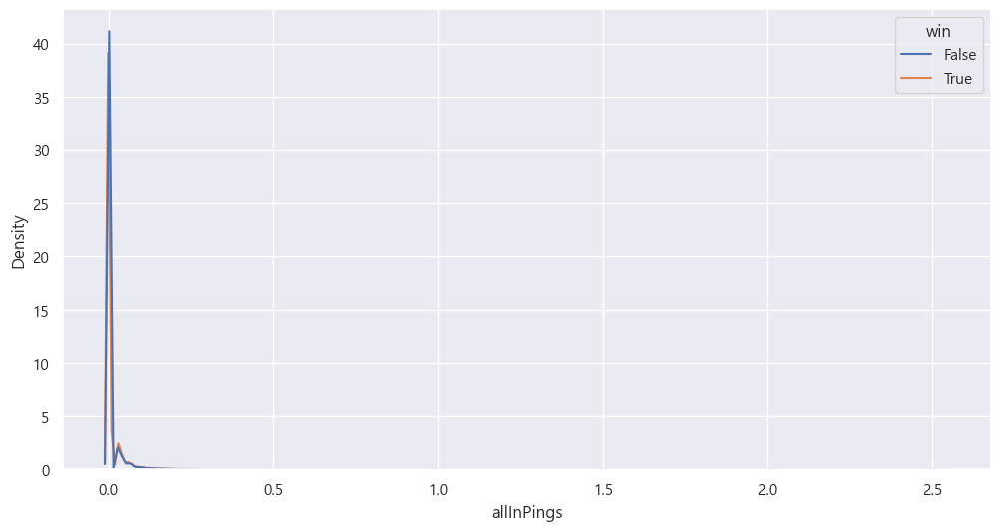

In [285]:
sns.kdeplot(x=low_tier_ping['allInPings'],hue=low_tier_ping['win'])

### 지원핑

In [286]:
low_tier_ping['assistMePings'].value_counts()

assistMePings
0.000000    101583
0.062500      2815
0.066667      2505
0.125000      2266
0.034483      2229
             ...  
1.295455         1
0.196429         1
0.660714         1
1.236842         1
1.894737         1
Name: count, Length: 1248, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

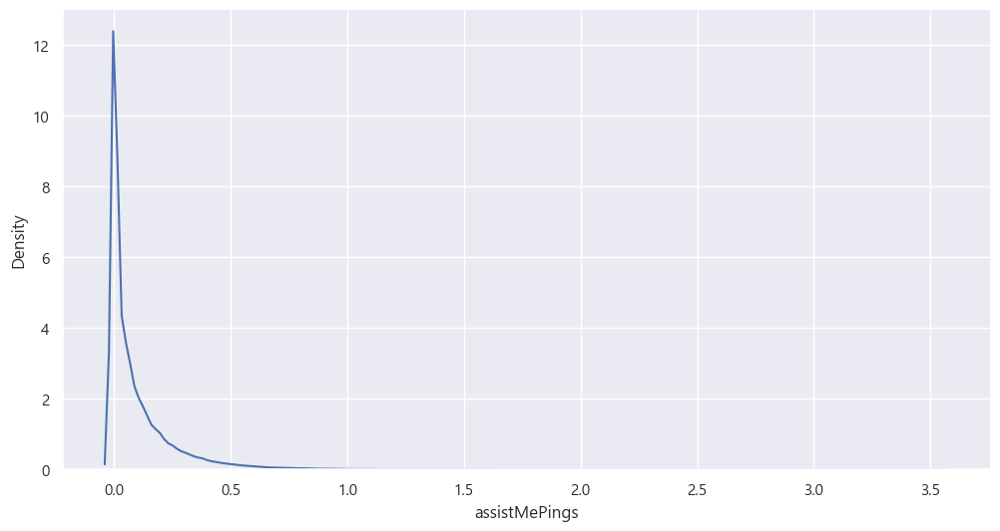

In [287]:
sns.kdeplot(x=low_tier_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

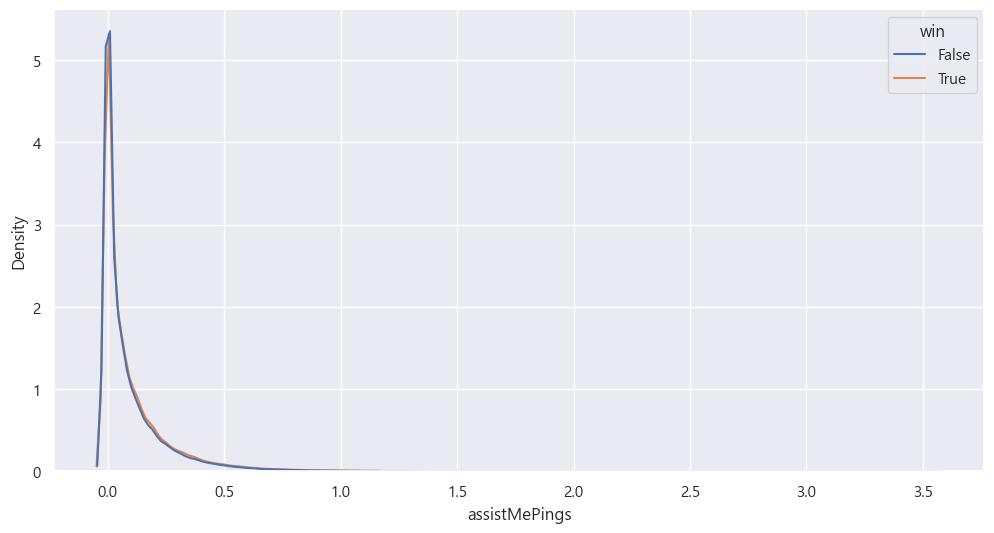

In [288]:
sns.kdeplot(x=low_tier_ping['assistMePings'],hue=low_tier_ping['win'])

### 시야 필요함 핑

In [289]:
low_tier_ping['needVisionPings'].value_counts()

needVisionPings
0.000000    199146
0.033333      1477
0.034483      1460
0.035714      1408
0.032258      1354
             ...  
0.379310         1
0.513514         1
0.317073         1
0.419355         1
0.434783         1
Name: count, Length: 415, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='Density'>

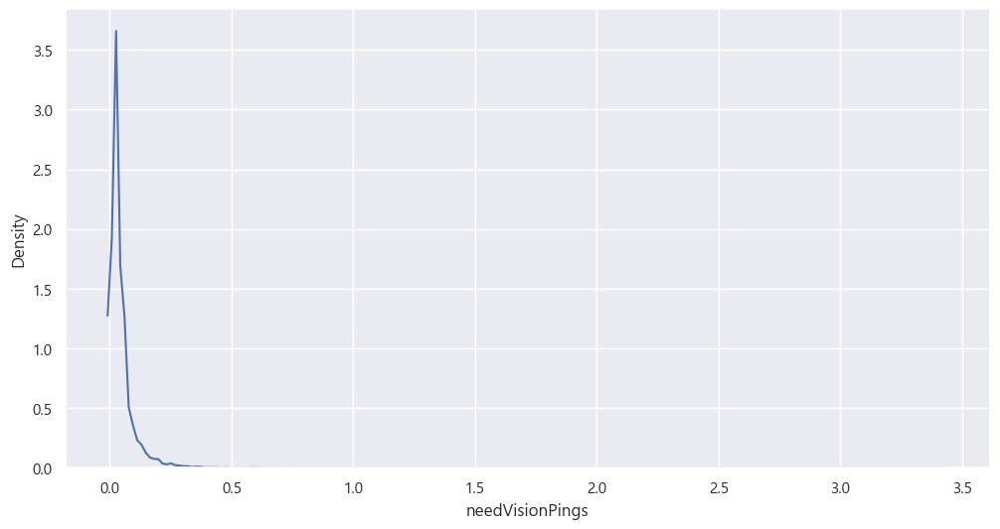

In [292]:
sns.kdeplot(x=low_tier_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='Density'>

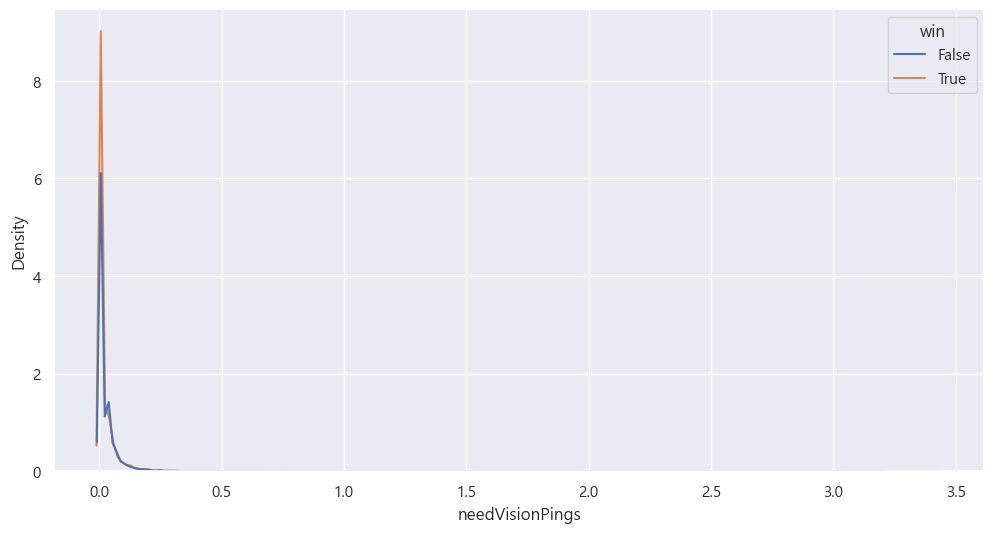

In [295]:
sns.kdeplot(x=low_tier_ping['needVisionPings'],hue=low_tier_ping['win'])

### 미아핑

In [296]:
low_tier_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0.000000    52577
0.125000     3241
0.250000     3192
0.200000     3027
0.062500     2985
            ...  
0.192982        1
1.212121        1
1.818182        1
1.878788        1
2.303030        1
Name: count, Length: 1376, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

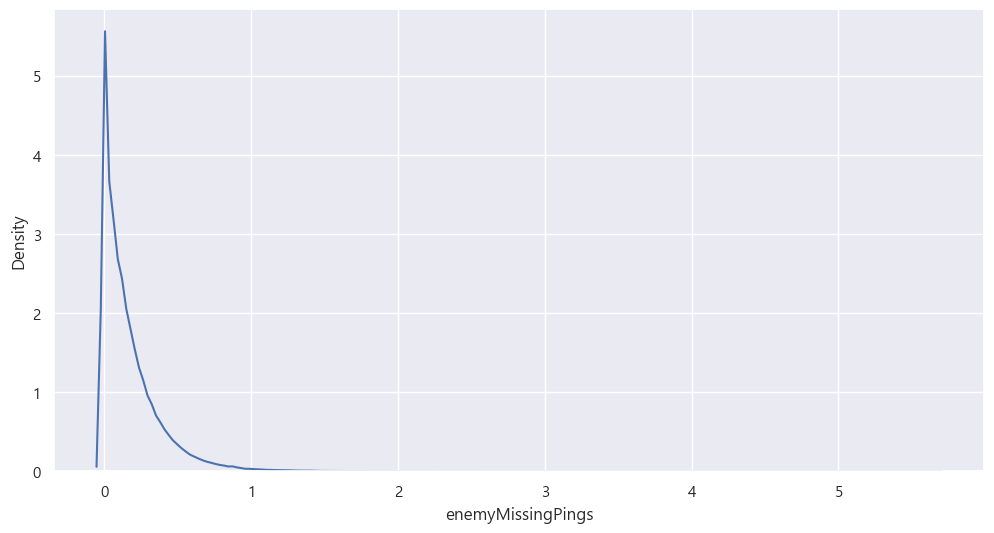

In [297]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

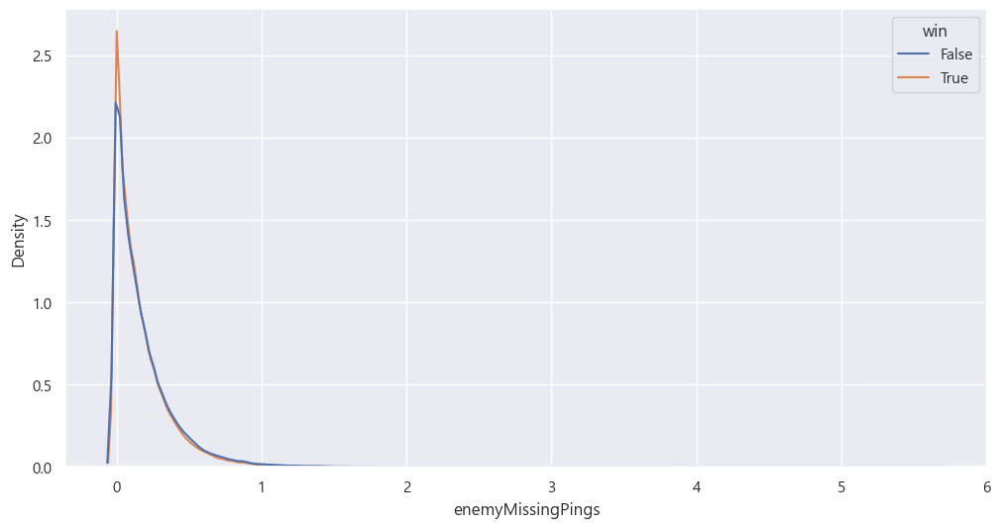

In [298]:
sns.kdeplot(x=low_tier_ping['enemyMissingPings'],hue = low_tier_ping['win'])

### 적 와드 / 시야핑

In [299]:
low_tier_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0.000000    139202
0.062500      2348
0.066667      2075
0.033333      2037
0.034483      2035
             ...  
0.770833         1
0.288462         1
0.469388         1
0.780488         1
0.087719         1
Name: count, Length: 759, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

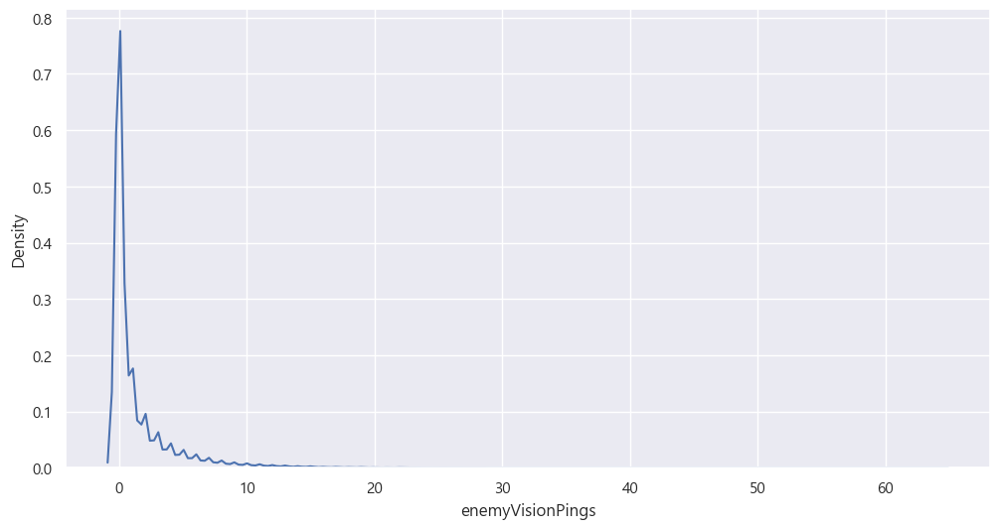

In [300]:
sns.kdeplot(x=bronze_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

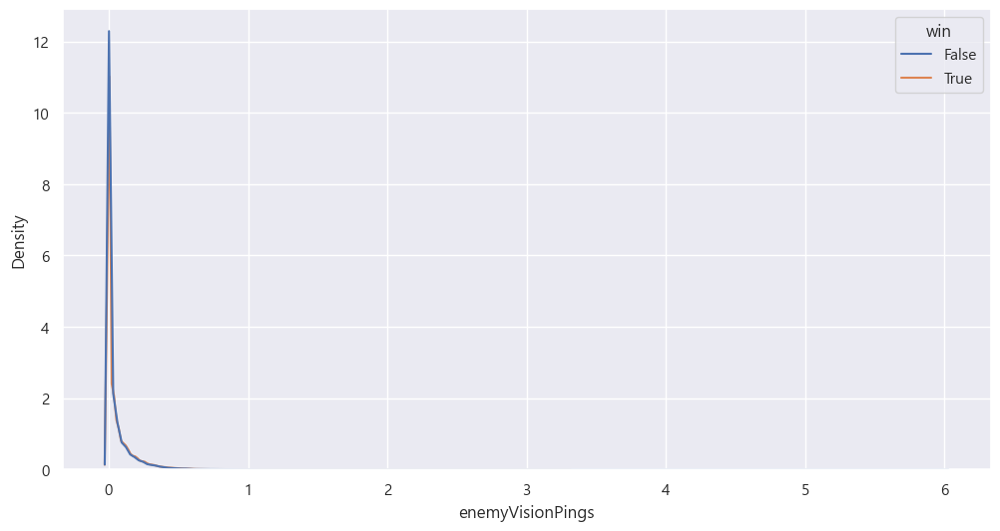

In [301]:
sns.kdeplot(x=low_tier_ping['enemyVisionPings'],hue=low_tier_ping['win'])

## 핑과 승패사이의 상관관계를 봐봅시다.

In [473]:
low_tier_ping['pings'] = low_tier_ping['commandPings'] + low_tier_ping['getBackPings'] + low_tier_ping['holdPings'] +low_tier_ping['onMyWayPings'] + low_tier_ping['allInPings'] + low_tier_ping['assistMePings'] + low_tier_ping['needVisionPings'] +low_tier_ping['enemyMissingPings'] + low_tier_ping['enemyVisionPings']
low_tier_ping=low_tier_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

In [303]:
low_tier_ping=low_tier_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

In [304]:
low_tier_ping['win']=low_tier_ping['win'].astype(int)

In [305]:
corr_ping=low_tier_ping.corr()
corr_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
win,1.000000,0.066313,-0.001031,0.101779,0.017502,0.030518,0.003935,-0.030739,0.014196,0.065284
commandPings,0.066313,1.000000,0.217382,0.350469,0.153111,0.293326,0.129384,0.189935,0.071203,0.652701
getBackPings,-0.001031,0.217382,1.000000,0.290633,0.117655,0.275807,0.124951,0.205825,0.107522,0.549742
onMyWayPings,0.101779,0.350469,0.290633,1.000000,0.226292,0.439058,0.156203,0.211517,0.095546,0.778293
allInPings,0.017502,0.153111,0.117655,0.226292,1.000000,0.236157,0.155500,0.092588,0.029302,0.305711
assistMePings,0.030518,0.293326,0.275807,0.439058,0.236157,1.000000,0.210525,0.224800,0.073045,0.636800
needVisionPings,0.003935,0.129384,0.124951,0.156203,0.155500,0.210525,1.000000,0.140811,0.039282,0.273949
enemyMissingPings,-0.030739,0.189935,0.205825,0.211517,0.092588,0.224800,0.140811,1.000000,0.161695,0.541317
enemyVisionPings,0.014196,0.071203,0.107522,0.095546,0.029302,0.073045,0.039282,0.161695,1.000000,0.277561
pings,0.065284,0.652701,0.549742,0.778293,0.305711,0.636800,0.273949,0.541317,0.277561,1.000000


<Axes: >

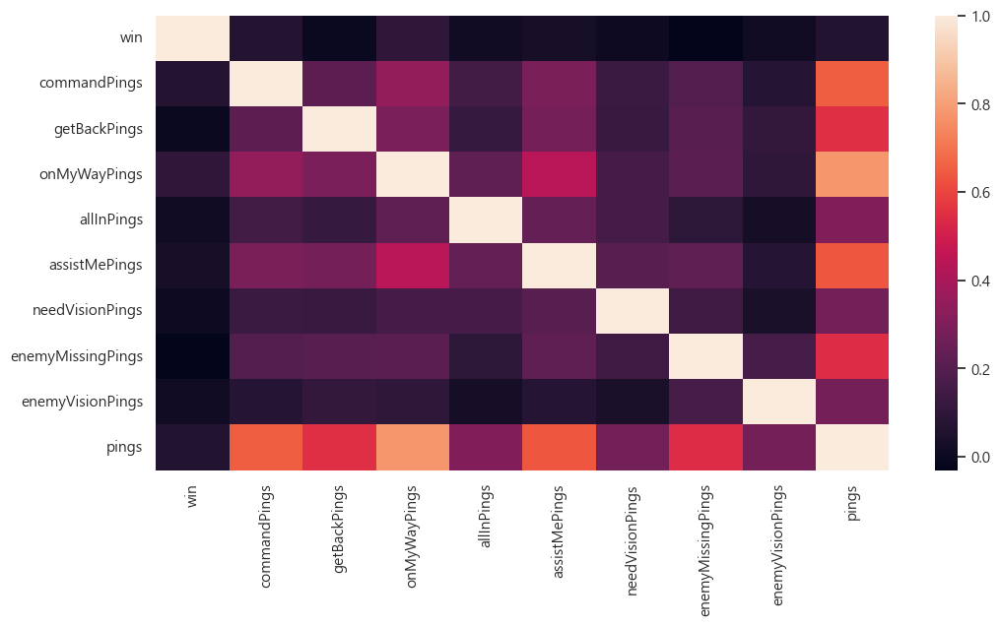

In [306]:
sns.heatmap(corr_ping)

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [307]:
from scipy.stats import levene

stat, p = levene(low_tier_ping['pings'], low_tier_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 1673.631, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [308]:
win_pings=low_tier_ping[low_tier_ping['win'] == 1]['pings']
lose_pings=low_tier_ping[~(low_tier_ping['win'] == 1)]['pings']

In [309]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,31.648311,232455.86249,two-sided,2.351094e-219,"[0.1, 0.11]",0.130847,4.888e+214,1.0


In [310]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(low_tier_ping[ping], low_tier_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    correction_ = p <= 0.05
    win_pings=low_tier_ping[low_tier_ping['win'] == 1][ping]
    lose_pings=low_tier_ping[~(low_tier_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 601916.132, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,32.149181,231929.049846,two-sided,2.864766e-226,"[0.03, 0.04]",0.132918,3.958e+221,1.0



getBackPings
Levene’s test: stat = 1534153.562, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.49863,233806.786995,two-sided,0.61804,"[-0.0, 0.0]",0.002062,0.005,0.078936



onMyWayPings
Levene’s test: stat = 247441.536, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,49.4919,226770.027144,two-sided,0.0,"[0.06, 0.07]",0.204619,inf,1.0



allInPings
Levene’s test: stat = 35765159.767, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,8.46764,233117.159717,two-sided,2.518376e-17,"[0.0, 0.0]",0.035009,1.719e+13,1.0



assistMePings
Levene’s test: stat = 1872379.750, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,14.769611,233008.815912,two-sided,2.421904e-49,"[0.01, 0.01]",0.061064,1.03e+45,1.0



needVisionPings
Levene’s test: stat = 45834760.537, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.903696,230499.577164,two-sided,0.056951,"[-0.0, 0.0]",0.007871,0.029,0.477617



enemyMissingPings
Levene’s test: stat = 1068291.442, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-14.877017,231827.170465,two-sided,4.901896e-50,"[-0.01, -0.01]",0.061508,5.051e+45,NaN



enemyVisionPings
Levene’s test: stat = 4622850.383, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,6.867752,233959.829245,two-sided,6.538321e-12,"[0.0, 0.0]",0.028394,8.113e+07,1.0


In [311]:
low_tier_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,0,0.000000,0.088235,0.647059,0.000000,0.029412,0.000000,0.117647,0.117647,1.000000
1,0,0.000000,1.117647,0.441176,0.000000,0.088235,0.000000,0.147059,0.000000,1.794118
2,0,0.411765,0.000000,0.264706,0.000000,0.058824,0.000000,0.029412,0.000000,0.764706
3,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.294118,0.147059,0.441176
4,0,0.117647,0.000000,0.000000,0.000000,0.029412,0.000000,0.029412,0.058824,0.235294
...,...,...,...,...,...,...,...,...,...,...
19995,0,0.071429,0.000000,0.071429,0.035714,0.035714,0.000000,0.035714,0.000000,0.250000
19996,0,0.214286,0.464286,0.250000,0.035714,0.214286,0.071429,0.178571,0.142857,1.571429
19997,0,0.535714,0.035714,0.321429,0.000000,0.000000,0.000000,0.178571,0.000000,1.071429
19998,0,0.107143,0.000000,0.071429,0.000000,0.107143,0.000000,0.000000,0.000000,0.285714


## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

### 선형성 확보를 위한 다시 전처리....

#### commandPings

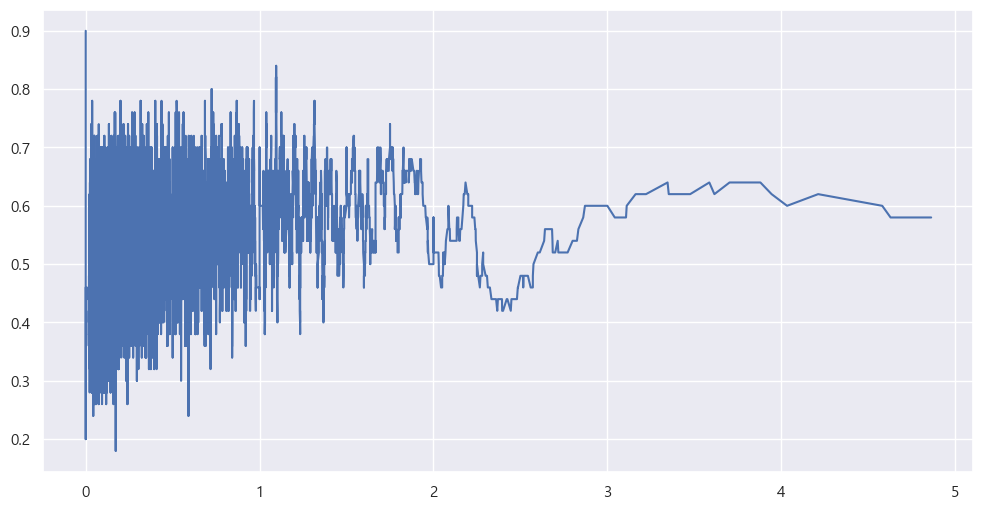

In [474]:
df_sorted = low_tier_ping.sort_values('commandPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=50, min_periods=10).mean()
plt.plot(df_sorted['commandPings'], df_sorted['rolling_win'])

In [475]:
df_sorted['commandPings']

78       0.000000
88       0.000000
14140    0.000000
14113    0.000000
14114    0.000000
           ...   
9807     4.580645
5542     4.628571
3472     4.628571
683      4.730769
879      4.862069
Name: commandPings, Length: 234010, dtype: float64

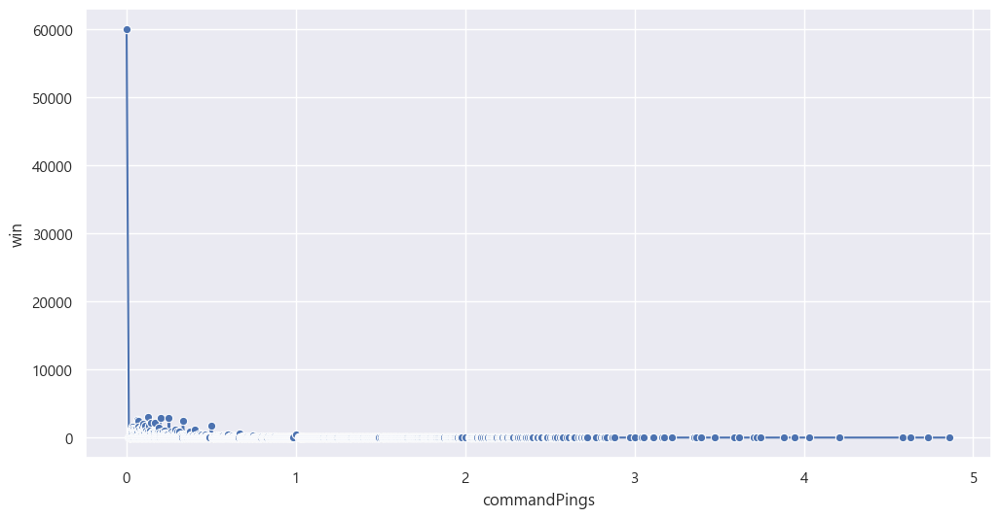

In [476]:
grouped=low_tier_ping.groupby('commandPings')['win'].count().reset_index()
sns.lineplot(x='commandPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='commandPings_group', ylabel='win'>

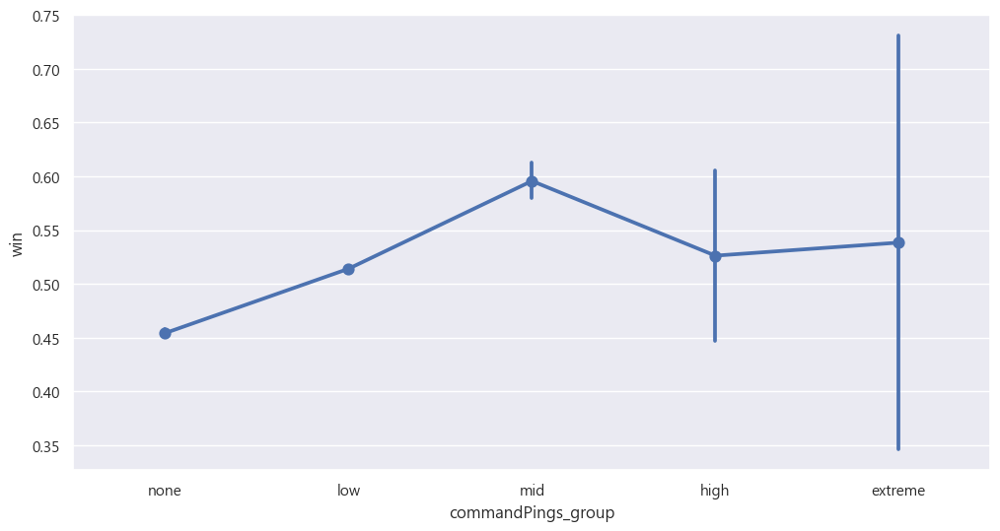

In [477]:
bins = [-1, 0, 1, 2, 3, float('inf')]
labels = ['none', 'low', 'mid','high', 'extreme']

low_tier_ping['commandPings_group'] = pd.cut(low_tier_ping['commandPings'], bins=bins, labels=labels)


sns.pointplot(x='commandPings_group', y='win', data=low_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\624731596.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()


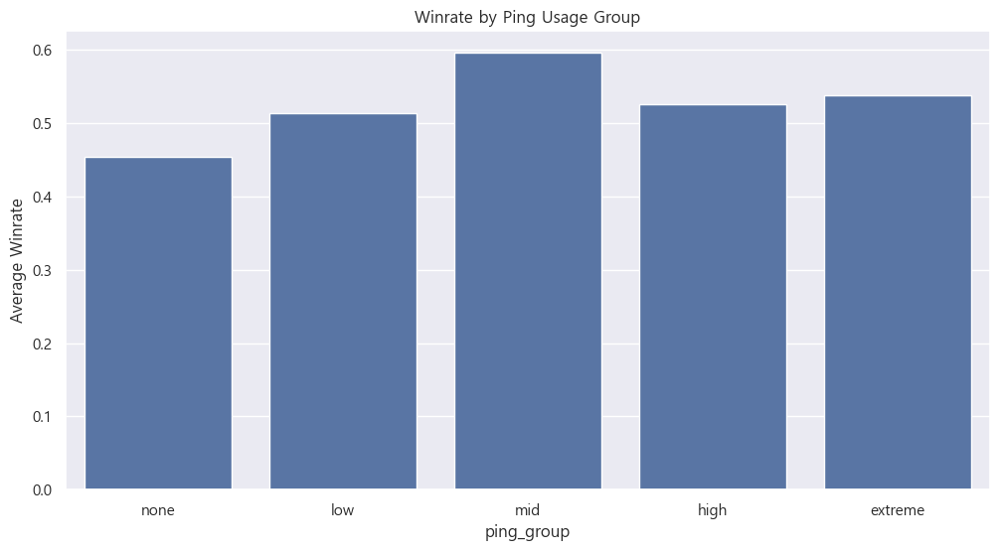

In [478]:
bins = [-1, 0, 1, 2, 3, float('inf')]
labels = ['none', 'low', 'mid','high', 'extreme']

low_tier_ping['ping_group'] = pd.cut(low_tier_ping['commandPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='commandPings_group', ylabel='count'>

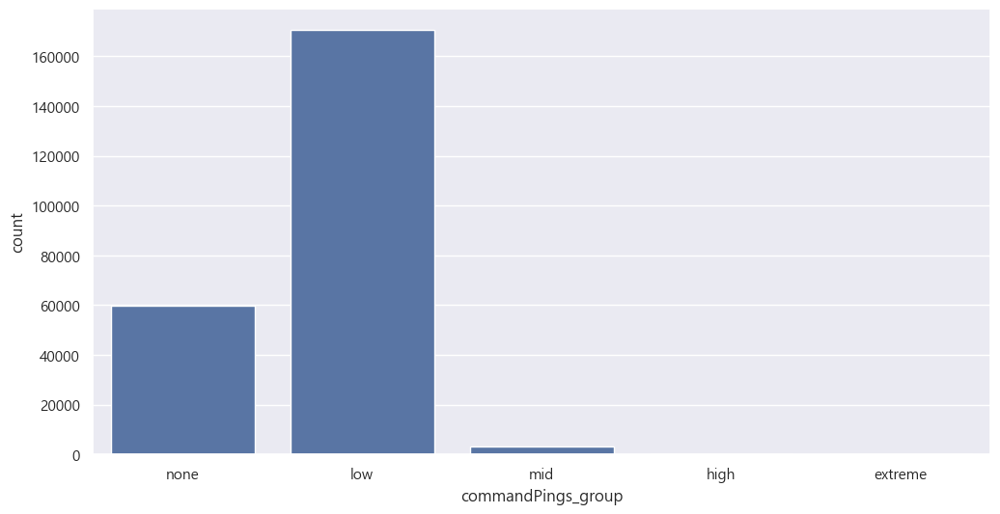

In [479]:
sns.countplot(x='commandPings_group', data=low_tier_ping)

#### getBackPings

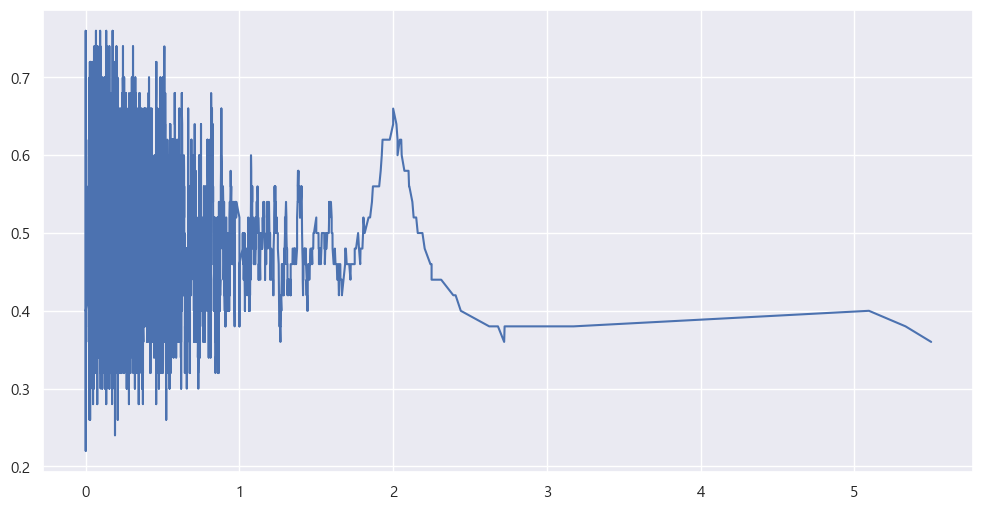

In [480]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('getBackPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=50, min_periods=10).mean()
plt.plot(df_sorted['getBackPings'], df_sorted['rolling_win'])

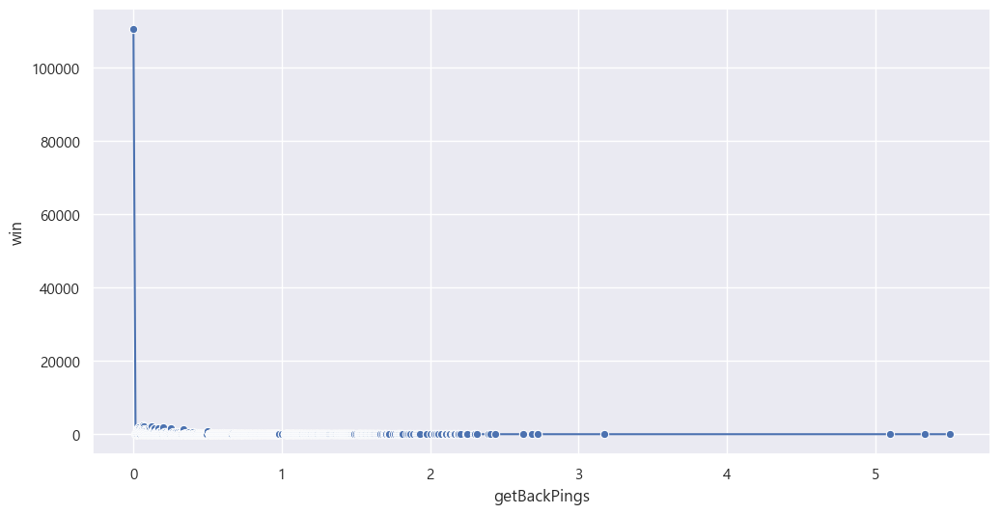

In [481]:
grouped=low_tier_ping.groupby('getBackPings')['win'].count().reset_index()
sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='getBackPings_group', ylabel='win'>

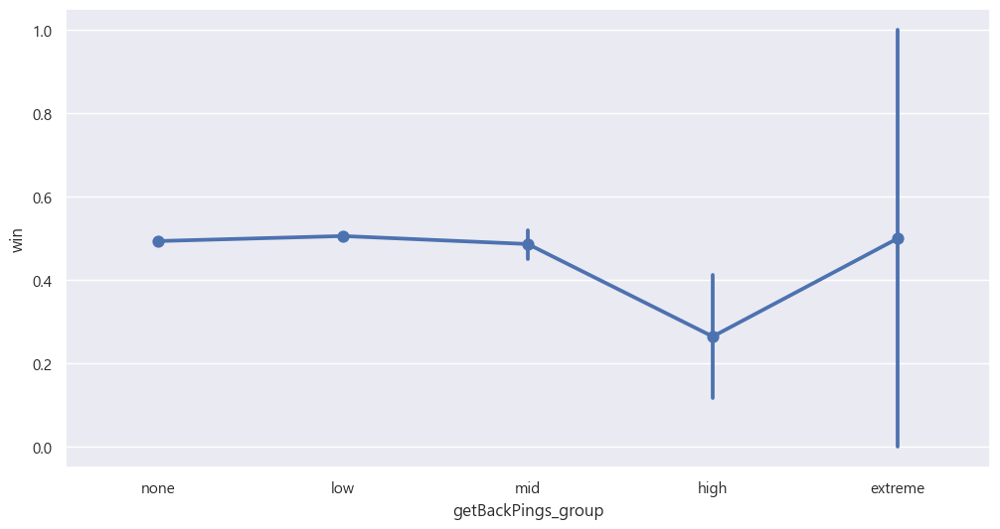

In [482]:
bins = [-1, 0, 1, 2, 3, float('inf')]
labels = ['none', 'low', 'mid','high', 'extreme']

low_tier_ping['getBackPings_group'] = pd.cut(low_tier_ping['getBackPings'], bins=bins, labels=labels)


sns.pointplot(x='getBackPings_group', y='win', data=low_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\1530672675.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()


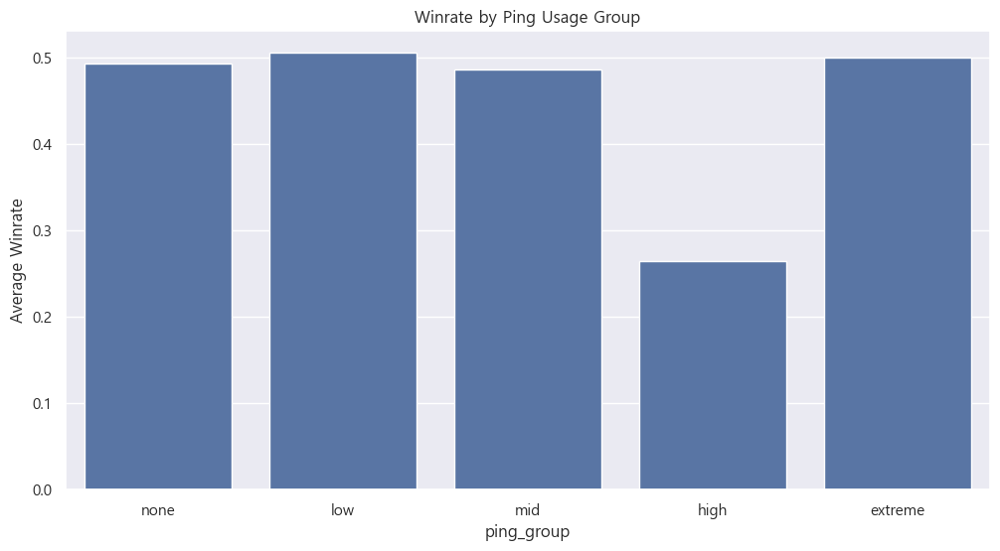

In [483]:
bins = [-1, 0, 1, 2, 3, float('inf')]
labels = ['none', 'low', 'mid','high', 'extreme']

low_tier_ping['ping_group'] = pd.cut(low_tier_ping['getBackPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='getBackPings_group', ylabel='count'>

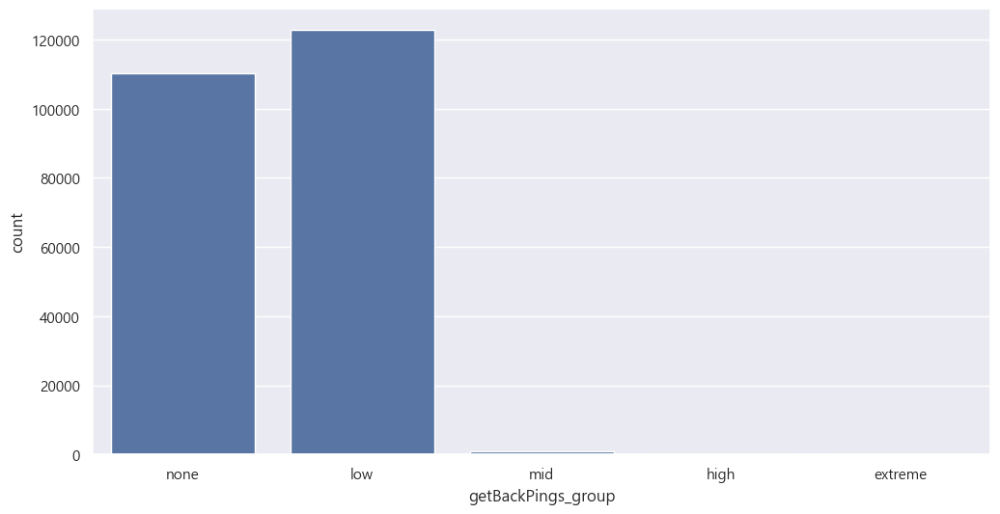

In [484]:
sns.countplot(x='getBackPings_group', data=low_tier_ping)

#### onMyWayPings

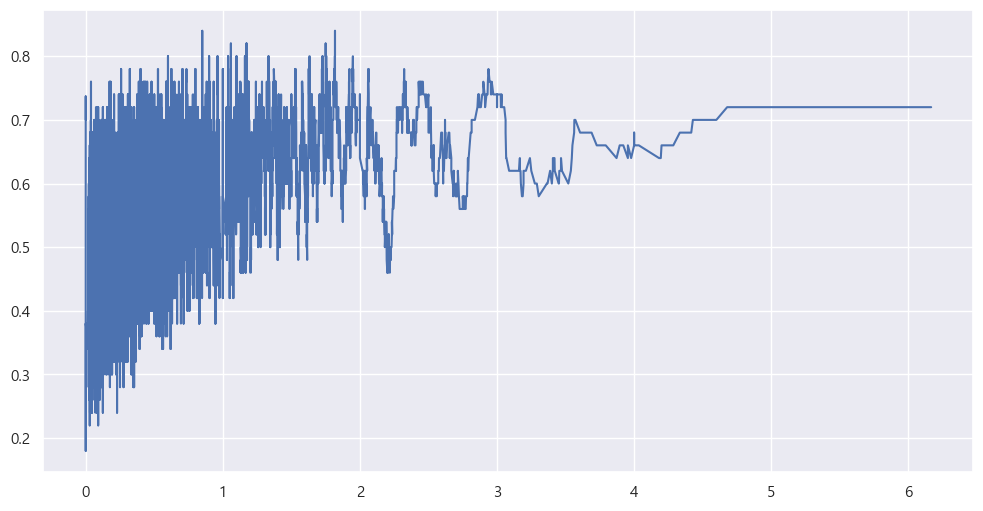

In [485]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('onMyWayPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=50, min_periods=10).mean()
plt.plot(df_sorted['onMyWayPings'], df_sorted['rolling_win'])

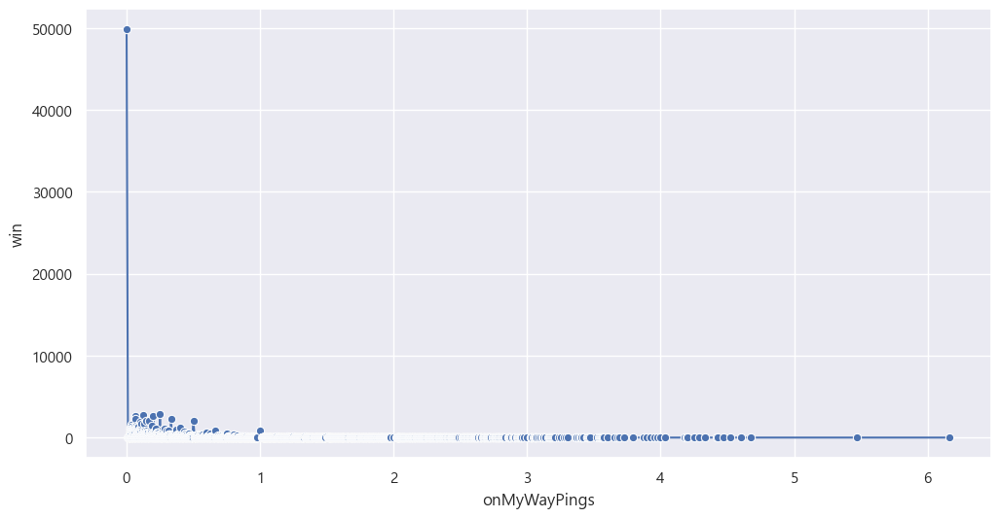

In [486]:
grouped=low_tier_ping.groupby('onMyWayPings')['win'].count().reset_index()
sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='onMyWayPings_group', ylabel='win'>

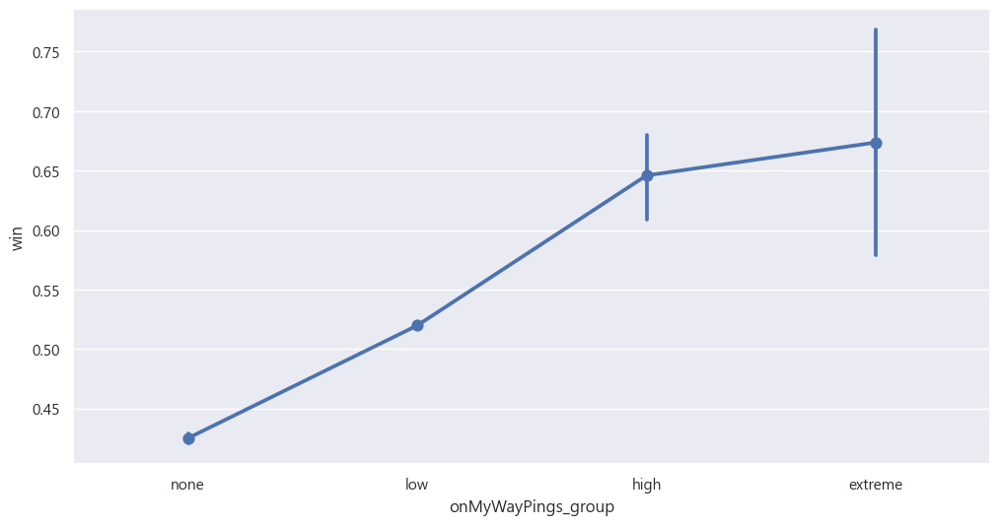

In [487]:
bins = [-1, 0, 2, 3, float('inf')]
labels = ['none', 'low', 'high', 'extreme']

low_tier_ping['onMyWayPings_group'] = pd.cut(low_tier_ping['onMyWayPings'], bins=bins, labels=labels)


sns.pointplot(x='onMyWayPings_group', y='win', data=low_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\779841892.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()


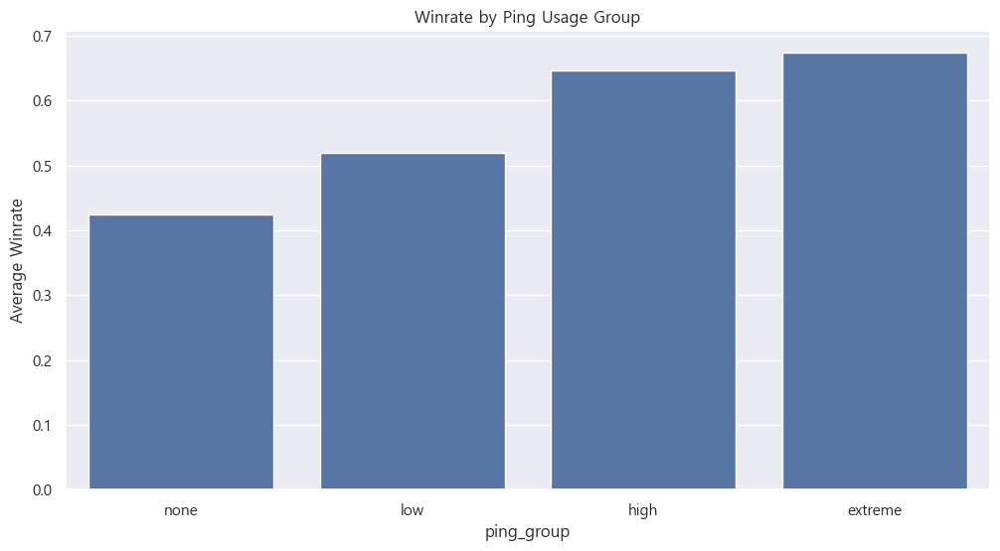

In [488]:
bins = [-1, 0, 2, 3, float('inf')]
labels = ['none', 'low', 'high', 'extreme']

low_tier_ping['ping_group'] = pd.cut(low_tier_ping['onMyWayPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='onMyWayPings_group', ylabel='count'>

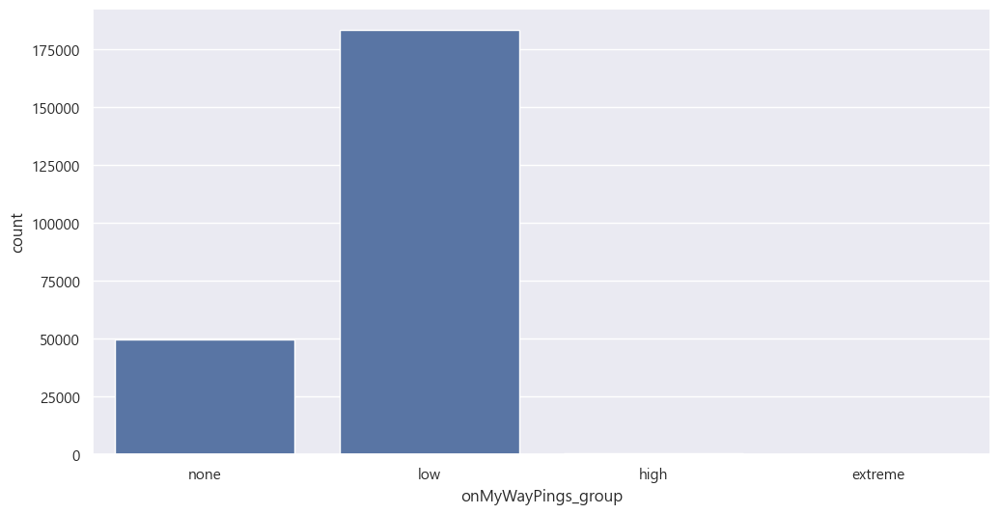

In [489]:
sns.countplot(x='onMyWayPings_group', data=low_tier_ping)

#### assistMePings

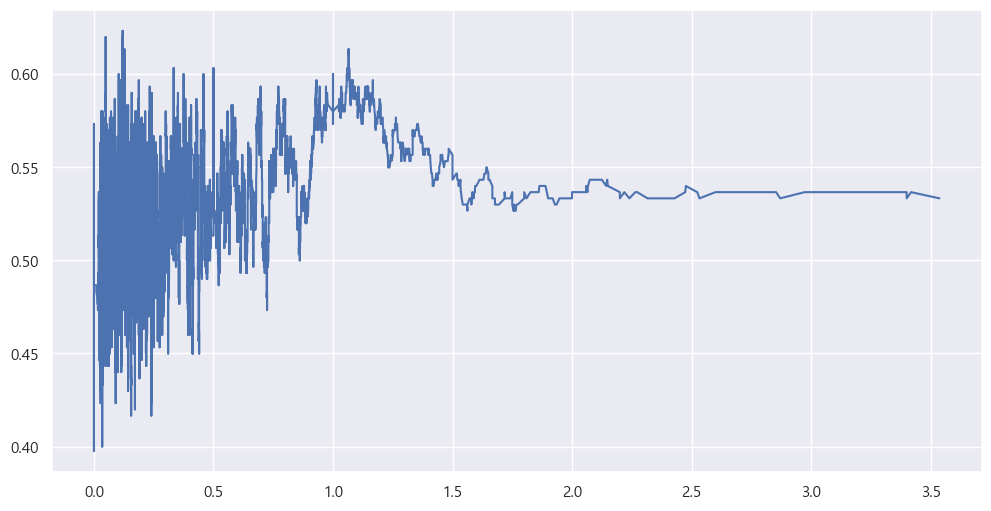

In [490]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('assistMePings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=300, min_periods=50).mean()
plt.plot(df_sorted['assistMePings'], df_sorted['rolling_win'])

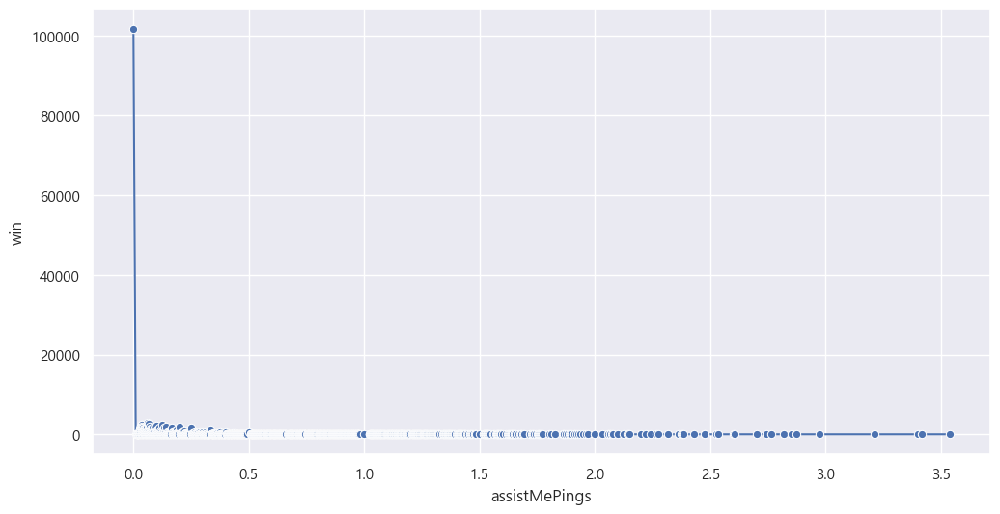

In [491]:
grouped=low_tier_ping.groupby('assistMePings')['win'].count().reset_index()
sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='assistMePings_group', ylabel='win'>

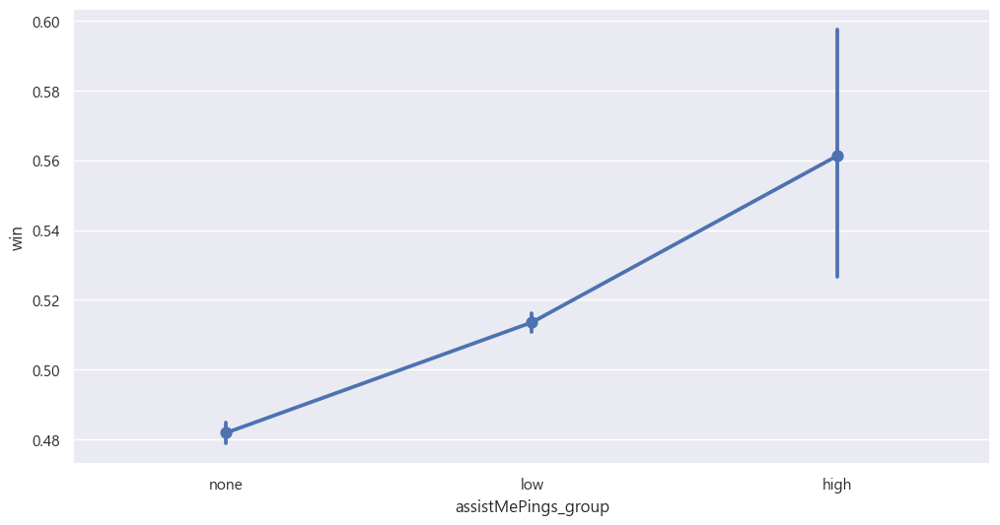

In [492]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'low', 'high']

low_tier_ping['assistMePings_group'] = pd.cut(low_tier_ping['assistMePings'], bins=bins, labels=labels)


sns.pointplot(x='assistMePings_group', y='win', data=low_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\80922200.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()


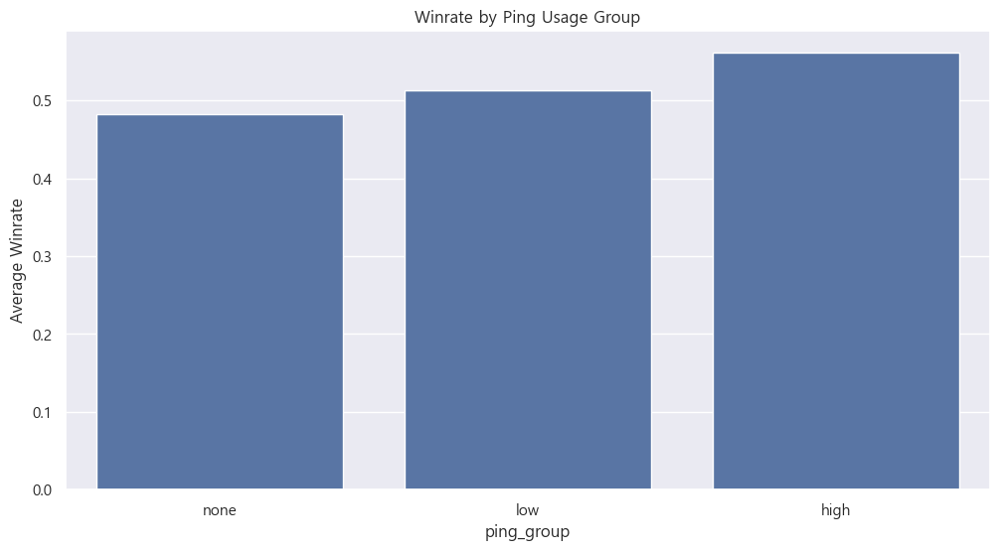

In [493]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'low', 'high']

low_tier_ping['ping_group'] = pd.cut(low_tier_ping['assistMePings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

In [494]:
low_tier_ping.groupby('assistMePings_group')['win'].count()

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\372393783.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  low_tier_ping.groupby('assistMePings_group')['win'].count()


assistMePings_group
none    101583
low     131677
high       750
Name: win, dtype: int64

<Axes: xlabel='assistMePings_group', ylabel='count'>

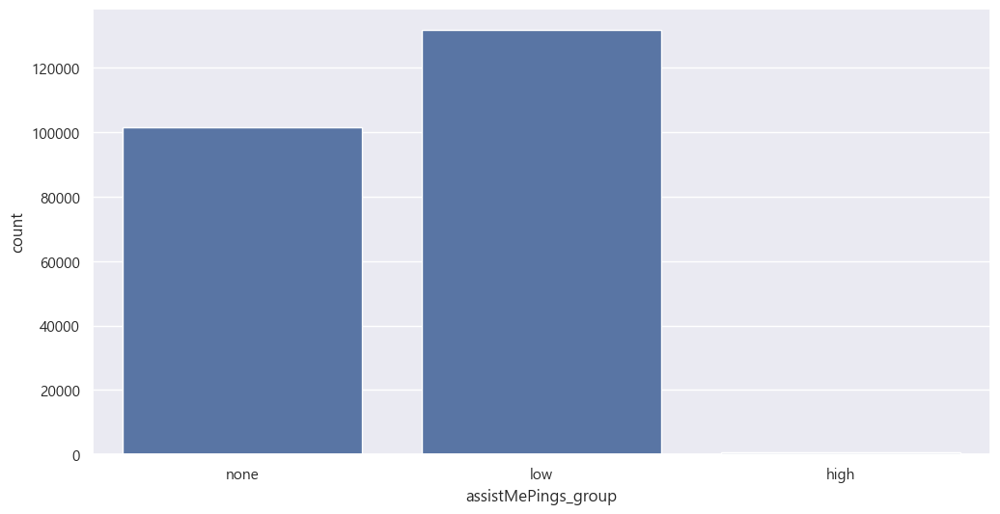

In [495]:
sns.countplot(x='assistMePings_group', data=low_tier_ping)

#### enemyMissingPings

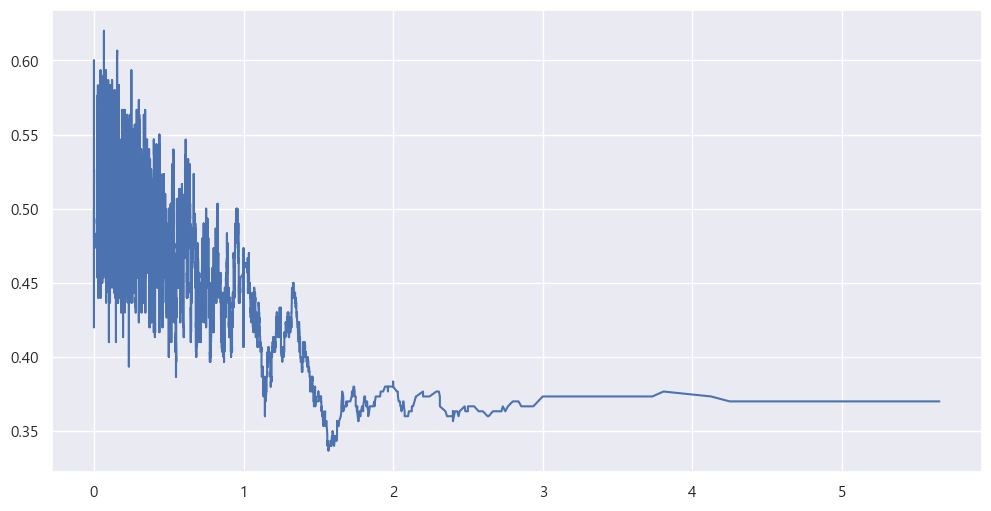

In [496]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('enemyMissingPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=300, min_periods=50).mean()
plt.plot(df_sorted['enemyMissingPings'], df_sorted['rolling_win'])

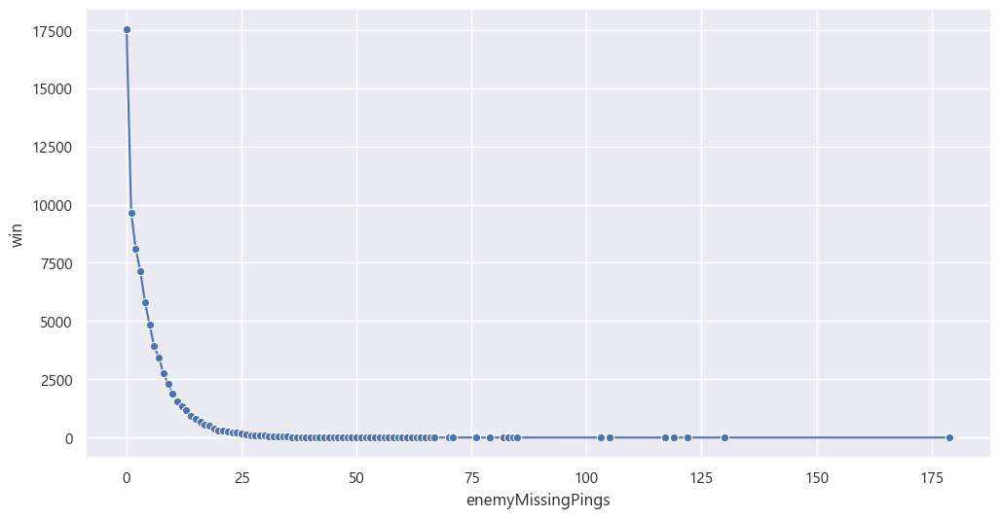

In [497]:
grouped=bronze_test_ping.groupby('enemyMissingPings')['win'].count().reset_index()
sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='win'>

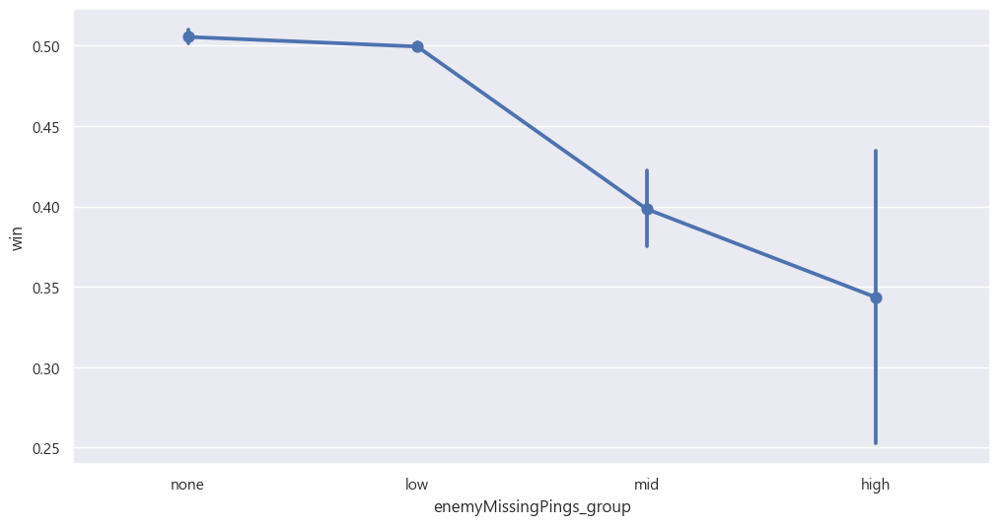

In [498]:
bins = [-1, 0, 1, 2, float('inf')]
labels = ['none', 'low', 'mid', 'high']

low_tier_ping['enemyMissingPings_group'] = pd.cut(low_tier_ping['enemyMissingPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyMissingPings_group', y='win', data=low_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\315052401.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()


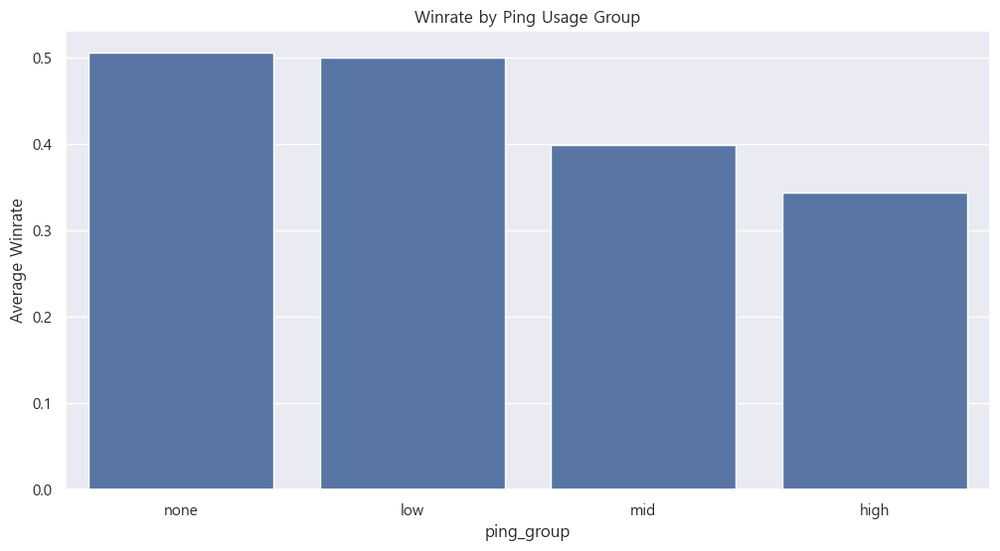

In [499]:
bins = [-1, 0, 1, 2, float('inf')]
labels = ['none', 'low', 'mid', 'high']

low_tier_ping['ping_group'] = pd.cut(low_tier_ping['enemyMissingPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='count'>

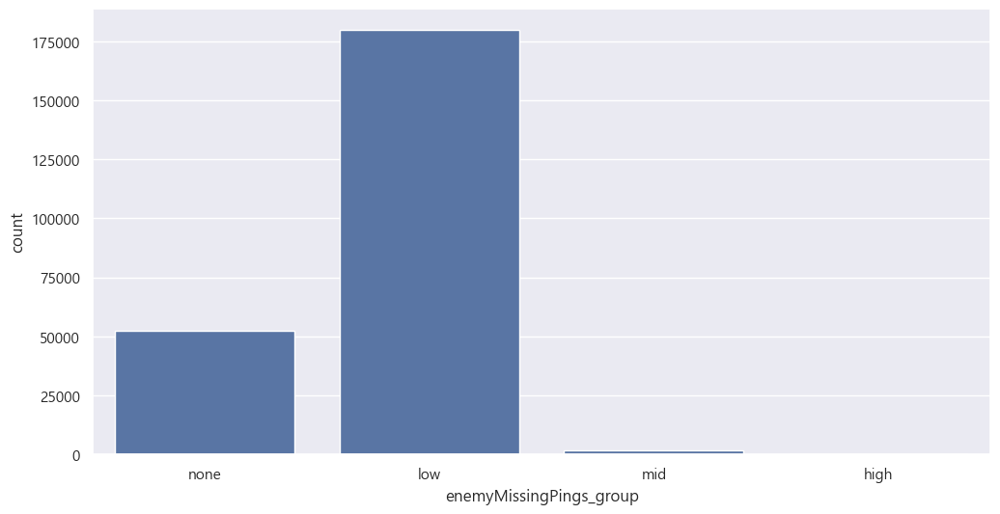

In [500]:
sns.countplot(x='enemyMissingPings_group', data=low_tier_ping)

#### enemyVisionPings

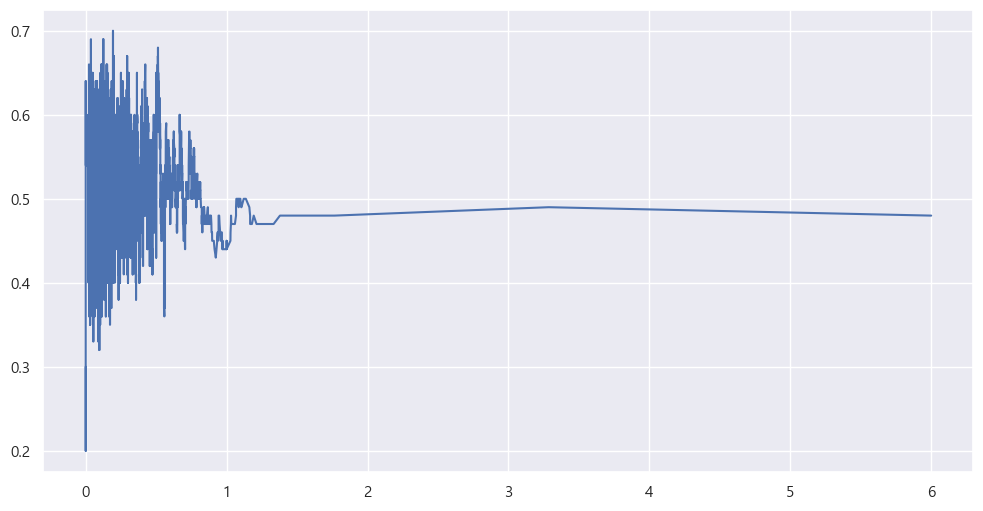

In [501]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('enemyVisionPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=100, min_periods=10).mean()
plt.plot(df_sorted['enemyVisionPings'], df_sorted['rolling_win'])

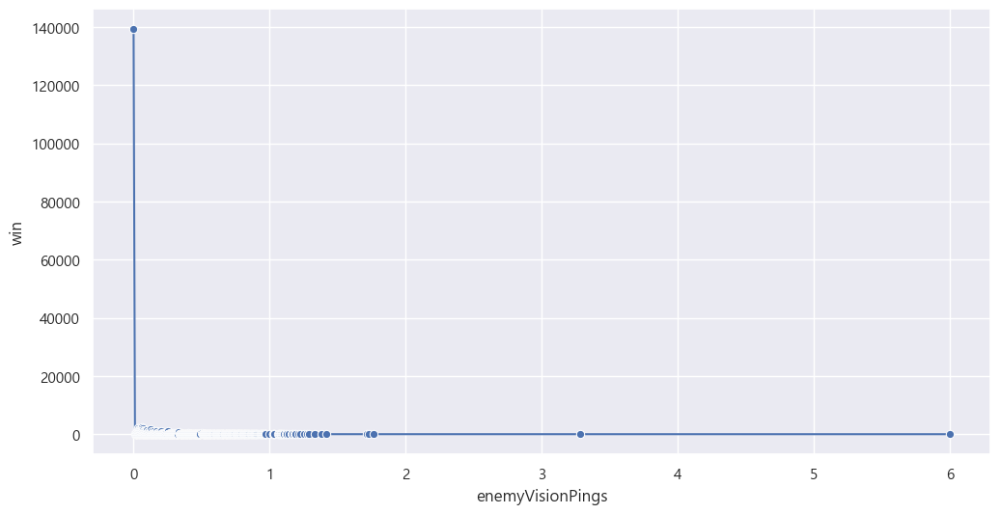

In [502]:
grouped=low_tier_ping.groupby('enemyVisionPings')['win'].count().reset_index()
sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='win'>

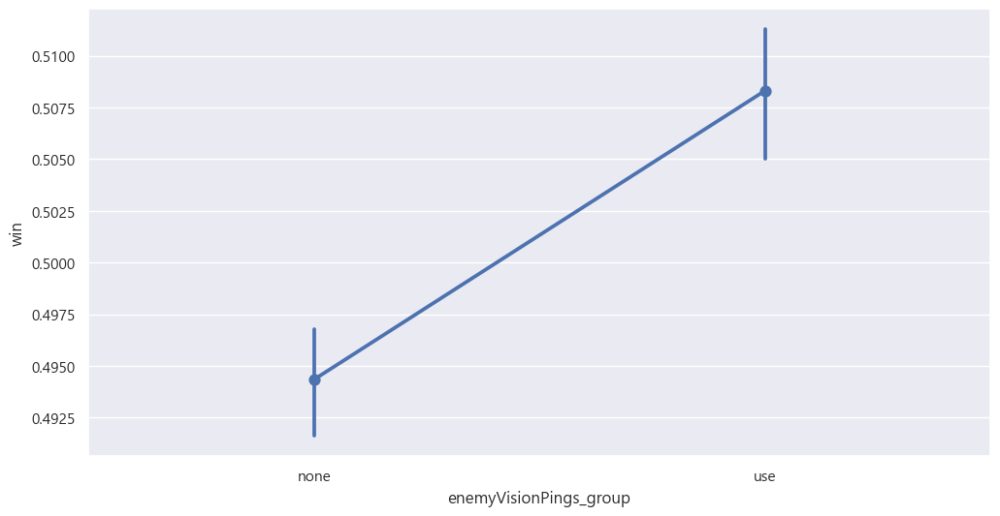

In [503]:
bins = [-1, 0, float('inf')]
labels = ['none', 'use']

low_tier_ping['enemyVisionPings_group'] = pd.cut(low_tier_ping['enemyVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyVisionPings_group', y='win', data=low_tier_ping)

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\1354425557.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()


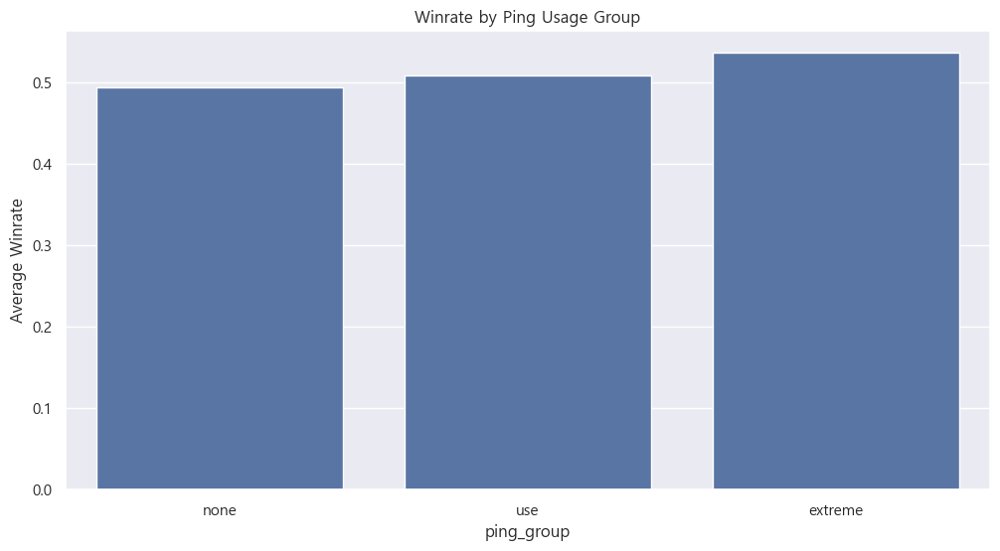

In [504]:
bins = [-1, 0, 1, float('inf')]
labels = ['none', 'use', 'extreme']

low_tier_ping['ping_group'] = pd.cut(low_tier_ping['enemyVisionPings'], bins=bins, labels=labels)

# 그룹별 평균 승률
winrate_by_group = low_tier_ping.groupby('ping_group')['win'].mean()

# 시각화
sns.barplot(x=winrate_by_group.index, y=winrate_by_group.values)
plt.ylabel("Average Winrate")
plt.title("Winrate by Ping Usage Group")
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='count'>

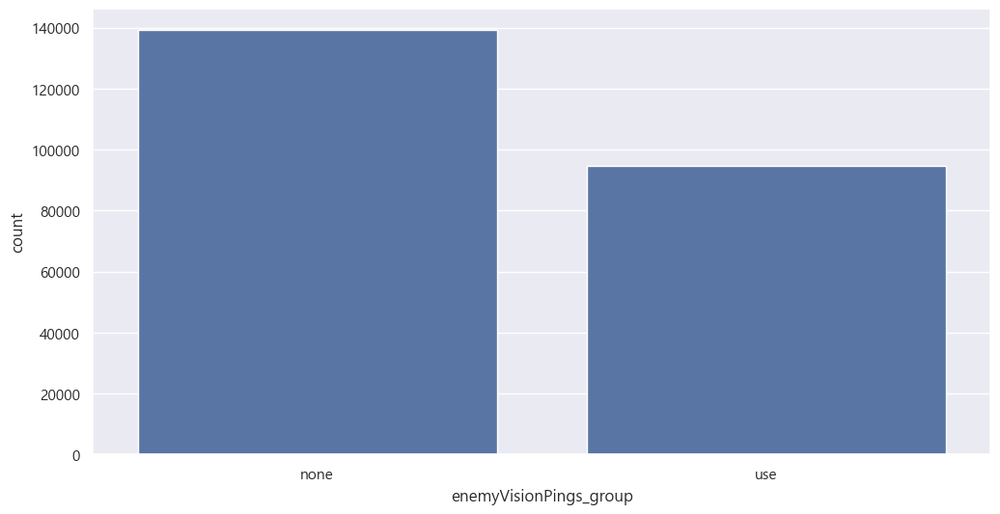

In [505]:
sns.countplot(x='enemyVisionPings_group', data=low_tier_ping)

#### needVisionPings(drop)

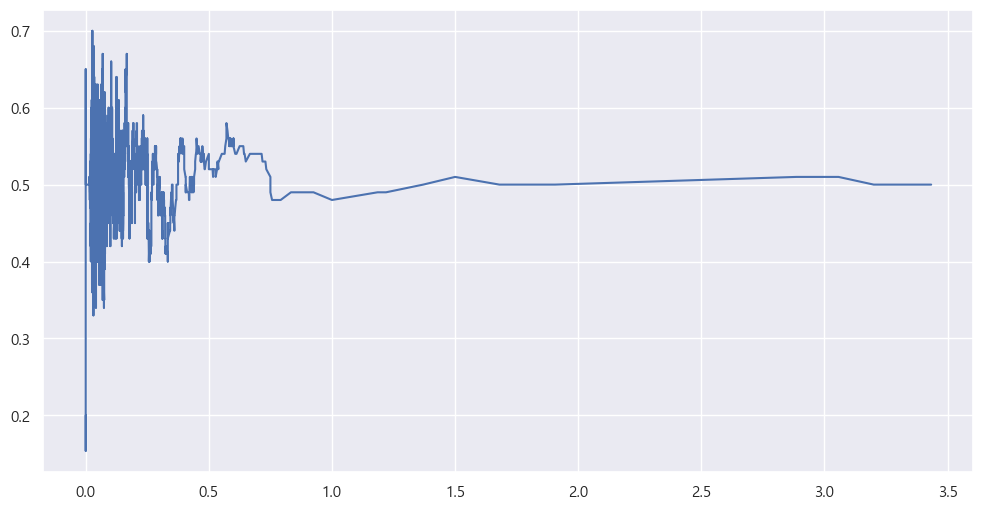

In [506]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('needVisionPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=100, min_periods=10).mean()
plt.plot(df_sorted['needVisionPings'], df_sorted['rolling_win'])

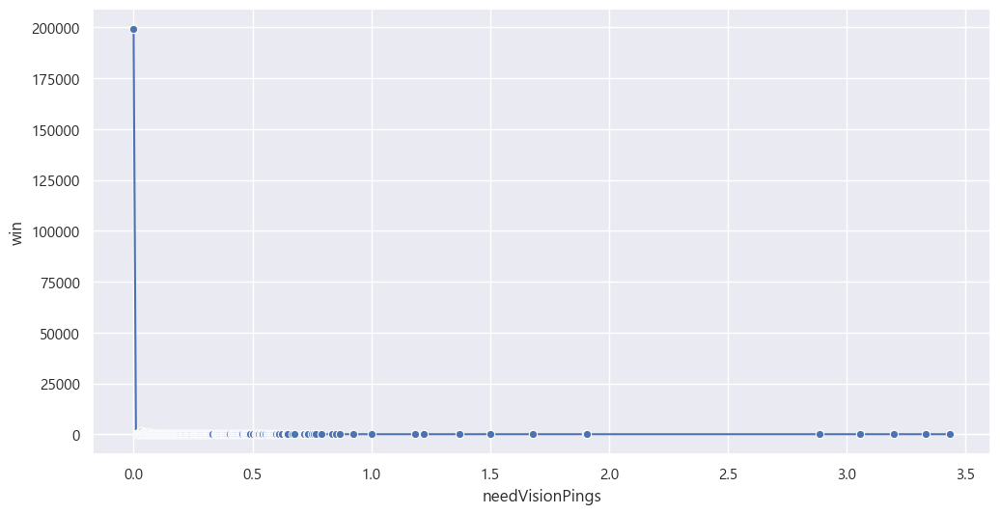

In [507]:
grouped=low_tier_ping.groupby('needVisionPings')['win'].count().reset_index()
sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='needVisionPings_group', ylabel='win'>

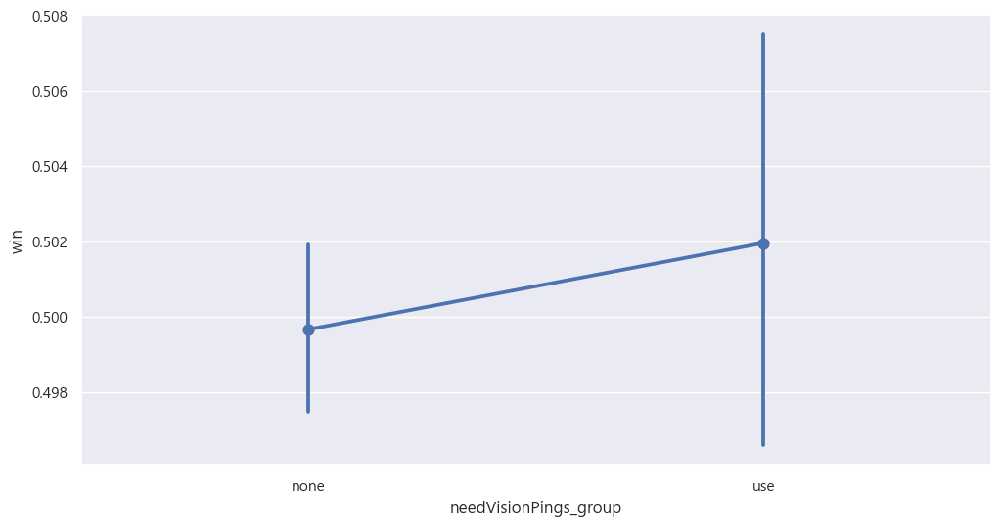

In [508]:
bins = [-1, 0, float('inf')]
labels = ['none', 'use']

low_tier_ping['needVisionPings_group'] = pd.cut(low_tier_ping['needVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='needVisionPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='needVisionPings_group', ylabel='count'>

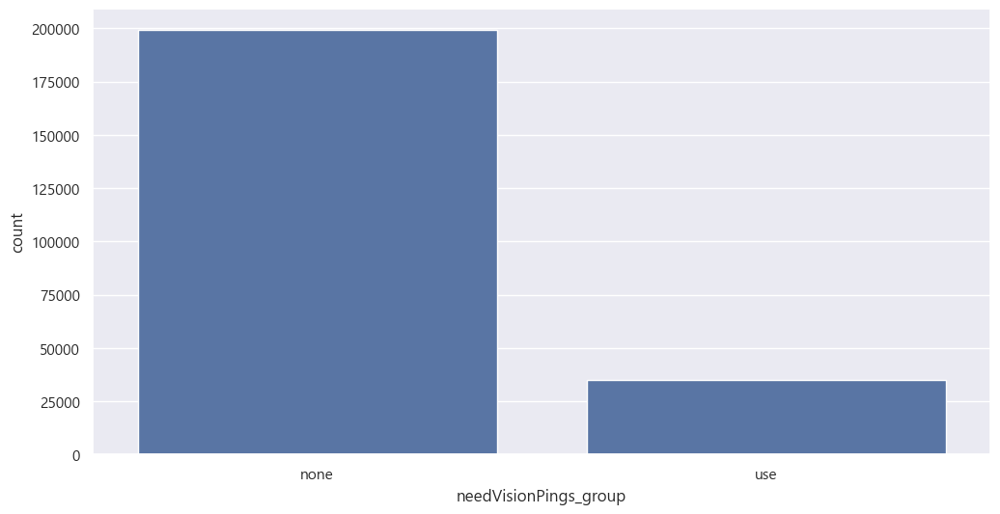

In [509]:
sns.countplot(x='needVisionPings_group', data=low_tier_ping)

#### allInPings(drop)

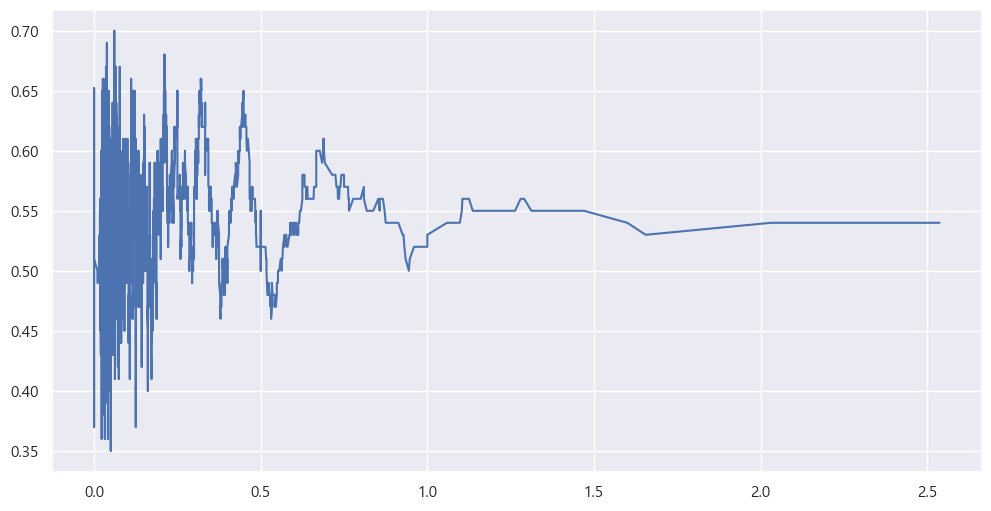

In [510]:
# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
df_sorted = low_tier_ping.sort_values('allInPings')
df_sorted['rolling_win'] = df_sorted['win'].rolling(window=100, min_periods=10).mean()
plt.plot(df_sorted['allInPings'], df_sorted['rolling_win'])

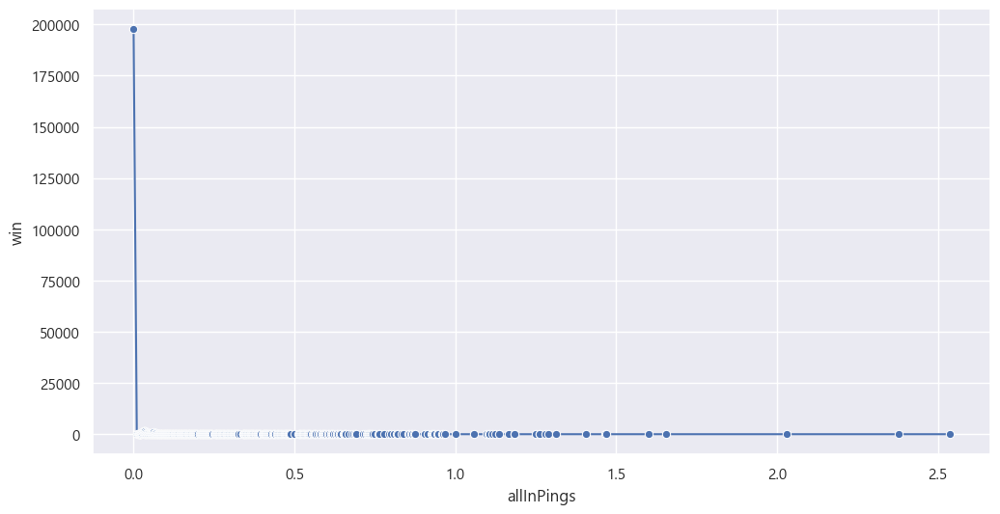

In [511]:
grouped=low_tier_ping.groupby('allInPings')['win'].count().reset_index()
sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='allInPings_group', ylabel='win'>

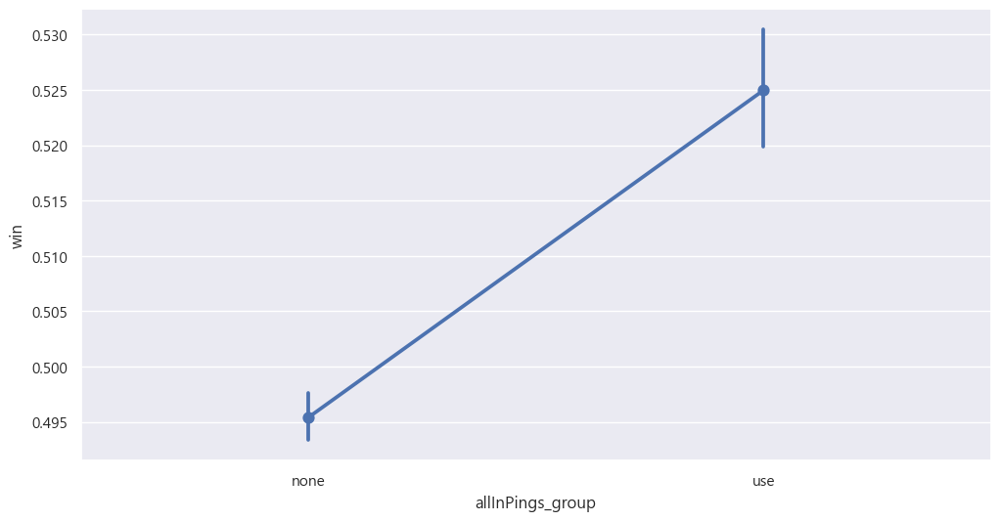

In [512]:
bins = [-1, 0, float('inf')]
labels = ['none', 'use']

low_tier_ping['allInPings_group'] = pd.cut(low_tier_ping['allInPings'], bins=bins, labels=labels)


sns.pointplot(x='allInPings_group', y='win', data=low_tier_ping)

<Axes: xlabel='allInPings_group', ylabel='count'>

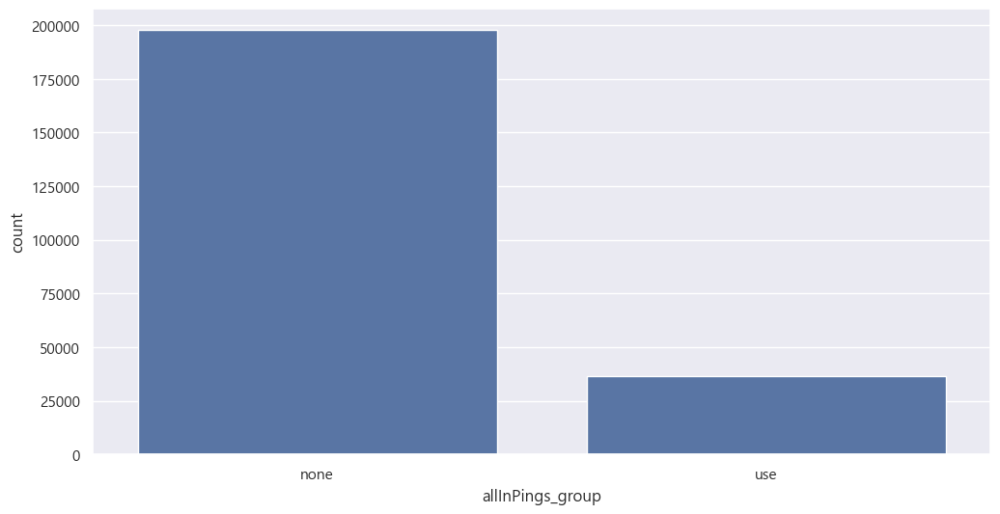

In [513]:
sns.countplot(x='allInPings_group', data=low_tier_ping)

### 다시 모델 돌릴 시간

In [514]:
col_list=['commandPings_group', 'getBackPings_group','onMyWayPings_group','assistMePings_group',
           'enemyMissingPings_group', 'enemyVisionPings_group'
         ]
low_tier_ping_log = pd.get_dummies(low_tier_ping, columns=col_list, drop_first=True)
low_tier_ping_ready=low_tier_ping_log.drop(['commandPings', 'getBackPings','onMyWayPings','allInPings','assistMePings',
                                      'needVisionPings','enemyMissingPings','enemyVisionPings','pings','ping_group',
                                      'needVisionPings_group','allInPings_group'],axis=1)

In [515]:
change=low_tier_ping_ready.columns.to_list()
for col in change:
    low_tier_ping_ready[col] = low_tier_ping_ready[col].astype(int)

In [516]:
low_tier_ping_ready.describe()

,win,commandPings_group_low,commandPings_group_mid,commandPings_group_high,commandPings_group_extreme,getBackPings_group_low,getBackPings_group_mid,getBackPings_group_high,getBackPings_group_extreme,onMyWayPings_group_low,onMyWayPings_group_high,onMyWayPings_group_extreme,assistMePings_group_low,assistMePings_group_high,enemyMissingPings_group_low,enemyMissingPings_group_mid,enemyMissingPings_group_high,enemyVisionPings_group_use
count,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000,234010.000000
mean,0.500000,0.728712,0.014418,0.000650,0.000111,0.524546,0.003504,0.000145,0.000017,0.783843,0.002752,0.000406,0.562698,0.003205,0.768087,0.006812,0.000423,0.405145
std,0.500001,0.444625,0.119207,0.025478,0.010540,0.499398,0.059092,0.012053,0.004134,0.411624,0.052388,0.020145,0.496054,0.056522,0.422055,0.082251,0.020564,0.490921
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.500000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [517]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = low_tier_ping_ready.drop(['win'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [518]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
0,const,8.637867
9,onMyWayPings_group_low,1.219371
12,assistMePings_group_low,1.193313
14,enemyMissingPings_group_low,1.129758
1,commandPings_group_low,1.124560
5,getBackPings_group_low,1.069290
2,commandPings_group_mid,1.068431
17,enemyVisionPings_group_use,1.047968
15,enemyMissingPings_group_mid,1.040317
13,assistMePings_group_high,1.034772


In [519]:
import statsmodels.api as sm

# 1. X, y 분리
X = low_tier_ping_ready.drop(['win'],axis=1)
y = low_tier_ping_ready['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.690040
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:               234010
Model:                          Logit   Df Residuals:                   233993
Method:                           MLE   Df Model:                           16
Date:                Wed, 30 Jul 2025   Pseudo R-squ.:                0.004482
Time:                        16:47:08   Log-Likelihood:            -1.6148e+05
converged:                       True   LL-Null:                   -1.6220e+05
Covariance Type:            nonrobust   LLR p-value:                3.779e-300
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
commandPings_group_low           0.0788      0.009      8.607      0.000

# Bronze

In [3]:
bronze_ping=pd.read_csv("BRONZE_ping.csv")

In [4]:
bronze_ping
bronze_game=bronze_ping[~bronze_ping['is_replay']] #다시하기 게임들은 날려주고
bronze_ping=bronze_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

## EDA

### win

In [19]:
bronze_ping['win'].value_counts()

win
False    39995
True     39995
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

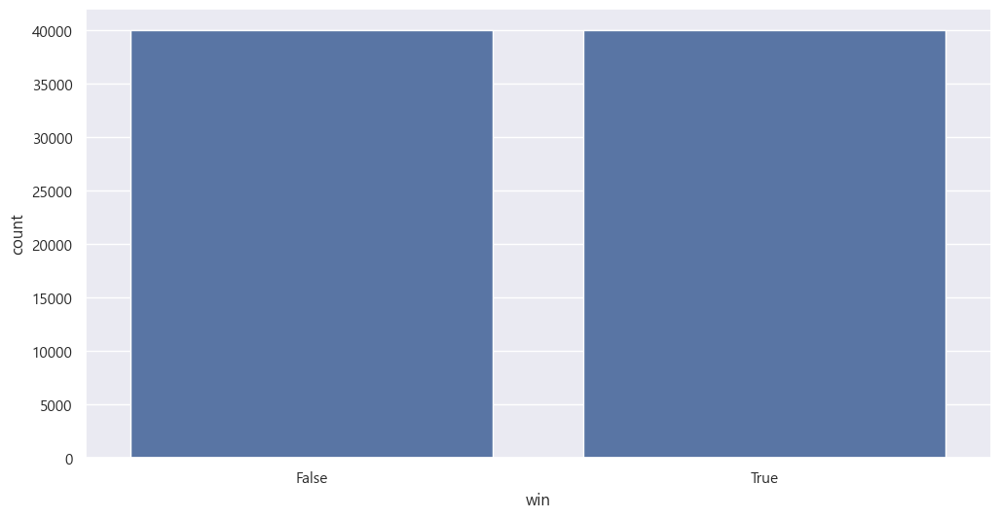

In [20]:
sns.countplot(x=bronze_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [22]:
bronze_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    46470
True     33520
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

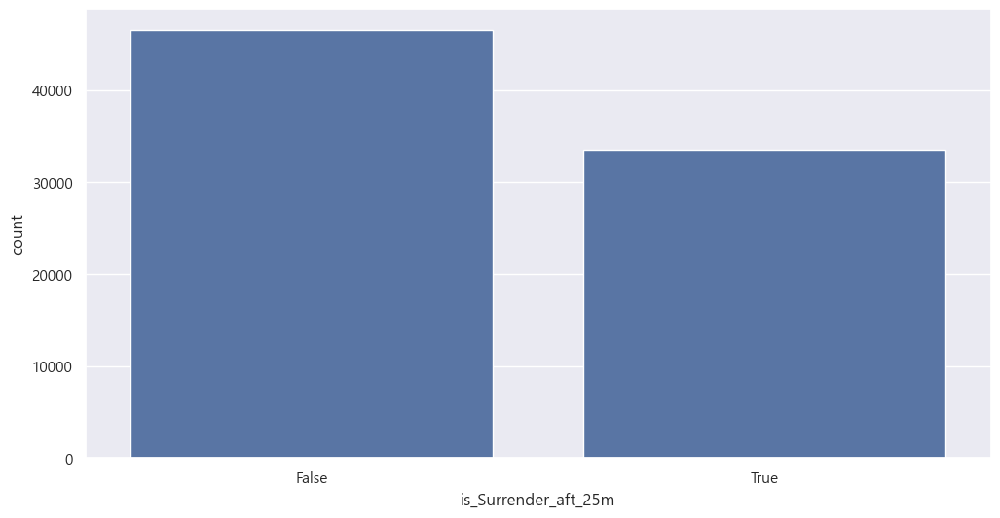

In [23]:
sns.countplot(x=bronze_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [24]:
bronze_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    78160
True      1830
Name: count, dtype: int64

### 일반 핑

In [25]:
bronze_ping['commandPings'].value_counts()

commandPings
0      22792
1       8806
2       7036
3       5949
4       4913
       ...  
80         1
85         1
90         1
102        1
82         1
Name: count, Length: 103, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

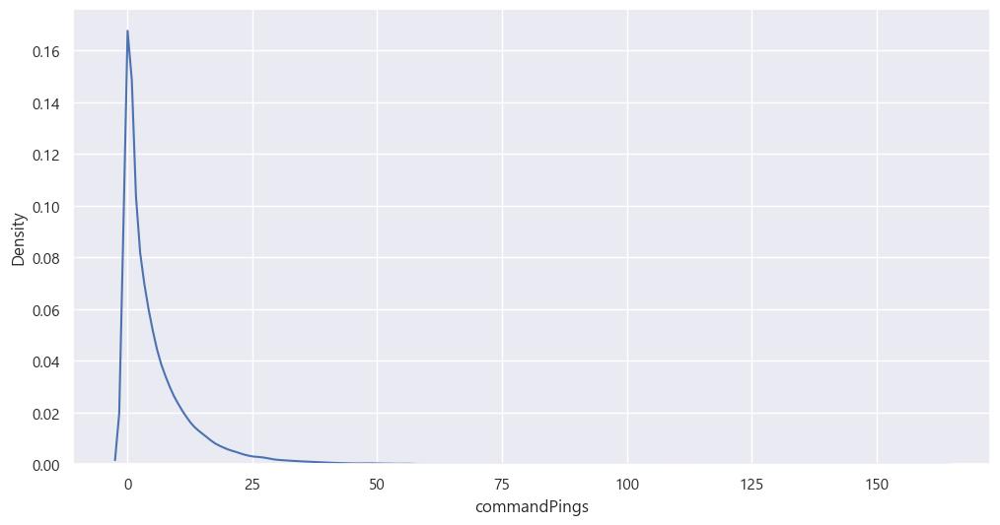

In [26]:
sns.kdeplot(x=bronze_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

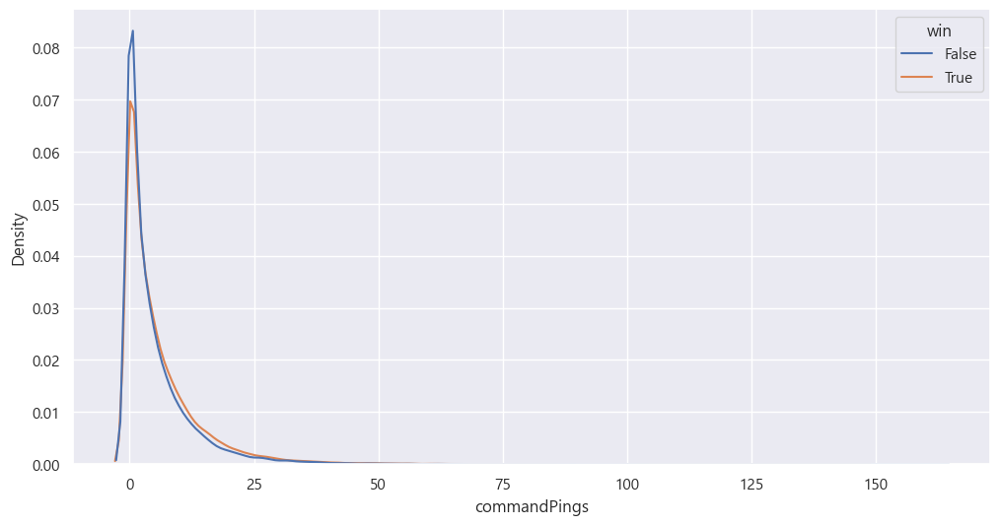

In [27]:
sns.kdeplot(x=bronze_ping['commandPings'],hue=bronze_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [28]:
bronze_ping['getBackPings'].value_counts()

getBackPings
0      39512
1       9656
2       6140
3       4610
4       3574
       ...  
64         1
109        1
82         1
78         1
62         1
Name: count, Length: 79, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

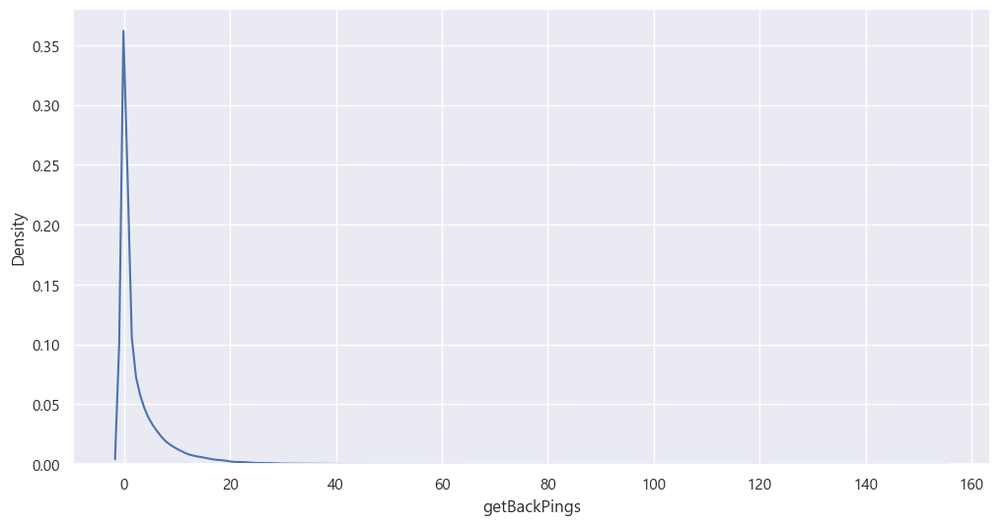

In [29]:
sns.kdeplot(x=bronze_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

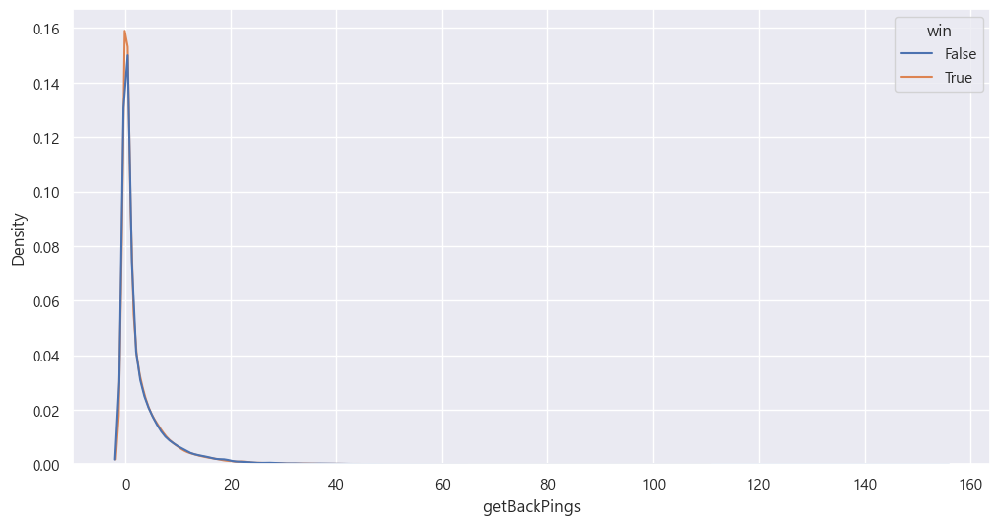

In [30]:
sns.kdeplot(x=bronze_ping['getBackPings'],hue=bronze_ping['win'])

### 압박핑 -> 정작 브론즈급에선 사용된 적이 없음

In [31]:
bronze_ping['holdPings'].value_counts()

holdPings
0    79990
Name: count, dtype: int64

### 가는중 핑

In [32]:
bronze_ping['onMyWayPings'].value_counts()

onMyWayPings
0      19007
1       8632
2       6774
3       5609
4       4591
       ...  
126        1
183        1
147        1
105        1
130        1
Name: count, Length: 118, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

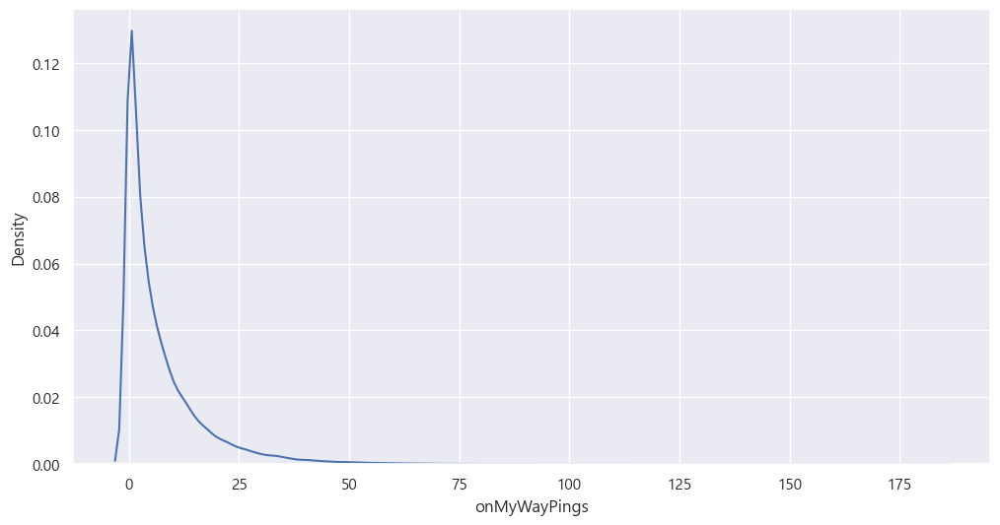

In [33]:
sns.kdeplot(x=bronze_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

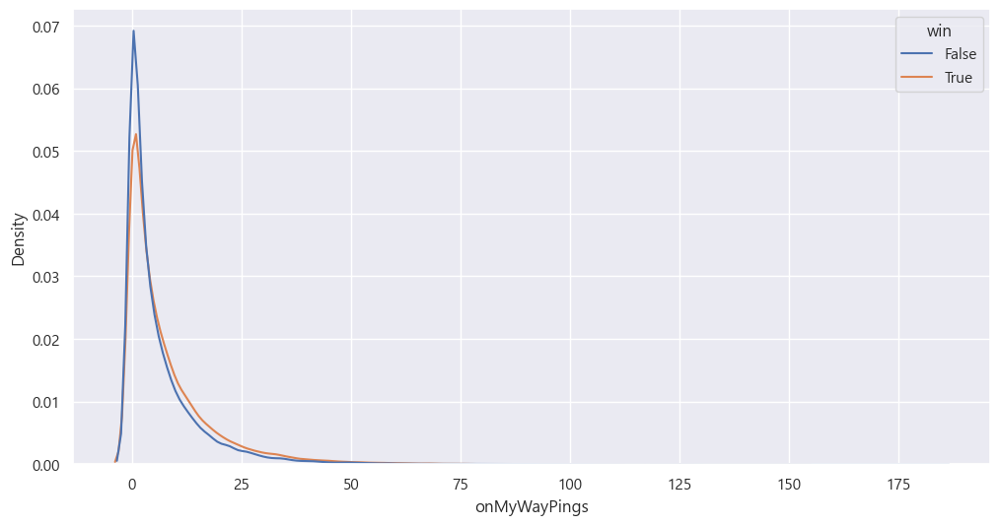

In [34]:
sns.kdeplot(x=bronze_ping['onMyWayPings'],hue=bronze_ping['win'])

### 총공격핑

In [35]:
bronze_ping['allInPings'].value_counts()

allInPings
0      67965
1       7635
2       2268
3        881
4        424
5        250
6        150
7         99
8         68
9         52
11        31
10        30
13        20
12        19
18        14
14        13
15        13
17        12
19         8
16         8
21         4
20         3
25         3
29         3
40         2
22         2
34         1
23         1
65         1
33         1
28         1
50         1
30         1
69         1
137        1
27         1
48         1
43         1
59         1
Name: count, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

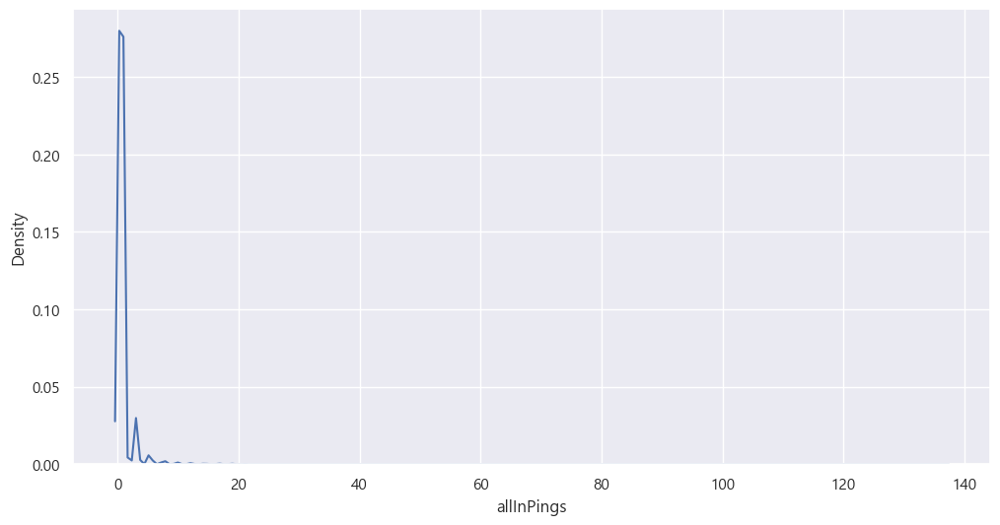

In [36]:
sns.kdeplot(x=bronze_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

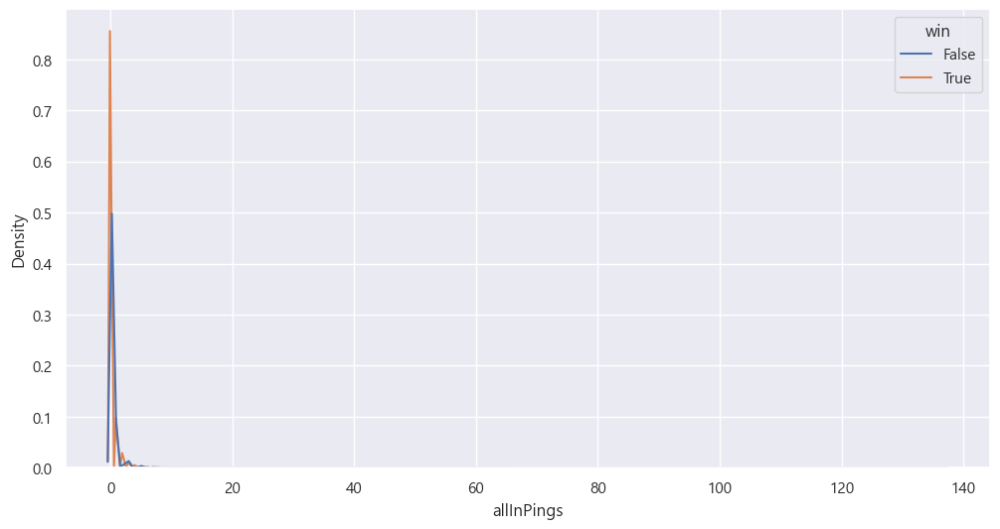

In [37]:
sns.kdeplot(x=bronze_ping['allInPings'],hue=bronze_ping['win'])

### 지원핑

In [38]:
bronze_ping['assistMePings'].value_counts()

assistMePings
0     35851
1     11118
2      7471
3      5310
4      3860
      ...  
80        1
63        1
62        1
85        1
70        1
Name: count, Length: 81, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

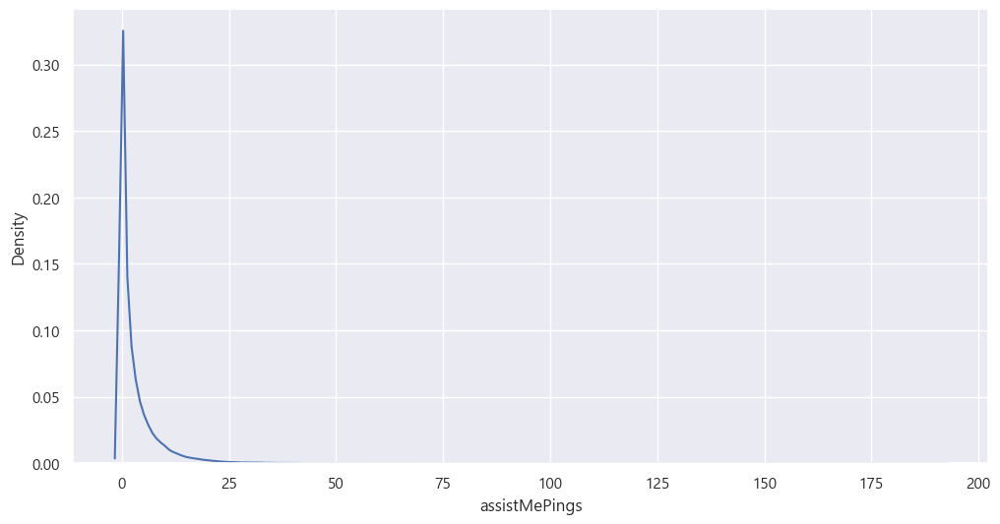

In [39]:
sns.kdeplot(x=bronze_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

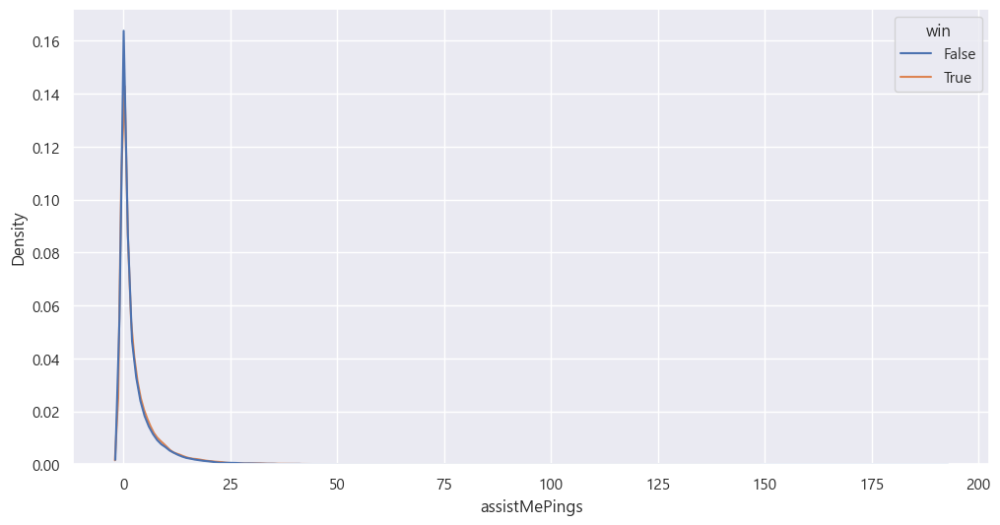

In [40]:
sns.kdeplot(x=bronze_ping['assistMePings'],hue=bronze_ping['win'])

### 시야 필요함 핑

In [41]:
bronze_ping['needVisionPings'].value_counts()

needVisionPings
0     68002
1      7875
2      2175
3       857
4       405
5       246
6       143
7        81
8        58
9        48
10       32
11       18
12       15
14        8
13        6
15        6
22        2
26        2
20        2
19        2
24        1
23        1
27        1
39        1
17        1
42        1
37        1
Name: count, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='count'>

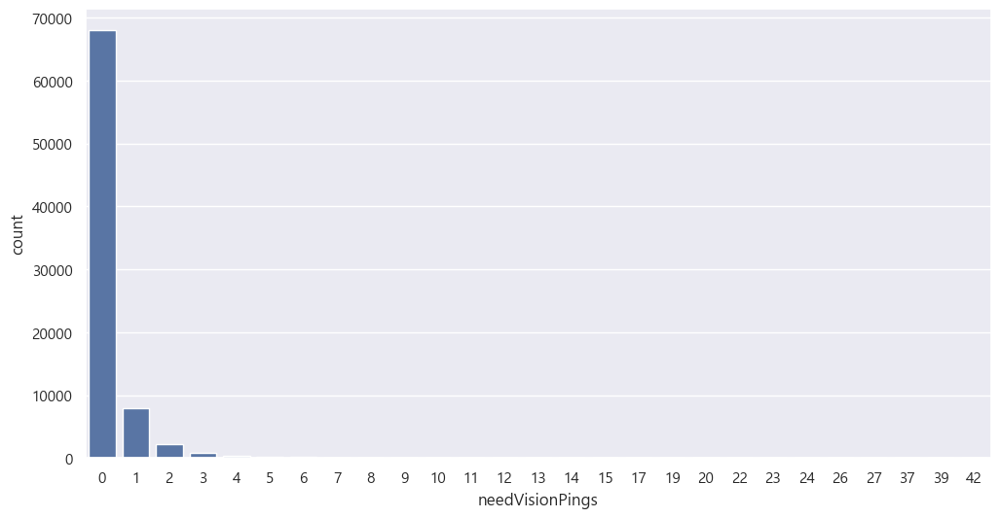

In [42]:
sns.countplot(x=bronze_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='count'>

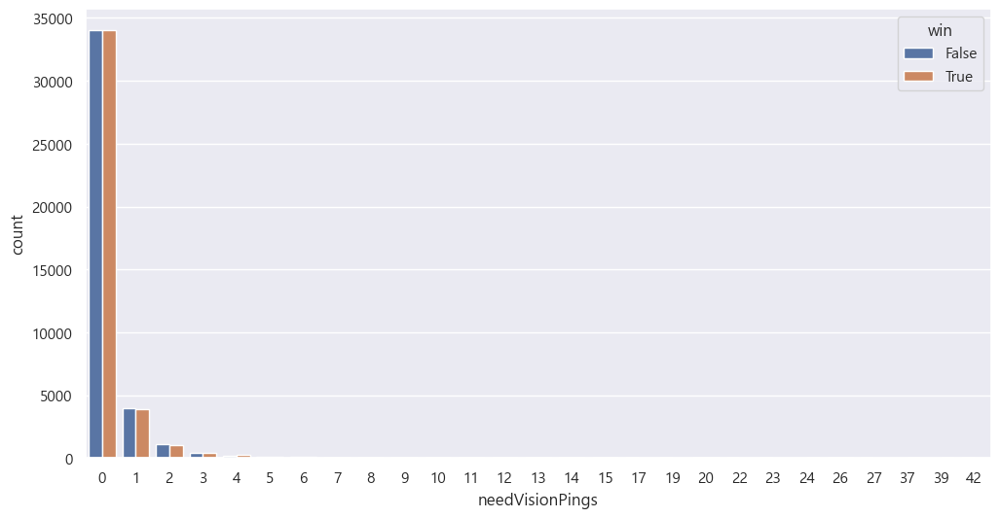

In [43]:
sns.countplot(x=bronze_ping['needVisionPings'],hue=bronze_ping['win'])

### 미아핑

In [44]:
bronze_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0      19129
1       9893
2       8162
3       7170
4       5834
       ...  
119        1
64         1
62         1
67         1
105        1
Name: count, Length: 83, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

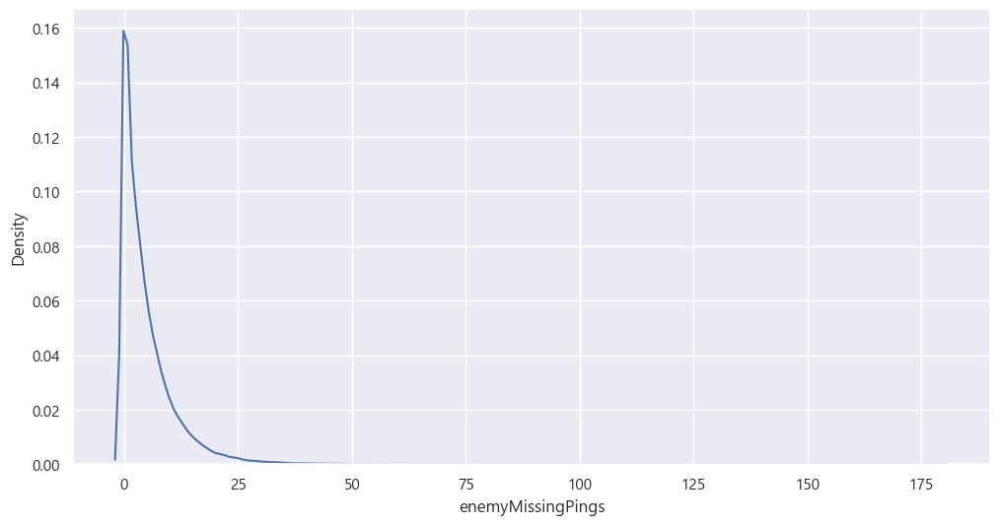

In [45]:
sns.kdeplot(x=bronze_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

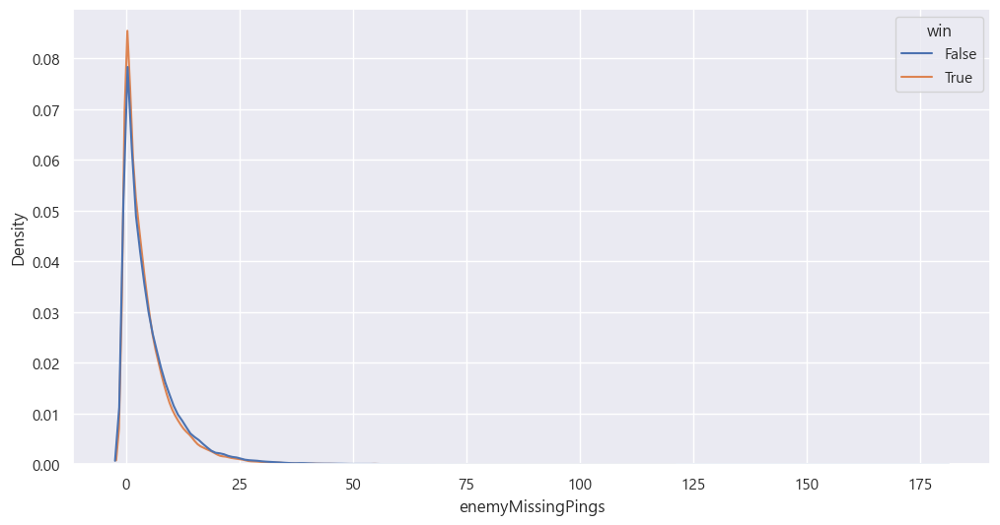

In [46]:
sns.kdeplot(x=bronze_ping['enemyMissingPings'],hue = bronze_ping['win'])

### 적 와드 / 시야핑

In [47]:
bronze_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0     48820
1     10903
2      5896
3      3863
4      2633
5      1918
6      1433
7      1059
8       765
9       570
10      460
11      366
12      281
13      226
14      161
15      147
16       84
17       77
19       59
18       56
20       38
22       38
21       30
23       19
24       15
25       15
26       11
28        8
31        6
27        5
30        4
29        4
34        3
33        3
32        2
35        2
36        2
38        2
42        1
44        1
40        1
60        1
64        1
43        1
Name: count, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

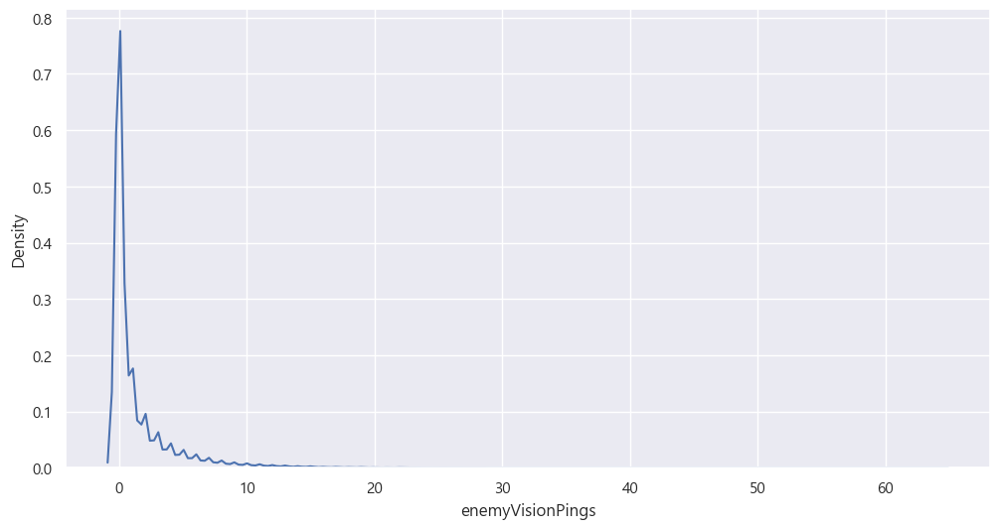

In [48]:
sns.kdeplot(x=bronze_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

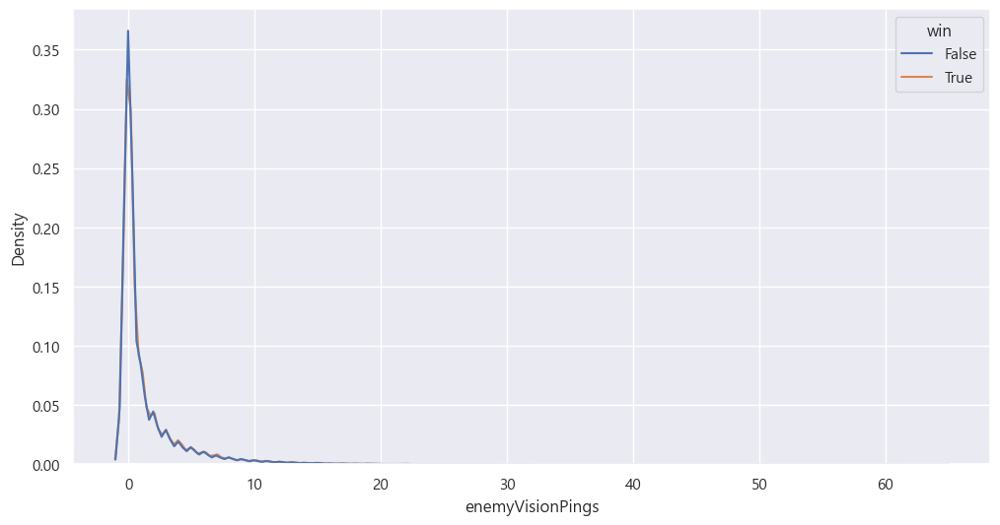

In [49]:
sns.kdeplot(x=bronze_ping['enemyVisionPings'],hue=bronze_ping['win'])

In [52]:
temp=bronze_ping['win'].to_list()

In [53]:
temp_list=[]
for i in temp:
    temp_list.append(int(i))

In [55]:
bronze_ping['win'] = temp_list

In [56]:
bronze_ping

,matchId,blue/red,gameDuration,puuid,win,is_Surrender_aft_25m,is_Early_Surrender,is_replay,teamPosition,championName,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,7618817362,True,925,jHeIXe4UpJNcl5Dfllrmt-wVkCWrtZ6XgMI00mgF9852Nv...,0,True,False,False,TOP,Darius,0,1,0,0,0,0,0,2,0
1,7618817362,True,925,Im-lIPMsoRMcMxQFiNKOu5vGOCvKb2DTnY2MyYyPWV6Unk...,0,True,False,False,JUNGLE,LeeSin,0,0,0,5,0,0,0,5,0
2,7618817362,True,925,_cK_NjIUpZ-GccS8lD6BBrKJ95g00PQVY0cpI2i5FgfhCz...,0,True,False,False,MIDDLE,Yasuo,0,4,0,0,0,2,0,0,0
3,7618817362,True,925,wFgUZlpB2u78EF-kz47oAxCaQ6ZmqlcyviahAMBHuhsE60...,0,True,False,False,BOTTOM,Ezreal,0,0,0,6,0,1,0,11,0
4,7618817362,True,925,hpYU3HbsNwuGSt8qkwSCIIf93Gt1WxNiwhpL3tG83WqFO6...,0,True,False,False,UTILITY,Ashe,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,7657239587,False,1974,btfqjPTRS1Vt5EQp6Y2ZxUmwjDm9X8j8_xQMvytT4HIAhZ...,1,False,False,False,TOP,Gnar,2,4,0,3,0,0,0,5,0
19996,7657239587,False,1974,YZy7I1PRqzPffWuArYLfcevA-QF0zLcNdhj9fXjRfmGcnv...,1,False,False,False,JUNGLE,Shyvana,22,0,0,0,0,0,0,0,0
19997,7657239587,False,1974,hildbXJ-W-0caTYbk_52DBWP7JvoMD-O6khjQ7Y38uTdCx...,1,False,False,False,MIDDLE,Katarina,0,1,0,2,0,0,0,3,0
19998,7657239587,False,1974,Pn7cwTwYggch-H6Sa0iypoDPpT1p4L8SG8L4kHWFb_p4jQ...,1,False,False,False,BOTTOM,Lucian,7,3,0,18,1,2,0,1,5


## 핑과 승패사이의 상관관계를 봐봅시다.

In [5]:
bronze_ping['pings'] = bronze_ping['commandPings'] + bronze_ping['getBackPings'] + bronze_ping['holdPings'] + bronze_ping['onMyWayPings'] + bronze_ping['allInPings'] + bronze_ping['assistMePings'] + bronze_ping['needVisionPings'] + bronze_ping['enemyMissingPings'] + bronze_ping['enemyVisionPings']

C:\Users\sherm\AppData\Local\Temp\ipykernel_18296\2131126995.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bronze_ping['pings'] = bronze_ping['commandPings'] + bronze_ping['getBackPings'] + bronze_ping['holdPings'] + bronze_ping['onMyWayPings'] + bronze_ping['allInPings'] + bronze_ping['assistMePings'] + bronze_ping['needVisionPings'] + bronze_ping['enemyMissingPings'] + bronze_ping['enemyVisionPings']


In [6]:
bronze_test_ping=bronze_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

In [64]:
bronze_test_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,0,0,1,0,0,0,0,2,0,3
1,0,0,0,5,0,0,0,5,0,10
2,0,0,4,0,0,2,0,0,0,6
3,0,0,0,6,0,1,0,11,0,18
4,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
19995,1,2,4,3,0,0,0,5,0,14
19996,1,22,0,0,0,0,0,0,0,22
19997,1,0,1,2,0,0,0,3,0,6
19998,1,7,3,18,1,2,0,1,5,37


In [65]:
corr_ping=bronze_test_ping.corr()
corr_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
win,1.000000,0.059542,-0.007295,0.084009,0.011893,0.025097,0.001315,-0.038383,0.013572,0.048355
commandPings,0.059542,1.000000,0.276719,0.389788,0.165407,0.337060,0.163373,0.243867,0.102548,0.682879
getBackPings,-0.007295,0.276719,1.000000,0.326117,0.130016,0.320445,0.171815,0.243207,0.115735,0.581254
onMyWayPings,0.084009,0.389788,0.326117,1.000000,0.241618,0.480925,0.198632,0.272170,0.130202,0.791486
allInPings,0.011893,0.165407,0.130016,0.241618,1.000000,0.275128,0.146131,0.106923,0.035588,0.320617
assistMePings,0.025097,0.337060,0.320445,0.480925,0.275128,1.000000,0.270480,0.283731,0.108982,0.680834
needVisionPings,0.001315,0.163373,0.171815,0.198632,0.146131,0.270480,1.000000,0.185594,0.070736,0.321882
enemyMissingPings,-0.038383,0.243867,0.243207,0.272170,0.106923,0.283731,0.185594,1.000000,0.200625,0.579327
enemyVisionPings,0.013572,0.102548,0.115735,0.130202,0.035588,0.108982,0.070736,0.200625,1.000000,0.299205
pings,0.048355,0.682879,0.581254,0.791486,0.320617,0.680834,0.321882,0.579327,0.299205,1.000000


<Axes: >

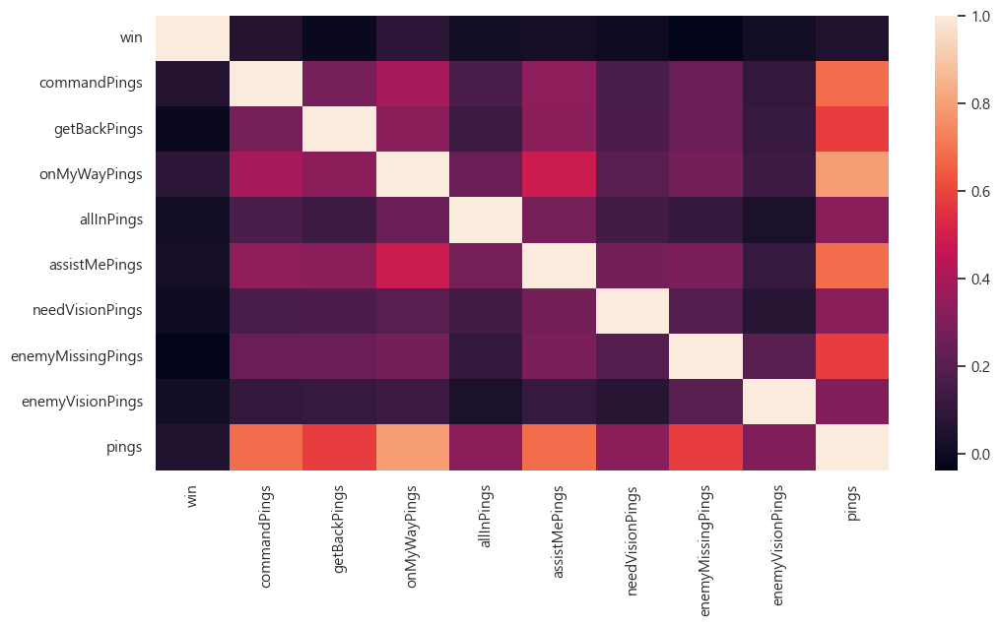

In [66]:
sns.heatmap(corr_ping)

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [67]:
from scipy.stats import levene

stat, p = levene(bronze_test_ping['pings'], bronze_test_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 50470.335, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [68]:
win_pings=bronze_test_ping[bronze_test_ping['win'] == 1]['pings']
lose_pings=bronze_test_ping[~(bronze_test_ping['win'] == 1)]['pings']

In [69]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,13.519618,77850.968748,two-sided,1.334969e-41,"[2.1, 2.82]",0.096822,3.497e+37,NaN


In [70]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(bronze_test_ping[ping], bronze_test_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    if p <= 0.05: correction_ = True
    else: correction_ = False
    win_pings=bronze_test_ping[bronze_test_ping['win'] == 1][ping]
    lose_pings=bronze_test_ping[~(bronze_test_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 31644.028, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,16.657573,77514.315306,two-sided,3.421848e-62,"[0.83, 1.06]",0.119295,1.102e+58,1.0



getBackPings
Levene’s test: stat = 17960.642, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-2.037371,77689.295063,two-sided,0.041616,"[-0.15, -0.0]",0.014591,0.064,0.530872



onMyWayPings
Levene’s test: stat = 33631.257, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,23.543746,76962.01648,two-sided,3.942599e-122,"[1.56, 1.84]",0.168611,6.695e+117,1.0



allInPings
Levene’s test: stat = 1739.443, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.321619,77063.457888,two-sided,0.000895,"[0.01, 0.05]",0.023788,2.008,0.91334



assistMePings
Levene’s test: stat = 17137.883, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.010856,77813.482993,two-sided,2.387840e-12,"[0.19, 0.34]",0.050209,3.761e+08,1.0



needVisionPings
Levene’s test: stat = 4504.590, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,0.367271,77978.744989,two-sided,0.713418,"[-0.01, 0.02]",0.00263,0.009,0.065591



enemyMissingPings
Levene’s test: stat = 34827.164, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-10.72676,77098.872633,two-sided,7.962152e-27,"[-0.58, -0.4]",0.076821,7.413e+22,NaN



enemyVisionPings
Levene’s test: stat = 7937.093, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.790377,77874.911163,two-sided,0.000151,"[0.04, 0.12]",0.027145,10.625,0.966402


In [71]:
bronze_test_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,0,0,1,0,0,0,0,2,0,3
1,0,0,0,5,0,0,0,5,0,10
2,0,0,4,0,0,2,0,0,0,6
3,0,0,0,6,0,1,0,11,0,18
4,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
19995,1,2,4,3,0,0,0,5,0,14
19996,1,22,0,0,0,0,0,0,0,22
19997,1,0,1,2,0,0,0,3,0,6
19998,1,7,3,18,1,2,0,1,5,37


## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

### 선형성 확보를 위한 다시 전처리....

#### commandPings

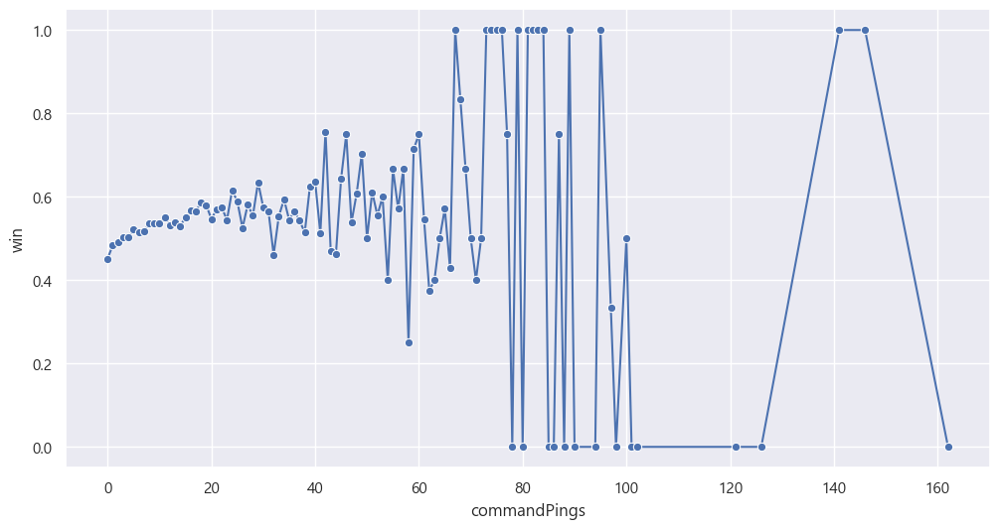

In [56]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('commandPings')['win'].mean().reset_index()

sns.lineplot(x='commandPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='commandPings_group', ylabel='win'>

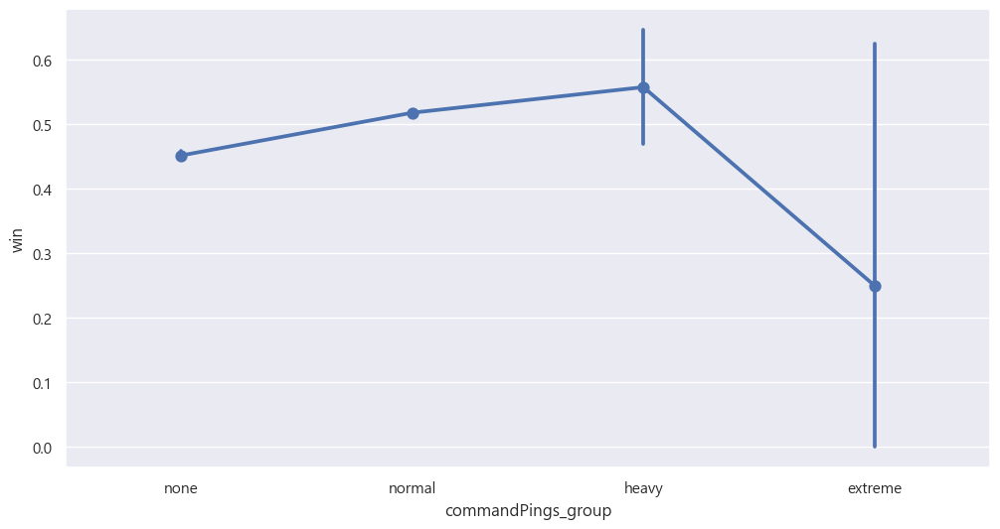

In [61]:
bins = [-1, 0, 60, 100, float('inf')]
labels = ['none', 'normal', 'heavy', 'extreme']

bronze_test_ping['commandPings_group'] = pd.cut(bronze_test_ping['commandPings'], bins=bins, labels=labels)


sns.pointplot(x='commandPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='commandPings_group', ylabel='count'>

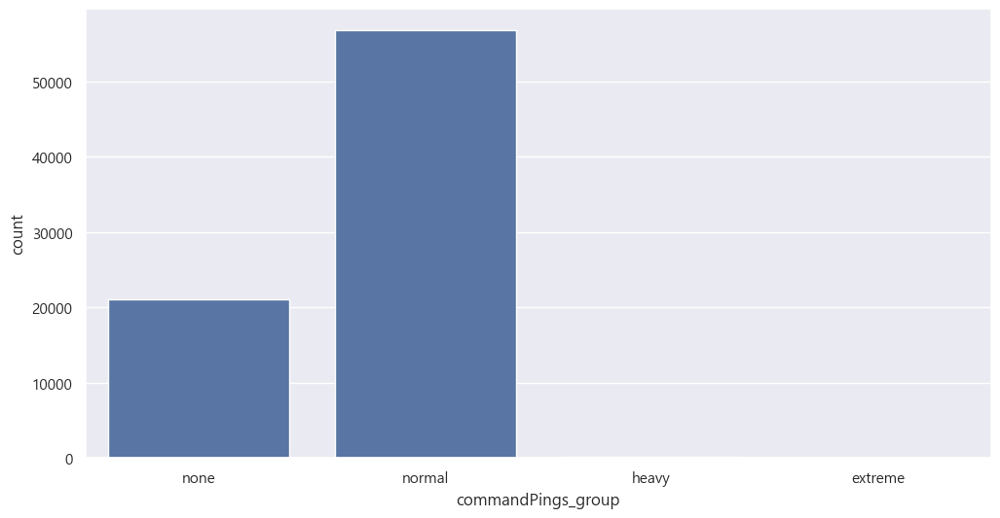

In [62]:
sns.countplot(x='commandPings_group', data=bronze_test_ping)

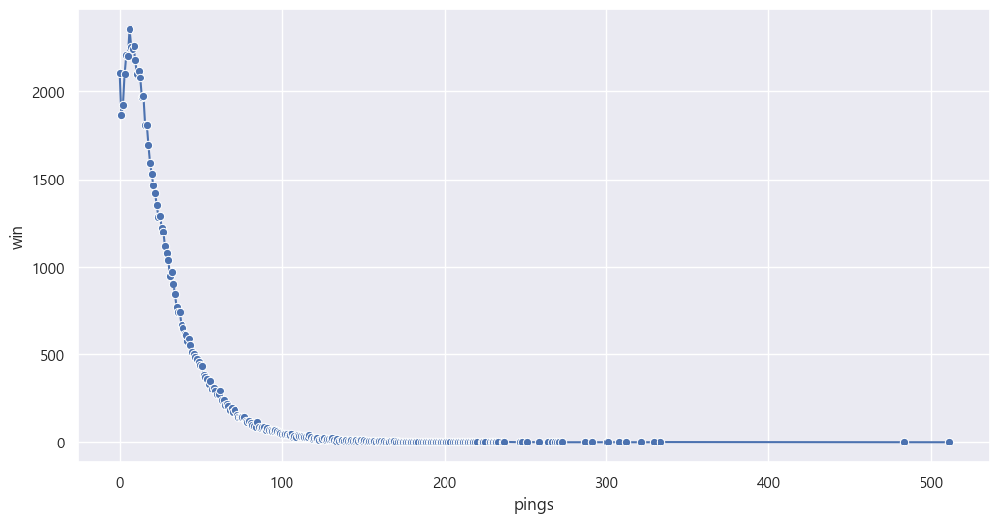

In [29]:
grouped=bronze_test_ping.groupby('pings')['win'].count().reset_index()
sns.lineplot(x='pings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


#### getBackPings

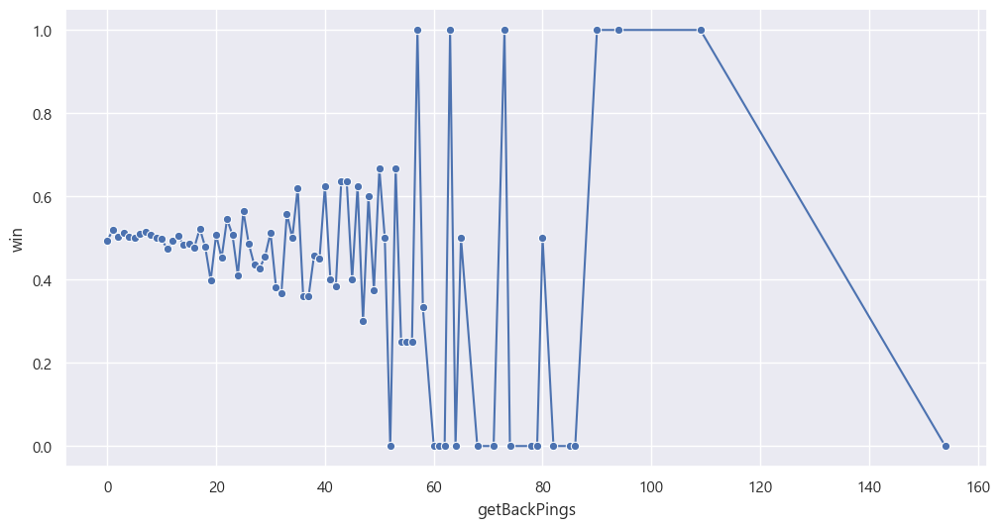

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('getBackPings')['win'].mean().reset_index()

sns.lineplot(x='getBackPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='getBackPings_group', ylabel='win'>

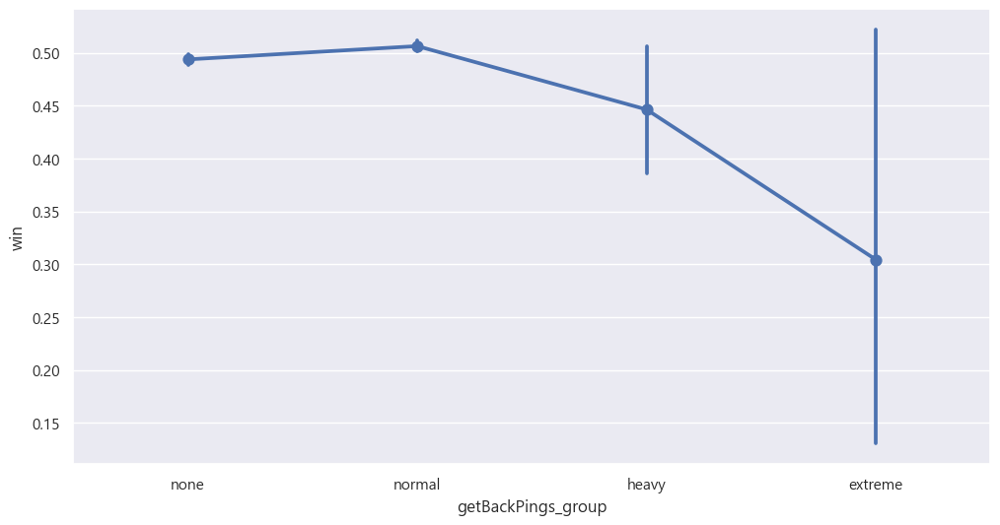

In [64]:
bins = [-1, 0, 35, 60, float('inf')]
labels = ['none', 'normal', 'heavy', 'extreme']

bronze_test_ping['getBackPings_group'] = pd.cut(bronze_test_ping['getBackPings'], bins=bins, labels=labels)


sns.pointplot(x='getBackPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='getBackPings_group', ylabel='count'>

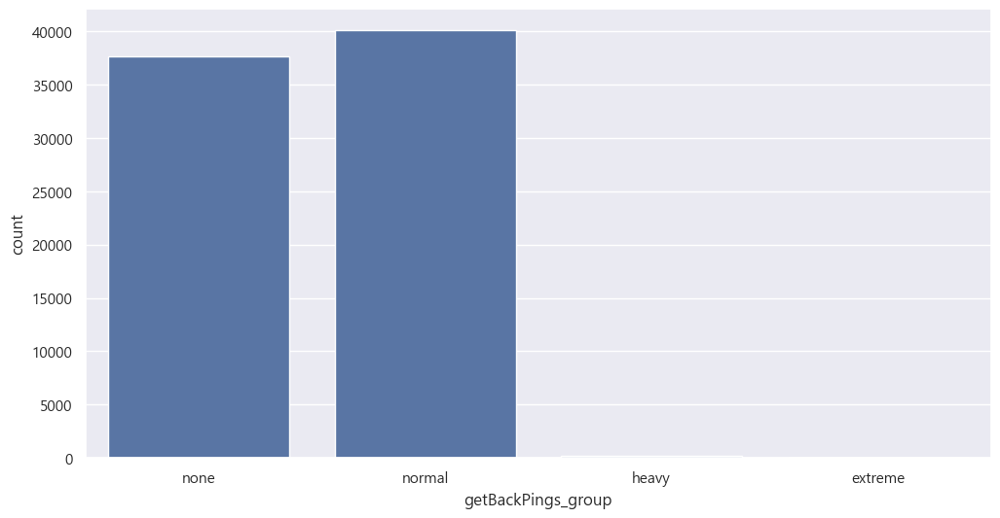

In [65]:
sns.countplot(x='getBackPings_group', data=bronze_test_ping)

#### onMyWayPings

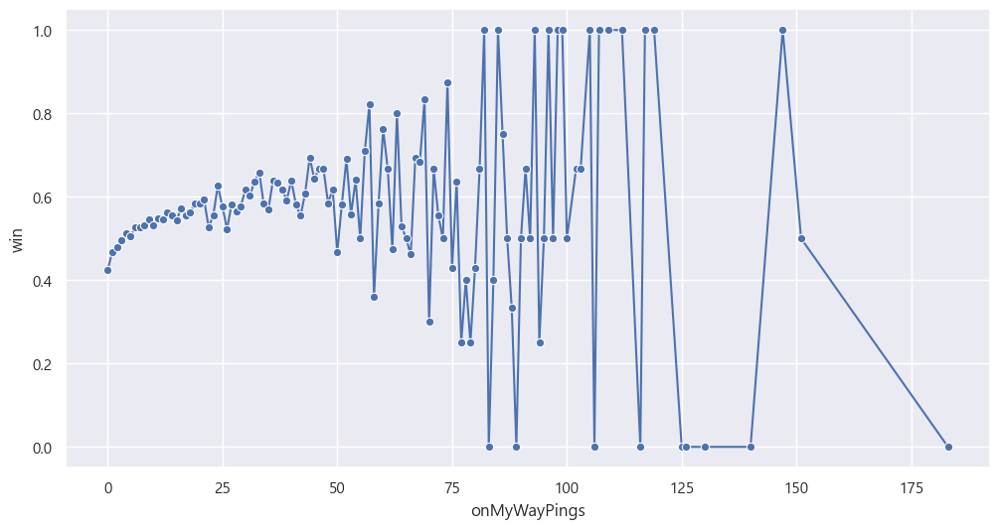

In [66]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('onMyWayPings')['win'].mean().reset_index()

sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


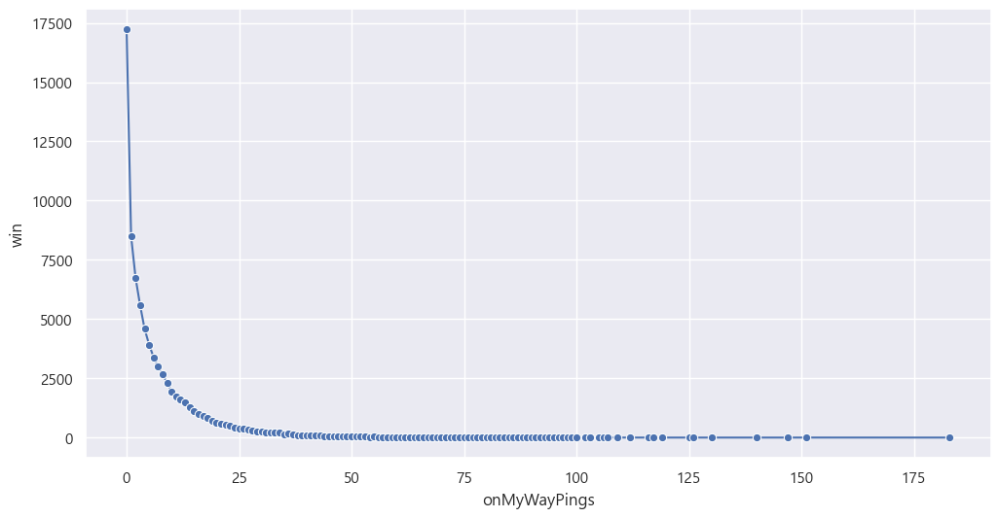

In [67]:
grouped=bronze_test_ping.groupby('onMyWayPings')['win'].count().reset_index()
sns.lineplot(x='onMyWayPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='onMyWayPings_group', ylabel='win'>

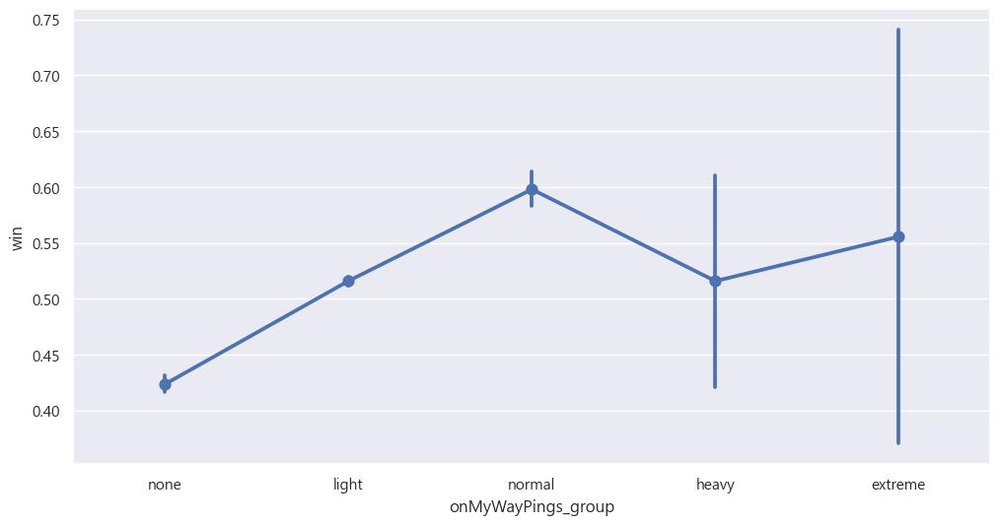

In [68]:
bins = [-1, 0, 25, 75, 100, float('inf')]
labels = ['none', 'light', 'normal', 'heavy', 'extreme']

bronze_test_ping['onMyWayPings_group'] = pd.cut(bronze_test_ping['onMyWayPings'], bins=bins, labels=labels)


sns.pointplot(x='onMyWayPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='onMyWayPings_group', ylabel='count'>

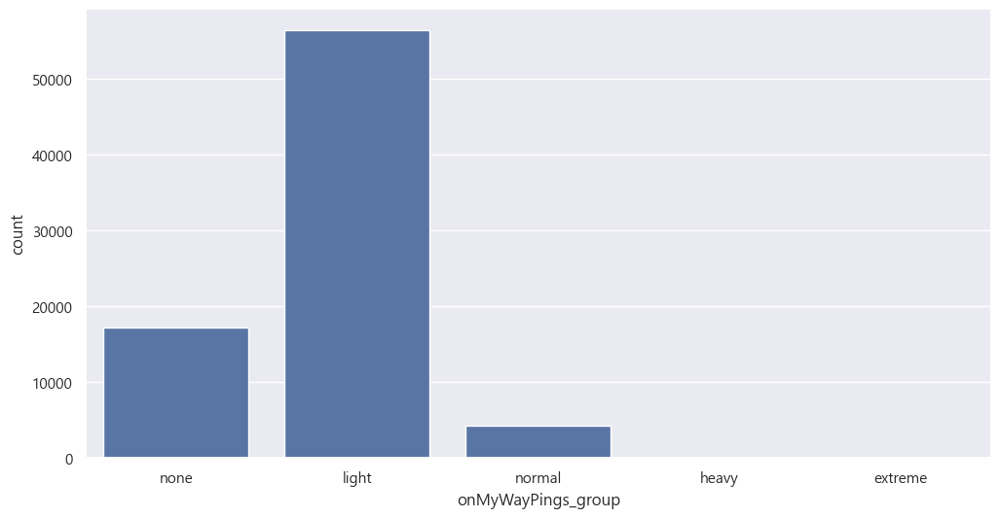

In [69]:
sns.countplot(x='onMyWayPings_group', data=bronze_test_ping)

#### assistMePings

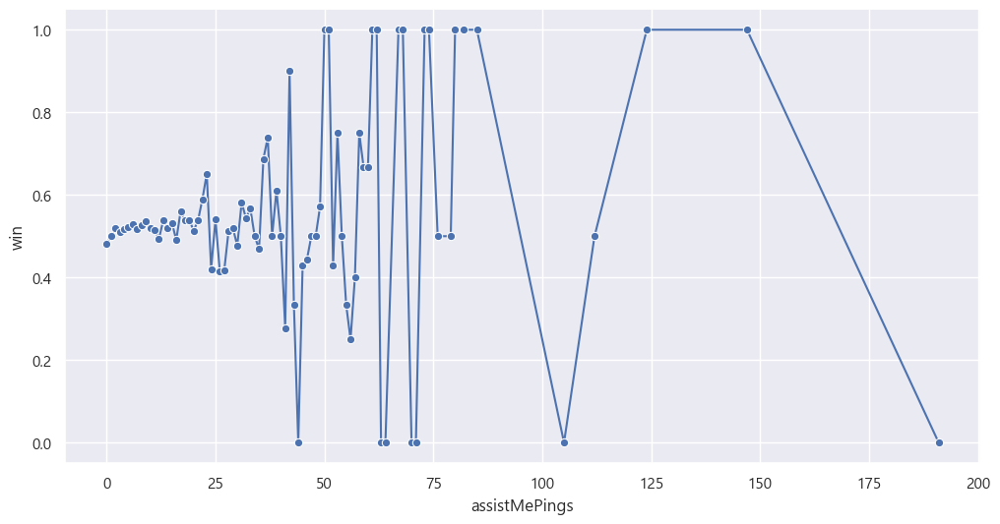

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('assistMePings')['win'].mean().reset_index()

sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


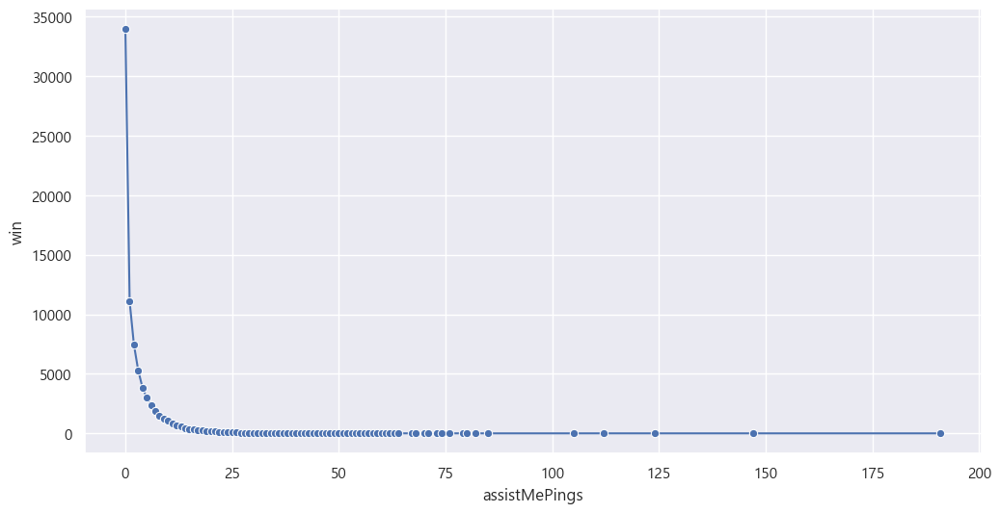

In [77]:
grouped=bronze_test_ping.groupby('assistMePings')['win'].count().reset_index()
sns.lineplot(x='assistMePings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='assistMePings_group', ylabel='win'>

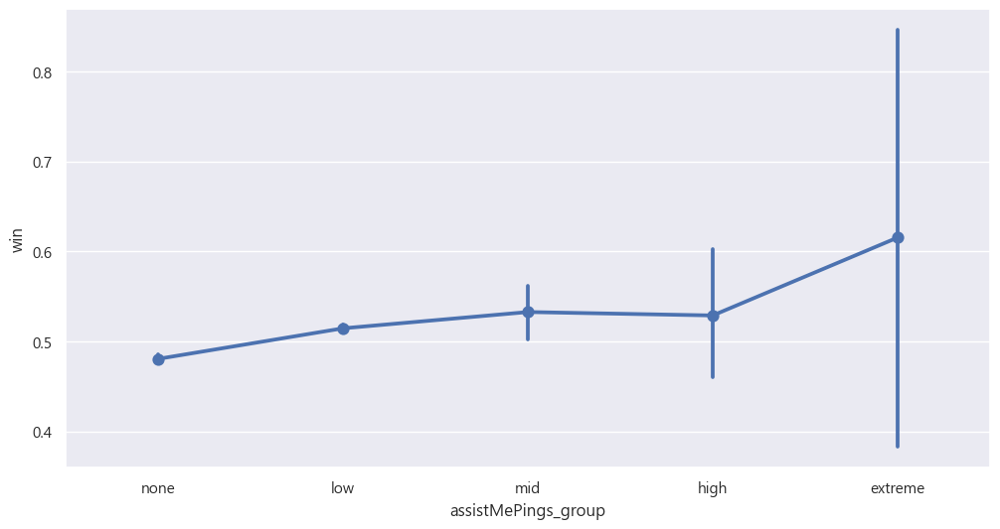

In [78]:
bins = [-1, 0, 20, 37, 75, float('inf')]
labels = ['none', 'low', 'mid', 'high', 'extreme']

bronze_test_ping['assistMePings_group'] = pd.cut(bronze_test_ping['assistMePings'], bins=bins, labels=labels)


sns.pointplot(x='assistMePings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='assistMePings_group', ylabel='count'>

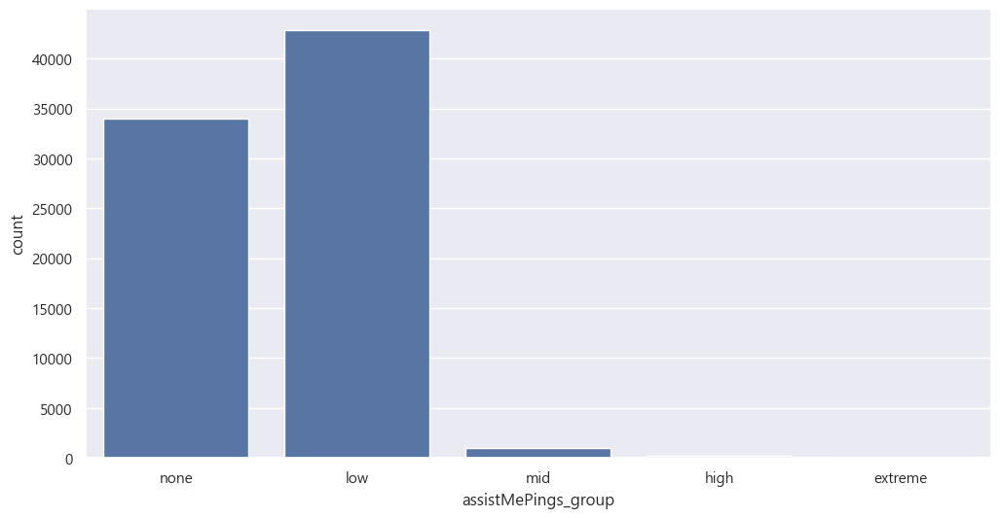

In [79]:
sns.countplot(x='assistMePings_group', data=bronze_test_ping)

#### enemyMissingPings

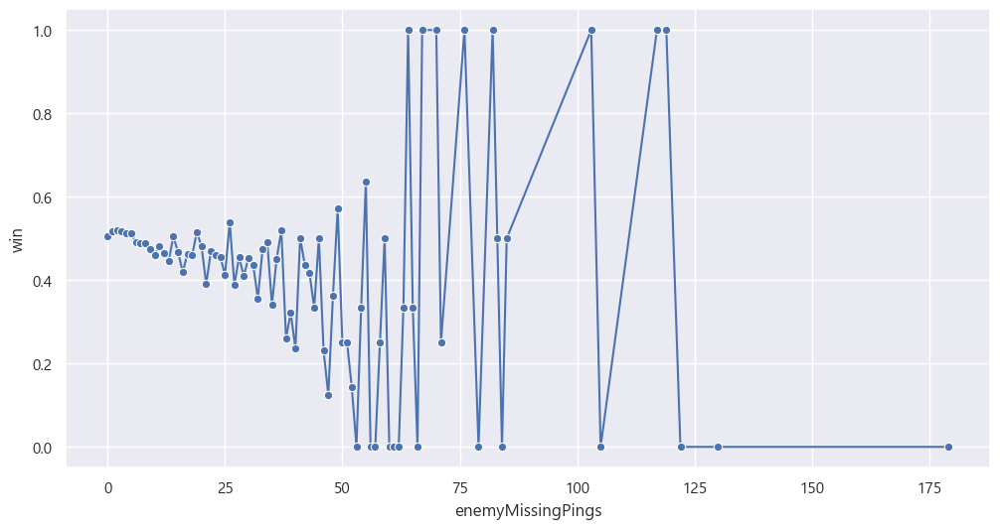

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('enemyMissingPings')['win'].mean().reset_index()

sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


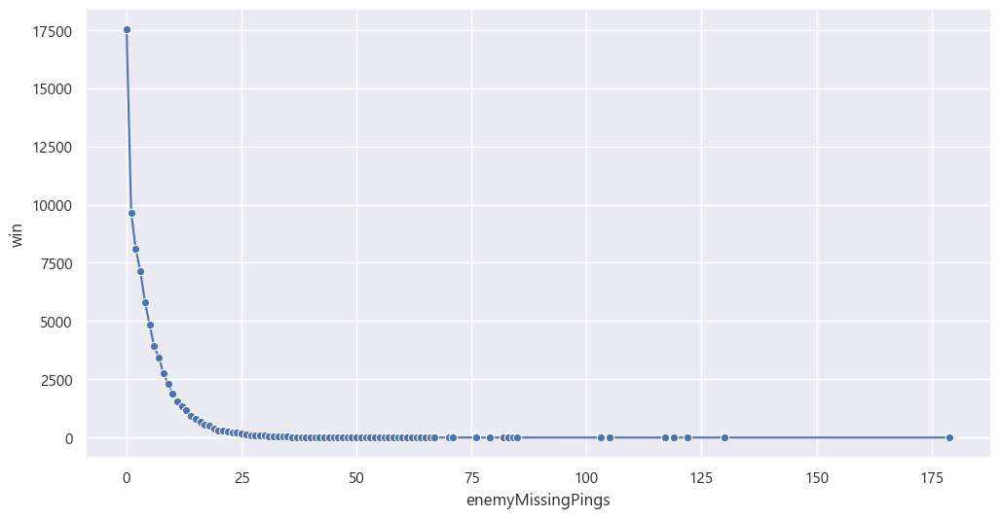

In [93]:
grouped=bronze_test_ping.groupby('enemyMissingPings')['win'].count().reset_index()
sns.lineplot(x='enemyMissingPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyMissingPings_group', ylabel='win'>

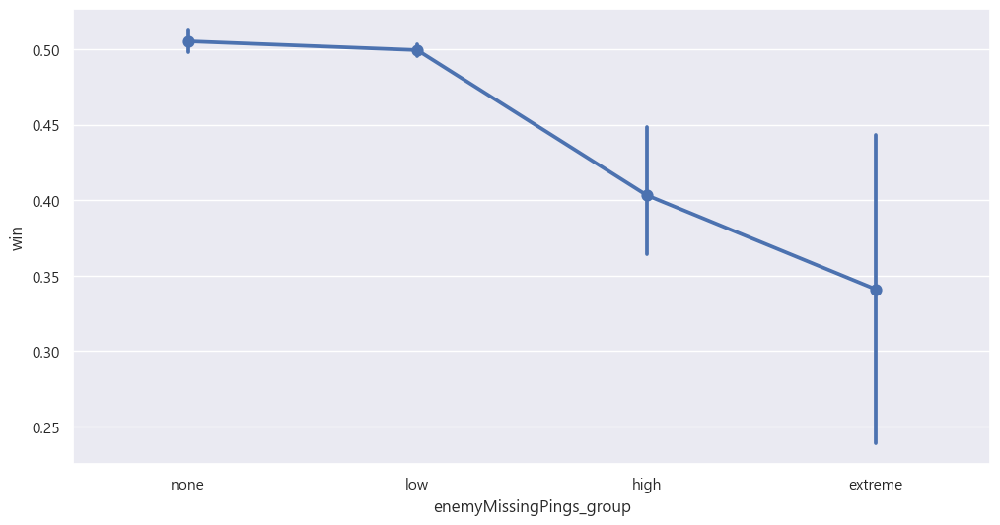

In [94]:
bins = [-1, 0, 30, 50, float('inf')]
labels = ['none', 'low', 'high', 'extreme']

bronze_test_ping['enemyMissingPings_group'] = pd.cut(bronze_test_ping['enemyMissingPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyMissingPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='enemyMissingPings_group', ylabel='count'>

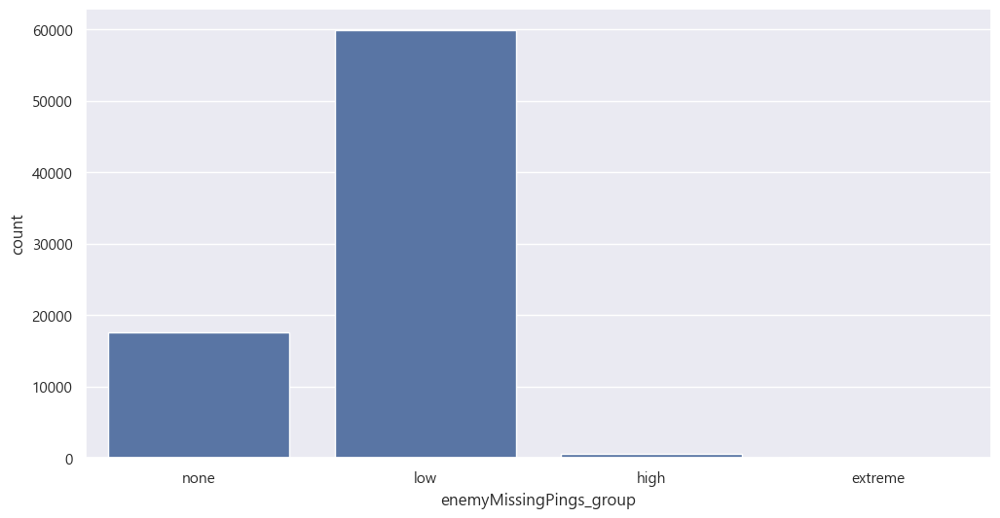

In [95]:
sns.countplot(x='enemyMissingPings_group', data=bronze_test_ping)

#### enemyVisionPings

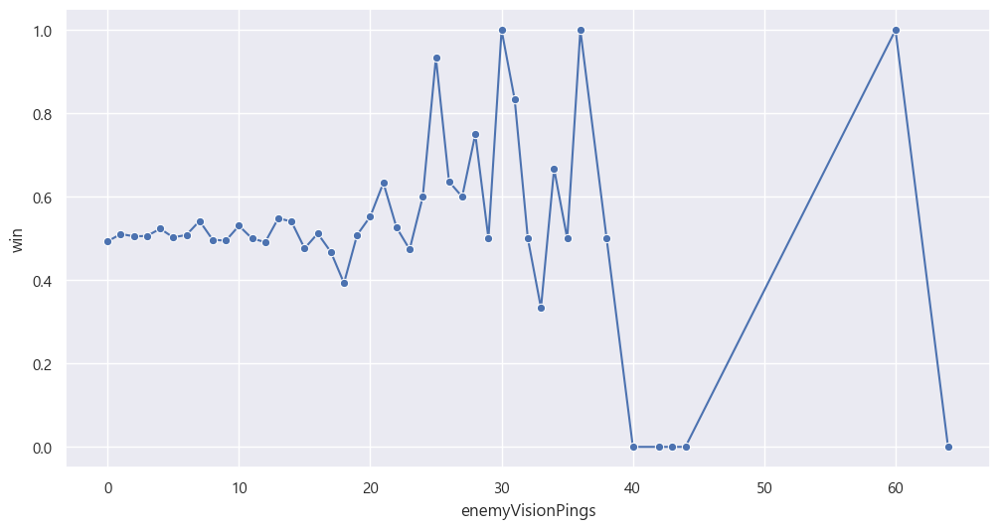

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('enemyVisionPings')['win'].mean().reset_index()

sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


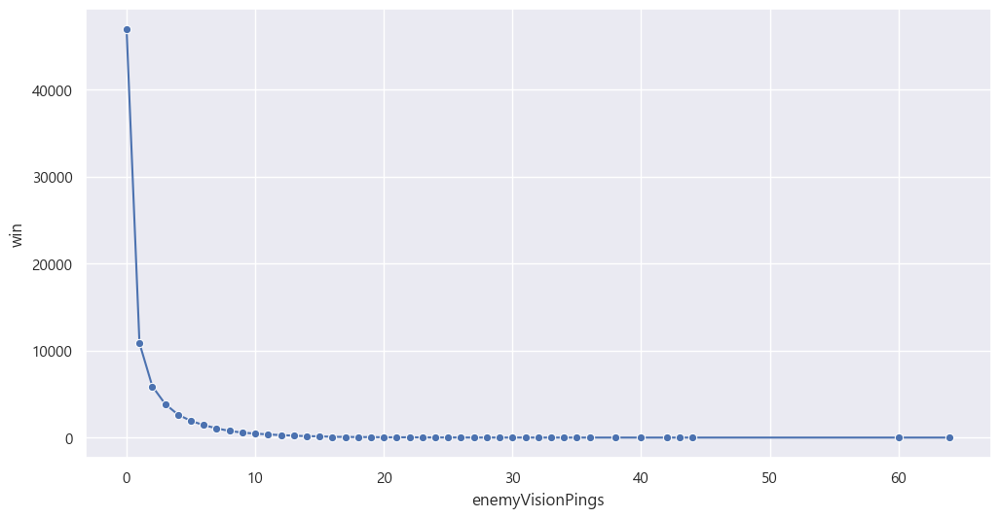

In [97]:
grouped=bronze_test_ping.groupby('enemyVisionPings')['win'].count().reset_index()
sns.lineplot(x='enemyVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='enemyVisionPings_group', ylabel='win'>

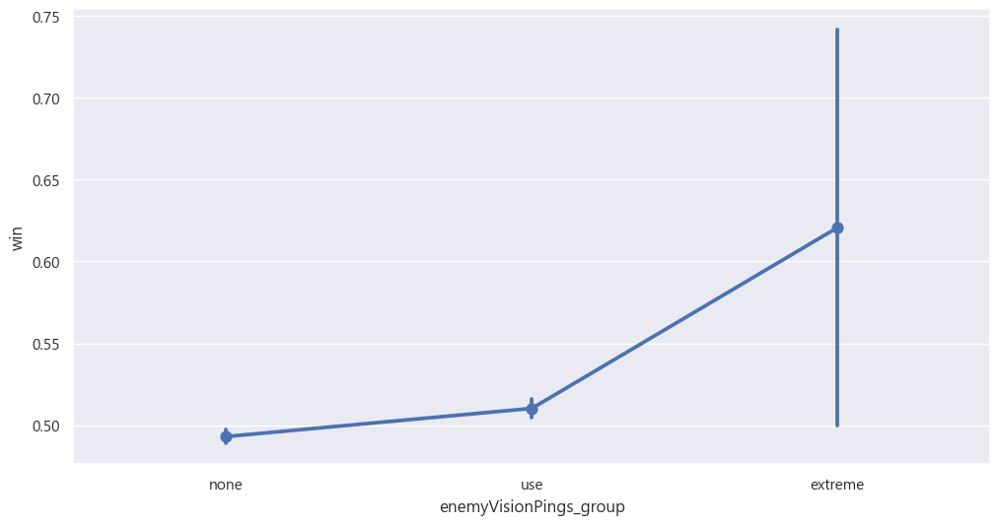

In [98]:
bins = [-1, 0, 25, float('inf')]
labels = ['none', 'use', 'extreme']

bronze_test_ping['enemyVisionPings_group'] = pd.cut(bronze_test_ping['enemyVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='enemyVisionPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='enemyVisionPings_group', ylabel='count'>

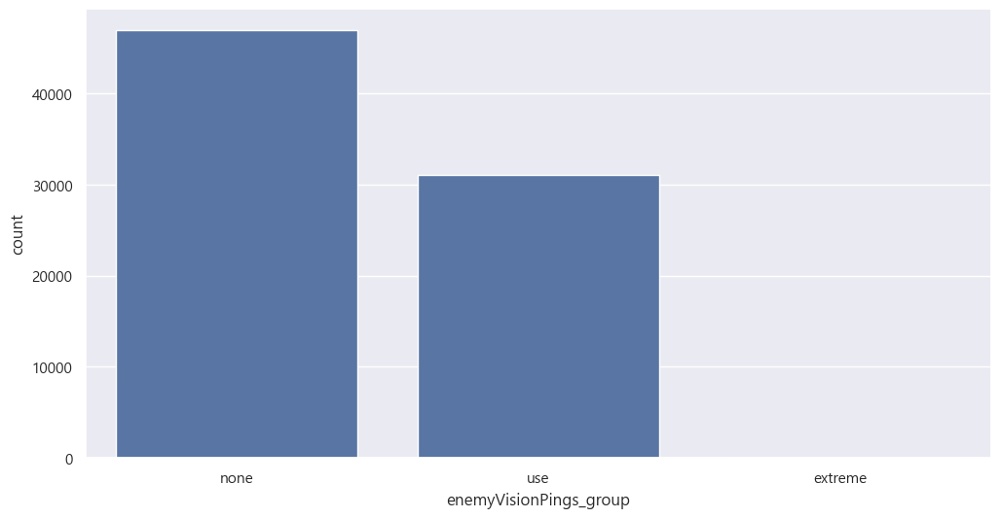

In [99]:
sns.countplot(x='enemyVisionPings_group', data=bronze_test_ping)

#### needVisionPings(drop)

In [88]:
bronze_test_ping['assistMePings'].count()

np.int64(77990)

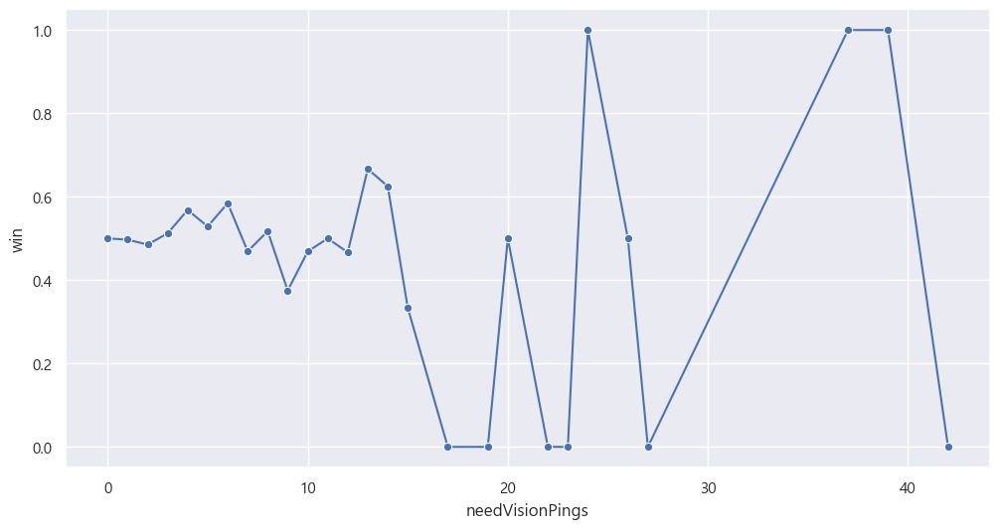

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('needVisionPings')['win'].mean().reset_index()

sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


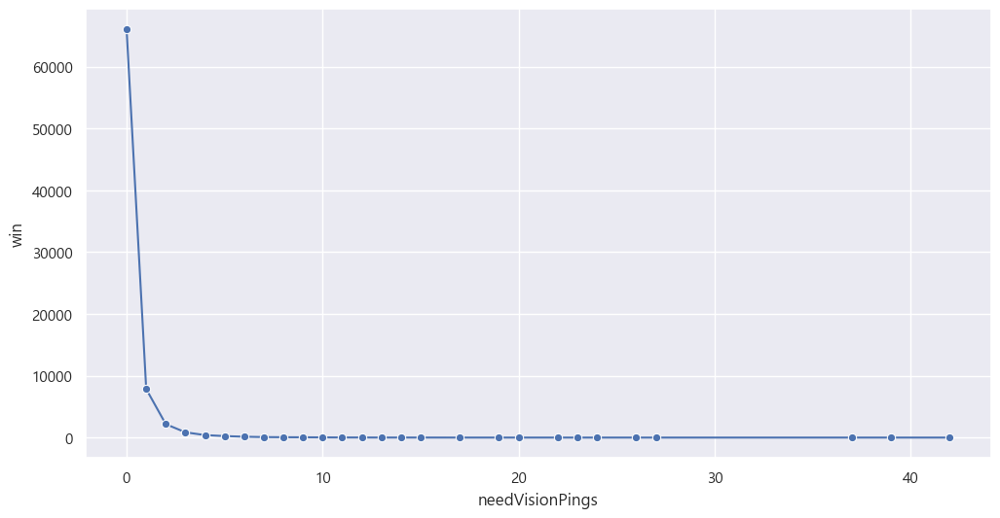

In [81]:
grouped=bronze_test_ping.groupby('needVisionPings')['win'].count().reset_index()
sns.lineplot(x='needVisionPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()

<Axes: xlabel='needVisionPings_group', ylabel='win'>

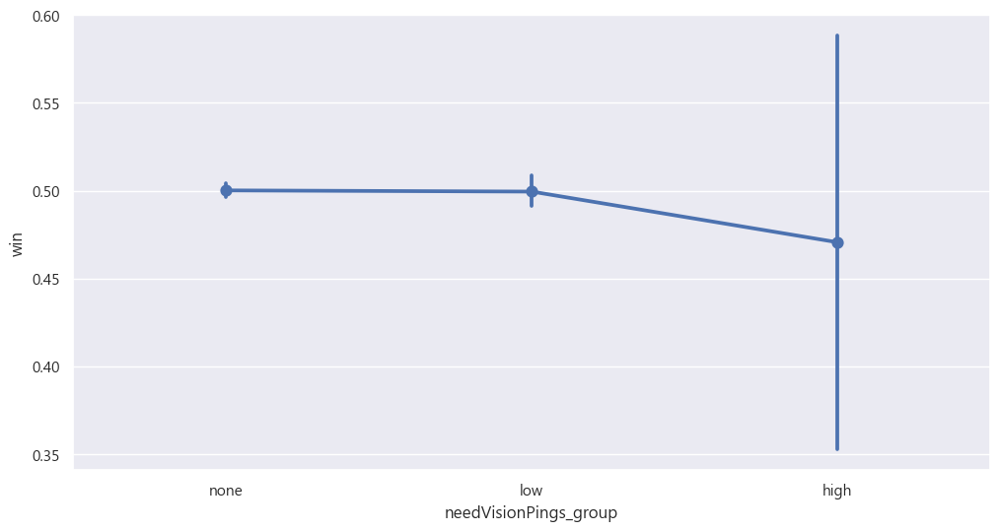

In [90]:
bins = [-1, 0, 10, float('inf')]
labels = ['none', 'low', 'high']

bronze_test_ping['needVisionPings_group'] = pd.cut(bronze_test_ping['needVisionPings'], bins=bins, labels=labels)


sns.pointplot(x='needVisionPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='needVisionPings_group', ylabel='count'>

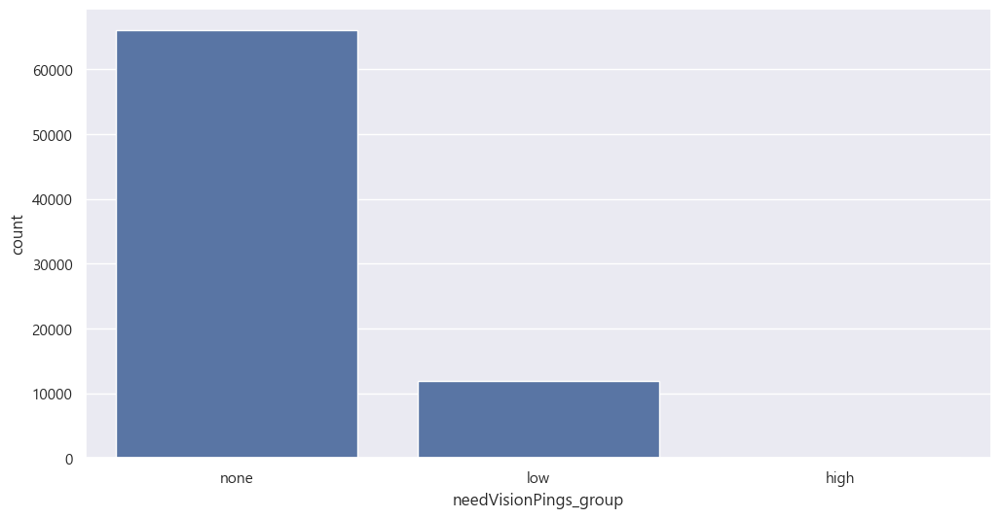

In [91]:
sns.countplot(x='needVisionPings_group', data=bronze_test_ping)

#### allInPings(drop)

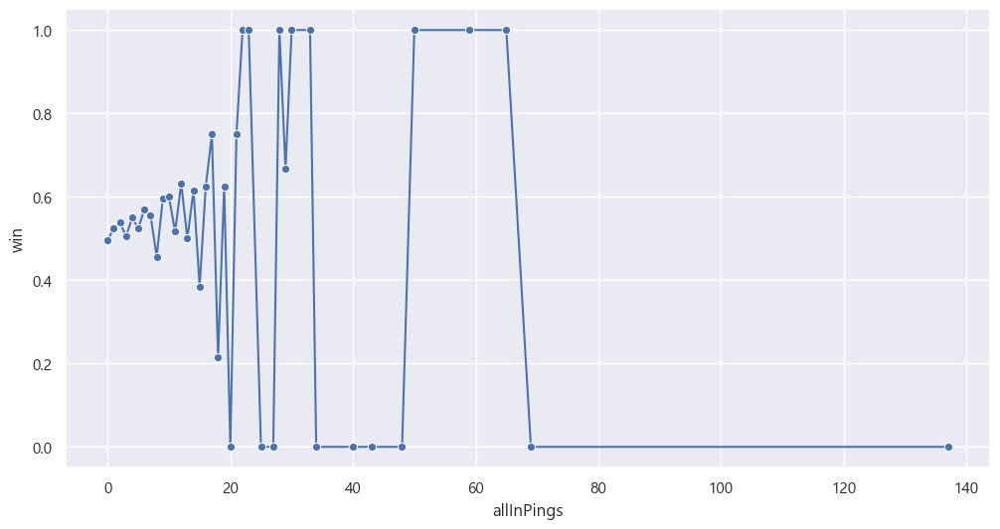

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# x = 핑 개수, y = 레이블 (예: 딜량 많음 여부 등)
grouped = bronze_test_ping.groupby('allInPings')['win'].mean().reset_index()

sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


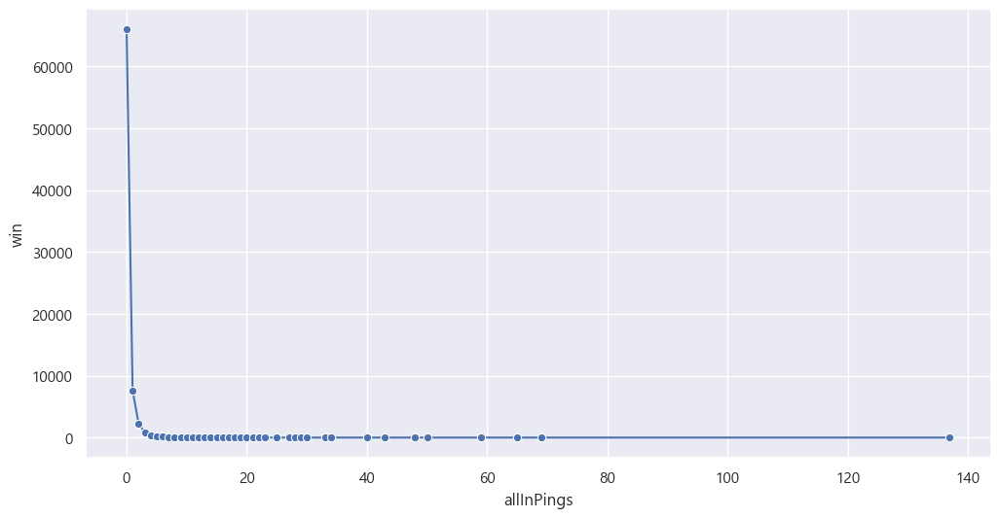

In [71]:
grouped=bronze_test_ping.groupby('allInPings')['win'].count().reset_index()
sns.lineplot(x='allInPings', y='win', data=grouped, marker='o')
plt.grid(True)
plt.show()


<Axes: xlabel='allInPings_group', ylabel='win'>

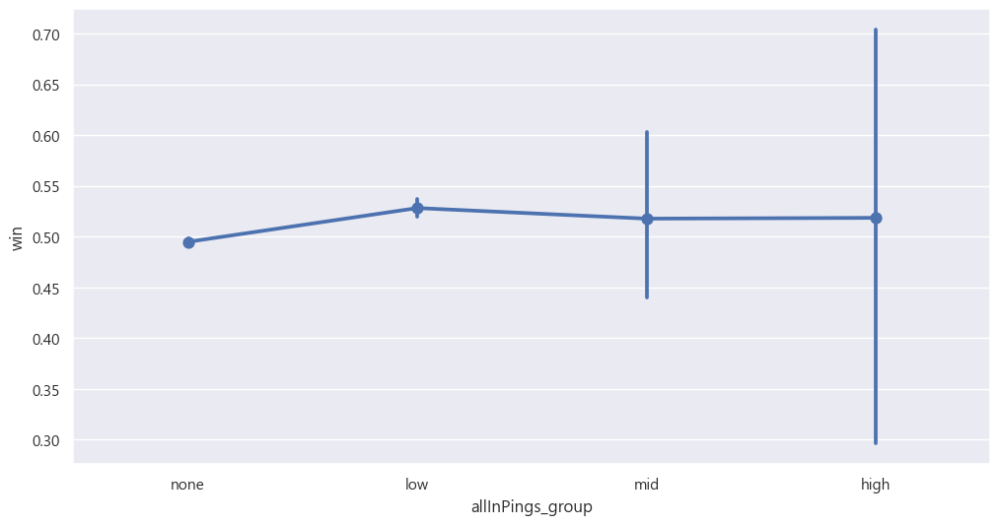

In [74]:
bins = [-1, 0, 10, 20, float('inf')]
labels = ['none', 'low', 'mid', 'high']

bronze_test_ping['allInPings_group'] = pd.cut(bronze_test_ping['allInPings'], bins=bins, labels=labels)


sns.pointplot(x='allInPings_group', y='win', data=bronze_test_ping)

<Axes: xlabel='allInPings_group', ylabel='count'>

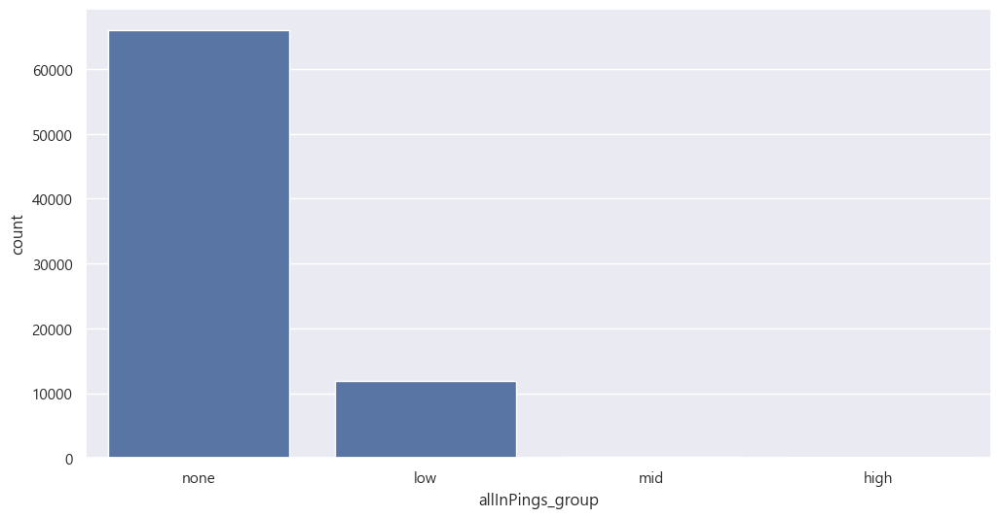

In [75]:
sns.countplot(x='allInPings_group', data=bronze_test_ping)

### 다시 모델 돌릴 시간

In [108]:
col_list=['commandPings_group', 'getBackPings_group','onMyWayPings_group','allInPings_group','assistMePings_group',
          'needVisionPings_group', 'enemyMissingPings_group', 'enemyVisionPings_group'
         ]
bronze_test_ping_log = pd.get_dummies(bronze_test_ping, columns=col_list, drop_first=True)
bronze_ping_log=bronze_test_ping_log.drop(['commandPings', 'getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings','pings'],axis=1)

In [113]:
change=bronze_ping_log.columns.to_list()
for col in change:
    bronze_ping_log[col] = bronze_ping_log[col].astype(int)

In [117]:
bronze_ping_log.describe()

,win,commandPings_group_normal,commandPings_group_heavy,commandPings_group_extreme,getBackPings_group_normal,getBackPings_group_heavy,getBackPings_group_extreme,onMyWayPings_group_light,onMyWayPings_group_normal,onMyWayPings_group_heavy,...,assistMePings_group_mid,assistMePings_group_high,assistMePings_group_extreme,needVisionPings_group_low,needVisionPings_group_high,enemyMissingPings_group_low,enemyMissingPings_group_high,enemyMissingPings_group_extreme,enemyVisionPings_group_use,enemyVisionPings_group_extreme
count,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,...,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000,77990.000000
mean,0.500000,0.728401,0.001449,0.000103,0.513938,0.002988,0.000295,0.722849,0.054725,0.001218,...,0.013168,0.002449,0.000167,0.152417,0.000872,0.767368,0.006834,0.001128,0.397987,0.000744
std,0.500003,0.444787,0.038037,0.010128,0.499809,0.054577,0.017171,0.447595,0.227444,0.034880,...,0.113996,0.049427,0.012910,0.359427,0.029515,0.422513,0.082387,0.033572,0.489486,0.027261
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,0.500000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [118]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = bronze_ping_log.drop(['win'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [119]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
0,const,8.453549
8,onMyWayPings_group_normal,1.421208
7,onMyWayPings_group_light,1.420230
14,assistMePings_group_low,1.278233
20,enemyMissingPings_group_low,1.139724
15,assistMePings_group_mid,1.121771
11,allInPings_group_low,1.098814
18,needVisionPings_group_low,1.092187
1,commandPings_group_normal,1.084604
4,getBackPings_group_normal,1.068117


In [120]:
import statsmodels.api as sm

# 1. X, y 분리
X = bronze_ping_log.drop(['win'],axis=1)
y = bronze_ping_log['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.688949
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:                77990
Model:                          Logit   Df Residuals:                    77966
Method:                           MLE   Df Model:                           23
Date:                Wed, 30 Jul 2025   Pseudo R-squ.:                0.006057
Time:                        11:37:56   Log-Likelihood:                -53731.
converged:                       True   LL-Null:                       -54059.
Covariance Type:            nonrobust   LLR p-value:                1.405e-123
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
commandPings_group_normal           0.0974      0.016      6.241  

In [121]:
np.exp(-1.0211)

np.float64(0.36019850381885676)

# 아이언

In [78]:
iron_ping=pd.read_csv("iron_ping.csv")

In [79]:
iron_ping
iron_game=iron_ping[~iron_ping['is_replay']] #다시하기 게임들은 날려주고
iron_ping=iron_game[['win', 'is_Surrender_aft_25m','is_Early_Surrender', 'commandPings','getBackPings','holdPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']]

In [80]:
iron_ping

,win,is_Surrender_aft_25m,is_Early_Surrender,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,False,True,False,0,3,0,22,0,1,0,4,4
1,False,True,False,0,38,0,15,0,3,0,5,0
2,False,True,False,14,0,0,9,0,2,0,1,0
3,False,True,False,0,0,0,0,0,0,0,10,5
4,False,True,False,4,0,0,0,0,1,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
19995,True,False,False,15,0,0,10,0,8,0,10,0
19996,True,False,False,0,0,0,28,0,0,0,0,0
19997,True,False,False,14,17,0,9,1,12,0,12,1
19998,True,False,False,0,0,0,0,0,13,0,0,0


## EDA

### win

In [81]:
iron_ping['win'].value_counts()

win
False    38695
True     38695
Name: count, dtype: int64

<Axes: xlabel='win', ylabel='count'>

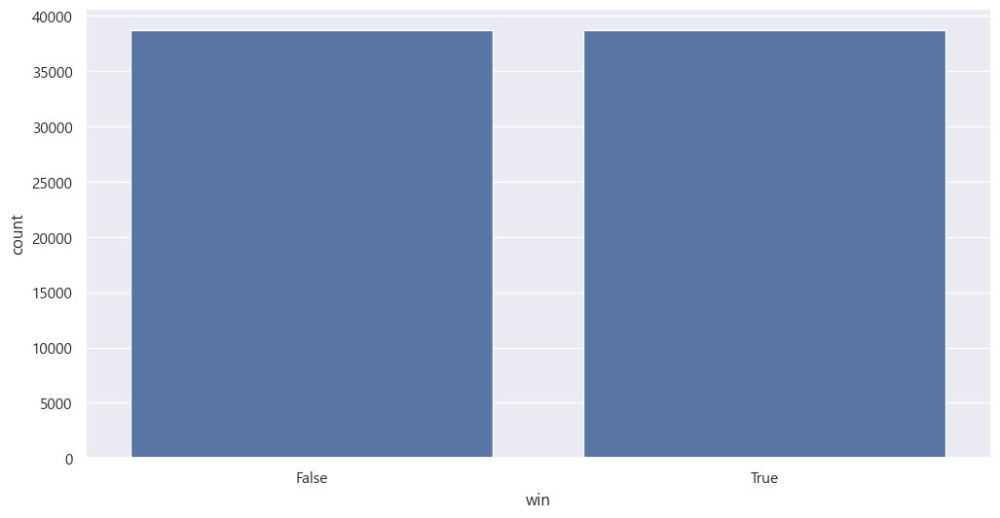

In [82]:
sns.countplot(x=iron_ping['win'])

### 25분 후에 정규 서렌을 쳤을까요?

In [83]:
iron_ping['is_Surrender_aft_25m'].value_counts()

is_Surrender_aft_25m
False    42660
True     34730
Name: count, dtype: int64

<Axes: xlabel='is_Surrender_aft_25m', ylabel='count'>

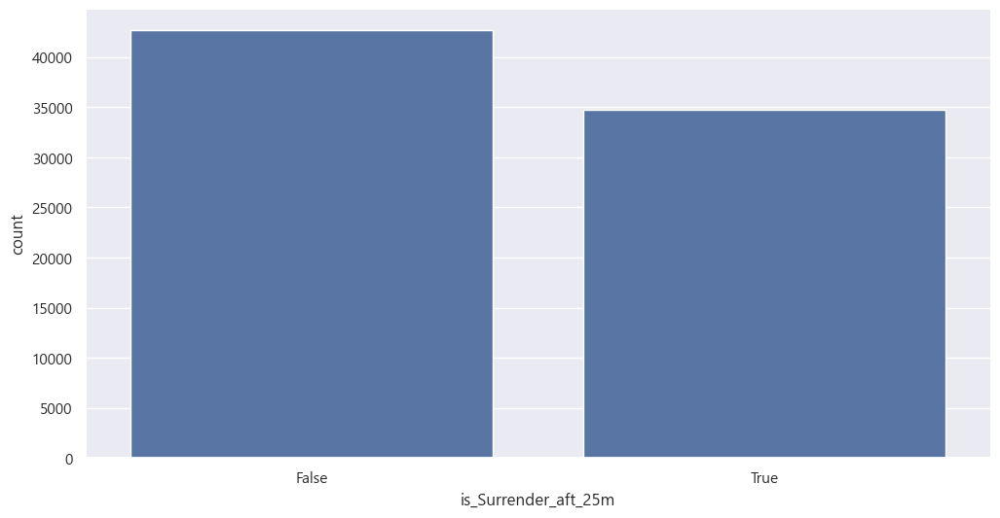

In [84]:
sns.countplot(x=iron_ping['is_Surrender_aft_25m'])

### 조기서렌을 쳤을까요?

In [85]:
iron_ping['is_Early_Surrender'].value_counts()

is_Early_Surrender
False    77390
Name: count, dtype: int64

### 일반 핑

In [86]:
iron_ping['commandPings'].value_counts()

commandPings
0      24928
1       8710
2       6635
3       5734
4       4516
       ...  
93         1
123        1
83         1
111        1
88         1
Name: count, Length: 107, dtype: int64

<Axes: xlabel='commandPings', ylabel='Density'>

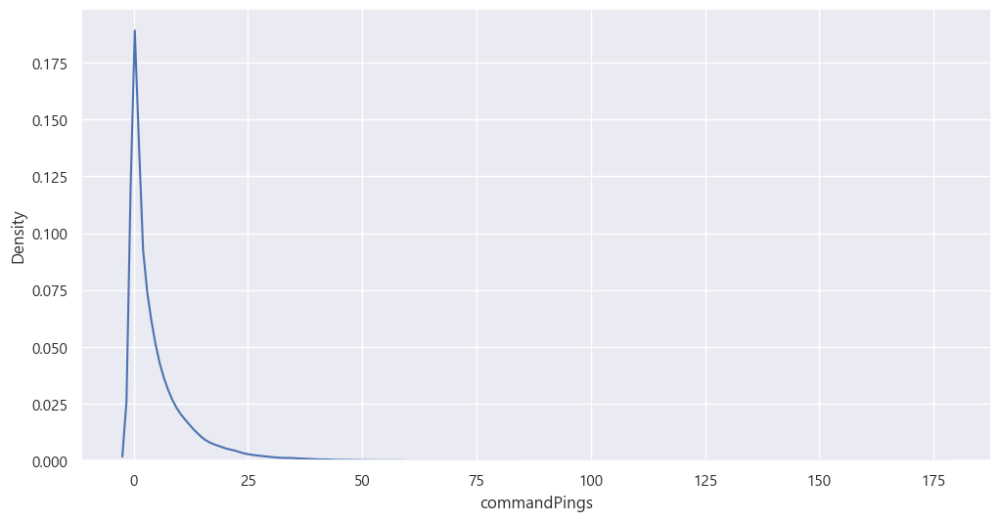

In [87]:
sns.kdeplot(x=iron_ping['commandPings'])

<Axes: xlabel='commandPings', ylabel='Density'>

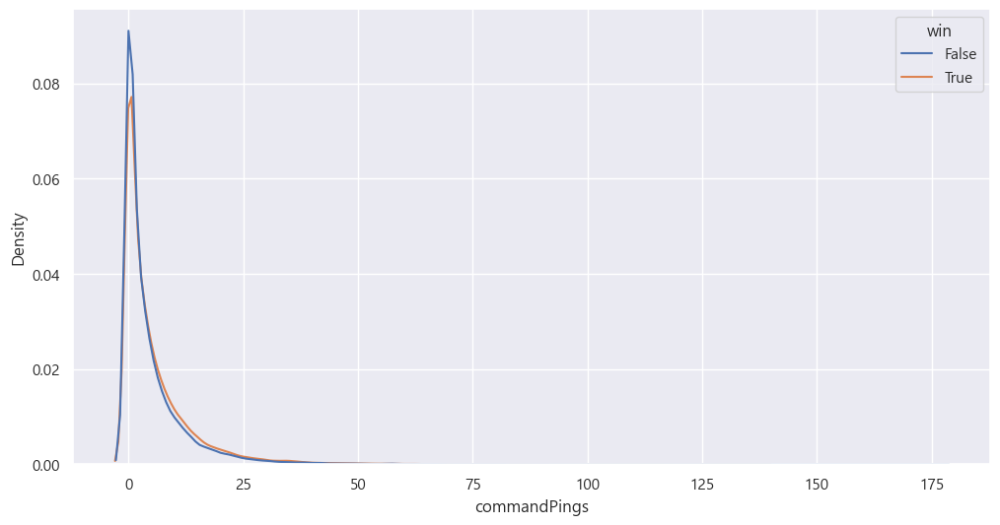

In [88]:
sns.kdeplot(x=iron_ping['commandPings'],hue=iron_ping['win'])

### 위험핑을 얼마나 찍었을까요?

In [89]:
iron_ping['getBackPings'].value_counts()

getBackPings
0      38671
1       9595
2       5889
3       4251
4       3373
       ...  
160        1
75         1
101        1
67         1
62         1
Name: count, Length: 81, dtype: int64

<Axes: xlabel='getBackPings', ylabel='Density'>

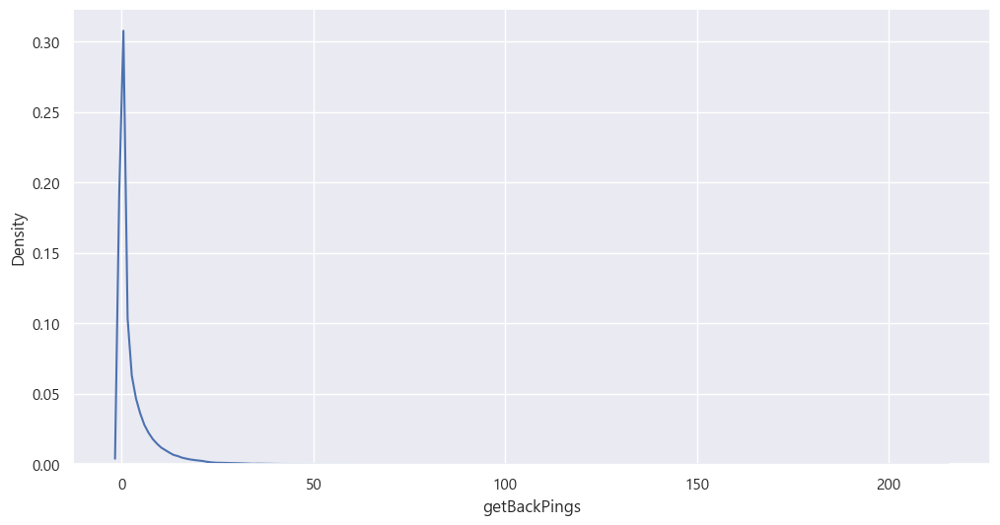

In [90]:
sns.kdeplot(x=iron_ping['getBackPings'])

<Axes: xlabel='getBackPings', ylabel='Density'>

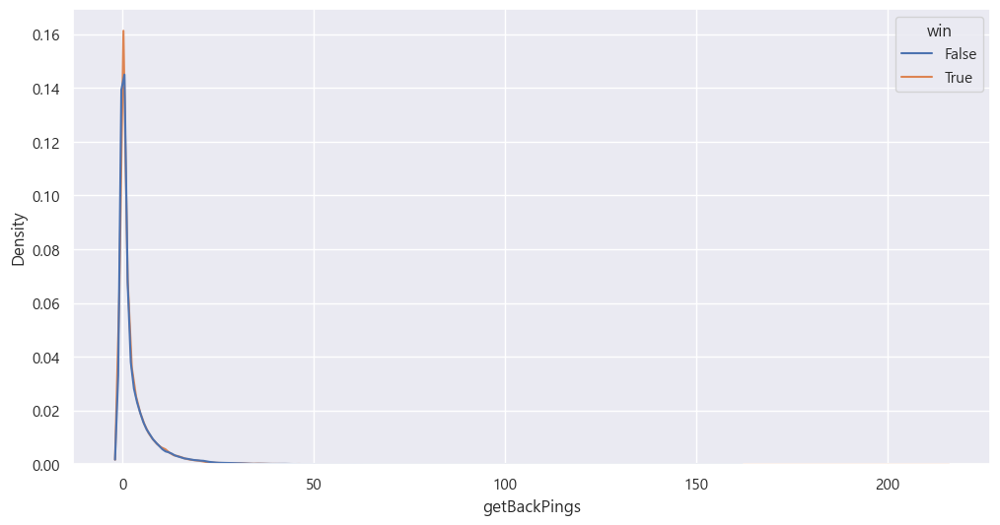

In [91]:
sns.kdeplot(x=iron_ping['getBackPings'],hue=iron_ping['win'])

### 압박핑 -> 정작 브론즈급에선 사용된 적이 없음

In [92]:
iron_ping['holdPings'].value_counts()

holdPings
0    77390
Name: count, dtype: int64

### 가는중 핑

In [93]:
iron_ping['onMyWayPings'].value_counts()

onMyWayPings
0      19214
1       8684
2       6662
3       5478
4       4546
       ...  
127        1
92         1
128        1
101        1
102        1
Name: count, Length: 114, dtype: int64

<Axes: xlabel='onMyWayPings', ylabel='Density'>

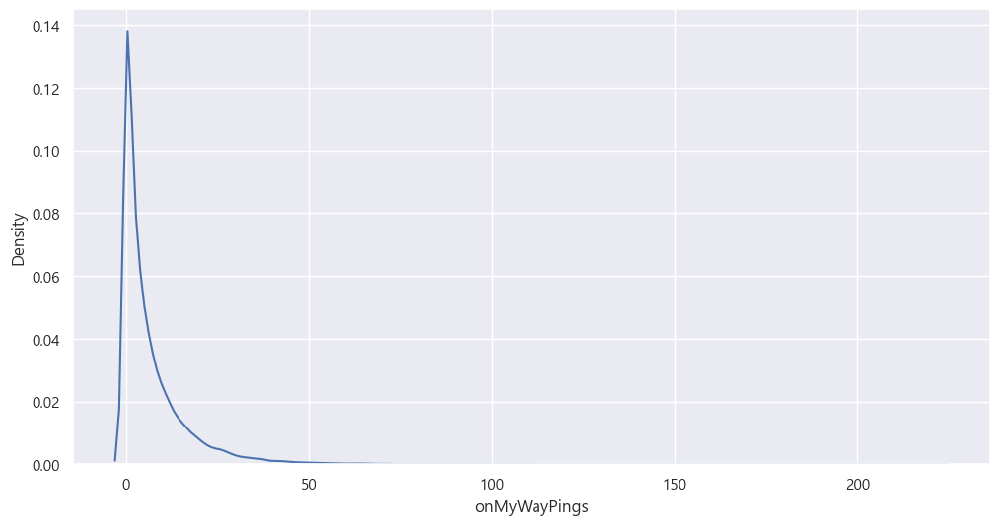

In [94]:
sns.kdeplot(x=iron_ping['onMyWayPings'])

<Axes: xlabel='onMyWayPings', ylabel='Density'>

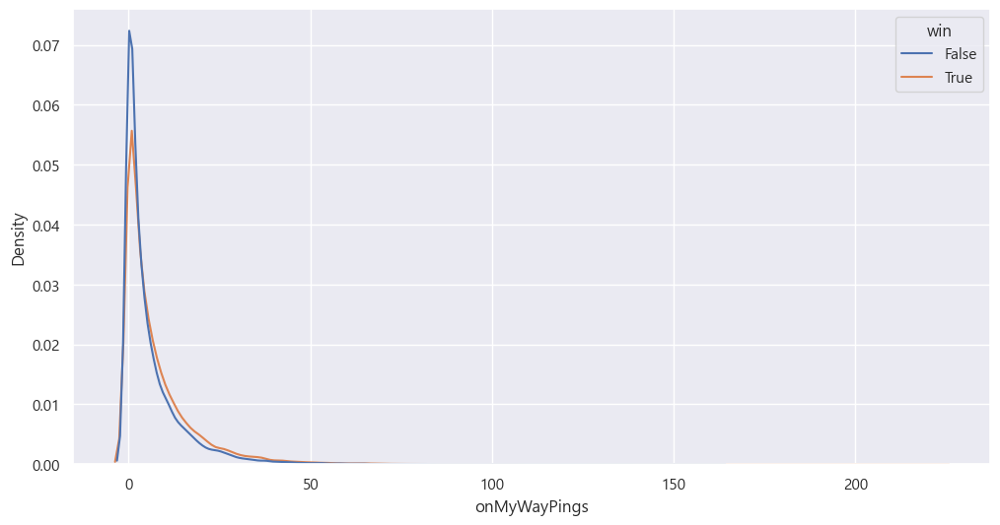

In [95]:
sns.kdeplot(x=iron_ping['onMyWayPings'],hue=iron_ping['win'])

### 총공격핑

In [96]:
iron_ping['allInPings'].value_counts()

allInPings
0     64846
1      7718
2      2298
3      1048
4       500
5       321
6       180
7       109
8        75
9        57
10       48
12       34
11       28
14       21
16       18
15       14
13       13
17       11
24        8
19        7
18        5
25        5
21        5
32        3
20        3
45        2
22        2
28        2
31        2
30        2
27        2
26        1
36        1
23        1
Name: count, dtype: int64

<Axes: xlabel='allInPings', ylabel='Density'>

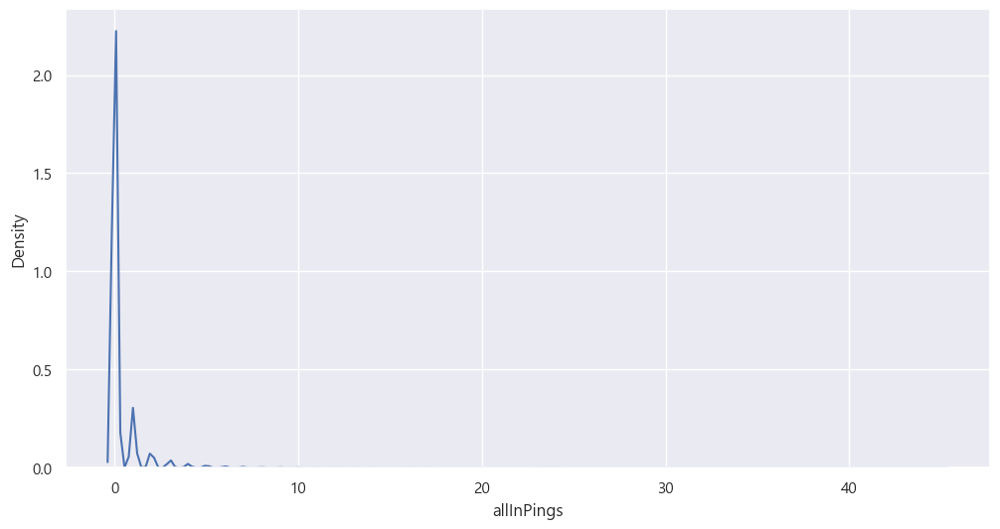

In [97]:
sns.kdeplot(x=iron_ping['allInPings'])

<Axes: xlabel='allInPings', ylabel='Density'>

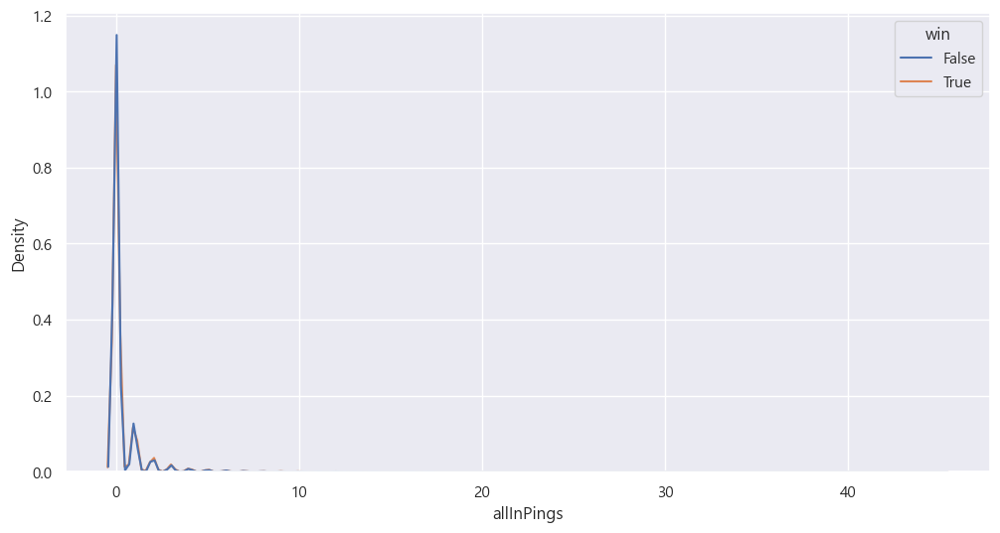

In [98]:
sns.kdeplot(x=iron_ping['allInPings'],hue=iron_ping['win'])

### 지원핑

In [99]:
iron_ping['assistMePings'].value_counts()

assistMePings
0      35076
1      10331
2       7033
3       5051
4       3815
       ...  
47         1
117        1
65         1
75         1
110        1
Name: count, Length: 76, dtype: int64

<Axes: xlabel='assistMePings', ylabel='Density'>

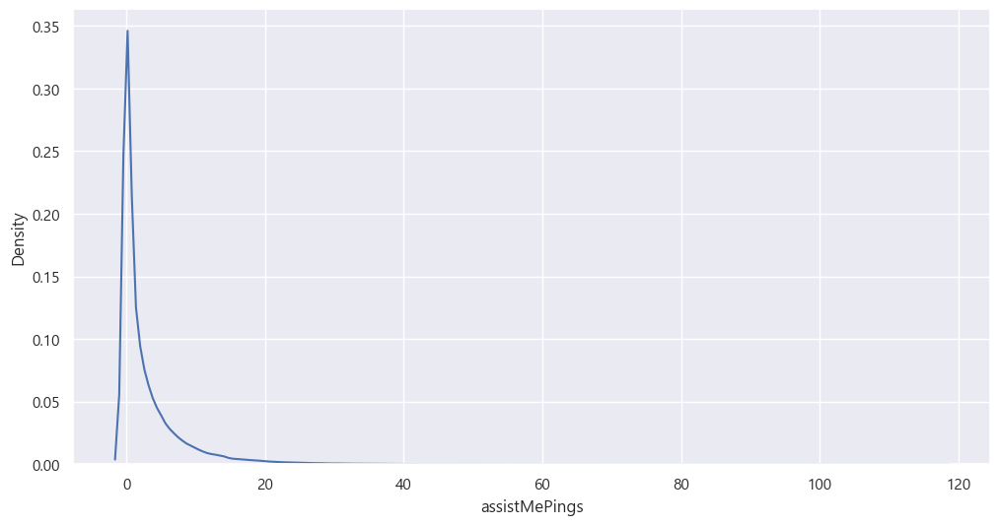

In [100]:
sns.kdeplot(x=iron_ping['assistMePings'])

<Axes: xlabel='assistMePings', ylabel='Density'>

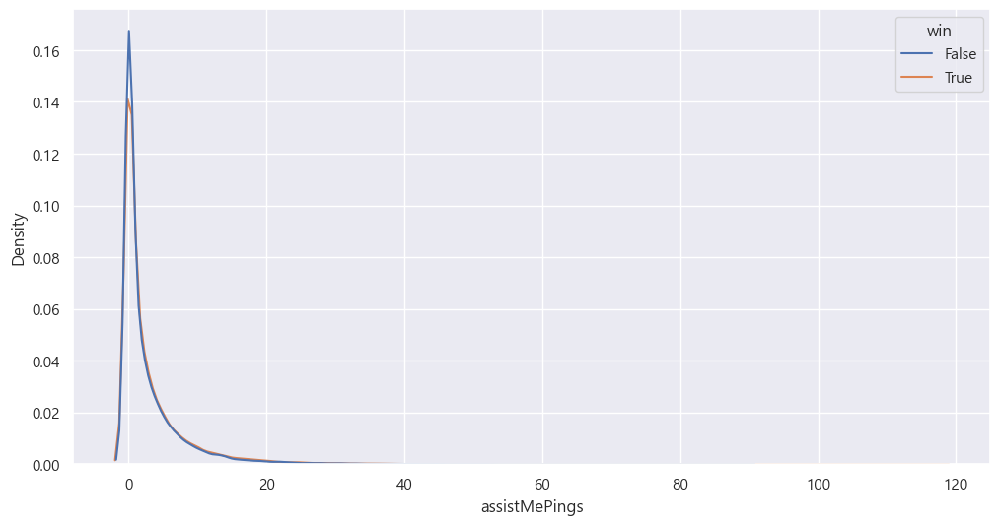

In [101]:
sns.kdeplot(x=iron_ping['assistMePings'],hue=iron_ping['win'])

### 시야 필요함 핑

In [102]:
iron_ping['needVisionPings'].value_counts()

needVisionPings
0      64975
1       7827
2       2305
3       1008
4        513
5        281
6        167
7        104
8         60
9         38
10        32
11        15
12        12
13        10
15         7
18         5
14         5
19         3
16         3
20         2
17         2
24         2
27         1
30         1
101        1
21         1
107        1
37         1
61         1
28         1
40         1
48         1
103        1
59         1
32         1
50         1
Name: count, dtype: int64

<Axes: xlabel='needVisionPings', ylabel='count'>

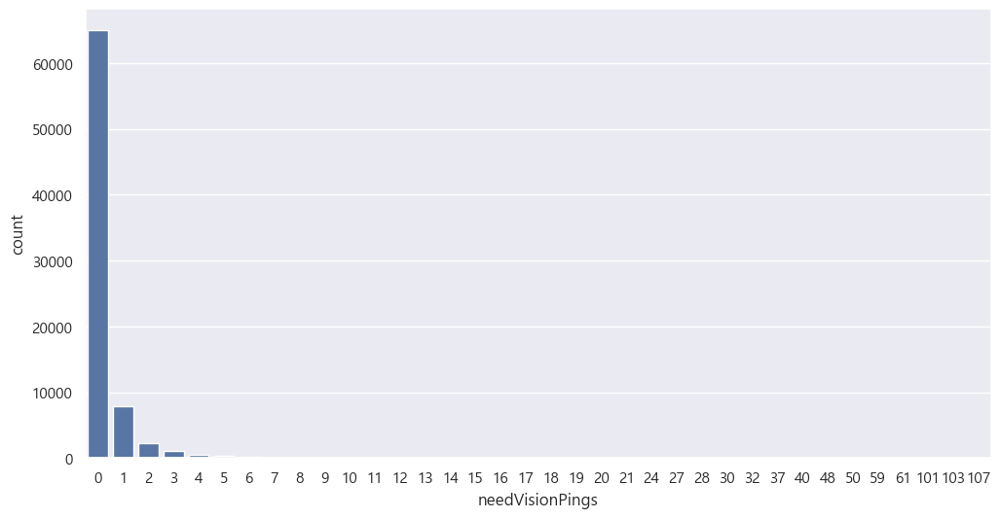

In [103]:
sns.countplot(x=iron_ping['needVisionPings'])

<Axes: xlabel='needVisionPings', ylabel='count'>

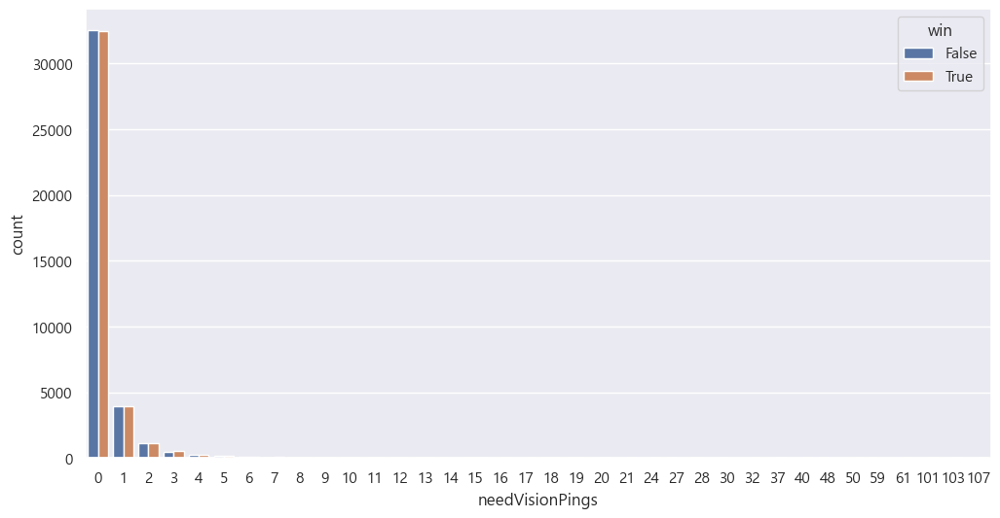

In [104]:
sns.countplot(x=iron_ping['needVisionPings'],hue=iron_ping['win'])

### 미아핑

In [105]:
iron_ping['enemyMissingPings'].value_counts()

enemyMissingPings
0      19103
1       9517
2       7914
3       6836
4       5537
       ...  
63         1
88         1
100        1
95         1
85         1
Name: count, Length: 80, dtype: int64

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

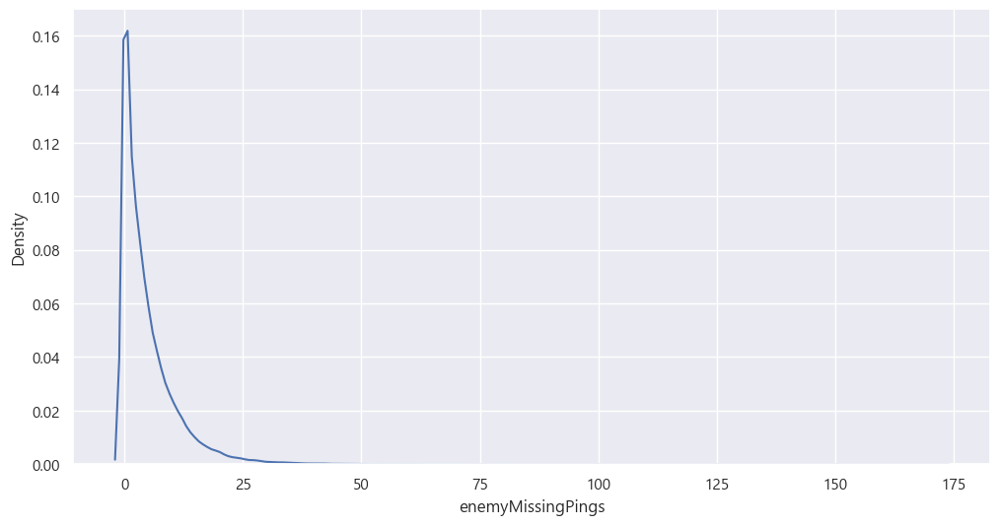

In [106]:
sns.kdeplot(x=iron_ping['enemyMissingPings'])

<Axes: xlabel='enemyMissingPings', ylabel='Density'>

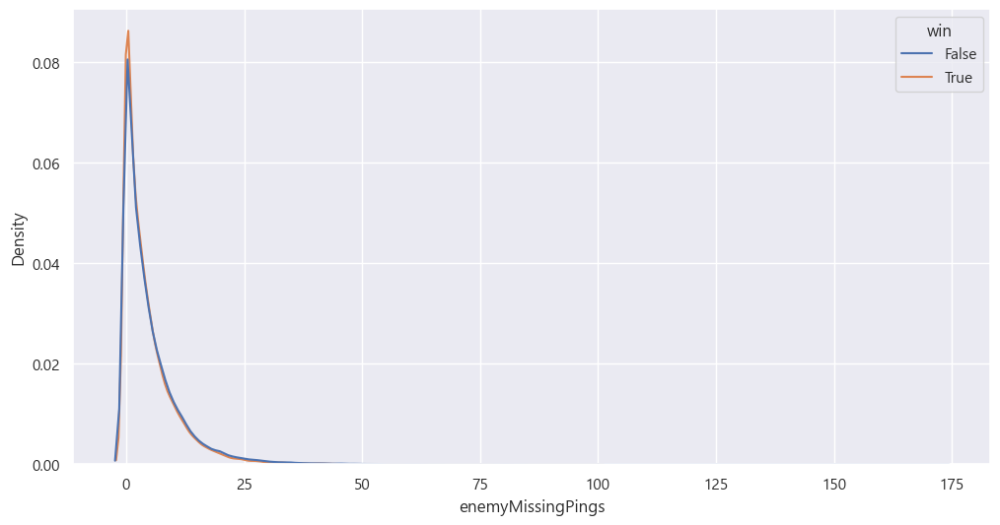

In [107]:
sns.kdeplot(x=iron_ping['enemyMissingPings'],hue = iron_ping['win'])

### 적 와드 / 시야핑

In [108]:
iron_ping['enemyVisionPings'].value_counts()

enemyVisionPings
0      49843
1      10641
2       5325
3       3299
4       2231
5       1609
6       1126
7        871
8        579
9        453
10       325
11       274
12       173
13       148
14        96
15        83
16        64
18        50
17        48
19        42
20        23
21        21
22        14
23        11
25         8
24         8
27         5
28         4
29         3
26         3
30         2
64         1
42         1
51         1
33         1
156        1
36         1
40         1
37         1
Name: count, dtype: int64

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

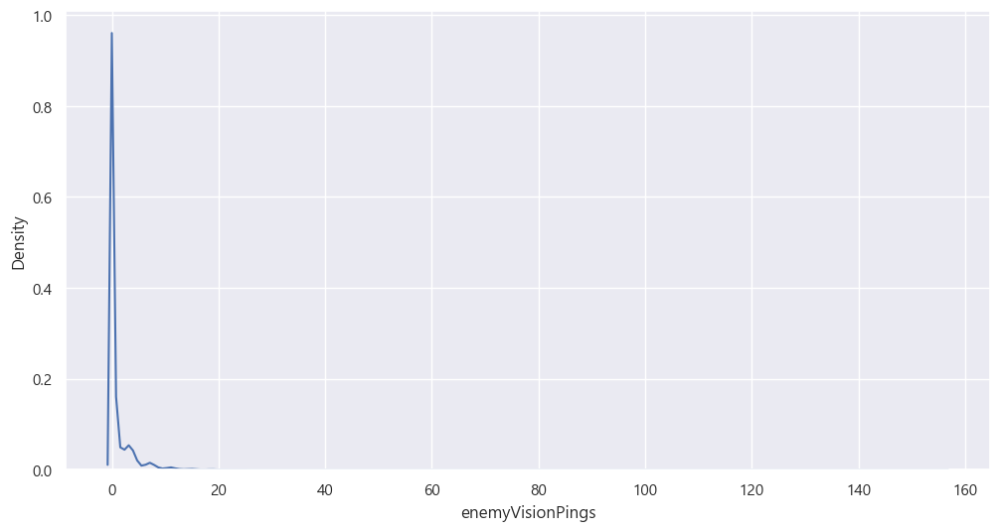

In [109]:
sns.kdeplot(x=iron_ping['enemyVisionPings'])

<Axes: xlabel='enemyVisionPings', ylabel='Density'>

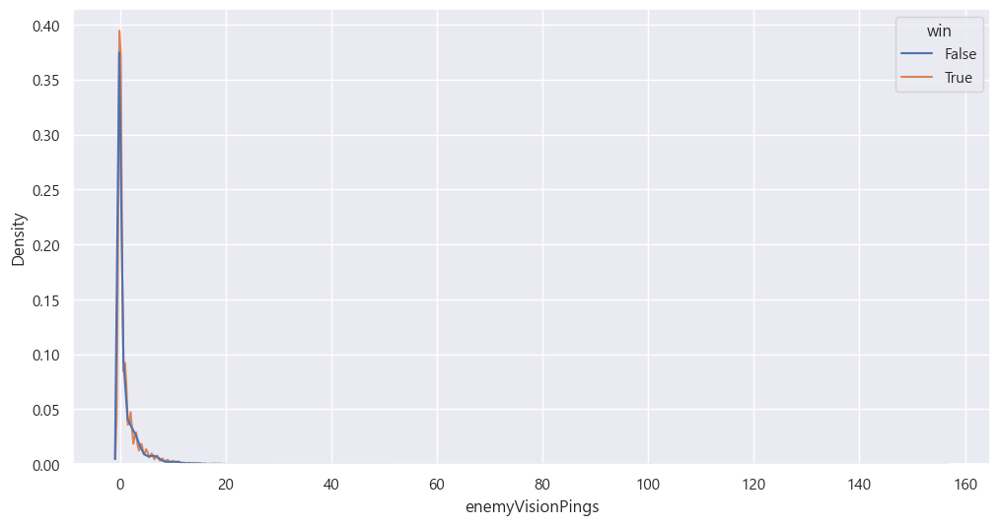

In [110]:
sns.kdeplot(x=iron_ping['enemyVisionPings'],hue=iron_ping['win'])

## 핑과 승패사이의 상관관계를 봐봅시다.

In [111]:
temp=iron_ping['win'].to_list()

In [112]:
temp_list=[]
for i in temp:
    temp_list.append(int(i))

In [113]:
iron_ping['win'] = temp_list

C:\Users\sherm\AppData\Local\Temp\ipykernel_15600\2396651792.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iron_ping['win'] = temp_list


In [115]:
iron_ping

,win,is_Surrender_aft_25m,is_Early_Surrender,commandPings,getBackPings,holdPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings
0,0,True,False,0,3,0,22,0,1,0,4,4
1,0,True,False,0,38,0,15,0,3,0,5,0
2,0,True,False,14,0,0,9,0,2,0,1,0
3,0,True,False,0,0,0,0,0,0,0,10,5
4,0,True,False,4,0,0,0,0,1,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
19995,1,False,False,15,0,0,10,0,8,0,10,0
19996,1,False,False,0,0,0,28,0,0,0,0,0
19997,1,False,False,14,17,0,9,1,12,0,12,1
19998,1,False,False,0,0,0,0,0,13,0,0,0


In [116]:
iron_ping['pings'] = iron_ping['commandPings'] + iron_ping['getBackPings'] + iron_ping['holdPings'] + iron_ping['onMyWayPings'] + iron_ping['allInPings'] + iron_ping['assistMePings'] + iron_ping['needVisionPings'] + iron_ping['enemyMissingPings'] + iron_ping['enemyVisionPings']

C:\Users\sherm\AppData\Local\Temp\ipykernel_15600\993654026.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iron_ping['pings'] = iron_ping['commandPings'] + iron_ping['getBackPings'] + iron_ping['holdPings'] + iron_ping['onMyWayPings'] + iron_ping['allInPings'] + iron_ping['assistMePings'] + iron_ping['needVisionPings'] + iron_ping['enemyMissingPings'] + iron_ping['enemyVisionPings']


In [118]:
iron_test_ping=iron_ping.drop(['is_Surrender_aft_25m','is_Early_Surrender','holdPings'],axis=1)

KeyError: "['is_Surrender_aft_25m', 'is_Early_Surrender', 'holdPings'] not found in axis"

In [120]:
iron_test_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,0,0,3,22,0,1,0,4,4,34
1,0,0,38,15,0,3,0,5,0,61
2,0,14,0,9,0,2,0,1,0,26
3,0,0,0,0,0,0,0,10,5,15
4,0,4,0,0,0,1,0,1,2,8
...,...,...,...,...,...,...,...,...,...,...
19995,1,15,0,10,0,8,0,10,0,43
19996,1,0,0,28,0,0,0,0,0,28
19997,1,14,17,9,1,12,0,12,1,66
19998,1,0,0,0,0,13,0,0,0,13


In [121]:
corr_ping=iron_test_ping.corr()
corr_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
win,1.000000,0.052367,-0.000391,0.084543,0.016287,0.025861,0.006704,-0.030251,0.012004,0.049714
commandPings,0.052367,1.000000,0.236906,0.359655,0.186970,0.333812,0.174519,0.251280,0.122872,0.673583
getBackPings,-0.000391,0.236906,1.000000,0.307263,0.144570,0.308603,0.140625,0.244327,0.127423,0.568707
onMyWayPings,0.084543,0.359655,0.307263,1.000000,0.267135,0.470816,0.186741,0.290150,0.124527,0.778908
allInPings,0.016287,0.186970,0.144570,0.267135,1.000000,0.273488,0.198554,0.134489,0.052910,0.351804
assistMePings,0.025861,0.333812,0.308603,0.470816,0.273488,1.000000,0.228034,0.298943,0.118455,0.679362
needVisionPings,0.006704,0.174519,0.140625,0.186741,0.198554,0.228034,1.000000,0.189010,0.080216,0.322983
enemyMissingPings,-0.030251,0.251280,0.244327,0.290150,0.134489,0.298943,0.189010,1.000000,0.204263,0.597695
enemyVisionPings,0.012004,0.122872,0.127423,0.124527,0.052910,0.118455,0.080216,0.204263,1.000000,0.301073
pings,0.049714,0.673583,0.568707,0.778908,0.351804,0.679362,0.322983,0.597695,0.301073,1.000000


<Axes: >

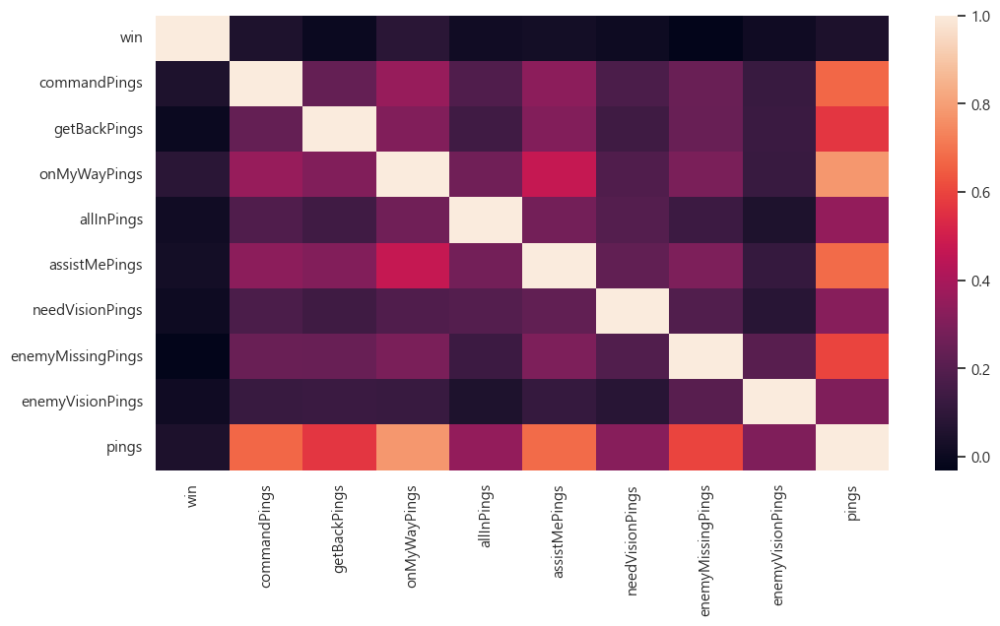

In [122]:
sns.heatmap(corr_ping)

### 먼저 T분포의 가설 확인을 위해 두 분포의 등분산성을 확인

In [123]:
from scipy.stats import levene

stat, p = levene(iron_test_ping['pings'], iron_test_ping['win'])
print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")


Levene’s test: stat = 50919.537, p = 0.0000


### 등분산이 아님이 확인 되었으니 Welch's t-test를 활용해 평균의 차이가 있는지 검정해봅시다.

In [124]:
win_pings=iron_test_ping[iron_test_ping['win'] == 1]['pings']
lose_pings=iron_test_ping[~(iron_test_ping['win'] == 1)]['pings']

In [125]:
import pingouin as pg
pg.ttest(win_pings, lose_pings, correction=True)

,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,13.846819,76988.567672,two-sided,1.499884e-43,"[2.11, 2.81]",0.099549,3.05e+39,1.0


In [126]:
pings=['commandPings','getBackPings','onMyWayPings','allInPings','assistMePings','needVisionPings','enemyMissingPings','enemyVisionPings']
from scipy.stats import levene
import pingouin as pg

for ping in pings:
    print(ping)
    stat, p = levene(iron_test_ping[ping], iron_test_ping['win'])
    print(f"Levene’s test: stat = {stat:.3f}, p = {p:.4f}")
    
    if p <= 0.05: correction_ = True
    else: correction_ = False
    win_pings=iron_test_ping[iron_test_ping['win'] == 1][ping]
    lose_pings=iron_test_ping[~(iron_test_ping['win'] == 1)][ping]
    
    display(pg.ttest(win_pings, lose_pings, correction=True))
    print()

commandPings
Levene’s test: stat = 25740.867, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,14.587741,77028.557224,two-sided,3.897959e-48,"[0.71, 0.93]",0.104876,1.113e+44,1.0



getBackPings
Levene’s test: stat = 16496.512, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-0.108827,77386.970866,two-sided,0.91334,"[-0.08, 0.07]",0.000782,0.008,0.051358



onMyWayPings
Levene’s test: stat = 30284.764, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,23.60333,75613.596528,two-sided,9.926965e-123,"[1.5, 1.77]",0.169692,2.688e+118,NaN



allInPings
Levene’s test: stat = 1448.825, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,4.531517,76965.53717,two-sided,0.000006,"[0.02, 0.06]",0.032579,232.676,0.994937



assistMePings
Levene’s test: stat = 17929.339, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,7.196699,76857.96439,two-sided,6.224889e-13,"[0.19, 0.34]",0.051739,1.412e+09,1.0



needVisionPings
Levene’s test: stat = 1927.066, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,1.864917,70383.680204,two-sided,0.062197,"[-0.0, 0.03]",0.013407,0.046,0.462195



enemyMissingPings
Levene’s test: stat = 35666.579, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,-8.419156,76691.720639,two-sided,3.856402e-17,"[-0.46, -0.29]",0.060528,1.954e+13,NaN



enemyVisionPings
Levene’s test: stat = 5049.704, p = 0.0000


,T,dof,alternative,p-val,CI95%,cohen-d,BF10,power
T-test,3.339532,77307.748447,two-sided,0.00084,"[0.03, 0.1]",0.024009,2.139,0.916134


In [127]:
iron_test_ping

,win,commandPings,getBackPings,onMyWayPings,allInPings,assistMePings,needVisionPings,enemyMissingPings,enemyVisionPings,pings
0,0,0,3,22,0,1,0,4,4,34
1,0,0,38,15,0,3,0,5,0,61
2,0,14,0,9,0,2,0,1,0,26
3,0,0,0,0,0,0,0,10,5,15
4,0,4,0,0,0,1,0,1,2,8
...,...,...,...,...,...,...,...,...,...,...
19995,1,15,0,10,0,8,0,10,0,43
19996,1,0,0,28,0,0,0,0,0,28
19997,1,14,17,9,1,12,0,12,1,66
19998,1,0,0,0,0,13,0,0,0,13


## 이제 그럼 각 변수의 영향력을 선형적으로 확인해봅시다.

In [128]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import pandas as pd

X = iron_test_ping.drop(['win','pings'],axis=1)
X = add_constant(X)
vif = pd.DataFrame()
vif['variable'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]


In [129]:
vif.sort_values(by='VIF',ascending=False)

,variable,VIF
0,const,2.042103
5,assistMePings,1.453095
3,onMyWayPings,1.452401
1,commandPings,1.239635
7,enemyMissingPings,1.211027
2,getBackPings,1.186042
4,allInPings,1.134655
6,needVisionPings,1.103771
8,enemyVisionPings,1.056758


In [130]:
import statsmodels.api as sm

# 1. X, y 분리
X = iron_test_ping.drop(['win','pings'],axis=1)
y = iron_test_ping['win']

# 2. 모델 적합
logit_model = sm.Logit(y, X)
result = logit_model.fit()

# 3. 요약 출력
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.687144
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                    win   No. Observations:                77390
Model:                          Logit   Df Residuals:                    77382
Method:                           MLE   Df Model:                            7
Date:                Tue, 29 Jul 2025   Pseudo R-squ.:                0.008661
Time:                        15:29:10   Log-Likelihood:                -53178.
converged:                       True   LL-Null:                       -53643.
Covariance Type:            nonrobust   LLR p-value:                2.425e-196
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
commandPings          0.0092      0.001      8.964      0.000       0.007       0.011
getBackP

In [132]:
np.exp(0.0206)

np.float64(1.020813644503746)